In [1]:
from stable_baselines.common.policies import MlpPolicy
from stable_baselines.common import make_vec_env
from stable_baselines import A2C
from stable_baselines.common.env_checker import check_env

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.



defaultdict(<class 'list'>, {0: [2, 1], 1: [2], 2: [3, 4], 3: [4]})


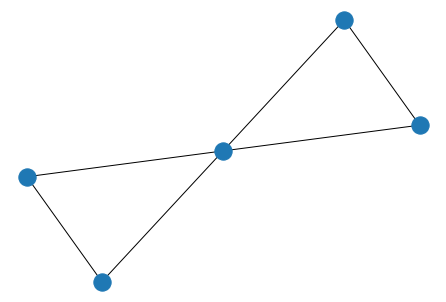

In [2]:
import gym
import w_mac
from collections import defaultdict
import matplotlib as plt
import networkx as nx

data = [(0,2),(0,1),(1,2),(2,3),(2,4),(3,4)]
d = defaultdict(list)

# defaultdict(<type 'list'>, {})
for node, dest in data:
    d[node].append(dest)
print(d)

G = nx.Graph()
for k,v in d.items():
    for vv in v:
        G.add_edge(k,vv)
nx.draw(G)

Intermediate node 2
Intermediate node 2
0 2
[0, 2]
0 1
[0, 2, 0, 1]
{0: [0, 2, 0, 1]}
{0: [0, 2, 0, 1]}
2 0
[2, 0]
2 1
[2, 0, 2, 1]
2 3
[2, 0, 2, 1, 2, 3]
2 4
[2, 0, 2, 1, 2, 3, 2, 4]
{0: [0, 2, 0, 1], 2: [2, 0, 2, 1, 2, 3, 2, 4]}
{0: [0, 2, 0, 1], 2: [2, 0, 2, 1, 2, 3, 2, 4]}
1 0
[1, 0]
1 2
[1, 0, 1, 2]
{0: [0, 2, 0, 1], 2: [2, 0, 2, 1, 2, 3, 2, 4], 1: [1, 0, 1, 2]}
{0: [0, 2, 0, 1], 2: [2, 0, 2, 1, 2, 3, 2, 4], 1: [1, 0, 1, 2]}
3 2
[3, 2]
3 4
[3, 2, 3, 4]
{0: [0, 2, 0, 1], 2: [2, 0, 2, 1, 2, 3, 2, 4], 1: [1, 0, 1, 2], 3: [3, 2, 3, 4]}
{0: [0, 2, 0, 1], 2: [2, 0, 2, 1, 2, 3, 2, 4], 1: [1, 0, 1, 2], 3: [3, 2, 3, 4]}
4 2
[4, 2]
4 3
[4, 2, 4, 3]
{0: [0, 2, 0, 1], 2: [2, 0, 2, 1, 2, 3, 2, 4], 1: [1, 0, 1, 2], 3: [3, 2, 3, 4], 4: [4, 2, 4, 3]}
{0: [0, 2, 0, 1], 2: [2, 0, 2, 1, 2, 3, 2, 4], 1: [1, 0, 1, 2], 3: [3, 2, 3, 4], 4: [4, 2, 4, 3]}
{0: [0, 2, 0, 1], 1: [1, 0, 1, 2], 3: [3, 2, 3, 4], 4: [4, 2, 4, 3]}
{0: {0, 1, 2}, 1: {0, 1, 2}, 3: {2, 3, 4}, 4: {2, 3, 4}}
{1: [0, 1, 2], 4: [2, 3, 4

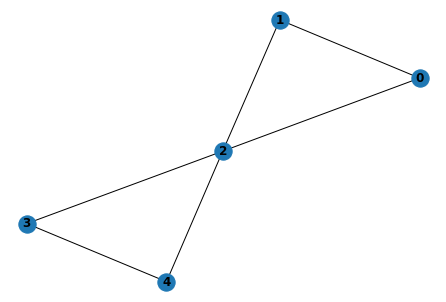

In [3]:
env = gym.make('wmac-graph-v0',graph=G)

In [4]:
check_env(env)

2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
2

In [6]:
model = A2C(MlpPolicy, env, verbose=1,tensorboard_log="./diffrange_tensorboard")
model.learn(total_timesteps=50000)
model.save("a2c_wmac")

Wrapping the env in a DummyVecEnv.
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop

nxt_state_arr, reward, isdone [999   3 999 999 999   0   0   3   4   1] -1700 False
received action [1 1 0 0 1]
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
final reward -3000
packets delivered  8
packet_lost  34
nxt_state_arr, reward, isdone [999   3 999 999 999   1   1   0   0   2] -3000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  8
packet_lost  34
nxt_state_arr, reward, isdone [999   3 999 999 999   0   0   0   1   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  8
packet_lost  34
nxt_state_arr, reward, isdone [999   3 999 999 999   0   0   0   0   0] -1000 False
received action [1 1 0 0 1]
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
final reward -3000
packets delivered  8
packet_lost  34
nxt_state_arr, reward, isdone [999   3 999 999 999   1   1   0   0   1] -3000 False
received action [0 1 1 1 0]
Action taken on empty qu

received action [1 1 0 1 0]
node  0  transmission collision
node  1  transmission collision
node  3  transmission SUCCESS
Packet reached destination
id : 1 wait counter reward : -400
final reward -1400
packets delivered  1
packet_lost  9
nxt_state_arr, reward, isdone [2 3 2 4 2 1 4 0 2 0] -1400 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  9
nxt_state_arr, reward, isdone [2 4 2 4 2 0 0 1 0 0] 1000 False
received action [1 1 1 0 0]
node  0  transmission collision
node  1  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward -1000
packets delivered  3
packet_lost  11
nxt_state_arr, reward, isdone [2 3 2 4 2 1 1 2 0 0] -1000 False
received action [0 1 0 1 1]
node  1  transmission collision because of hidden terminal problem
node  3  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  3
packet_lost  14
nxt_state_ar

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  9
packet_lost  31
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   2   0   0] -1000 False
received action [1 1 0 0 1]
Action taken on empty queue
Action taken on empty queue
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward -1000
packets delivered  10
packet_lost  31
nxt_state_arr, reward, isdone [999   0 999 999 999   1   1   0   0   1] -1000 False
received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  11
packet_lost  31
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   1   1   0] 0 True
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1

packets delivered  3
packet_lost  15
nxt_state_arr, reward, isdone [ 1  3  0  4  3  1 12  0  0  1] -2200 False
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  3
packet_lost  17
nxt_state_arr, reward, isdone [1 3 0 2 2 0 0 0 1 2] -2000 False
received action [1 0 1 1 1]
node  0  transmission collision
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
id : 4 wait counter reward : -300
final reward -4300
packets delivered  3
packet_lost  21
nxt_state_arr, reward, isdone [2 0 0 2 2 1 0 1 2 3] -4300 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  4
packet_lost  21
nxt_state_arr, reward, isdone [2 0 0 2 2 2 0 0 0 0] 1000 False
received action [1 0 0 1 1]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision
node  4  transmission collision

received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -400
final reward -2400
packets delivered  8
packet_lost  24
nxt_state_arr, reward, isdone [999   0   2 999 999   4   0   0   2   0] -2400 False
received action [1 0 1 1 1]
Action taken on empty queue
node  2  transmission collision
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -500
id : 3 wait counter reward : -300
final reward -4800
packets delivered  8
packet_lost  25
nxt_state_arr, reward, isdone [999   4   2 999 999   5   0   1   3   1] -4800 False
received action [0 1 1 1 0]
node  1  transmission collision
node  2  transmission collision
Action taken on empty queue
id : 3 wait counter reward : -400
final reward -3400
packets delivered  8
packet_lost  27
nxt_state_arr, reward, isdone [999   0   2 999 999   0   1   2   4   0] -3400 False
received action [0 0 0 1 1]
Action taken on empty queue
Action taken on empty queue
id : 3 wait 

received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  3
packet_lost  3
nxt_state_arr, reward, isdone [1 0 2 2 2 1 0 0 1 0] 2000 False
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  3
packet_lost  5
nxt_state_arr, reward, isdone [1 0 2 4 2 0 0 0 2 1] -2000 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  3
packet_lost  7
nxt_state_arr, reward, isdone [1 3 2 4 2 0 1 1 0 0] -2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  7
nxt_state_arr, reward, isdone [1 0 2 4 2 0 0 2 0 0] 1000 False
received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmission coll

received action [0 0 1 1 0]
Action taken on empty queue
node  3  transmission collision
final reward -2000
packets delivered  4
packet_lost  30
nxt_state_arr, reward, isdone [  1 999   2 999   2   0   0   1   1   0] -2000 False
received action [0 1 0 1 1]
node  1  transmission collision because of hidden terminal problem
Action taken on empty queue
node  4  transmission collision
final reward -3000
packets delivered  4
packet_lost  32
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   1   0   2   1] -3000 False
received action [0 1 0 1 1]
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
id : 3 wait counter reward : -300
final reward -3300
packets delivered  4
packet_lost  32
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   2   0   3   2] -3300 False
received action [0 1 1 0 0]
Action taken on empty queue
Action taken on empty queue
id : 1 wait counter reward : -300
final reward -2300
packets delivered  4
packet_lost  32
nxt_state_arr, re

received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
id : 1 wait counter reward : -400
final reward -2400
packets delivered  0
packet_lost  6
nxt_state_arr, reward, isdone [2 1 2 0 3 1 4 0 0 0] -2400 False
received action [0 1 1 1 1]
node  1  transmission collision
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
id : 1 wait counter reward : -500
final reward -4500
packets delivered  0
packet_lost  10
nxt_state_arr, reward, isdone [2 4 2 1 2 0 5 1 1 1] -4500 False
received action [1 1 1 1 0]
node  0  transmission collision
node  1  transmission collision
node  2  transmission collision
node  3  transmission collision
id : 1 wait counter reward : -600
final reward -4600
packets delivered  0
packet_lost  14
nxt_state_arr, reward, isdone [2 1 2 4 2 1 6 2 2 0] -4600 False
received action [0 0 0 0 0]
final reward 0
packets delivered  0
packet_lost  14
nxt_state_arr, reward, isdone [2 1 2 4 2 0 0 0 0 0] -10

node  3  transmission collision
node  4  transmission collision
id : 2 wait counter reward : -400
final reward -5400
packets delivered  5
packet_lost  28
nxt_state_arr, reward, isdone [  2 999   2   4 999   1   1   4   1   1] -5400 False
received action [0 0 1 1 0]
Action taken on empty queue
node  3  transmission collision
id : 2 wait counter reward : -500
final reward -2500
packets delivered  5
packet_lost  29
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   5   2   0] -2500 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
id : 3 wait counter reward : -300
final reward 700
packets delivered  6
packet_lost  29
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   0   3   0] 700 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
id : 3 wait counter reward : -400
final reward 600
packets delivered  7
packet_lost  29
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   0   4   0] 

received action [0 1 1 1 1]
node  1  transmission collision
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
final reward -4000
packets delivered  1
packet_lost  11
nxt_state_arr, reward, isdone [1 4 2 2 2 0 2 1 1 1] -4000 False
received action [0 0 1 1 0]
node  2  transmission collision
node  3  transmission collision
final reward -2000
packets delivered  1
packet_lost  13
nxt_state_arr, reward, isdone [1 1 2 4 2 0 0 2 2 0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  1
packet_lost  13
nxt_state_arr, reward, isdone [1 1 2 4 2 0 0 0 0 0] -1000 False
received action [0 1 0 0 1]
node  1  transmission collision because of hidden terminal problem
node  4  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  1
packet_lost  15
nxt_state_arr, reward, isdone [1 1 2 4 2 0 1 0 0 1] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  1
packet_lost  15
nxt_st

received action [0 1 1 1 0]
node  1  transmission collision
node  2  transmission collision
Action taken on empty queue
id : 1 wait counter reward : -300
id : 3 wait counter reward : -400
final reward -3700
packets delivered  9
packet_lost  31
nxt_state_arr, reward, isdone [999   3 999 999   2   0   3   1   4   0] -3700 False
received action [1 1 1 1 0]
Action taken on empty queue
Action taken on empty queue
node  2  transmission collision
Action taken on empty queue
id : 1 wait counter reward : -400
id : 3 wait counter reward : -500
final reward -4900
packets delivered  9
packet_lost  32
nxt_state_arr, reward, isdone [999 999 999 999   2   1   4   2   5   0] -4900 False
received action [0 1 0 1 0]
Action taken on empty queue
Action taken on empty queue
id : 1 wait counter reward : -500
id : 3 wait counter reward : -600
final reward -3100
packets delivered  9
packet_lost  32
nxt_state_arr, reward, isdone [999 999 999 999   2   0   5   0   6   0] -3100 False
received action [1 0 0 1 0]


received action [1 1 1 0 0]
node  0  transmission collision
node  1  transmission collision
node  2  transmission collision
id : 0 wait counter reward : -300
final reward -3300
packets delivered  1
packet_lost  3
nxt_state_arr, reward, isdone [2 4 2 4 2 3 1 1 0 0] -3300 False
received action [0 0 1 1 1]
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  1
packet_lost  6
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 2 1 1] -3000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  1
packet_lost  6
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  1
packet_lost  6
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 0 0 0] -1000 False
received action [1 1 1 1 1]
node  0  transmission collision
node  1  transmission collision
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
final 

received action [1 1 1 1 1]
node  0  transmission collision
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
final reward -5000
packets delivered  7
packet_lost  34
nxt_state_arr, reward, isdone [  1 999 999 999 999   1   2   1   1   2] -5000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  7
packet_lost  34
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   0   2   0] -1000 False
received action [0 1 0 1 1]
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
id : 3 wait counter reward : -300
final reward -3300
packets delivered  7
packet_lost  34
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   1   0   3   1] -3300 False
received action [0 0 0 1 1]
Action taken on empty queue
Action taken on empty queue
id : 3 wait counter reward : -400
final reward -2400
packets delivered  7
packet_lost  34
nxt_state_arr, reward, isdone [ 

node  3  transmission collision
node  4  transmission collision
id : 1 wait counter reward : -700
id : 4 wait counter reward : -300
final reward -5000
packets delivered  6
packet_lost  29
nxt_state_arr, reward, isdone [  1   1 999   0   2   0   7   1   2   3] -5000 False
received action [0 1 1 1 0]
Action taken on empty queue
node  2  transmission collision
node  3  transmission collision
id : 1 wait counter reward : -800
id : 3 wait counter reward : -300
final reward -4100
packets delivered  6
packet_lost  31
nxt_state_arr, reward, isdone [  1   3 999   0   2   0   8   2   3   0] -4100 False
received action [1 1 1 1 1]
node  0  transmission collision
Action taken on empty queue
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
id : 1 wait counter reward : -900
id : 2 wait counter reward : -300
id : 3 wait counter reward : -400
final reward -6600
packets delivered  6
packet_lost  35
nxt_state_arr, reward, isdone [999   4 999 999 999   1   9

nxt_state_arr, reward, isdone [1 3 0 1 2 0 1 0 0 4] 1600 False
received action [1 1 1 1 1]
node  0  transmission collision
node  1  transmission collision
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
id : 4 wait counter reward : -500
final reward -5500
packets delivered  5
packet_lost  15
nxt_state_arr, reward, isdone [2 3 2 1 3 1 2 1 1 5] -5500 False
received action [0 1 1 1 1]
node  1  transmission collision
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
id : 1 wait counter reward : -300
id : 4 wait counter reward : -600
final reward -4900
packets delivered  5
packet_lost  19
nxt_state_arr, reward, isdone [2 0 2 1 2 0 3 2 2 6] -4900 False
received action [1 1 1 1 0]
node  0  transmission collision
node  1  transmission collision
node  2  transmission collision
node  3  transmission collision
id : 1 wait counter reward : -400
id : 2 wait counter reward : -300
id : 3 wait counter reward 

id : 3 wait counter reward : -300
final reward 1700
packets delivered  2
packet_lost  3
nxt_state_arr, reward, isdone [2 3 2 2 2 0 2 0 3 0] 1700 False
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
id : 3 wait counter reward : -400
final reward -2400
packets delivered  2
packet_lost  5
nxt_state_arr, reward, isdone [2 3 2 4 3 0 0 0 4 1] -2400 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
id : 3 wait counter reward : -500
final reward 1500
packets delivered  4
packet_lost  5
nxt_state_arr, reward, isdone [2 3 2 2 3 1 0 0 5 0] 1500 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  5
packet_lost  6
nxt_state_arr, reward, isdone [2 1 2 2 3 0 1 1 0 0] 0 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden

Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
id : 1 wait counter reward : -500
final reward -3500
packets delivered  6
packet_lost  30
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   5   1   0   2] -3500 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  6
packet_lost  32
nxt_state_arr, reward, isdone [  2 999 999   2 999   1   0   0   1   0] -2000 False
received action [1 1 0 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  6
packet_lost  33
nxt_state_arr, reward, isdone [  2 999 999   2 999   2   1   0   0   0] -2000 False
received action [1 0 0 0 1]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -300
packets delivered  7
packet_lost  33
nxt_state_

node  0  transmission collision
node  2  transmission collision
node  3  transmission collision
id : 0 wait counter reward : -300
final reward -3300
packets delivered  3
packet_lost  5
nxt_state_arr, reward, isdone [2 3 2 2 2 3 0 1 1 0] -3300 False
received action [1 1 1 0 1]
node  0  transmission collision
node  1  transmission collision
node  2  transmission collision
node  4  transmission collision
id : 0 wait counter reward : -400
final reward -4400
packets delivered  3
packet_lost  9
nxt_state_arr, reward, isdone [2 3 0 2 2 4 1 2 0 1] -4400 False
received action [0 1 0 1 1]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission collision
node  4  transmission collision
final reward -1000
packets delivered  4
packet_lost  11
nxt_state_arr, reward, isdone [2 3 2 2 3 0 2 0 1 2] -1000 False
received action [1 0 1 0 1]
node  0  transmission collision
node  2  transmission collision
node  4  transmission collision
id : 4 wait counter reward : -300
final reward -3

received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  6
packet_lost  31
nxt_state_arr, reward, isdone [999   4   2 999 999   0   1   0   1   0] 0 False
received action [1 0 1 1 0]
Action taken on empty queue
node  2  transmission collision
Action taken on empty queue
final reward -3000
packets delivered  6
packet_lost  32
nxt_state_arr, reward, isdone [999 999   2 999 999   1   0   1   2   0] -3000 False
received action [1 1 1 1 0]
Action taken on empty queue
node  1  transmission collision
Action taken on empty queue
Action taken on empty queue
id : 3 wait counter reward : -300
final reward -4300
packets delivered  6
packet_lost  33
nxt_state_arr, reward, isdone [999 999   2 999 999   2   1   2   3   0] -4300 False
received action [1 0 1 1 1]
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -300
id : 2 

received action [0 1 0 1 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission collision
node  4  transmission collision
id : 1 wait counter reward : -500
id : 3 wait counter reward : -300
final reward -1800
packets delivered  2
packet_lost  18
nxt_state_arr, reward, isdone [2 3 0 0 2 0 5 0 3 2] -1800 False
received action [0 0 1 1 1]
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
id : 3 wait counter reward : -400
id : 4 wait counter reward : -300
final reward -3700
packets delivered  2
packet_lost  21
nxt_state_arr, reward, isdone [2 3 0 4 2 0 0 1 4 3] -3700 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  21
nxt_state_arr, reward, isdone [2 3 2 4 2 0 1 0 0 0] 1000 False
received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
final reward -2000
packets delivered  3
packet_los

packets delivered  5
packet_lost  36
nxt_state_arr, reward, isdone [999   4 999 999 999   0   1   1   0   0] -2000 False
received action [0 1 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  5
packet_lost  36
nxt_state_arr, reward, isdone [999   4 999 999 999   0   2   0   1   0] -2000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  5
packet_lost  36
nxt_state_arr, reward, isdone [999   4 999 999 999   0   0   0   0   1] -1000 False
received action [1 1 1 1 0]
Action taken on empty queue
Action taken on empty queue
node  2  transmission collision
Action taken on empty queue
final reward -4000
packets delivered  5
packet_lost  37
nxt_state_arr, reward, isdone [999 999 999 999 999   1   1   1   1   0] -4000 True
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
1. src,dest,ne

received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  4
packet_lost  24
nxt_state_arr, reward, isdone [  2   3   2 999   2   0   2   0   0   1] 2000 False
received action [0 0 0 1 1]
Action taken on empty queue
node  4  transmission collision
final reward -2000
packets delivered  4
packet_lost  25
nxt_state_arr, reward, isdone [  2   3   2 999   3   0   0   0   1   2] -2000 False
received action [0 1 1 1 1]
node  1  transmission collision
node  2  transmission collision
Action taken on empty queue
node  4  transmission collision
id : 4 wait counter reward : -300
final reward -4300
packets delivered  4
packet_lost  28
nxt_state_arr, reward, isdone [  2   3 999 999 999   0   1   1   2   3] -4300 False
received action [1 1 0 1 0]
node  0  transmission collision
Action taken on empty queue
Action taken on empty queue
id : 3 wait counter reward : -300
final rewa

packet_lost  32
nxt_state_arr, reward, isdone [999   0 999 999 999   8   0   0   0   0] -1800 False
received action [1 0 0 0 1]
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -900
final reward -2900
packets delivered  7
packet_lost  32
nxt_state_arr, reward, isdone [999   0 999 999 999   9   0   0   0   1] -2900 False
received action [0 0 0 1 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  7
packet_lost  32
nxt_state_arr, reward, isdone [999   0 999 999 999   0   0   0   1   2] -2000 False
received action [0 0 1 1 1]
node  2  transmission SUCCESS
Packet reached destination
Action taken on empty queue
Action taken on empty queue
id : 4 wait counter reward : -300
final reward -1300
packets delivered  8
packet_lost  32
nxt_state_arr, reward, isdone [999   3 999 999 999   0   0   1   2   3] -1300 False
received action [1 1 1 0 0]
Action taken on empty queue
Action taken on empty queue
node  2  transmissi

received action [0 1 0 0 1]
node  1  transmission collision because of hidden terminal problem
node  4  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  4
packet_lost  17
nxt_state_arr, reward, isdone [2 4 2 2 2 0 1 0 0 1] -2000 False
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  4
packet_lost  19
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 0 1 2] -2000 False
received action [0 1 1 1 1]
node  1  transmission collision
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
id : 4 wait counter reward : -300
final reward -4300
packets delivered  4
packet_lost  23
nxt_state_arr, reward, isdone [  2   3   2 999   2   0   1   1   2   3] -4300 False
received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
final reward -2000
packets delivered  4
packet_lost  25
nxt_state_arr, reward, isdon

packets delivered  9
packet_lost  30
nxt_state_arr, reward, isdone [999   4 999 999 999   1   1   0   2   0] -3000 False
received action [0 1 0 1 0]
Action taken on empty queue
Action taken on empty queue
id : 3 wait counter reward : -300
final reward -2300
packets delivered  9
packet_lost  30
nxt_state_arr, reward, isdone [999   4 999 999 999   0   2   0   3   0] -2300 False
received action [0 0 0 0 0]
final reward 0
packets delivered  9
packet_lost  30
nxt_state_arr, reward, isdone [999   4 999 999 999   0   0   0   0   0] -1000 False
received action [1 0 1 1 0]
Action taken on empty queue
node  2  transmission collision
Action taken on empty queue
final reward -3000
packets delivered  9
packet_lost  31
nxt_state_arr, reward, isdone [999   3 999 999 999   1   0   1   1   0] -3000 False
received action [1 1 1 0 1]
Action taken on empty queue
Action taken on empty queue
node  2  transmission collision
Action taken on empty queue
final reward -4000
packets delivered  9
packet_lost  32
n

received action [0 0 1 1 1]
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
id : 3 wait counter reward : -300
final reward -3300
packets delivered  0
packet_lost  3
nxt_state_arr, reward, isdone [1 0 2 2 2 0 0 1 3 2] -3300 False
received action [0 1 0 1 1]
node  1  transmission collision because of hidden terminal problem
node  3  transmission collision
node  4  transmission collision
id : 3 wait counter reward : -400
id : 4 wait counter reward : -300
final reward -3700
packets delivered  0
packet_lost  6
nxt_state_arr, reward, isdone [1 0 0 4 2 0 1 0 4 3] -3700 False
received action [0 1 1 0 1]
node  1  transmission collision
node  2  transmission collision
node  4  transmission collision
id : 4 wait counter reward : -400
final reward -3400
packets delivered  0
packet_lost  9
nxt_state_arr, reward, isdone [1 1 2 4 3 0 2 1 0 4] -3400 False
received action [0 0 1 1 1]
node  2  transmission SUCCESS
Packet reached destination
node  3  transm

nxt_state_arr, reward, isdone [999   0 999   2 999   2   0   0   0   0] -1000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  7
packet_lost  29
nxt_state_arr, reward, isdone [999   0 999   2 999   0   0   0   0   1] -1000 False
received action [1 0 0 0 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  7
packet_lost  29
nxt_state_arr, reward, isdone [999   0 999   2 999   1   0   0   0   2] -2000 False
received action [1 0 1 1 0]
Action taken on empty queue
node  2  transmission collision
node  3  transmission collision
final reward -3000
packets delivered  7
packet_lost  31
nxt_state_arr, reward, isdone [999   0 999   2 999   2   0   1   1   0] -3000 False
received action [1 0 0 0 1]
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -2300
packets delivered  7
packet_lost  31
nxt_state_arr, reward, isdone [999   0 999   2 999   3   0   0

final reward 1000
packets delivered  2
packet_lost  10
nxt_state_arr, reward, isdone [2 4 0 0 0 0 0 0 0 1] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  10
nxt_state_arr, reward, isdone [2 4 0 0 2 0 0 0 0 2] 1000 False
received action [0 0 1 1 1]
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
id : 4 wait counter reward : -300
final reward -3300
packets delivered  3
packet_lost  13
nxt_state_arr, reward, isdone [2 3 0 2 0 0 0 1 1 3] -3300 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  13
nxt_state_arr, reward, isdone [2 0 0 2 0 0 0 2 0 0] 1000 False
received action [0 1 1 1 1]
node  1  transmission collision
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
id : 2 wait counter reward : -300
final re

id : 1 wait counter reward : -300
final reward -2300
packets delivered  2
packet_lost  36
nxt_state_arr, reward, isdone [999 999 999   2 999   0   3   2   0   0] -2300 False
received action [0 0 0 1 1]
node  3  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  2
packet_lost  37
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   1   1] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  2
packet_lost  37
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [1 1 1 0 1]
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
final reward -4000
packets delivered  2
packet_lost  37
nxt_state_arr, reward, isdone [999 999 999   2 999   1   1   1   0   1] -4000 False
received action [1 0 1 1 1]
Action taken on empty queue
Action taken on empty queue
node  3  transmission collision
Action taken on empty queue
final rewa

packets delivered  4
packet_lost  11
nxt_state_arr, reward, isdone [2 0 0 2 2 0 0 2 1 3] -1300 False
received action [1 0 1 1 0]
node  0  transmission collision
node  2  transmission collision
node  3  transmission collision
id : 2 wait counter reward : -300
final reward -3300
packets delivered  4
packet_lost  14
nxt_state_arr, reward, isdone [2 4 0 2 2 1 0 3 2 0] -3300 False
received action [1 0 1 1 1]
node  0  transmission collision
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
id : 2 wait counter reward : -400
id : 3 wait counter reward : -300
final reward -4700
packets delivered  4
packet_lost  18
nxt_state_arr, reward, isdone [1 0 0 2 2 2 0 4 3 1] -4700 False
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
id : 3 wait counter reward : -400
final reward -2400
packets delivered  4
packet_lost  20
nxt_state_arr, reward, isdone [1 0 0 2 2 0 0 0 4 2] -2400 False
received action [0 1 1 1 0]
nod

1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 4 4
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
[2, 4, 0, 0, 2, 1, 0, 1, 0, 1]
received action [1 0 0 1 1]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  0
packet_lost  3
nxt_state_arr, reward, isdone [2 4 0 1 2 2 0 0 1 2] -3000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  2
packet_lost  3
nxt_state_arr, reward, isdone [2 4 2 2 2 0 1 0 2 0] 2000 False
received action [0 0 1 0 1]
node  2  transmission collision
node  4  transmission collision
final reward -20

node  1  transmission collision because of hidden terminal problem
node  3  transmission collision
node  4  transmission collision
id : 3 wait counter reward : -400
final reward -3400
packets delivered  5
packet_lost  24
nxt_state_arr, reward, isdone [1 4 2 2 2 0 1 0 4 1] -3400 False
received action [0 1 0 0 1]
node  1  transmission collision because of hidden terminal problem
node  4  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  6
packet_lost  25
nxt_state_arr, reward, isdone [  1   4 999   2 999   0   2   0   0   2] 0 False
received action [1 0 0 0 1]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
id : 4 wait counter reward : -300
final reward -300
packets delivered  7
packet_lost  25
nxt_state_arr, reward, isdone [  2   4 999   2 999   1   0   0   0   3] -300 False
received action [1 1 1 1 1]
node  0  transmission collision
Action taken on empty queue
node  2  transmission collision
node  3  transmission coll

2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
[2, 1, 2, 0, 2, 0, 0, 2, 2, 1]
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
id : 2 wait counter reward : -300
final reward 700
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 0 2 0 0 3 0 0] 700 False
received action [1 0 1 1 0]
node  0  transmission collision
node  2  transmission collision
node  3  transmission collision
id : 2 wait counter reward : -400
final reward -3400
packets delivered  1
packet_lost  3
nxt_state_arr, reward, isdone [1 1 2 1 2 1 0 4 1 0] -3400 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  3
packet_lost  3
nxt_state_arr, reward, isdone [1 1 0 2 2 0 1 0 2 0] 2000 False
received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet reached destination
node  4  transmission colli

received action [1 1 0 1 1]
node  0  transmission collision
node  1  transmission collision
node  3  transmission collision
node  4  transmission collision
id : 3 wait counter reward : -300
final reward -4300
packets delivered  4
packet_lost  19
nxt_state_arr, reward, isdone [2 0 2 2 2 1 1 0 3 2] -4300 False
received action [0 0 1 1 1]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmission collision
node  4  transmission collision
id : 3 wait counter reward : -400
id : 4 wait counter reward : -300
final reward -1700
packets delivered  5
packet_lost  21
nxt_state_arr, reward, isdone [2 1 2 4 3 0 0 1 4 3] -1700 False
received action [0 1 1 0 1]
node  1  transmission collision
node  2  transmission collision
node  4  transmission collision
id : 4 wait counter reward : -400
final reward -3400
packets delivered  5
packet_lost  24
nxt_state_arr, reward, isdone [2 1 2 4 2 0 1 2 0 4] -3400 False
received action [1 0 1 0 1]
node  0  transmission collision
node  2  transm

1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 1 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
[2, 0, 2, 4, 2, 3, 2, 1, 1, 2]
received action [1 1 0 0 1]
node  0  transmission collision
node  1  transmission collision
node  4  transmission collision because of hidden terminal problem
id : 0 wait counter reward : -400
id : 1 wait counter reward : -300
id : 4 wait counter reward : -300
final reward -4000
packets delivered  0
packet_lost  3
nxt_state_arr, reward, isdone [2 0 2 4 2 4 3 0 0 3] -4000 False
received action [1 0 0 0 1]
node  0  transmission collision because of hidden terminal problem
node  4  transmission collision because of hidden terminal problem
id : 0 wait counter reward : -500
id : 4 wait cou

node  3  transmission SUCCESS
Packet reached destination
id : 3 wait counter reward : -300
final reward -300
packets delivered  4
packet_lost  16
nxt_state_arr, reward, isdone [2 0 0 1 3 0 2 0 3 0] -300 False
received action [1 1 1 1 0]
node  0  transmission collision
node  1  transmission collision
node  2  transmission collision
node  3  transmission collision
id : 1 wait counter reward : -300
id : 3 wait counter reward : -400
final reward -4700
packets delivered  4
packet_lost  20
nxt_state_arr, reward, isdone [2 4 0 2 3 1 3 1 4 0] -4700 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
id : 3 wait counter reward : -500
final reward 500
packets delivered  5
packet_lost  20
nxt_state_arr, reward, isdone [  2   4   0 999   3   0   0   0   5   0] 500 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  20
nxt_state_arr, reward, isdone [  2   4   0 999   3  

1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
[1, 0, 2, 2, 2, 3, 0, 3, 1, 2]
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
id : 2 wait counter reward : -400
final reward 

id : 2 wait counter reward : -500
final reward -3800
packets delivered  4
packet_lost  16
nxt_state_arr, reward, isdone [2 3 2 2 2 3 2 5 0 0] -3800 False
received action [0 0 1 1 1]
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
id : 2 wait counter reward : -600
final reward -3600
packets delivered  4
packet_lost  19
nxt_state_arr, reward, isdone [2 0 2 0 2 0 0 6 1 1] -3600 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  6
packet_lost  19
nxt_state_arr, reward, isdone [2 0 2 0 2 0 1 0 2 0] 2000 False
received action [1 1 1 1 0]
node  0  transmission collision
node  1  transmission collision
node  2  transmission collision
node  3  transmission collision
id : 3 wait counter reward : -300
final reward -4300
packets delivered  6
packet_lost  23
nxt_state_arr, reward, isdone [2 3 2 2 2 1 2 1 3 0] -4300 Fals

received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  13
nxt_state_arr, reward, isdone [2 3 2 4 2 0 1 0 0 0] 1000 False
received action [0 0 1 0 1]
node  2  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  14
packet_lost  15
nxt_state_arr, reward, isdone [  2   4   2   4 999   0   0   1   0   1] -2000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  15
packet_lost  15
nxt_state_arr, reward, isdone [  2   4   0   4 999   0   1   0   0   0] 1000 False
received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
final reward -2000
packets delivered  15
packet_lost  17
nxt_state_arr, reward, isdone [  1   4   0   4 999   1   2   0   0   0] -2000 False
received action [1 1 1 0 1]
node  0  transmission collision
node  1  transmission collision
node  2 

2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
[

received action [1 1 1 1 0]
node  0  transmission collision
node  1  transmission collision
node  2  transmission collision
node  3  transmission collision
id : 2 wait counter reward : -500
final reward -4500
packets delivered  0
packet_lost  13
nxt_state_arr, reward, isdone [1 1 2 2 2 2 1 5 1 0] -4500 False
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  0
packet_lost  15
nxt_state_arr, reward, isdone [1 1 2 4 2 0 0 0 2 1] -2000 False
received action [1 1 1 1 0]
node  0  transmission collision
node  1  transmission collision
node  2  transmission collision
node  3  transmission collision
id : 3 wait counter reward : -300
final reward -4300
packets delivered  0
packet_lost  19
nxt_state_arr, reward, isdone [2 4 2 2 2 1 1 1 3 0] -4300 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  1
packet_lost  19
nxt_state_arr, reward,

received action [0 0 1 0 1]
Action taken on empty queue
Action taken on empty queue
id : 2 wait counter reward : -300
final reward -2300
packets delivered  7
packet_lost  31
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   3   0   2] -2300 False
received action [1 0 1 0 0]
Action taken on empty queue
Action taken on empty queue
id : 2 wait counter reward : -400
final reward -2400
packets delivered  7
packet_lost  31
nxt_state_arr, reward, isdone [999 999   2 999 999   1   0   4   0   0] -2400 False
received action [1 1 1 1 0]
Action taken on empty queue
node  1  transmission collision
Action taken on empty queue
Action taken on empty queue
id : 2 wait counter reward : -500
final reward -4500
packets delivered  7
packet_lost  32
nxt_state_arr, reward, isdone [999 999   2 999 999   2   1   5   1   0] -4500 False
received action [0 0 1 0 1]
Action taken on empty queue
Action taken on empty queue
id : 2 wait counter reward : -600
final reward -2600
packets delivered  7
packet_l

received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  4
nxt_state_arr, reward, isdone [2 0 2 4 2 0 0 0 0 2] 1000 False
received action [1 1 0 1 1]
node  0  transmission collision
node  1  transmission collision
node  3  transmission collision
node  4  transmission collision
id : 4 wait counter reward : -300
final reward -4300
packets delivered  1
packet_lost  8
nxt_state_arr, reward, isdone [2 0 0 2 2 1 1 0 1 3] -4300 False
received action [1 0 0 0 1]
node  0  transmission collision because of hidden terminal problem
node  4  transmission collision because of hidden terminal problem
id : 4 wait counter reward : -400
final reward -2400
packets delivered  1
packet_lost  10
nxt_state_arr, reward, isdone [2 0 0 2 2 2 0 0 0 4] -2400 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
id : 0 wait counter reward : -300
final reward 700
packets delivered  2
packet_los

packets delivered  4
packet_lost  17
nxt_state_arr, reward, isdone [2 1 2 1 3 2 2 0 0 0] -2000 False
received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmission collision
final reward 0
packets delivered  5
packet_lost  18
nxt_state_arr, reward, isdone [2 1 2 1 3 0 0 1 1 0] 0 False
received action [1 0 1 1 0]
node  0  transmission collision
node  2  transmission collision
node  3  transmission collision
final reward -3000
packets delivered  5
packet_lost  21
nxt_state_arr, reward, isdone [  2   4   2 999   3   1   0   2   2   0] -3000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
id : 3 wait counter reward : -300
final reward -300
packets delivered  6
packet_lost  21
nxt_state_arr, reward, isdone [  2   4   2 999   3   2   0   0   3   0] -300 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
Action taken on empty queue
id

received action [1 1 0 1 0]
node  0  transmission collision
Action taken on empty queue
Action taken on empty queue
final reward -3000
packets delivered  14
packet_lost  18
nxt_state_arr, reward, isdone [999   1 999 999   3   1   2   0   1   0] -3000 False
received action [1 1 1 1 0]
Action taken on empty queue
Action taken on empty queue
node  2  transmission collision
Action taken on empty queue
id : 1 wait counter reward : -300
final reward -4300
packets delivered  14
packet_lost  19
nxt_state_arr, reward, isdone [999   1 999 999   3   2   3   1   2   0] -4300 False
received action [0 1 1 1 1]
Action taken on empty queue
node  2  transmission collision
Action taken on empty queue
node  4  transmission collision
id : 1 wait counter reward : -400
id : 3 wait counter reward : -300
final reward -4700
packets delivered  14
packet_lost  21
nxt_state_arr, reward, isdone [999   1 999 999   2   0   4   2   3   1] -4700 False
received action [1 0 1 1 1]
Action taken on empty queue
node  2  tr

id : 4 wait counter reward : -300
final reward -3600
packets delivered  3
packet_lost  28
nxt_state_arr, reward, isdone [999 999   2   2 999   1   0   3   0   3] -3600 False
received action [1 0 0 0 1]
Action taken on empty queue
Action taken on empty queue
id : 4 wait counter reward : -400
final reward -2400
packets delivered  3
packet_lost  28
nxt_state_arr, reward, isdone [999 999   2   2 999   2   0   0   0   4] -2400 False
received action [1 1 0 1 0]
Action taken on empty queue
node  1  transmission collision
node  3  transmission collision because of hidden terminal problem
id : 0 wait counter reward : -300
final reward -3300
packets delivered  3
packet_lost  30
nxt_state_arr, reward, isdone [999 999   2   2 999   3   1   0   1   0] -3300 False
received action [1 1 1 0 0]
Action taken on empty queue
node  1  transmission collision
Action taken on empty queue
id : 0 wait counter reward : -400
final reward -3400
packets delivered  3
packet_lost  31
nxt_state_arr, reward, isdone [99

received action [1 1 1 1 0]
Action taken on empty queue
Action taken on empty queue
node  2  transmission collision
Action taken on empty queue
final reward -4000
packets delivered  9
packet_lost  36
nxt_state_arr, reward, isdone [999 999 999 999 999   1   2   1   1   0] -4000 True
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 2 2
1. src,dest,nex

packets delivered  3
packet_lost  8
nxt_state_arr, reward, isdone [2 4 2 2 2 2 0 0 3 0] -2300 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
id : 3 wait counter reward : -400
final reward 600
packets delivered  4
packet_lost  8
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 0 4 0] 600 False
received action [0 1 1 0 1]
node  1  transmission collision
node  2  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  4
packet_lost  11
nxt_state_arr, reward, isdone [2 1 0 2 2 0 1 1 0 1] -3000 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  4
packet_lost  13
nxt_state_arr, reward, isdone [2 4 2 2 2 0 2 2 0 0] -2000 False
received action [0 1 1 1 1]
node  1  transmission collision
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
id : 1 wait counter reward : -300
id : 2 wait co

received action [0 1 0 1 1]
node  1  transmission collision because of hidden terminal problem
node  3  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  3
packet_lost  26
nxt_state_arr, reward, isdone [2 1 2 2 3 0 2 0 1 2] -3000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  26
nxt_state_arr, reward, isdone [2 1 2 2 3 0 0 1 0 0] 1000 False
received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmission collision
final reward 0
packets delivered  5
packet_lost  27
nxt_state_arr, reward, isdone [2 0 2 2 3 0 0 2 1 0] 0 False
received action [1 1 0 1 0]
node  0  transmission collision
node  1  transmission collision
node  3  transmission collision because of hidden terminal problem
final reward -3000
packets delivered  5
packet_lost  30
nxt_state_arr, reward, isdone [999   0   2   1   3   1   1   0   2   0] -3

2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
[1, 0, 0, 0, 2, 1, 1, 2, 1, 5]
received action [0 1 1 1 0]
node  1  transmission collision
node  2  transmission collision
node  3  transmission collision
id : 2 wait counter reward : -300
final reward -3300
packets delivered  0
packet_lost  3
nxt_state_arr, reward, isdone [1 0 2 0 2 0 2 3 2 0] -3300 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  3
nxt_state_arr, reward, isdone [1 0 2 0 2 0 0 0 0 1] 1000 False
received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmission collision
final reward 0
packets delivered  2
packet_lost  4
nxt_state_arr, reward, isdone [1 1 2 4 2 0 0 1 1 0] 0 False
received action [1 0 1 0 1]
node  0  transmission collision
node  2  transmission collision
node  4  transmission collision
fin

Action taken on empty queue
node  3  transmission collision
node  4  transmission collision
id : 1 wait counter reward : -300
final reward -3300
packets delivered  6
packet_lost  25
nxt_state_arr, reward, isdone [  2   1 999   4   2   0   3   0   1   1] -3300 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  25
nxt_state_arr, reward, isdone [  2   1 999   2   2   0   0   0   2   0] 1000 False
received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet reached destination
node  4  transmission collision
final reward 0
packets delivered  8
packet_lost  26
nxt_state_arr, reward, isdone [  2   0 999   2 999   0   0   1   0   1] 0 False
received action [1 1 0 1 0]
node  0  transmission collision
Action taken on empty queue
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward -1000
packets delivered  9
packet_lost  27
nxt_state_arr, reward, isdone [  1   0 999   2 999   1 

received action [0 1 0 1 1]
Action taken on empty queue
Action taken on empty queue
node  4  transmission collision
final reward -3000
packets delivered  12
packet_lost  32
nxt_state_arr, reward, isdone [999 999 999 999 999   0   1   0   1   2] -3000 True
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 2 2
1. src,dest,nex

nxt_state_arr, reward, isdone [999   0   2   2   2   0   4   0   0   1] -2400 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  4
packet_lost  24
nxt_state_arr, reward, isdone [999   0   2   2   2   1   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  24
nxt_state_arr, reward, isdone [999   0   2   2   2   0   0   1   0   0] 1000 False
received action [0 0 1 1 1]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmission collision
node  4  transmission collision
final reward -1000
packets delivered  6
packet_lost  26
nxt_state_arr, reward, isdone [999   0   2   4   2   0   0   2   1   1] -1000 False
received action [1 0 1 1 0]
Action taken on empty queue
node  2  transmission collision
node  3  transmission collision
id : 2 wait counter reward : -300
final reward -3300
packets delivered  6
packet_lost  2

2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 4 4
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 4 4
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
2

received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  4
packet_lost  9
nxt_state_arr, reward, isdone [2 4 2 1 2 1 0 0 0 0] 1000 False
received action [1 1 0 1 0]
node  0  transmission collision
node  1  transmission collision
node  3  transmission SUCCESS
Packet reached destination
final reward -1000
packets delivered  5
packet_lost  11
nxt_state_arr, reward, isdone [2 4 2 2 2 2 1 0 1 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  5
packet_lost  11
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 1 1 0]
node  2  transmission collision
node  3  transmission collision
final reward -2000
packets delivered  5
packet_lost  13
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 1 1 0] -2000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  6
packet_lost  13
nxt_state_arr, reward

received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmission collision
final reward 0
packets delivered  9
packet_lost  22
nxt_state_arr, reward, isdone [2 1 0 4 3 0 0 1 1 0] 0 False
received action [1 1 1 0 1]
node  0  transmission collision
node  1  transmission collision
node  2  transmission collision
node  4  transmission collision
final reward -4000
packets delivered  9
packet_lost  26
nxt_state_arr, reward, isdone [999   4 999   4   2   1   1   2   0   1] -4000 False
received action [0 1 0 1 0]
Action taken on empty queue
node  3  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  10
packet_lost  26
nxt_state_arr, reward, isdone [999   4 999 999   2   0   2   0   1   0] 0 False
received action [0 1 0 1 1]
Action taken on empty queue
Action taken on empty queue
node  4  transmission collision
id : 1 wait counter reward : -300
final reward -3300
packets delivered  10
packet_lost  27
nxt_state_arr, reward,

received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  7
nxt_state_arr, reward, isdone [2 4 0 2 2 0 0 0 1 0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  2
packet_lost  7
nxt_state_arr, reward, isdone [2 4 0 2 2 1 0 0 0 0] 1000 False
received action [1 0 1 1 0]
node  0  transmission collision
node  2  transmission collision
node  3  transmission collision
final reward -3000
packets delivered  2
packet_lost  10
nxt_state_arr, reward, isdone [1 3 0 0 2 2 0 1 1 0] -3000 False
received action [1 1 1 1 1]
node  0  transmission collision
node  1  transmission collision
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
id : 0 wait counter reward : -300
final reward -5300
packets delivered  2
packet_lost  15
nxt_state_arr, reward, isdone [2 3 0 4 2 3 1 2 2 1] -5300 False
rece

received action [1 0 0 0 1]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission collision because of hidden terminal problem
final reward 0
packets delivered  7
packet_lost  11
nxt_state_arr, reward, isdone [1 4 2 1 2 1 0 0 0 1] 0 False
received action [1 0 1 1 0]
node  0  transmission collision
node  2  transmission collision
node  3  transmission collision
final reward -3000
packets delivered  7
packet_lost  14
nxt_state_arr, reward, isdone [2 3 2 1 2 2 0 1 1 0] -3000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  7
packet_lost  14
nxt_state_arr, reward, isdone [2 3 2 1 2 0 0 0 0 0] -1000 False
received action [1 1 0 1 1]
node  0  transmission collision
node  1  transmission collision
node  3  transmission collision
node  4  transmission collision
final reward -4000
packets delivered  7
packet_lost  18
nxt_state_arr, reward, isdone [2 3 2 1 3 1 1 0 1 1] -4000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  

received action [1 1 1 0 0]
node  0  transmission collision
node  1  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward -1000
packets delivered  5
packet_lost  29
nxt_state_arr, reward, isdone [  2   1   2   2 999   1   1   2   0   0] -1000 False
received action [0 1 1 1 0]
node  1  transmission collision
node  2  transmission collision
node  3  transmission collision
id : 2 wait counter reward : -300
final reward -3300
packets delivered  5
packet_lost  32
nxt_state_arr, reward, isdone [  2 999   2 999 999   0   2   3   1   0] -3300 False
received action [0 0 1 1 1]
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
id : 2 wait counter reward : -400
final reward -3400
packets delivered  5
packet_lost  32
nxt_state_arr, reward, isdone [  2 999   2 999 999   0   0   4   2   1] -3400 False
received action [0 1 1 0 0]
node  1  transmission collision
Action taken on empty queue
id : 2 wait counter reward : -500
final

id : 4 wait counter reward : -300
final reward -4600
packets delivered  11
packet_lost  32
nxt_state_arr, reward, isdone [999 999 999 999 999   0   1   1   3   3] -4600 True
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next

node  1  transmission SUCCESS
Packet reached destination
id : 1 wait counter reward : -400
final reward 600
packets delivered  2
packet_lost  17
nxt_state_arr, reward, isdone [1 4 2 0 0 0 4 0 0 0] 600 False
received action [0 1 1 0 1]
node  1  transmission collision
node  2  transmission collision
node  4  transmission collision
id : 1 wait counter reward : -500
final reward -3500
packets delivered  2
packet_lost  20
nxt_state_arr, reward, isdone [1 3 2 0 1 0 5 1 0 1] -3500 False
received action [0 0 1 1 1]
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  2
packet_lost  23
nxt_state_arr, reward, isdone [1 0 2 2 3 0 0 2 1 2] -3000 False
received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet reached destination
node  4  transmission collision
id : 2 wait counter reward : -300
id : 4 wait counter reward : -300
final reward -600
packets delivered  3
packet_lost  24
nxt_state_arr, reward, isdone [

1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 4 4
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
[2, 3, 2, 2, 2, 2, 1, 1, 0, 0]
received action [0 0 1 0 1]
node  2  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  0


nxt_state_arr, reward, isdone [2 0 2 2 2 1 0 0 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  7
packet_lost  15
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 0 0 0] -1000 False
received action [0 1 0 1 0]
node  1  transmission collision because of hidden terminal problem
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 0
packets delivered  8
packet_lost  16
nxt_state_arr, reward, isdone [2 0 0 4 2 0 1 0 1 0] 0 False
received action [0 1 1 1 0]
node  1  transmission collision
node  2  transmission collision
node  3  transmission collision
final reward -3000
packets delivered  8
packet_lost  19
nxt_state_arr, reward, isdone [2 0 2 2 2 0 2 1 2 0] -3000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  19
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 0 0 1] 1000 False
received action [1 1 0 1 1]
node  0  transmission collision
node  1  transmi

Action taken on empty queue
id : 1 wait counter reward : -500
id : 3 wait counter reward : -500
final reward -1000
packets delivered  10
packet_lost  16
nxt_state_arr, reward, isdone [  2   1   2 999   2   0   5   0   5   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  11
packet_lost  16
nxt_state_arr, reward, isdone [  2   1   2 999   2   0   0   0   0   1] 1000 False
received action [1 0 0 1 1]
node  0  transmission collision because of hidden terminal problem
Action taken on empty queue
node  4  transmission collision
final reward -3000
packets delivered  11
packet_lost  18
nxt_state_arr, reward, isdone [  1   1   2 999   2   1   0   0   1   2] -3000 False
received action [0 1 0 1 1]
node  1  transmission collision because of hidden terminal problem
Action taken on empty queue
node  4  transmission collision
id : 4 wait counter reward : -300
final reward -3300
packets delivered  11
packet_

received action [0 1 0 1 0]
node  1  transmission collision because of hidden terminal problem
node  3  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  8
packet_lost  26
nxt_state_arr, reward, isdone [  2   1 999   2 999   0   2   0   1   0] 0 False
received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  9
packet_lost  26
nxt_state_arr, reward, isdone [  2   3 999   2 999   0   0   1   0   1] 0 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  9
packet_lost  26
nxt_state_arr, reward, isdone [  2   3 999   2 999   0   0   0   0   2] -1000 False
received action [1 1 0 0 1]
node  0  transmission collision
Action taken on empty queue
Action taken on empty queue
id : 4 wait counter reward : -300
final reward -3300
packets delivered  9
packet_lost  27
nxt_state_arr, reward, isdone [  2   3 999   2 999   1   1   0   0   

node  4  transmission collision
final reward -4000
packets delivered  0
packet_lost  7
nxt_state_arr, reward, isdone [2 4 2 2 3 1 0 1 2 2] -4000 False
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
id : 3 wait counter reward : -300
id : 4 wait counter reward : -300
final reward -2600
packets delivered  0
packet_lost  9
nxt_state_arr, reward, isdone [2 4 2 4 3 0 0 0 3 3] -2600 False
received action [0 1 1 0 1]
node  1  transmission collision
node  2  transmission collision
node  4  transmission collision
id : 4 wait counter reward : -400
final reward -3400
packets delivered  0
packet_lost  12
nxt_state_arr, reward, isdone [2 3 2 4 3 0 1 1 0 4] -3400 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  2
packet_lost  12
nxt_state_arr, reward, isdone [2 3 2 2 3 1 0 0 1 0] 2000 False
received action [0 1 0 0 1]
node

received action [1 0 0 0 1]
node  0  transmission SUCCESS
Packet reached destination
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 2000
packets delivered  7
packet_lost  30
nxt_state_arr, reward, isdone [999   1 999   4   3   1   0   0   0   1] 2000 False
received action [1 1 1 0 0]
Action taken on empty queue
Action taken on empty queue
node  2  transmission collision
final reward -3000
packets delivered  7
packet_lost  31
nxt_state_arr, reward, isdone [999 999 999   4   3   2   1   1   0   0] -3000 False
received action [1 1 1 1 0]
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
node  3  transmission collision
id : 0 wait counter reward : -300
final reward -4300
packets delivered  7
packet_lost  32
nxt_state_arr, reward, isdone [999 999 999   2   3   3   2   2   1   0] -4300 False
received action [0 1 1 1 0]
Action taken on empty queue
Action taken on empty queue
node  3  transmission collision
id : 1 wait counter rewa

1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 0 2
[2, 3, 2, 2, 2, 0, 0, 1, 2, 0]
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
id : 3 wait counter reward : -300
final reward 700
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 0 3 0] 700 False
received action [0 0 1 0 1]
node  2  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  1
packet_lost  2
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 1 0 1] -2000 False
received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet 

received action [1 1 1 0 1]
node  0  transmission collision
Action taken on empty queue
node  2  transmission collision
node  4  transmission collision
final reward -4000
packets delivered  8
packet_lost  23
nxt_state_arr, reward, isdone [  1   4 999   1   2   1   2   1   0   1] -4000 False
received action [0 1 1 0 0]
Action taken on empty queue
node  2  transmission SUCCESS
Packet reached destination
id : 1 wait counter reward : -300
final reward -300
packets delivered  9
packet_lost  23
nxt_state_arr, reward, isdone [  1   4 999   1   2   0   3   2   0   0] -300 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  23
nxt_state_arr, reward, isdone [  1   4 999   4   2   0   0   0   1   0] 1000 False
received action [1 0 1 1 1]
node  0  transmission collision
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
final reward -4000
packets delivered  10
pa

nxt_state_arr, reward, isdone [999   0 999 999 999   3   0   0   1   0] -2300 False
received action [0 1 1 1 1]
Action taken on empty queue
node  2  transmission collision
Action taken on empty queue
Action taken on empty queue
final reward -4000
packets delivered  6
packet_lost  35
nxt_state_arr, reward, isdone [999   1 999 999 999   0   1   1   2   1] -4000 False
received action [0 1 1 1 0]
Action taken on empty queue
node  2  transmission collision
Action taken on empty queue
id : 3 wait counter reward : -300
final reward -3300
packets delivered  6
packet_lost  36
nxt_state_arr, reward, isdone [999   1 999 999 999   0   2   2   3   0] -3300 False
received action [0 1 1 0 1]
Action taken on empty queue
node  2  transmission collision
Action taken on empty queue
id : 1 wait counter reward : -300
id : 2 wait counter reward : -300
final reward -3600
packets delivered  6
packet_lost  37
nxt_state_arr, reward, isdone [999 999 999 999 999   0   3   3   0   1] -3600 True
1. src,dest,next_ho

received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  0
packet_lost  7
nxt_state_arr, reward, isdone [2 4 2 2 2 1 0 1 0 0] -2000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  1
packet_lost  8
nxt_state_arr, reward, isdone [2 1 2 2 2 2 0 2 0 0] 0 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission collision
id : 2 wait counter reward : -300
final reward -2300
packets delivered  1
packet_lost  10
nxt_state_arr, reward, isdone [2 4 2 2 2 0 1 3 0 0] -2300 False
received action [0 0 1 0 1]
node  2  transmission collision
node  4  transmission collision
id : 2 wait counter reward : -400
final reward -2400
packets delivered  1
packet_lost  12
nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 4 0 1] -2400 False
received action [1 0 0 1 0]
node  0  transmission collision because o

nxt_state_arr, reward, isdone [  2   3 999 999   2   2   2   0   0   0] -2000 False
received action [0 0 1 1 1]
node  2  transmission collision
Action taken on empty queue
node  4  transmission collision
final reward -3000
packets delivered  3
packet_lost  30
nxt_state_arr, reward, isdone [  2   1 999 999   2   0   0   1   1   1] -3000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  4
packet_lost  30
nxt_state_arr, reward, isdone [  2   1 999 999   2   1   0   0   0   0] 1000 False
received action [1 1 1 0 1]
node  0  transmission collision
Action taken on empty queue
node  2  transmission collision
node  4  transmission collision
final reward -4000
packets delivered  4
packet_lost  33
nxt_state_arr, reward, isdone [999   4 999 999   2   2   1   1   0   1] -4000 False
received action [0 1 1 0 1]
Action taken on empty queue
node  2  transmission collision
node  4  transmission collision
final reward -3

node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 0
packets delivered  2
packet_lost  3
nxt_state_arr, reward, isdone [2 3 0 0 2 0 1 0 0 1] 0 False
received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
final reward -2000
packets delivered  2
packet_lost  5
nxt_state_arr, reward, isdone [2 3 2 0 2 1 2 0 0 0] -2000 False
received action [0 1 1 1 0]
node  1  transmission collision
node  2  transmission collision
node  3  transmission collision
id : 1 wait counter reward : -300
final reward -3300
packets delivered  2
packet_lost  8
nxt_state_arr, reward, isdone [2 4 2 0 2 0 3 1 1 0] -3300 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  3
packet_lost  9
nxt_state_arr, reward, isdone [2 0 2 0 2 1 0 2 0 0] 0 False
received action [0 1 1 1 0]
node  1  transmission collision
node  2  transmission collision
node  3  transmiss

received action [1 1 1 0 0]
node  0  transmission collision
node  1  transmission collision
node  2  transmission collision
id : 1 wait counter reward : -300
final reward -3300
packets delivered  7
packet_lost  25
nxt_state_arr, reward, isdone [999   1   2 999   3   1   3   1   0   0] -3300 False
received action [0 1 1 1 0]
node  1  transmission collision
node  2  transmission collision
Action taken on empty queue
id : 1 wait counter reward : -400
final reward -3400
packets delivered  7
packet_lost  27
nxt_state_arr, reward, isdone [999   3   2 999   3   0   4   2   1   0] -3400 False
received action [1 1 1 0 1]
Action taken on empty queue
node  1  transmission collision
node  2  transmission collision
node  4  transmission collision
id : 1 wait counter reward : -500
id : 2 wait counter reward : -300
final reward -4800
packets delivered  7
packet_lost  30
nxt_state_arr, reward, isdone [999   1 999 999   3   1   5   3   0   1] -4800 False
received action [0 0 1 1 0]
node  2  transmissio

packets delivered  4
packet_lost  16
nxt_state_arr, reward, isdone [2 4 2 2 2 1 0 2 0 0] 0 False
received action [1 0 1 0 1]
node  0  transmission collision
node  2  transmission collision
node  4  transmission collision
id : 2 wait counter reward : -300
final reward -3300
packets delivered  4
packet_lost  19
nxt_state_arr, reward, isdone [2 4 2 2 2 2 0 3 0 1] -3300 False
received action [0 1 0 0 1]
node  1  transmission collision because of hidden terminal problem
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 0
packets delivered  5
packet_lost  20
nxt_state_arr, reward, isdone [2 4 0 2 2 0 1 0 0 2] 0 False
received action [1 0 0 1 1]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision
node  4  transmission collision
id : 4 wait counter reward : -300
final reward -3300
packets delivered  5
packet_lost  23
nxt_state_arr, reward, isdone [2 4 0 4 2 1 0 0 1 3] -3300 False
received action [0 1 1 1 0]
node  1  trans

received action [1 0 1 0 1]
node  0  transmission collision
node  2  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  2
packet_lost  7
nxt_state_arr, reward, isdone [2 0 2 1 3 1 0 2 0 1] -3000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  7
nxt_state_arr, reward, isdone [2 0 2 2 3 0 0 0 1 0] 1000 False
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  3
packet_lost  9
nxt_state_arr, reward, isdone [2 0 2 4 3 0 0 0 2 1] -2000 False
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
id : 3 wait counter reward : -300
final reward -2300
packets delivered  3
packet_lost  11
nxt_state_arr, reward, isdone [2 0 2 2 3 0 0 0 3 2] -2300 False
received action [1 1 0 1 0]
node  0  transmission collision
node  1  transmission collision
node  

received action [0 0 1 0 1]
node  2  transmission collision
Action taken on empty queue
id : 4 wait counter reward : -300
final reward -2300
packets delivered  6
packet_lost  36
nxt_state_arr, reward, isdone [999   4 999 999 999   0   0   1   0   3] -2300 False
received action [1 0 1 0 1]
Action taken on empty queue
node  2  transmission collision
Action taken on empty queue
id : 4 wait counter reward : -400
final reward -3400
packets delivered  6
packet_lost  37
nxt_state_arr, reward, isdone [999 999 999 999 999   1   0   2   0   4] -3400 True
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
1. src,dest,next_

received action [1 1 1 0 1]
node  0  transmission collision
node  1  transmission collision
node  2  transmission collision
node  4  transmission collision
final reward -4000
packets delivered  6
packet_lost  18
nxt_state_arr, reward, isdone [2 3 2 2 2 1 1 1 0 2] -4000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  6
packet_lost  18
nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 0 0 0] -1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  6
packet_lost  20
nxt_state_arr, reward, isdone [2 3 2 2 2 1 0 0 1 0] -2000 False
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  6
packet_lost  22
nxt_state_arr, reward, isdone [  2   3   2 999   2   0   0   0   2   1] -2000 False
received action [1 0 0 0 1]
node  0  transmission collision becaus

node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
final reward -4000
packets delivered  0
packet_lost  4
nxt_state_arr, reward, isdone [2 1 2 4 3 1 0 1 2 2] -4000 False
received action [1 0 0 1 1]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission collision
node  4  transmission collision
id : 3 wait counter reward : -300
id : 4 wait counter reward : -300
final reward -1600
packets delivered  1
packet_lost  6
nxt_state_arr, reward, isdone [2 1 2 2 2 2 0 0 3 3] -1600 False
received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
id : 0 wait counter reward : -300
final reward -2300
packets delivered  1
packet_lost  8
nxt_state_arr, reward, isdone [2 1 0 2 2 3 1 0 0 0] -2300 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  8
nxt_state_arr, reward, isdone [2 1 0 2 2 0 2 0 0 0] 1000 Fa

node  4  transmission collision
id : 1 wait counter reward : -400
id : 3 wait counter reward : -400
final reward -1800
packets delivered  4
packet_lost  19
nxt_state_arr, reward, isdone [1 1 2 0 2 0 4 0 4 1] -1800 False
received action [1 1 1 0 0]
node  0  transmission collision
node  1  transmission collision
node  2  transmission collision
id : 1 wait counter reward : -500
final reward -3500
packets delivered  4
packet_lost  22
nxt_state_arr, reward, isdone [2 1 0 0 2 1 5 1 0 0] -3500 False
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  4
packet_lost  24
nxt_state_arr, reward, isdone [2 1 0 1 3 0 0 0 1 1] -2000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission collision because of hidden terminal problem
final reward 0
packets delivered  5
packet_lost  25
nxt_state_arr, reward, isdone [1 1 0 0 3 1 0 0 2 0] 0 False
received action [1 1

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 4 2 0 0 1 0 0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  1
packet_lost  2
nxt_state_arr, reward, isdone [2 4 2 4 2 1 0 2 0 0] -2000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  3
packet_lost  2
nxt_state_arr, reward, isdone [2 4 2 2 2 0 1 0 1 0] 2000 False
received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
final reward -2000
packets delivered  3
packet_lost  4
nxt_state_arr, reward, isdone [2 4 2 2 2 1 2 0 0 0] -2000 False
received action [0 1 1 0 1]
node  1  transmission collision
node  2  transmission collision
node  4  transmission col

received action [0 0 1 1 1]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmission collision
node  4  transmission collision
id : 2 wait counter reward : -600
id : 3 wait counter reward : -300
id : 4 wait counter reward : -300
final reward -2200
packets delivered  2
packet_lost  23
nxt_state_arr, reward, isdone [  2 999   2   2   2   0   0   6   3   3] -2200 False
received action [1 1 0 1 1]
node  0  transmission collision
node  1  transmission collision
node  3  transmission collision
node  4  transmission collision
id : 3 wait counter reward : -400
id : 4 wait counter reward : -400
final reward -4800
packets delivered  2
packet_lost  27
nxt_state_arr, reward, isdone [  2 999   2   2   2   1   1   0   4   4] -4800 False
received action [1 0 0 0 1]
node  0  transmission collision because of hidden terminal problem
node  4  transmission SUCCESS
Packet reached destination
id : 4 wait counter reward : -500
final reward -500
packets delivered  3
packet_lost  28
nxt_

nxt_state_arr, reward, isdone [2 0 2 0 2 0 0 3 1 3] -1600 False
received action [0 1 0 0 1]
node  1  transmission collision because of hidden terminal problem
node  4  transmission collision because of hidden terminal problem
id : 4 wait counter reward : -400
final reward -2400
packets delivered  1
packet_lost  8
nxt_state_arr, reward, isdone [2 0 2 0 2 0 1 0 0 4] -2400 False
received action [0 1 0 1 1]
node  1  transmission collision because of hidden terminal problem
node  3  transmission collision
node  4  transmission collision
id : 4 wait counter reward : -500
final reward -3500
packets delivered  1
packet_lost  11
nxt_state_arr, reward, isdone [2 0 0 0 3 0 2 0 1 5] -3500 False
received action [0 1 1 1 0]
node  1  transmission collision
node  2  transmission collision
node  3  transmission collision
id : 1 wait counter reward : -300
final reward -3300
packets delivered  1
packet_lost  14
nxt_state_arr, reward, isdone [2 3 2 0 3 0 3 1 2 0] -3300 False
received action [1 0 1 0 0]
no

nxt_state_arr, reward, isdone [  2   4 999   4   2   2   6   0   2   0] -1600 False
received action [0 0 0 0 0]
final reward 0
packets delivered  5
packet_lost  25
nxt_state_arr, reward, isdone [  2   4 999   4   2   0   0   0   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  7
packet_lost  25
nxt_state_arr, reward, isdone [  2   4 999 999   2   1   0   0   1   0] 2000 False
received action [1 1 1 0 0]
node  0  transmission collision
Action taken on empty queue
node  2  transmission SUCCESS
Packet reached destination
final reward -1000
packets delivered  8
packet_lost  26
nxt_state_arr, reward, isdone [  2   0 999 999   2   2   1   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  8
packet_lost  26
nxt_state_arr, reward, isdone [  2   0 999 999   2   0   0   0   1   

Action taken on empty queue
Action taken on empty queue
final reward -3000
packets delivered  12
packet_lost  29
nxt_state_arr, reward, isdone [999   1 999 999 999   1   1   0   1   0] -3000 False
received action [1 0 0 1 1]
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
final reward -3000
packets delivered  12
packet_lost  29
nxt_state_arr, reward, isdone [999   1 999 999 999   2   0   0   2   1] -3000 False
received action [0 0 0 1 1]
Action taken on empty queue
Action taken on empty queue
id : 3 wait counter reward : -300
final reward -2300
packets delivered  12
packet_lost  29
nxt_state_arr, reward, isdone [999   1 999 999 999   0   0   0   3   2] -2300 False
received action [0 1 1 1 0]
Action taken on empty queue
node  2  transmission collision
Action taken on empty queue
id : 3 wait counter reward : -400
final reward -3400
packets delivered  12
packet_lost  30
nxt_state_arr, reward, isdone [999   0 999 999 999   0   1   1   4   0] -3400 False


2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
1

received action [0 0 1 1 1]
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  1
packet_lost  3
nxt_state_arr, reward, isdone [2 1 2 0 0 0 0 1 2 1] -3000 False
received action [0 1 1 1 0]
node  1  transmission collision
node  2  transmission collision
node  3  transmission collision
id : 3 wait counter reward : -300
final reward -3300
packets delivered  1
packet_lost  6
nxt_state_arr, reward, isdone [2 3 2 0 0 0 1 2 3 0] -3300 False
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
id : 3 wait counter reward : -400
final reward -2400
packets delivered  1
packet_lost  8
nxt_state_arr, reward, isdone [2 3 2 1 1 0 0 0 4 1] -2400 False
received action [1 1 0 1 0]
node  0  transmission collision
node  1  transmission collision
node  3  transmission SUCCESS
Packet reached destination
id : 3 wait counter reward : -500
final reward -1500
packets delivered  2
packet_lost 

packets delivered  7
packet_lost  30
nxt_state_arr, reward, isdone [  2   1 999 999 999   1   0   1   3   0] -3300 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  8
packet_lost  30
nxt_state_arr, reward, isdone [999   1 999 999 999   2   0   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  8
packet_lost  30
nxt_state_arr, reward, isdone [999   1 999 999 999   0   0   0   0   0] -1000 False
received action [1 1 0 1 1]
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
final reward -4000
packets delivered  8
packet_lost  30
nxt_state_arr, reward, isdone [999   1 999 999 999   1   1   0   1   1] -4000 False
received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  9
packet_lost  30
nxt_state_arr, reward, isdone [999   4 99

id : 1 wait counter reward : -300
final reward -3300
packets delivered  8
packet_lost  31
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   3   1   0   1] -3300 False
received action [0 1 0 0 1]
Action taken on empty queue
Action taken on empty queue
id : 1 wait counter reward : -400
final reward -2400
packets delivered  8
packet_lost  31
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   4   0   0   2] -2400 False
received action [0 0 1 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  8
packet_lost  31
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   1   1   0] -2000 False
received action [1 0 1 1 1]
node  0  transmission collision
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
final reward -4000
packets delivered  8
packet_lost  32
nxt_state_arr, reward, isdone [  2 999 999 999 999   1   0   2   2   1] -4000 False
received action [0 0 0 0 1]
Action taken on empty queue
fina

packet_lost  9
nxt_state_arr, reward, isdone [2 3 0 2 3 0 0 0 1 0] 1000 False
received action [0 1 1 1 0]
node  1  transmission collision
node  2  transmission collision
node  3  transmission collision
final reward -3000
packets delivered  5
packet_lost  12
nxt_state_arr, reward, isdone [2 4 2 2 3 0 1 1 2 0] -3000 False
received action [1 1 1 0 0]
node  0  transmission collision
node  1  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward -1000
packets delivered  6
packet_lost  14
nxt_state_arr, reward, isdone [2 3 0 2 3 1 2 2 0 0] -1000 False
received action [1 0 1 0 1]
node  0  transmission collision
node  2  transmission collision
node  4  transmission collision
id : 2 wait counter reward : -300
final reward -3300
packets delivered  6
packet_lost  17
nxt_state_arr, reward, isdone [2 1 0 2 2 2 0 3 0 1] -3300 False
received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
id : 0 wait counter reward : -300
final

node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  5
packet_lost  27
nxt_state_arr, reward, isdone [  2   3 999   2   2   1   0   0   1   0] -2000 False
received action [1 1 0 1 0]
node  0  transmission collision
Action taken on empty queue
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward -1000
packets delivered  6
packet_lost  28
nxt_state_arr, reward, isdone [999   3 999 999   2   2   1   0   2   0] -1000 False
received action [1 0 0 1 1]
Action taken on empty queue
Action taken on empty queue
node  4  transmission collision
id : 0 wait counter reward : -300
id : 3 wait counter reward : -300
final reward -3600
packets delivered  6
packet_lost  29
nxt_state_arr, reward, isdone [999   3 999 999   2   3   0   0   3   1] -3600 False
received action [0 0 0 1 1]
Action taken on empty queue
node  4  transmission collision
id : 3 wait counter reward : -400
final reward -2400
packets delivered  6
packet_lost  30


node  0  transmission collision
Action taken on empty queue
node  3  transmission collision because of hidden terminal problem
final reward -3000
packets delivered  9
packet_lost  25
nxt_state_arr, reward, isdone [  2   4 999 999   2   1   1   0   1   0] -3000 False
received action [1 1 1 0 1]
node  0  transmission collision
Action taken on empty queue
node  2  transmission collision
node  4  transmission collision
final reward -4000
packets delivered  9
packet_lost  28
nxt_state_arr, reward, isdone [  1   3 999 999 999   2   2   1   0   1] -4000 False
received action [0 1 1 1 0]
Action taken on empty queue
node  2  transmission collision
Action taken on empty queue
id : 1 wait counter reward : -300
final reward -3300
packets delivered  9
packet_lost  29
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   3   2   1   0] -3300 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  29
nxt_state_

id : 4 wait counter reward : -300
final reward -4600
packets delivered  0
packet_lost  10
nxt_state_arr, reward, isdone [2 1 2 4 2 1 2 3 0 3] -4600 False
received action [0 1 1 0 1]
node  1  transmission collision
node  2  transmission collision
node  4  transmission collision
id : 1 wait counter reward : -300
id : 2 wait counter reward : -400
id : 4 wait counter reward : -400
final reward -4100
packets delivered  0
packet_lost  13
nxt_state_arr, reward, isdone [2 0 2 4 2 0 3 4 0 4] -4100 False
received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet reached destination
node  4  transmission collision
id : 2 wait counter reward : -500
id : 4 wait counter reward : -500
final reward -1000
packets delivered  1
packet_lost  14
nxt_state_arr, reward, isdone [2 4 2 4 2 0 0 5 0 5] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
id : 4 wait counter reward : -600
final reward 400
packets delivered  2
packet_lost  14
nxt_state_arr, r

received action [1 1 0 1 1]
node  0  transmission collision
node  1  transmission collision
node  3  transmission collision
node  4  transmission collision
id : 0 wait counter reward : -300
id : 1 wait counter reward : -300
id : 3 wait counter reward : -300
final reward -4900
packets delivered  2
packet_lost  12
nxt_state_arr, reward, isdone [2 3 0 2 3 3 3 0 3 1] -4900 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission SUCCESS
Packet reached destination
id : 1 wait counter reward : -400
final reward -400
packets delivered  3
packet_lost  13
nxt_state_arr, reward, isdone [2 3 0 2 3 0 4 1 0 0] -400 False
received action [1 1 1 0 0]
node  0  transmission collision
node  1  transmission collision
node  2  transmission SUCCESS
Packet reached destination
id : 1 wait counter reward : -500
final reward -1500
packets delivered  4
packet_lost  15
nxt_state_arr, reward, isdone [1 0 2 2 3 1 5 2 0 0] -1500 False
received action [0 0 1 1 1]
node  2  transmission 

id : 2 wait counter reward : -300
final reward -600
packets delivered  8
packet_lost  29
nxt_state_arr, reward, isdone [999 999 999   2   2   3   0   3   0   0] -600 False
received action [1 1 0 0 0]
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -400
final reward -2400
packets delivered  8
packet_lost  29
nxt_state_arr, reward, isdone [999 999 999   2   2   4   1   0   0   0] -2400 False
received action [1 1 1 1 1]
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
node  3  transmission collision
node  4  transmission collision
id : 0 wait counter reward : -500
final reward -5500
packets delivered  8
packet_lost  31
nxt_state_arr, reward, isdone [999 999 999 999   2   5   2   1   1   1] -5500 False
received action [1 1 0 1 0]
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -600
id : 1 wait counter reward : -300
final reward -3900
packets delivered  8


Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  16
packet_lost  23
nxt_state_arr, reward, isdone [  2   1   2 999   2   0   0   1   2   0] 0 False
received action [0 0 0 1 0]
Action taken on empty queue
id : 3 wait counter reward : -300
final reward -1300
packets delivered  16
packet_lost  23
nxt_state_arr, reward, isdone [  2   1   2 999   2   0   0   0   3   0] -1300 False
received action [1 0 1 1 0]
node  0  transmission collision
node  2  transmission collision
Action taken on empty queue
id : 3 wait counter reward : -400
final reward -3400
packets delivered  16
packet_lost  25
nxt_state_arr, reward, isdone [999   3   2 999   2   1   0   1   4   0] -3400 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  17
packet_lost  26
nxt_state_arr, reward, isdone [999 999 999 999   2   0   1   2   0   0] 0 False
received action [0 1 0 1 0]
Action t

final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 0 0 4 2 0 0 0 1 0] 1000 False
received action [1 0 1 0 1]
node  0  transmission collision
node  2  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  1
packet_lost  3
nxt_state_arr, reward, isdone [2 3 0 4 2 1 0 1 0 1] -3000 False
received action [1 1 0 1 1]
node  0  transmission collision
node  1  transmission collision
node  3  transmission collision
node  4  transmission collision
final reward -4000
packets delivered  1
packet_lost  7
nxt_state_arr, reward, isdone [2 3 2 2 3 2 1 0 1 2] -4000 False
received action [1 1 0 0 1]
node  0  transmission collision
node  1  transmission collision
node  4  transmission SUCCESS
Packet reached destination
id : 0 wait counter reward : -300
id : 4 wait counter reward : -300
final reward -1600
packets delivered  2
packet_lost  9
nxt_state_arr, reward, isdone [2 3 2 2 2 3 2 0 0 3] -1600 False
received action [1 1 0 0 0]
n

id : 4 wait counter reward : -400
final reward -2400
packets delivered  0
packet_lost  2
nxt_state_arr, reward, isdone [2 4 2 4 2 0 0 0 2 4] -2400 False
received action [1 0 1 1 0]
node  0  transmission collision
node  2  transmission collision
node  3  transmission collision
id : 3 wait counter reward : -300
final reward -3300
packets delivered  0
packet_lost  5
nxt_state_arr, reward, isdone [2 1 2 2 2 1 0 1 3 0] -3300 False
received action [1 1 0 1 1]
node  0  transmission collision
node  1  transmission collision
node  3  transmission collision
node  4  transmission collision
id : 3 wait counter reward : -400
final reward -4400
packets delivered  0
packet_lost  9
nxt_state_arr, reward, isdone [2 1 2 2 2 2 1 0 4 1] -4400 False
received action [0 1 0 0 1]
node  1  transmission collision because of hidden terminal problem
node  4  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  0
packet_lost  11
nxt_state_arr, reward, isdone [2 1 2 2 2 0 

packets delivered  8
packet_lost  34
nxt_state_arr, reward, isdone [999   3 999 999 999   0   0   0   0   7] -1700 False
received action [0 0 1 1 0]
node  2  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  8
packet_lost  35
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   1   1   0] -2000 True
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
1. s

node  1  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  2
packet_lost  4
nxt_state_arr, reward, isdone [2 3 2 2 3 0 1 1 0 0] 0 False
received action [1 0 1 1 0]
node  0  transmission collision
node  2  transmission collision
node  3  transmission collision
final reward -3000
packets delivered  2
packet_lost  7
nxt_state_arr, reward, isdone [2 4 2 2 3 1 0 2 1 0] -3000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  4
packet_lost  7
nxt_state_arr, reward, isdone [2 4 0 2 3 0 1 0 0 1] 2000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  7
nxt_state_arr, reward, isdone [2 4 2 2 3 0 2 0 0 0] 1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal pro

node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  0
packet_lost  4
nxt_state_arr, reward, isdone [2 4 0 4 3 1 0 0 1 0] -2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  1
packet_lost  4
nxt_state_arr, reward, isdone [2 4 0 4 3 2 0 0 0 0] 1000 False
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  1
packet_lost  6
nxt_state_arr, reward, isdone [2 4 0 2 2 0 0 0 1 1] -2000 False
received action [1 0 1 0 1]
node  0  transmission collision
node  2  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  1
packet_lost  9
nxt_state_arr, reward, isdone [2 4 0 2 3 1 0 1 0 2] -3000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  9
nxt_state_arr

received action [1 0 1 1 1]
node  0  transmission collision
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
id : 0 wait counter reward : -400
id : 3 wait counter reward : -300
final reward -4700
packets delivered  3
packet_lost  17
nxt_state_arr, reward, isdone [2 3 2 4 3 4 0 2 3 1] -4700 False
received action [0 0 0 0 0]
final reward 0
packets delivered  3
packet_lost  17
nxt_state_arr, reward, isdone [2 3 2 4 3 0 0 0 0 0] -1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  5
packet_lost  17
nxt_state_arr, reward, isdone [2 3 2 2 3 0 1 0 1 0] 2000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  6
packet_lost  17
nxt_state_arr, reward, isdone [2 3 2 2 3 0 0 0 2 0] 1000 False
received action [0 1 1 0 0]
node  1  

received action [0 1 1 1 0]
Action taken on empty queue
node  2  transmission collision
Action taken on empty queue
id : 1 wait counter reward : -300
id : 2 wait counter reward : -500
id : 3 wait counter reward : -300
final reward -4100
packets delivered  6
packet_lost  27
nxt_state_arr, reward, isdone [  2   3 999 999   2   0   3   5   3   0] -4100 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  7
packet_lost  27
nxt_state_arr, reward, isdone [  2   3 999 999   2   0   0   0   0   1] 1000 False
received action [0 0 0 1 1]
Action taken on empty queue
node  4  transmission collision
final reward -2000
packets delivered  7
packet_lost  28
nxt_state_arr, reward, isdone [  2   3 999 999 999   0   0   0   1   2] -2000 False
received action [0 0 0 0 1]
Action taken on empty queue
id : 4 wait counter reward : -300
final reward -1300
packets delivered  7
packet_lost  28
nxt_state_arr, reward, isdone [  2   3 

node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  6
packet_lost  20
nxt_state_arr, reward, isdone [2 0 2 2 3 0 1 0 1 0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  6
packet_lost  20
nxt_state_arr, reward, isdone [2 0 2 2 3 0 0 0 0 0] -1000 False
received action [1 0 0 1 1]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  6
packet_lost  23
nxt_state_arr, reward, isdone [999   0   2   4   2   1   0   0   1   1] -3000 False
received action [1 1 0 1 0]
Action taken on empty queue
node  1  transmission collision
node  3  transmission SUCCESS
Packet reached destination
final reward -1000
packets delivered  7
packet_lost  24
nxt_state_arr, reward, isdone [999   0   2 999   2   2   1   0   2   0] -1000 False
received action [0 1 1 1 0]
node  1  transmission collision
node  2  transmission col

received action [0 1 1 1 1]
node  1  transmission collision
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
id : 4 wait counter reward : -300
final reward -4300
packets delivered  3
packet_lost  19
nxt_state_arr, reward, isdone [1 1 2 2 2 0 2 1 1 3] -4300 False
received action [0 1 0 0 1]
node  1  transmission collision because of hidden terminal problem
node  4  transmission collision because of hidden terminal problem
id : 1 wait counter reward : -300
id : 4 wait counter reward : -400
final reward -2700
packets delivered  3
packet_lost  21
nxt_state_arr, reward, isdone [1 1 2 2 2 0 3 0 0 4] -2700 False
received action [0 1 0 1 0]
node  1  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
id : 1 wait counter reward : -400
final reward -2400
packets delivered  3
packet_lost  23
nxt_state_arr, reward, isdone [  1   1   2 999   2   0   4   0   1   0] -2400 False
rece

received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmission collision
final reward 0
packets delivered  8
packet_lost  20
nxt_state_arr, reward, isdone [2 3 2 4 2 0 0 1 2 0] 0 False
received action [1 1 1 0 0]
node  0  transmission collision
node  1  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward -1000
packets delivered  9
packet_lost  22
nxt_state_arr, reward, isdone [2 0 0 4 2 1 1 2 0 0] -1000 False
received action [1 0 1 1 1]
node  0  transmission collision
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
id : 2 wait counter reward : -300
final reward -4300
packets delivered  9
packet_lost  26
nxt_state_arr, reward, isdone [999   0   0   2   3   2   0   3   1   1] -4300 False
received action [0 1 1 0 1]
node  1  transmission collision
node  2  transmission collision
node  4  transmission collision
id : 2 wait counter reward : -400
final reward -

received action [1 0 1 0 1]
Action taken on empty queue
node  2  transmission collision
Action taken on empty queue
id : 0 wait counter reward : -400
final reward -3400
packets delivered  11
packet_lost  30
nxt_state_arr, reward, isdone [999   3   2 999 999   4   0   1   0   1] -3400 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  12
packet_lost  30
nxt_state_arr, reward, isdone [999   3   2 999 999   0   0   2   0   0] 1000 False
received action [1 0 1 0 1]
Action taken on empty queue
node  2  transmission collision
Action taken on empty queue
id : 2 wait counter reward : -300
final reward -3300
packets delivered  12
packet_lost  31
nxt_state_arr, reward, isdone [999 999   2 999 999   1   0   3   0   1] -3300 False
received action [0 1 0 1 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
Action taken on empty queue
final reward -1000
packets delivered  13
packet

2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
2

packets delivered  1
packet_lost  1
nxt_state_arr, reward, isdone [2 0 2 2 0 0 0 0 0 0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  1
nxt_state_arr, reward, isdone [2 0 2 2 0 0 1 0 0 0] 1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  2
packet_lost  3
nxt_state_arr, reward, isdone [2 0 2 1 0 1 0 0 1 0] -2000 False
received action [0 1 1 1 0]
node  1  transmission collision
node  2  transmission collision
node  3  transmission collision
final reward -3000
packets delivered  2
packet_lost  6
nxt_state_arr, reward, isdone [2 1 0 1 0 0 1 1 2 0] -3000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  2
packet_lost  6
nxt_state_arr, reward, isdone [2 1 0 1 0 0 0 0 0 0] -1000 False
received action [1 0 1 1 1]
nod

node  0  transmission SUCCESS
Packet reached destination
id : 0 wait counter reward : -400
final reward 600
packets delivered  5
packet_lost  18
nxt_state_arr, reward, isdone [2 4 2 2 2 4 0 0 0 0] 600 False
received action [1 1 0 1 1]
node  0  transmission collision
node  1  transmission collision
node  3  transmission collision
node  4  transmission collision
id : 0 wait counter reward : -500
final reward -4500
packets delivered  5
packet_lost  22
nxt_state_arr, reward, isdone [2 4 0 2 2 5 1 0 1 1] -4500 False
received action [1 1 1 0 1]
node  0  transmission collision
node  1  transmission collision
node  2  transmission collision
node  4  transmission collision
id : 0 wait counter reward : -600
final reward -4600
packets delivered  5
packet_lost  26
nxt_state_arr, reward, isdone [2 1 2 2 2 6 2 1 0 2] -4600 False
received action [1 1 0 0 1]
node  0  transmission collision
node  1  transmission collision
node  4  transmission SUCCESS
Adding packet to the queue of  2
id : 0 wait counte

received action [0 1 1 0 1]
node  1  transmission collision
node  2  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  10
packet_lost  23
nxt_state_arr, reward, isdone [  2   4   2 999   2   0   2   2   0   1] -3000 False
received action [0 0 1 1 0]
node  2  transmission collision
Action taken on empty queue
id : 2 wait counter reward : -300
final reward -2300
packets delivered  10
packet_lost  24
nxt_state_arr, reward, isdone [  2   3   2 999   2   0   0   3   1   0] -2300 False
received action [0 0 0 1 1]
Action taken on empty queue
node  4  transmission collision
final reward -2000
packets delivered  10
packet_lost  25
nxt_state_arr, reward, isdone [  2   3   2 999 999   0   0   0   2   1] -2000 False
received action [1 0 1 1 1]
node  0  transmission collision
node  2  transmission collision
Action taken on empty queue
Action taken on empty queue
id : 3 wait counter reward : -300
final reward -4300
packets delivered  10
packet_lost  27
nxt_

nxt_state_arr, reward, isdone [999   1 999 999 999   0   0   0   1   0] -1000 False
received action [1 1 0 1 1]
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
final reward -4000
packets delivered  14
packet_lost  22
nxt_state_arr, reward, isdone [999   1 999 999 999   1   1   0   2   1] -4000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  14
packet_lost  22
nxt_state_arr, reward, isdone [999   1 999 999 999   0   0   0   0   2] -1000 False
received action [1 0 0 0 1]
Action taken on empty queue
Action taken on empty queue
id : 4 wait counter reward : -300
final reward -2300
packets delivered  14
packet_lost  22
nxt_state_arr, reward, isdone [999   1 999 999 999   1   0   0   0   3] -2300 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  14
packet_lost  22
nxt_state_arr, reward, isdone [999   1 999 999 999   0   1   0   0

packets delivered  1
packet_lost  5
nxt_state_arr, reward, isdone [2 4 2 4 2 1 0 1 0 1] -3000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  3
packet_lost  5
nxt_state_arr, reward, isdone [2 4 2 2 2 0 1 0 1 0] 2000 False
received action [1 1 0 1 0]
node  0  transmission collision
node  1  transmission collision
node  3  transmission collision because of hidden terminal problem
final reward -3000
packets delivered  3
packet_lost  8
nxt_state_arr, reward, isdone [2 4 2 2 2 1 2 0 2 0] -3000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  8
nxt_state_arr, reward, isdone [1 4 2 2 2 2 0 0 0 0] 1000 False
received action [0 1 0 1 1]
node  1  transmission collision because of hidden terminal problem
node  3  transmission collision
node  4  transmission collision
fi

id : 1 wait counter reward : -300
id : 2 wait counter reward : -300
final reward -3600
packets delivered  6
packet_lost  12
nxt_state_arr, reward, isdone [2 4 0 2 3 0 3 3 0 1] -3600 False
received action [1 0 0 0 1]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  8
packet_lost  12
nxt_state_arr, reward, isdone [2 4 0 2 2 1 0 0 0 2] 2000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
node  4  transmission collision because of hidden terminal problem
id : 4 wait counter reward : -300
final reward -300
packets delivered  9
packet_lost  13
nxt_state_arr, reward, isdone [2 4 2 2 3 0 1 0 0 3] -300 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  10
packet_lost  14
nxt_state_arr, reward, isdone [2 1 2 2 3 0 2 1 0 0] 0 False
received act

node  4  transmission collision because of hidden terminal problem
id : 1 wait counter reward : -300
final reward -3300
packets delivered  1
packet_lost  7
nxt_state_arr, reward, isdone [2 4 2 4 3 1 3 0 0 1] -3300 False
received action [0 0 1 0 1]
node  2  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  1
packet_lost  9
nxt_state_arr, reward, isdone [2 1 2 4 2 0 0 1 0 2] -2000 False
received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmission collision
final reward 0
packets delivered  2
packet_lost  10
nxt_state_arr, reward, isdone [2 3 2 4 2 0 0 2 1 0] 0 False
received action [0 0 1 1 0]
node  2  transmission collision
node  3  transmission collision
id : 2 wait counter reward : -300
final reward -2300
packets delivered  2
packet_lost  12
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 3 2 0] -2300 False
received action [1 1 0 1 1]
node  0  transmission collision
node  1  transmission collision
no

received action [0 0 0 0 0]
final reward 0
packets delivered  5
packet_lost  8
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  5
packet_lost  8
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  5
packet_lost  10
nxt_state_arr, reward, isdone [2 1 2 4 2 0 0 0 1 1] -2000 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  5
packet_lost  12
nxt_state_arr, reward, isdone [2 4 0 4 2 0 1 1 0 0] -2000 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  6
packet_lost  13
nxt_state_arr, reward, isdone [2 0 0 4 2 0 2 2 0 0] 0 False
received action [0 0 0 1 1]
node  3  transmission collision
n

nxt_state_arr, reward, isdone [2 4 2 0 2 0 0 1 0 0] 1000 False
received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
final reward -2000
packets delivered  6
packet_lost  15
nxt_state_arr, reward, isdone [2 4 0 0 2 1 1 0 0 0] -2000 False
received action [1 0 1 1 1]
node  0  transmission collision
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
final reward -4000
packets delivered  6
packet_lost  19
nxt_state_arr, reward, isdone [2 3 0 0 2 2 0 1 1 1] -4000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  19
nxt_state_arr, reward, isdone [2 4 0 0 2 0 0 2 0 0] 1000 False
received action [1 1 1 0 1]
node  0  transmission collision
node  1  transmission collision
node  2  transmission collision
node  4  transmission collision
id : 2 wait counter reward : -300
final reward -4300
packets delivered  7
packet_lost  23


received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  11
packet_lost  29
nxt_state_arr, reward, isdone [999   0 999 999 999   0   0   0   0   1] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  11
packet_lost  29
nxt_state_arr, reward, isdone [999   0 999 999 999   0   0   0   0   0] -1000 False
received action [0 1 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  11
packet_lost  29
nxt_state_arr, reward, isdone [999   0 999 999 999   0   1   0   1   0] -2000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  11
packet_lost  29
nxt_state_arr, reward, isdone [999   0 999 999 999   1   0   0   2   0] -2000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  11
packet_lost  29
nxt_state_arr, reward, isdone [999   0 999

nxt_state_arr, reward, isdone [999   3 999 999 999   0   2   0   3   6] -3900 False
received action [0 1 0 1 0]
Action taken on empty queue
Action taken on empty queue
id : 1 wait counter reward : -300
id : 3 wait counter reward : -400
final reward -2700
packets delivered  17
packet_lost  20
nxt_state_arr, reward, isdone [999   3 999 999 999   0   3   0   4   0] -2700 False
received action [0 0 0 1 0]
Action taken on empty queue
id : 3 wait counter reward : -500
final reward -1500
packets delivered  17
packet_lost  20
nxt_state_arr, reward, isdone [999   3 999 999 999   0   0   0   5   0] -1500 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  17
packet_lost  20
nxt_state_arr, reward, isdone [999   3 999 999 999   0   1   0   0   0] -1000 False
received action [1 1 1 0 1]
Action taken on empty queue
Action taken on empty queue
node  2  transmission collision
Action taken on empty queue
final reward -4000
packets delivered  17
packet_los

nxt_state_arr, reward, isdone [  2   4   2 999   2   0   0   0   0   1] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  14
packet_lost  19
nxt_state_arr, reward, isdone [  2   4   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  14
packet_lost  19
nxt_state_arr, reward, isdone [  2   4   2 999   2   0   0   0   1   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  15
packet_lost  19
nxt_state_arr, reward, isdone [  2   4 999 999   2   0   1   0   0   0] 1000 False
received action [0 0 1 1 0]
node  2  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  15
packet_lost  20
nxt_state_arr, reward, isdone [  2   3 999 999   2   0   0   1   1   0] -2000 False
received action [0 1 1 0 0]
Action taken on empty queue
node  2  transmission SUCCESS
Packet rea

nxt_state_arr, reward, isdone [1 0 2 1 2 0 0 1 0 0] 1000 False
received action [1 1 1 1 1]
node  0  transmission collision
node  1  transmission collision
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
final reward -5000
packets delivered  3
packet_lost  7
nxt_state_arr, reward, isdone [1 0 2 2 2 1 1 2 1 1] -5000 False
received action [1 1 1 0 0]
node  0  transmission collision
node  1  transmission collision
node  2  transmission collision
id : 2 wait counter reward : -300
final reward -3300
packets delivered  3
packet_lost  10
nxt_state_arr, reward, isdone [1 4 2 2 2 2 2 3 0 0] -3300 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  4
packet_lost  10
nxt_state_arr, reward, isdone [1 4 2 2 2 0 0 0 0 1] 1000 False
received action [1 1 1 0 0]
node  0  transmission collision
node  1  transmission collision
node  2  transmission SUCCESS
Packet reached destin

packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 4 3 0 0 0 0 0] -1000 False
received action [1 0 1 1 1]
node  0  transmission collision
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
final reward -4000
packets delivered  0
packet_lost  4
nxt_state_arr, reward, isdone [1 1 0 2 2 1 0 1 1 1] -4000 False
received action [0 1 1 0 1]
node  1  transmission collision
node  2  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  0
packet_lost  7
nxt_state_arr, reward, isdone [1 1 2 2 2 0 1 2 0 2] -3000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  0
packet_lost  7
nxt_state_arr, reward, isdone [1 1 2 2 2 0 0 0 0 0] -1000 False
received action [0 1 1 0 1]
node  1  transmission collision
node  2  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  0
packet_lost  10
nxt_state_arr, reward, isdone [1 4 0 2 3 0 1 1 0 1] -3000 False
received action 

received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
id : 1 wait counter reward : -300
final reward 700
packets delivered  5
packet_lost  18
nxt_state_arr, reward, isdone [2 4 2 2 2 0 3 0 0 0] 700 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  18
nxt_state_arr, reward, isdone [2 4 2 2 2 1 0 0 0 0] 1000 False
received action [0 1 1 1 0]
node  1  transmission collision
node  2  transmission collision
node  3  transmission collision
final reward -3000
packets delivered  6
packet_lost  21
nxt_state_arr, reward, isdone [  2   3 999   4   2   0   1   1   1   0] -3000 False
received action [0 1 1 0 1]
Action taken on empty queue
node  2  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  6
packet_lost  23
nxt_state_arr, reward, isdone [  2   3 999   4 999   0   2   2   0   1] -3000 False
received action [0 0 1 0 0]
node  2  t

Adding packet to the queue of  2
final reward 1000
packets delivered  9
packet_lost  11
nxt_state_arr, reward, isdone [2 1 2 1 2 0 1 0 0 0] 1000 False
received action [1 0 0 0 1]
node  0  transmission collision because of hidden terminal problem
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 0
packets delivered  10
packet_lost  12
nxt_state_arr, reward, isdone [1 1 2 1 2 1 0 0 0 1] 0 False
received action [1 1 0 0 1]
node  0  transmission collision
node  1  transmission collision
node  4  transmission collision because of hidden terminal problem
final reward -3000
packets delivered  10
packet_lost  15
nxt_state_arr, reward, isdone [  2   1   2   1 999   2   1   0   0   2] -3000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  12
packet_lost  15
nxt_state_arr, reward, isdone [  2   1 999   1 999   0   2   0   1   0] 20

received action [1 1 0 1 0]
node  0  transmission collision
node  1  transmission collision
node  3  transmission SUCCESS
Packet reached destination
id : 3 wait counter reward : -400
final reward -1400
packets delivered  1
packet_lost  2
nxt_state_arr, reward, isdone [2 1 2 1 3 1 2 0 4 0] -1400 False
received action [0 1 1 0 1]
node  1  transmission collision
node  2  transmission collision
node  4  transmission collision
id : 1 wait counter reward : -300
final reward -3300
packets delivered  1
packet_lost  5
nxt_state_arr, reward, isdone [2 1 2 1 2 0 3 1 0 1] -3300 False
received action [1 0 0 0 1]
node  0  transmission collision because of hidden terminal problem
node  4  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  1
packet_lost  7
nxt_state_arr, reward, isdone [2 1 2 1 2 1 0 0 0 2] -2000 False
received action [0 1 1 0 1]
node  1  transmission collision
node  2  transmission collision
node  4  transmission collision
id : 4 wait coun

received action [1 1 0 0 1]
node  0  transmission collision
node  1  transmission collision
node  4  transmission SUCCESS
Packet reached destination
final reward -1000
packets delivered  7
packet_lost  9
nxt_state_arr, reward, isdone [2 3 2 2 2 1 1 0 0 1] -1000 False
received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
final reward -2000
packets delivered  7
packet_lost  11
nxt_state_arr, reward, isdone [2 3 0 2 2 2 2 0 0 0] -2000 False
received action [0 0 1 1 1]
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  7
packet_lost  14
nxt_state_arr, reward, isdone [2 4 0 4 2 0 0 1 1 1] -3000 False
received action [1 1 1 0 0]
node  0  transmission collision
node  1  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward -1000
packets delivered  8
packet_lost  16
nxt_state_arr, reward, isdone [1 1 2 4 2 1 1 2 0 0] -1000 False
receive

node  0  transmission collision
node  1  transmission collision
node  3  transmission collision
node  4  transmission collision
id : 4 wait counter reward : -300
final reward -4300
packets delivered  4
packet_lost  10
nxt_state_arr, reward, isdone [2 0 2 2 3 2 1 0 1 3] -4300 False
received action [0 0 0 0 0]
final reward 0
packets delivered  4
packet_lost  10
nxt_state_arr, reward, isdone [2 0 2 2 3 0 0 0 0 0] -1000 False
received action [1 1 0 1 1]
node  0  transmission collision
node  1  transmission collision
node  3  transmission collision
node  4  transmission collision
final reward -4000
packets delivered  4
packet_lost  14
nxt_state_arr, reward, isdone [2 0 0 2 2 1 1 0 1 1] -4000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  14
nxt_state_arr, reward, isdone [2 1 0 2 2 0 0 1 0 0] 1000 False
received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
node  3  t

node  2  transmission collision
final reward -2000
packets delivered  2
packet_lost  2
nxt_state_arr, reward, isdone [2 4 2 2 2 0 1 1 0 0] -2000 False
received action [1 1 1 1 0]
node  0  transmission collision
node  1  transmission collision
node  2  transmission collision
node  3  transmission collision
final reward -4000
packets delivered  2
packet_lost  6
nxt_state_arr, reward, isdone [2 4 2 4 2 1 2 2 1 0] -4000 False
received action [1 0 0 1 1]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  2
packet_lost  9
nxt_state_arr, reward, isdone [2 4 2 4 3 2 0 0 2 1] -3000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
id : 3 wait counter reward : -300
final reward 700
packets delivered  3
packet_lost  9
nxt_state_arr, reward, isdone [2 4 2 2 3 0 0 0 3 0] 700 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Pack

received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
id : 4 wait counter reward : -500
final reward 500
packets delivered  4
packet_lost  11
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 0 0 5] 500 False
received action [1 0 0 0 1]
node  0  transmission collision because of hidden terminal problem
node  4  transmission collision because of hidden terminal problem
id : 4 wait counter reward : -600
final reward -2600
packets delivered  4
packet_lost  13
nxt_state_arr, reward, isdone [2 1 2 2 2 1 0 0 0 6] -2600 False
received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet reached destination
node  4  transmission collision
id : 4 wait counter reward : -700
final reward -700
packets delivered  5
packet_lost  14
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 1 0 7] -700 False
received action [1 1 0 1 1]
node  0  transmission collision
node  1  transmission collision
node  3  transmission collision
node  4  transmission collision
id : 4 wait counte

received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Adding packet to the queue of  2
id : 3 wait counter reward : -500
final reward 1500
packets delivered  8
packet_lost  6
nxt_state_arr, reward, isdone [2 0 0 2 2 0 1 0 5 0] 1500 False
received action [1 0 1 1 0]
node  0  transmission collision
node  2  transmission collision
node  3  transmission collision
id : 3 wait counter reward : -600
final reward -3600
packets delivered  8
packet_lost  9
nxt_state_arr, reward, isdone [2 0 0 2 2 1 0 1 6 0] -3600 False
received action [0 0 0 0 0]
final reward 0
packets delivered  8
packet_lost  9
nxt_state_arr, reward, isdone [2 0 0 2 2 0 0 0 0 0] -1000 False
received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmission collision
final reward 0
packets delivered  9
packet_lost  10
nxt_state_arr, reward, isdone [2 0 0 4 2 0 0 1 1 0] 0 False
received action [1 0 0 0 0]
node  0  transmission SU

received action [1 0 1 0 1]
node  0  transmission collision
node  2  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  1
packet_lost  3
nxt_state_arr, reward, isdone [2 0 2 2 2 1 0 1 0 1] -3000 False
received action [1 1 0 1 0]
node  0  transmission collision
node  1  transmission collision
node  3  transmission collision because of hidden terminal problem
final reward -3000
packets delivered  1
packet_lost  6
nxt_state_arr, reward, isdone [2 0 2 2 2 2 1 0 1 0] -3000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  6
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 0 0 1] 1000 False
received action [0 1 1 0 1]
node  1  transmission collision
node  2  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  2
packet_lost  9
nxt_state_arr, reward, isdone [2 1 2 2 3 0 1 1 0 2] -3000 False
received action [0 1 0 0 1]
node  

1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 4 4
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
[2, 3, 2, 0, 2, 1, 0, 2, 0, 2]
received action [1 1 1 0 0]
node  0  transmission collision
node  1  transmission collision
node  2  transmission SUCCESS
Packet reached destination
id : 2 wait counter reward : -300
final reward -1300
packets delivered  1
packet_lost  2
nxt_state_arr, reward, isdone

1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
[2, 3, 0, 2, 2, 0, 2, 4, 0, 2]
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  0
packet_lost  2
nxt_state_arr, reward, isdone [2 3 0 2 2 1 0 0 1 0] -2000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  2
nxt_state_arr, reward, isdone [2 3 0 4 2 0 0 0 2 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  2
nxt_state_arr, reward, isdone [2 3 0 4 2 0 0 1 0 0

received action [0 0 0 0 0]
final reward 0
packets delivered  13
packet_lost  26
nxt_state_arr, reward, isdone [999   4   2 999 999   0   0   0   0   0] -1000 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  14
packet_lost  27
nxt_state_arr, reward, isdone [999   3 999 999 999   0   1   1   0   0] 0 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  14
packet_lost  27
nxt_state_arr, reward, isdone [999   3 999 999 999   0   0   0   1   0] -1000 False
received action [1 0 1 0 0]
Action taken on empty queue
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  15
packet_lost  27
nxt_state_arr, reward, isdone [999 999 999 999 999   1   0   1   0   0] 0 True
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
1. src,d

packet_lost  21
nxt_state_arr, reward, isdone [  2   3 999   4 999   0   2   2   1   0] -3000 False
received action [0 1 0 0 1]
Action taken on empty queue
Action taken on empty queue
id : 1 wait counter reward : -300
final reward -2300
packets delivered  16
packet_lost  21
nxt_state_arr, reward, isdone [  2   3 999   4 999   0   3   0   0   1] -2300 False
received action [1 1 0 1 1]
node  0  transmission collision
Action taken on empty queue
node  3  transmission collision
Action taken on empty queue
id : 1 wait counter reward : -400
final reward -4400
packets delivered  16
packet_lost  23
nxt_state_arr, reward, isdone [999   3 999 999 999   1   4   0   1   2] -4400 False
received action [1 0 1 1 0]
Action taken on empty queue
node  2  transmission collision
Action taken on empty queue
final reward -3000
packets delivered  16
packet_lost  24
nxt_state_arr, reward, isdone [999   4 999 999 999   2   0   1   2   0] -3000 False
received action [0 0 1 1 1]
node  2  transmission collision
A

received action [0 1 0 1 1]
node  1  transmission SUCCESS
Packet reached destination
Action taken on empty queue
node  4  transmission collision
final reward -1000
packets delivered  10
packet_lost  23
nxt_state_arr, reward, isdone [999   0   2 999   2   0   1   0   1   1] -1000 False
received action [0 0 0 1 1]
Action taken on empty queue
node  4  transmission collision
final reward -2000
packets delivered  10
packet_lost  24
nxt_state_arr, reward, isdone [999   0   2 999   2   0   0   0   2   2] -2000 False
received action [0 1 1 0 1]
node  1  transmission collision
node  2  transmission collision
node  4  transmission collision
id : 4 wait counter reward : -300
final reward -3300
packets delivered  10
packet_lost  27
nxt_state_arr, reward, isdone [999   3 999 999   2   0   1   1   0   3] -3300 False
received action [0 1 0 0 1]
Action taken on empty queue
node  4  transmission SUCCESS
Packet reached destination
id : 4 wait counter reward : -400
final reward -400
packets delivered  11

received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission collision
id : 1 wait counter reward : -300
final reward -2300
packets delivered  17
packet_lost  17
nxt_state_arr, reward, isdone [  2   0 999 999 999   0   3   1   0   0] -2300 False
received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  18
packet_lost  17
nxt_state_arr, reward, isdone [  2   0 999 999 999   0   0   2   0   1] 0 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  18
packet_lost  17
nxt_state_arr, reward, isdone [  2   0 999 999 999   0   0   0   1   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  18
packet_lost  17
nxt_state_arr, reward, isdone [  2   0 999 999 999   0   0   0   2   0] -1000 False
received action [0 0 0 1 1]
Action taken on empty queue
Action taken on empty queue
id : 3 wa

node  0  transmission collision
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
final reward -4000
packets delivered  2
packet_lost  10
nxt_state_arr, reward, isdone [2 3 2 4 2 1 0 2 1 1] -4000 False
received action [1 1 0 1 1]
node  0  transmission collision
node  1  transmission collision
node  3  transmission collision
node  4  transmission collision
final reward -4000
packets delivered  2
packet_lost  14
nxt_state_arr, reward, isdone [2 3 0 4 2 2 1 0 2 2] -4000 False
received action [1 1 1 1 0]
node  0  transmission collision
node  1  transmission collision
node  2  transmission collision
node  3  transmission collision
id : 0 wait counter reward : -300
id : 3 wait counter reward : -300
final reward -4600
packets delivered  2
packet_lost  18
nxt_state_arr, reward, isdone [2 0 2 2 2 3 2 1 3 0] -4600 False
received action [0 0 0 0 0]
final reward 0
packets delivered  2
packet_lost  18
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 0 0 0] 

received action [1 0 0 1 1]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission collision
node  4  transmission collision
final reward -1000
packets delivered  3
packet_lost  6
nxt_state_arr, reward, isdone [2 3 2 0 3 1 0 0 1 1] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  3
packet_lost  6
nxt_state_arr, reward, isdone [2 3 2 0 3 0 0 0 0 0] -1000 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  4
packet_lost  7
nxt_state_arr, reward, isdone [2 4 2 0 3 0 1 1 0 0] 0 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  5
packet_lost  8
nxt_state_arr, reward, isdone [2 3 2 0 3 1 0 2 0 0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
id : 2 wait counter reward : -300
final re

1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
[2, 1, 2, 2, 2, 0, 3, 2, 0, 0]
received action [0 0 1 1 1]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmissio

1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 1 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
[2, 1, 2, 4, 2, 0, 1, 0, 0, 0]
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  0
packet_lost  2
nxt_state_arr, reward, isdone [2 3 2 4 2 0 2 1 0 0] -2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
p

nxt_state_arr, reward, isdone [999   1 999 999 999   0   0   1   1   0] -2000 False
received action [0 0 0 1 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  24
packet_lost  25
nxt_state_arr, reward, isdone [999   1 999 999 999   0   0   0   2   1] -2000 False
received action [1 1 1 0 1]
Action taken on empty queue
Action taken on empty queue
node  2  transmission collision
Action taken on empty queue
final reward -4000
packets delivered  24
packet_lost  26
nxt_state_arr, reward, isdone [999 999 999 999 999   1   1   1   0   2] -4000 True
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1.

received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  18
nxt_state_arr, reward, isdone [  2   0 999 999 999   1   0   0   0   0] 1000 False
received action [1 1 0 0 1]
node  0  transmission collision
Action taken on empty queue
Action taken on empty queue
final reward -3000
packets delivered  25
packet_lost  19
nxt_state_arr, reward, isdone [999   0 999 999 999   2   1   0   0   1] -3000 False
received action [1 1 0 1 0]
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -3300
packets delivered  25
packet_lost  19
nxt_state_arr, reward, isdone [999   0 999 999 999   3   2   0   1   0] -3300 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  25
packet_lost  19
nxt_state_arr, reward, isdone [999   0 999 999 999   0   0   0   0   1] -1000 False
received action [0 0 0 1 0]
Action 

received action [0 0 0 1 1]
node  3  transmission collision
Action taken on empty queue
id : 4 wait counter reward : -300
final reward -2300
packets delivered  14
packet_lost  17
nxt_state_arr, reward, isdone [  2   0   2   2 999   0   0   0   1   3] -2300 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  15
packet_lost  17
nxt_state_arr, reward, isdone [  2   0 999   2 999   0   1   0   0   0] 1000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  15
packet_lost  17
nxt_state_arr, reward, isdone [  2   0 999   2 999   0   0   0   0   1] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  15
packet_lost  17
nxt_state_arr, reward, isdone [  2   0 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  15
packet_lost  17
nxt_state_arr, reward, isdone [  2   0 999   2 999   0   0   0  

nxt_state_arr, reward, isdone [999   4 999 999 999   2   1   0   1   2] -4000 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -1300
packets delivered  19
packet_lost  22
nxt_state_arr, reward, isdone [999   4 999 999 999   3   0   0   0   0] -1300 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -400
final reward -1400
packets delivered  19
packet_lost  22
nxt_state_arr, reward, isdone [999   4 999 999 999   4   0   0   0   0] -1400 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  19
packet_lost  22
nxt_state_arr, reward, isdone [999   4 999 999 999   0   1   0   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  19
packet_lost  22
nxt_state_arr, reward, isdone [999   4 999 999 999   0   0   0   1   0] -1000 False
received action [0 1 1 1 0]
Action taken on empty queue
node

node  3  transmission SUCCESS
Packet reached destination
id : 0 wait counter reward : -300
final reward -1300
packets delivered  6
packet_lost  20
nxt_state_arr, reward, isdone [  2   1   0 999   2   3   1   0   1   0] -1300 False
received action [0 0 0 0 0]
final reward 0
packets delivered  6
packet_lost  20
nxt_state_arr, reward, isdone [  2   1   0 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  6
packet_lost  20
nxt_state_arr, reward, isdone [  2   1   0 999   2   0   0   0   1   0] -1000 False
received action [0 0 0 1 1]
Action taken on empty queue
node  4  transmission collision
final reward -2000
packets delivered  6
packet_lost  21
nxt_state_arr, reward, isdone [  2   1   0 999   3   0   0   0   2   1] -2000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  8


received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  13
packet_lost  19
nxt_state_arr, reward, isdone [999   1   2 999   2   0   0   0   1   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  13
packet_lost  19
nxt_state_arr, reward, isdone [999   1   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  13
packet_lost  19
nxt_state_arr, reward, isdone [999   1   2 999   2   0   0   0   0   0] -1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  14
packet_lost  19
nxt_state_arr, reward, isdone [999   1 999 999   2   0   1   0   1   0] 0 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  14
packet_lost  19
nxt_state_arr, reward, isdone [999   1 999 999   2   1   0   0   0   0] -1000 False
received action [0 0 0 0

nxt_state_arr, reward, isdone [1 4 2 0 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [1 4 2 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [1 4 2 0 2 0 0 0 0 0] -1000 False
received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
final reward -2000
packets delivered  2
packet_lost  2
nxt_state_arr, reward, isdone [2 4 2 0 2 1 1 0 0 0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  2
packet_lost  2
nxt_state_arr, reward, isdone [2 4 2 0 2 0 0 0 0 0] -1000 False
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  2
packet_lost  4
nxt_state_arr, reward, isdone [2 4 2 2 3 0 0 0 1 1] -2000 False
received action [0 0 0 0 0

packet_lost  22
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   2   2   1] -3000 False
received action [0 0 0 1 0]
Action taken on empty queue
id : 3 wait counter reward : -300
final reward -1300
packets delivered  17
packet_lost  22
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   3   0] -1300 False
received action [0 0 1 1 0]
Action taken on empty queue
Action taken on empty queue
id : 3 wait counter reward : -400
final reward -2400
packets delivered  17
packet_lost  22
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   1   4   0] -2400 False
received action [1 0 0 1 1]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
Action taken on empty queue
id : 3 wait counter reward : -500
final reward -1500
packets delivered  18
packet_lost  22
nxt_state_arr, reward, isdone [  2 999 999 999 999   1   0   0   5   1] -1500 False
received action [0 0 0 1 1]
Action taken on empty queue
Action taken on empty queue
id : 3 wai

Adding packet to the queue of  2
final reward 1000
packets delivered  10
packet_lost  12
nxt_state_arr, reward, isdone [1 1 0 4 2 0 1 0 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  11
packet_lost  12
nxt_state_arr, reward, isdone [1 1 0 4 2 0 0 0 0 1] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
node  4  transmission collision because of hidden terminal problem
final reward 0
packets delivered  12
packet_lost  13
nxt_state_arr, reward, isdone [1 1 2 4 2 0 1 0 0 2] 0 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  13
nxt_state_arr, reward, isdone [1 1 2 4 2 0 2 0 0 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
id : 1 wait counter reward : -300
final reward 700
packets delivered  14
packe

packets delivered  25
packet_lost  24
nxt_state_arr, reward, isdone [999   1 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost  24
nxt_state_arr, reward, isdone [999   1 999 999 999   0   0   0   0   0] -1000 False
received action [1 1 1 0 0]
Action taken on empty queue
Action taken on empty queue
node  2  transmission collision
final reward -3000
packets delivered  25
packet_lost  25
nxt_state_arr, reward, isdone [999   0 999 999 999   1   1   1   0   0] -3000 False
received action [0 1 0 0 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  25
packet_lost  25
nxt_state_arr, reward, isdone [999   0 999 999 999   0   2   0   0   1] -2000 False
received action [1 1 0 0 1]
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
id : 1 wait counter reward : -300
final reward -3300
packets delivered  25
packet_lost  25
nxt_state_arr, reward, isdon

packets delivered  16
packet_lost  18
nxt_state_arr, reward, isdone [  1   0 999 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  16
packet_lost  18
nxt_state_arr, reward, isdone [  1   0 999 999   2   0   0   0   0   0] -1000 False
received action [0 1 0 0 1]
Action taken on empty queue
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 0
packets delivered  17
packet_lost  18
nxt_state_arr, reward, isdone [  1   0 999 999   3   0   1   0   0   1] 0 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  18
nxt_state_arr, reward, isdone [  1   0 999 999   2   0   0   0   0   2] 1000 False
received action [0 1 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  18
packet_lost  18
nxt_state_arr, reward, isdone [  1   0 999 999   2   0   1   0   1   0] -2000 False
received act

2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 4 1 1
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
[

nxt_state_arr, reward, isdone [999   4 999 999   2   0   0   0   1   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  23
packet_lost  12
nxt_state_arr, reward, isdone [999   4 999 999   2   0   0   0   2   0] -1000 False
received action [0 1 0 1 0]
Action taken on empty queue
Action taken on empty queue
id : 3 wait counter reward : -300
final reward -2300
packets delivered  23
packet_lost  12
nxt_state_arr, reward, isdone [999   4 999 999   2   0   1   0   3   0] -2300 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  23
packet_lost  12
nxt_state_arr, reward, isdone [999   4 999 999   2   0   2   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  23
packet_lost  12
nxt_state_arr, reward, isdone [999   4 999 999   2   1   0   0   0   0] -1000 False
received action [1 0 0 1 1]
Action taken on empty queue
Action tak

1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
[2, 1, 2, 2, 2, 1, 1, 4, 1, 1]
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 0 2 0 0 0 2 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  1
packet_lost  0
nxt_state_arr

nxt_state_arr, reward, isdone [  2   0 999 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  9
nxt_state_arr, reward, isdone [  2   0 999 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 1 1]
Action taken on empty queue
node  4  transmission collision
final reward -2000
packets delivered  21
packet_lost  10
nxt_state_arr, reward, isdone [  2   0 999 999   2   0   0   0   1   1] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  10
nxt_state_arr, reward, isdone [  2   0 999 999   2   0   0   0   0   0] -1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  21
packet_lost  10
nxt_state_arr, reward, isdone [  2   0 999 999   2   0   1   0   0   0] -1000 False
received action [1 1 0 0 1]
node  0  transmission collision
Action taken on empty queue
node  4  transmission collision because of hidden terminal problem
final 

1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
[2, 4, 2, 0, 3, 1, 0, 1, 0, 1]
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 0 3 2 0 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 0 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  2
packet_lo

packets delivered  17
packet_lost  20
nxt_state_arr, reward, isdone [999   3 999 999   2   0   0   1   0   0] 1000 False
received action [1 0 0 0 1]
Action taken on empty queue
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 0
packets delivered  18
packet_lost  20
nxt_state_arr, reward, isdone [999   3 999 999   2   1   0   0   0   1] 0 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  19
packet_lost  20
nxt_state_arr, reward, isdone [999   3 999 999   2   0   0   0   0   2] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20
packet_lost  20
nxt_state_arr, reward, isdone [999   3 999 999   2   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  20
packet_lost  20
nxt_state_arr, reward, isdone [999   3 999 999   2   0   0   0   0   0] -1000 False
received

---------------------------------
| explained_variance | -0.00026 |
| fps                | 178      |
| nupdates           | 1100     |
| policy_entropy     | 2.54     |
| total_timesteps    | 5500     |
| value_loss         | 5.21e+06 |
---------------------------------
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [2 3 0 2 3 1 0 0 0 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 2 3 0 1 0 0 0] 1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  10
packet_lost  1
nxt_state_arr, reward, isdone [1 3 2 4 3 1 0 0 1 0] 0 False
received action [0 0 0 1 1]
node  3  transmission coll

packets delivered  34
packet_lost  10
nxt_state_arr, reward, isdone [999   3 999 999 999   1   0   1   0   0] 0 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  34
packet_lost  10
nxt_state_arr, reward, isdone [999   3 999 999 999   2   0   0   0   0] -1000 False
received action [0 1 1 0 0]
Action taken on empty queue
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  35
packet_lost  10
nxt_state_arr, reward, isdone [999   0 999 999 999   0   1   1   0   0] 0 False
received action [0 0 0 0 0]
final reward 0
packets delivered  35
packet_lost  10
nxt_state_arr, reward, isdone [999   0 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  36
packet_lost  10
nxt_state_arr, reward, isdone [999   0 999 999 999   0   0   1   0   0] 1000 False
received action [0 1 1 0 0]
Action taken on empty 

received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [1 1 2 2 2 1 0 0 0 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [1 1 2 2 2 0 0 0 1 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [1 1 2 2 2 0 1 0 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [1 1 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmission collision
final reward 0
packets delivered  5
packet_lost  1
nxt_state_arr, reward, isdone [1 1 2 2 2 0 0 1 1 0] 0 False
received action [

packets delivered  23
packet_lost  17
nxt_state_arr, reward, isdone [999   3 999 999   3   0   0   0   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  17
nxt_state_arr, reward, isdone [999   3 999 999   2   0   0   0   0   1] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  25
packet_lost  17
nxt_state_arr, reward, isdone [999   3 999 999   3   0   0   0   0   2] 1000 False
received action [1 1 0 0 1]
Action taken on empty queue
Action taken on empty queue
node  4  transmission SUCCESS
Packet reached destination
id : 4 wait counter reward : -300
final reward -1300
packets delivered  26
packet_lost  17
nxt_state_arr, reward, isdone [999   3 999 999 999   1   1   0   0   3] -1300 False
received action [0 0 0 0 0]
final reward 0
packets delivered  26
packet_lost  17
nxt_state_arr, reward, isdo

Packet reached destination
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  20
packet_lost  6
nxt_state_arr, reward, isdone [  2   4 999   2   2   0   2   0   0   1] 2000 False
received action [0 1 0 0 0]
Action taken on empty queue
id : 1 wait counter reward : -300
final reward -1300
packets delivered  20
packet_lost  6
nxt_state_arr, reward, isdone [  2   4 999   2   2   0   3   0   0   0] -1300 False
received action [1 1 0 0 0]
node  0  transmission collision
Action taken on empty queue
id : 1 wait counter reward : -400
final reward -2400
packets delivered  20
packet_lost  7
nxt_state_arr, reward, isdone [  2   4 999   2   2   1   4   0   0   0] -2400 False
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  20
packet_lost  9
nxt_state_arr, reward, isdone [  2   4 999   4   2   0   0   0   1   1] -2000 False
received action [1 0 0 0 0]
node  0  transmission SUCC

received action [0 0 0 1 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  25
packet_lost  13
nxt_state_arr, reward, isdone [999   4 999 999 999   0   0   0   1   2] -2000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  25
packet_lost  13
nxt_state_arr, reward, isdone [999   4 999 999 999   0   1   0   0   0] -1000 False
received action [0 1 1 0 0]
Action taken on empty queue
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  26
packet_lost  13
nxt_state_arr, reward, isdone [999   3 999 999 999   0   2   1   0   0] 0 False
received action [0 0 0 0 0]
final reward 0
packets delivered  26
packet_lost  13
nxt_state_arr, reward, isdone [999   3 999 999 999   0   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  26
packet_lost  13
nxt_state_arr, reward, isdone [999   3 999 999 999   1

received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  2
packet_lost  3
nxt_state_arr, reward, isdone [2 4 2 2 2 0 1 0 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  2
packet_lost  3
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  3
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 0 1 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  3
packet_lost  3
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  3
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 0 1 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000

nxt_state_arr, reward, isdone [  1   1 999 999 999   0   1   0   0   1] -2000 False
received action [0 0 1 1 1]
node  2  transmission SUCCESS
Packet reached destination
Action taken on empty queue
Action taken on empty queue
final reward -1000
packets delivered  22
packet_lost  14
nxt_state_arr, reward, isdone [  1   1 999 999 999   0   0   1   1   2] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  22
packet_lost  14
nxt_state_arr, reward, isdone [  1   1 999 999 999   0   0   0   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  23
packet_lost  14
nxt_state_arr, reward, isdone [  2   1 999 999 999   1   0   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  14
nxt_state_arr, reward, isdone [  2   1 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destina

1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 0 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
[2, 1, 2, 0, 2, 0, 0, 2, 1, 1]
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 2 0 0 0 2 0] 1000 False
received action [1 0 1 0 1]
node  0  transmission collision
node 

received action [0 1 0 0 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  19
packet_lost  18
nxt_state_arr, reward, isdone [999   3 999 999 999   0   1   0   0   1] -2000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  19
packet_lost  18
nxt_state_arr, reward, isdone [999   3 999 999 999   1   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20
packet_lost  18
nxt_state_arr, reward, isdone [999   3 999 999 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  20
packet_lost  18
nxt_state_arr, reward, isdone [999   3 999 999 999   0   1   0   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  20
packet_lost  18
nxt_state_arr, reward, isdone [999   3 999 9

received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  24
packet_lost  21
nxt_state_arr, reward, isdone [999   0 999 999 999   1   0   0   0   0] -1000 False
received action [1 1 0 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  24
packet_lost  21
nxt_state_arr, reward, isdone [999   0 999 999 999   2   1   0   0   0] -2000 False
received action [1 1 0 0 0]
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -2300
packets delivered  24
packet_lost  21
nxt_state_arr, reward, isdone [999   0 999 999 999   3   2   0   0   0] -2300 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  21
nxt_state_arr, reward, isdone [999   0 999 999 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  2

received action [0 0 0 0 0]
final reward 0
packets delivered  12
packet_lost  10
nxt_state_arr, reward, isdone [2 4 2 4 2 0 0 0 0 0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  10
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 0 1 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  13
packet_lost  10
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 0 0 0] -1000 False
received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
final reward -2000
packets delivered  13
packet_lost  12
nxt_state_arr, reward, isdone [2 4 0 2 2 1 1 0 0 0] -2000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  12
nxt_state_arr, reward, isdone [2 4 2 2 2 0 2 0 0 0] 1000 False
received action [0 1 0 1 1]
node  1  transmission collision because of hidden terminal pr

received action [0 0 0 0 0]
final reward 0
packets delivered  19
packet_lost  25
nxt_state_arr, reward, isdone [999   3 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  19
packet_lost  25
nxt_state_arr, reward, isdone [999   3 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 1 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  19
packet_lost  25
nxt_state_arr, reward, isdone [999   3 999 999 999   0   0   0   1   1] -2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20
packet_lost  25
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   1   0   0] 1000 True
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
1. src

packet_lost  9
nxt_state_arr, reward, isdone [999   4   2 999   3   1   0   2   0   0] 0 False
received action [1 0 1 0 1]
Action taken on empty queue
node  2  transmission collision
node  4  transmission collision
id : 2 wait counter reward : -300
final reward -3300
packets delivered  23
packet_lost  11
nxt_state_arr, reward, isdone [999   3   2 999   2   2   0   3   0   1] -3300 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  11
nxt_state_arr, reward, isdone [999   3   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  11
nxt_state_arr, reward, isdone [999   3   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  11
nxt_state_arr, reward, isdone [999   3   2 999   2   0   0   0   0   0] -1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty qu

Adding packet to the queue of  2
final reward 1000
packets delivered  13
packet_lost  3
nxt_state_arr, reward, isdone [2 3 2 4 2 1 0 0 0 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  3
nxt_state_arr, reward, isdone [  2   3   2 999   2   0   0   0   1   0] 1000 False
received action [0 0 1 1 1]
node  2  transmission collision
Action taken on empty queue
node  4  transmission collision
final reward -3000
packets delivered  14
packet_lost  5
nxt_state_arr, reward, isdone [  2   1   2 999   2   0   0   1   2   1] -3000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  5
nxt_state_arr, reward, isdone [  2   1   2 999   2   0   0   0   0   2] 1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets d

received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  14
nxt_state_arr, reward, isdone [999   0 999 999 999   0   0   0   0   2] -1000 False
received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet reached destination
Action taken on empty queue
id : 4 wait counter reward : -300
final reward -300
packets delivered  31
packet_lost  14
nxt_state_arr, reward, isdone [999   1 999 999 999   0   0   1   0   3] -300 False
received action [0 1 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  31
packet_lost  14
nxt_state_arr, reward, isdone [999   1 999 999 999   0   1   0   1   0] -2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  32
packet_lost  14
nxt_state_arr, reward, isdone [999   4 999 999 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  32
pac

packet_lost  5
nxt_state_arr, reward, isdone [  2   1   2 999   3   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  5
nxt_state_arr, reward, isdone [  2   0   2 999   3   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  15
packet_lost  5
nxt_state_arr, reward, isdone [  2   0   2 999   3   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  15
packet_lost  5
nxt_state_arr, reward, isdone [  2   0   2 999   3   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  15
packet_lost  5
nxt_state_arr, reward, isdone [  2   0   2 999   3   0   0   0   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  15
packet_lost  5
nxt_state_arr, reward, isdone [  2   0   2 999   3   0   0   0   1   0] -10

1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 4 4
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
[2, 0, 2, 1, 2, 0, 1, 1, 0, 0]
received action [0 0 0 0 0]
final reward 0
packets delivered  0
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 1 2 0 0 0 0 0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 0 2 0 0 0 1 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 4 2 0 0 0 2 0] 1

received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  15
nxt_state_arr, reward, isdone [999   1 999 999   2   0   0   0   0   0] -1000 False
received action [0 1 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  23
packet_lost  15
nxt_state_arr, reward, isdone [999   1 999 999   2   0   1   0   1   0] -2000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  23
packet_lost  15
nxt_state_arr, reward, isdone [999   1 999 999   2   0   2   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  15
nxt_state_arr, reward, isdone [999   4 999 999   2   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  24
packet_lost  15
nxt_state_arr, reward, isdone [999   4 999 999  

Action taken on empty queue
final reward -2000
packets delivered  26
packet_lost  18
nxt_state_arr, reward, isdone [999   3 999 999 999   1   0   0   0   1] -2000 False
received action [0 1 0 1 1]
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
final reward -3000
packets delivered  26
packet_lost  18
nxt_state_arr, reward, isdone [999   3 999 999 999   0   1   0   1   2] -3000 False
received action [1 1 0 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  26
packet_lost  18
nxt_state_arr, reward, isdone [999   3 999 999 999   1   2   0   0   0] -2000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  26
packet_lost  18
nxt_state_arr, reward, isdone [999   3 999 999 999   2   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -1300
packets delivered  26
packet_lost  18
nxt_state

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  16
packet_lost  9
nxt_state_arr, reward, isdone [2 0 2 2 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  17
packet_lost  9
nxt_state_arr, reward, isdone [2 0 2 2 3 0 1 0 0 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  18
packet_lost  9
nxt_state_arr, reward, isdone [2 0 2 2 3 0 2 0 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  9
nxt_state_arr, reward, isdone [2 0 2 2 3 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  9
nxt_state_arr, reward, isdone [2 0 2 2 3 0 0 0 0 0] -1000 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission collision
final reward -2000
packets 

Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  26
packet_lost  15
nxt_state_arr, reward, isdone [999 999 999 999   3   2   0   1   0   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  26
packet_lost  15
nxt_state_arr, reward, isdone [999 999 999 999   3   0   0   0   0   0] -1000 False
received action [1 1 1 0 1]
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
node  4  transmission collision
final reward -4000
packets delivered  26
packet_lost  16
nxt_state_arr, reward, isdone [999 999 999 999   2   1   1   1   0   1] -4000 False
received action [0 1 0 0 1]
Action taken on empty queue
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 0
packets delivered  27
packet_lost  16
nxt_state_arr, reward, isdone [999   0 999 999   2   0   2   0   0   2] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 100

nxt_state_arr, reward, isdone [999 999 999 999   2   0   1   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  18
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  32
packet_lost  18
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  32
packet_lost  18
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   0   0   0] -1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  18
nxt_state_arr, reward, isdone [999 999 999 999   2   0   1   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  18
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   1   0   0] -1000 F

received action [1 0 0 1 1]
node  0  transmission collision because of hidden terminal problem
Action taken on empty queue
node  4  transmission collision
final reward -3000
packets delivered  10
packet_lost  16
nxt_state_arr, reward, isdone [  2 999   2 999   2   1   0   0   2   1] -3000 False
received action [0 1 1 1 0]
node  1  transmission collision
Action taken on empty queue
Action taken on empty queue
id : 3 wait counter reward : -300
final reward -3300
packets delivered  10
packet_lost  17
nxt_state_arr, reward, isdone [  2 999   2 999   2   0   1   1   3   0] -3300 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  10
packet_lost  17
nxt_state_arr, reward, isdone [  2 999   2 999   2   0   0   2   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  11
packet_lost  17
nxt_state_arr, reward, isdone [  2   3   2 9

received action [0 0 0 1 1]
Action taken on empty queue
node  4  transmission collision
final reward -2000
packets delivered  20
packet_lost  22
nxt_state_arr, reward, isdone [  2 999 999 999   2   0   0   0   2   2] -2000 False
received action [0 1 0 1 0]
Action taken on empty queue
Action taken on empty queue
id : 3 wait counter reward : -300
final reward -2300
packets delivered  20
packet_lost  22
nxt_state_arr, reward, isdone [  2 999 999 999   2   0   1   0   3   0] -2300 False
received action [0 0 1 0 1]
Action taken on empty queue
node  4  transmission collision
final reward -2000
packets delivered  20
packet_lost  23
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   1   0   1] -2000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  20
packet_lost  23
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   1   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  20
packet_lost  23
nxt_s

received action [0 0 0 0 0]
final reward 0
packets delivered  6
packet_lost  3
nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  7
packet_lost  3
nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 0 1 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  7
packet_lost  3
nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 0 0 0] -1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  7
packet_lost  5
nxt_state_arr, reward, isdone [2 3 2 2 2 1 0 0 1 0] -2000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  8
packet_lost  5
nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 0 2 0] 1000 False
received action [

packets delivered  24
packet_lost  19
nxt_state_arr, reward, isdone [  2 999   2 999   2   1   0   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  24
packet_lost  19
nxt_state_arr, reward, isdone [  2 999   2 999   2   0   0   0   0   0] -1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  25
packet_lost  19
nxt_state_arr, reward, isdone [  2   4 999 999   2   0   1   0   1   0] 0 False
received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost  19
nxt_state_arr, reward, isdone [  2   4 999 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost  19
nxt_state_arr, reward, isdone [  2   4 999 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost  19
nxt_state_arr, reward, isdone [  2   4 999 999   2 

final reward -3300
packets delivered  15
packet_lost  9
nxt_state_arr, reward, isdone [  2   1   2 999   2   1   0   1   3   0] -3300 False
received action [0 0 0 0 0]
final reward 0
packets delivered  15
packet_lost  9
nxt_state_arr, reward, isdone [  2   1   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  15
packet_lost  9
nxt_state_arr, reward, isdone [  2   1   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  15
packet_lost  9
nxt_state_arr, reward, isdone [  2   1   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  15
packet_lost  9
nxt_state_arr, reward, isdone [  2   1   2 999   2   0   0   0   1   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  16
packet_lost  9
nxt_state_arr, reward, isd

final reward 0
packets delivered  31
packet_lost  14
nxt_state_arr, reward, isdone [999   3 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 1 0]
node  2  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  31
packet_lost  15
nxt_state_arr, reward, isdone [999   4 999 999 999   0   0   1   1   0] -2000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  15
nxt_state_arr, reward, isdone [999   4 999 999 999   0   0   0   2   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  32
packet_lost  15
nxt_state_arr, reward, isdone [999   4 999 999 999   0   0   1   0   0] 1000 False
received action [1 1 0 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  32
packet_lost  15
nxt_state_arr, reward, isdone [999   4 999 999 999   1   1   0   0   0] 

final reward 0
packets delivered  12
packet_lost  17
nxt_state_arr, reward, isdone [  2 999   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  12
packet_lost  17
nxt_state_arr, reward, isdone [  2 999   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  12
packet_lost  17
nxt_state_arr, reward, isdone [  2 999   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 1 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  12
packet_lost  17
nxt_state_arr, reward, isdone [  2 999   2 999   2   0   0   1   1   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  12
packet_lost  17
nxt_state_arr, reward, isdone [  2 999   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  12
packet_lost  17
nxt_state_arr, reward, isdone [  2 999   2 999   2   0   0   0

packets delivered  22
packet_lost  22
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  23
packet_lost  22
nxt_state_arr, reward, isdone [  2   3 999 999 999   1   0   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  22
nxt_state_arr, reward, isdone [  2   3 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  22
nxt_state_arr, reward, isdone [  2   3 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  23
packet_lost  22
nxt_state_arr, reward, isdone [  2   3 999 999 999   0   0   0   1   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  22
nxt_state_arr, reward, isdone [  2   3 9

node  3  transmission collision
final reward 0
packets delivered  18
packet_lost  5
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 1 1 0] 0 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  5
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  5
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  5
nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 1 0 0] 1000 False
received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
final reward -2000
packets delivered  19
packet_lost  7
nxt_state_arr, reward, isdone [1 3 2 2 2 1 1 0 0 0] -2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20
packet_lost  7
nxt_state_arr

final reward 0
packets delivered  27
packet_lost  15
nxt_state_arr, reward, isdone [999   1 999 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  27
packet_lost  15
nxt_state_arr, reward, isdone [999   1 999 999   2   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  15
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   1   0   0] 1000 False
received action [1 0 1 0 1]
Action taken on empty queue
Action taken on empty queue
node  4  transmission collision
final reward -3000
packets delivered  28
packet_lost  16
nxt_state_arr, reward, isdone [999 999 999 999   3   1   0   2   0   1] -3000 False
received action [0 1 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  28
packet_lost  16
nxt_state_arr, reward, isdone [999 999 999 9

packets delivered  0
packet_lost  2
nxt_state_arr, reward, isdone [1 4 2 1 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  0
packet_lost  2
nxt_state_arr, reward, isdone [1 4 2 1 2 0 0 0 0 0] -1000 False
received action [1 0 1 1 0]
node  0  transmission collision
node  2  transmission collision
node  3  transmission collision
final reward -3000
packets delivered  0
packet_lost  5
nxt_state_arr, reward, isdone [2 0 2 1 2 1 0 1 1 0] -3000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  5
nxt_state_arr, reward, isdone [2 3 2 1 2 0 0 2 0 0] 1000 False
received action [0 0 1 1 0]
node  2  transmission collision
node  3  transmission collision
id : 2 wait counter reward : -300
final reward -2300
packets delivered  1
packet_lost  7
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 3 1 0] -2300 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet re

final reward 0
packets delivered  20
packet_lost  17
nxt_state_arr, reward, isdone [  2 999 999 999   2   0   0   0   0   0] -1000 False
received action [0 1 1 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  20
packet_lost  17
nxt_state_arr, reward, isdone [  2 999 999 999   2   0   1   1   0   0] -2000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  20
packet_lost  17
nxt_state_arr, reward, isdone [  2 999 999 999   2   0   2   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  20
packet_lost  17
nxt_state_arr, reward, isdone [  2 999 999 999   2   0   0   1   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  20
packet_lost  17
nxt_state_arr, reward, isdone [  2 999 999 999   2   0   0   2   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
pack

received action [0 0 0 1 1]
Action taken on empty queue
node  4  transmission collision
final reward -2000
packets delivered  26
packet_lost  20
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   0   2   1] -2000 False
received action [0 1 0 0 1]
Action taken on empty queue
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 0
packets delivered  27
packet_lost  20
nxt_state_arr, reward, isdone [999   0 999 999   2   0   1   0   0   2] 0 False
received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet reached destination
node  4  transmission collision
id : 4 wait counter reward : -300
final reward -300
packets delivered  28
packet_lost  21
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   1   0   3] -300 True
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
1. src,dest,ne

nxt_state_arr, reward, isdone [  2   4 999   2   2   0   0   0   2   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  13
nxt_state_arr, reward, isdone [  2   4 999   2   2   0   0   0   0   0] -1000 False
received action [0 1 0 1 0]
Action taken on empty queue
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 0
packets delivered  19
packet_lost  13
nxt_state_arr, reward, isdone [  2   4 999 999   2   0   1   0   1   0] 0 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  19
packet_lost  13
nxt_state_arr, reward, isdone [  2   4 999 999   2   0   0   0   2   0] -1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  20
packet_lost  14
nxt_state_arr, reward, isdone [  2   0 999 999   2   1   0   1   0   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUC

packets delivered  24
packet_lost  17
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   5   0   0] -1500 False
received action [0 0 0 1 1]
Action taken on empty queue
node  4  transmission collision
final reward -2000
packets delivered  24
packet_lost  18
nxt_state_arr, reward, isdone [999 999 999 999   3   0   0   0   1   1] -2000 False
received action [0 1 1 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  24
packet_lost  18
nxt_state_arr, reward, isdone [999 999 999 999   3   0   1   1   0   0] -2000 False
received action [1 0 1 0 1]
Action taken on empty queue
Action taken on empty queue
node  4  transmission collision
final reward -3000
packets delivered  24
packet_lost  19
nxt_state_arr, reward, isdone [999 999 999 999   2   1   0   2   0   1] -3000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  24
packet_lost  19
nxt_state_arr, reward, isdone [999 999 999 999   2   0

node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  7
nxt_state_arr, reward, isdone [1 3 0 0 2 1 0 0 0 0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  16
packet_lost  8
nxt_state_arr, reward, isdone [999   1   0   0   2   2   0   1   0   0] 0 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -1300
packets delivered  16
packet_lost  8
nxt_state_arr, reward, isdone [999   1   0   0   2   3   0   0   0   0] -1300 False
received action [0 0 0 0 0]
final reward 0
packets delivered  16
packet_lost  8
nxt_state_arr, reward, isdone [999   1   0   0   2   0   0   0   0   0] -1000 False
received action [0 1 1 1 0]
node  1  transmission collision
node  2  transmission collision
node  3  transmission collision
final reward -3000
packets delivered  16
packet_lost  11
n

packets delivered  25
packet_lost  22
nxt_state_arr, reward, isdone [999   0 999   2 999   2   0   0   0   0] -1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  25
packet_lost  22
nxt_state_arr, reward, isdone [999   0 999   2 999   0   1   0   0   0] -1000 False
received action [0 1 1 0 0]
Action taken on empty queue
node  2  transmission collision
final reward -2000
packets delivered  25
packet_lost  23
nxt_state_arr, reward, isdone [999 999 999   2 999   0   2   1   0   0] -2000 False
received action [0 1 0 0 0]
Action taken on empty queue
id : 1 wait counter reward : -300
final reward -1300
packets delivered  25
packet_lost  23
nxt_state_arr, reward, isdone [999 999 999   2 999   0   3   0   0   0] -1300 False
received action [1 0 1 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  25
packet_lost  23
nxt_state_arr, reward, isdone [999 999 999   2 999   1   0   1   0   0] -2000 Fa

node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  9
packet_lost  10
nxt_state_arr, reward, isdone [1 3 2 2 2 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  10
nxt_state_arr, reward, isdone [1 3 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  10
packet_lost  10
nxt_state_arr, reward, isdone [1 3 2 2 2 0 0 0 0 0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  10
nxt_state_arr, reward, isdone [1 3 0 2 2 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  12
packet_lost  10
nxt_state_arr, reward, isdone [1 0 0 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  

received action [0 0 0 0 0]
final reward 0
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  4
packet_lost  0
nxt_

received action [0 0 0 0 0]
final reward 0
packets delivered  20
packet_lost  16
nxt_state_arr, reward, isdone [  2 999 999   2   2   0   0   0   0   0] -1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  20
packet_lost  16
nxt_state_arr, reward, isdone [  2 999 999   2   2   0   1   0   0   0] -1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  20
packet_lost  16
nxt_state_arr, reward, isdone [  2 999 999   2   2   0   2   0   0   0] -1000 False
received action [1 0 1 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  20
packet_lost  17
nxt_state_arr, reward, isdone [  2 999 999   2   2   1   0   1   0   0] -2000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  17
nxt_state_arr, reward, isdone [  2 999 999   2   2   0   0   0   0   1]

node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  4
nxt_state_arr, reward, isdone [2 3 2 0 2 1 0 0 0 0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  4
packet_lost  5
nxt_state_arr, reward, isdone [2 3 2 0 2 2 0 1 0 0] 0 False
received action [0 0 1 1 0]
node  2  transmission collision
node  3  transmission collision
final reward -2000
packets delivered  4
packet_lost  7
nxt_state_arr, reward, isdone [2 1 2 0 2 0 0 2 1 0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  4
packet_lost  7
nxt_state_arr, reward, isdone [2 1 2 0 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  4
packet_lost  7
nxt_state_arr, reward, isdone [2 1 2 0 2 0 0 0 0 0] -1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission collision
final rew

Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  20
packet_lost  22
nxt_state_arr, reward, isdone [999 999 999 999   2   1   1   0   0   0] -2000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  20
packet_lost  22
nxt_state_arr, reward, isdone [999 999 999 999   2   2   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -1300
packets delivered  20
packet_lost  22
nxt_state_arr, reward, isdone [999 999 999 999   2   3   0   0   0   0] -1300 False
received action [1 1 0 1 0]
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -400
final reward -3400
packets delivered  20
packet_lost  22
nxt_state_arr, reward, isdone [999 999 999 999   2   4   1   0   1   0] -3400 False
received action [1 1 0 1 0]
Action taken on empty queue
Action taken on empty queue
Acti

received action [0 0 0 0 0]
final reward 0
packets delivered  11
packet_lost  14
nxt_state_arr, reward, isdone [2 1 2 2 3 0 0 0 0 0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  12
packet_lost  14
nxt_state_arr, reward, isdone [  2   1 999   2   3   0   1   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  12
packet_lost  14
nxt_state_arr, reward, isdone [  2   1 999   2   3   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  12
packet_lost  14
nxt_state_arr, reward, isdone [  2   1 999   2   3   0   0   0   0   0] -1000 False
received action [1 1 0 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  12
packet_lost  15
nxt_state_arr, reward, isdone [  2   1 999   2   3   1   1   0   0   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  12
p

nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   0   0   1] 1000 False
received action [1 1 0 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  20
packet_lost  26
nxt_state_arr, reward, isdone [999 999 999 999   2   1   1   0   0   0] -2000 False
received action [0 1 1 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  20
packet_lost  26
nxt_state_arr, reward, isdone [999 999 999 999   2   0   2   1   0   0] -2000 False
received action [0 1 0 0 0]
Action taken on empty queue
id : 1 wait counter reward : -300
final reward -1300
packets delivered  20
packet_lost  26
nxt_state_arr, reward, isdone [999 999 999 999   2   0   3   0   0   0] -1300 False
received action [0 0 0 0 0]
final reward 0
packets delivered  20
packet_lost  26
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reache

nxt_state_arr, reward, isdone [  2   4 999   4   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  20
packet_lost  7
nxt_state_arr, reward, isdone [  2   4 999   4   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  20
packet_lost  7
nxt_state_arr, reward, isdone [  2   4 999   4   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  7
nxt_state_arr, reward, isdone [  2   3 999   4   2   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  7
nxt_state_arr, reward, isdone [  2   3 999   4   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22
packet_lost  7
nxt_state_arr, reward, isdone [  2   1 999   4   2   0   0   

received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  34
packet_lost  13
nxt_state_arr, reward, isdone [999 999 999 999   2   0   1   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  34
packet_lost  13
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  34
packet_lost  13
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  34
packet_lost  13
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  34
packet_lost  13
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  34
packet_lost  1

received action [0 0 0 0 0]
final reward 0
packets delivered  12
packet_lost  4
nxt_state_arr, reward, isdone [  2   1   2 999   2   0   0   0   0   0] -1000 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  12
packet_lost  6
nxt_state_arr, reward, isdone [  2   4   2 999   2   0   1   1   0   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  12
packet_lost  6
nxt_state_arr, reward, isdone [  2   4   2 999   2   0   0   0   0   0] -1000 False
received action [1 0 0 0 1]
node  0  transmission collision because of hidden terminal problem
node  4  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  12
packet_lost  8
nxt_state_arr, reward, isdone [  2   4   2 999   2   1   0   0   0   1] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  12
packet_lost  8
nxt_state_arr, reward, isdone [  2   4   2 999   2   0   0

received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  19
nxt_state_arr, reward, isdone [999   0 999 999   2   0   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  21
packet_lost  19
nxt_state_arr, reward, isdone [999   0 999 999   2   1   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  19
nxt_state_arr, reward, isdone [999   0 999 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  19
nxt_state_arr, reward, isdone [999   0 999 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  19
nxt_state_arr, reward, isdone [999   0 999 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  19
nxt_state_arr, reward, isdone [999   0 999 999   2   0   0   0

received action [0 0 0 0 0]
final reward 0
packets delivered  5
packet_lost  4
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  6
packet_lost  4
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 0 1 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  6
packet_lost  4
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 0 0 0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  4
nxt_state_arr, reward, isdone [2 0 2 2 2 0 1 0 0 0] 1000 False
received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmission collision
final reward 0
packets delivered  8
packet_lost  5
nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 1 1 0] 0 False
received action [0 0 0 0 0]
final reward 0
packets delivered  8
packet_lost 

node  0  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  22
packet_lost  17
nxt_state_arr, reward, isdone [999   0 999 999   2   1   0   1   0   0] -2000 False
received action [1 0 0 0 1]
Action taken on empty queue
node  4  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  23
packet_lost  17
nxt_state_arr, reward, isdone [999   0 999 999   2   2   0   0   0   1] 0 False
received action [0 1 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  23
packet_lost  17
nxt_state_arr, reward, isdone [999   0 999 999   2   0   1   0   1   0] -2000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  23
packet_lost  17
nxt_state_arr, reward, isdone [999   0 999 999   2   0   0   0   2   0] -1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  23
packet_lost  17
nxt_state_arr,

nxt_state_arr, reward, isdone [2 3 0 1 2 0 0 0 0 2] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  5
nxt_state_arr, reward, isdone [2 1 0 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  9
packet_lost  7
nxt_state_arr, reward, isdone [2 1 0 1 2 0 0 0 1 1] -2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  7
nxt_state_arr, reward, isdone [2 3 0 1 2 0 0 1 0 0] 1000 False
received action [0 0 1 0 1]
node  2  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  10
packet_lost  9
nxt_state_arr, reward, isdone [2 0 0 1 2 0 0 2 0 1] -2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
id : 2 wait counter rewa

1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
[2, 1, 2, 2, 2, 0, 0, 1, 1, 0]
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 2 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets 

final reward 0
packets delivered  28
packet_lost  17
nxt_state_arr, reward, isdone [999 999 999   4   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  29
packet_lost  17
nxt_state_arr, reward, isdone [999   0 999   4 999   0   0   0   0   1] 1000 False
received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmission collision
final reward 0
packets delivered  30
packet_lost  18
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   1   1   0] 0 True
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src

packet_lost  15
nxt_state_arr, reward, isdone [  2   1 999 999   2   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  24
packet_lost  15
nxt_state_arr, reward, isdone [  2   1 999 999   2   0   1   0   0   0] -1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  24
packet_lost  15
nxt_state_arr, reward, isdone [  2   1 999 999   2   0   2   0   0   0] -1000 False
received action [0 1 1 0 0]
Action taken on empty queue
node  2  transmission collision
id : 1 wait counter reward : -300
final reward -2300
packets delivered  24
packet_lost  16
nxt_state_arr, reward, isdone [  2   0 999 999   2   0   3   1   0   0] -2300 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  24
packet_lost  18
nxt_state_arr, reward, isdone [  2   0 999 999   2   1   0   2   0   0] -2000 False
received ac

node  2  transmission collision
node  3  transmission collision
final reward -2000
packets delivered  10
packet_lost  7
nxt_state_arr, reward, isdone [2 3 2 4 3 0 0 1 1 0] -2000 False
received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
final reward -2000
packets delivered  10
packet_lost  9
nxt_state_arr, reward, isdone [1 3 2 4 3 1 1 0 0 0] -2000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  9
nxt_state_arr, reward, isdone [1 3 2 2 3 0 0 0 1 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  11
packet_lost  9
nxt_state_arr, reward, isdone [1 3 2 2 3 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  11
packet_lost  9
nxt_state_arr, reward, isdone [1 3 2 2 3 0 0 0 0 0] -1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission 

2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
[2, 0, 2, 4, 2, 2, 1, 1, 0, 0]
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
id : 0 wait counter reward : -300
final reward 1700
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [1 0 2 2 2 3 0 0 1 0] 1700 False
received action [0 0 0 0 0]
final reward 0
packets deli

id : 1 wait counter reward : -300
final reward -1300
packets delivered  17
packet_lost  13
nxt_state_arr, reward, isdone [  2   3 999 999   2   0   3   0   0   0] -1300 False
received action [0 1 0 0 0]
Action taken on empty queue
id : 1 wait counter reward : -400
final reward -1400
packets delivered  17
packet_lost  13
nxt_state_arr, reward, isdone [  2   3 999 999   2   0   4   0   0   0] -1400 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  13
nxt_state_arr, reward, isdone [  2   3 999 999   2   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  18
packet_lost  13
nxt_state_arr, reward, isdone [  2   3 999 999   2   0   0   0   1   0] -1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  18
packet_lost  13
nxt_state_arr, reward, isdone [  2   3 999 999   2   0   1  

1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 1 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
[2, 4, 2, 1, 2, 0, 0, 1, 0, 2]
received action [0 0 0 0 0]
final reward 0
packets delivered  0
packet_lost  0

nxt_state_arr, reward, isdone [  2   0 999 999   3   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  19
nxt_state_arr, reward, isdone [  2   0 999 999   3   0   0   0   0   0] -1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  23
packet_lost  21
nxt_state_arr, reward, isdone [999 999 999 999   3   1   0   1   0   0] -2000 False
received action [0 0 1 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  23
packet_lost  21
nxt_state_arr, reward, isdone [999 999 999 999   3   0   0   2   1   0] -2000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  23
packet_lost  21
nxt_state_arr, reward, isdone [999 999 999 999   3   0   1   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  21
nxt_state_arr, 

node  3  transmission SUCCESS
Adding packet to the queue of  2
id : 3 wait counter reward : -400
final reward 600
packets delivered  17
packet_lost  18
nxt_state_arr, reward, isdone [  2   1 999   2   2   0   0   0   4   0] 600 False
received action [1 0 1 0 1]
node  0  transmission collision
node  2  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  17
packet_lost  21
nxt_state_arr, reward, isdone [  2   0 999   2 999   1   0   1   0   1] -3000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  21
nxt_state_arr, reward, isdone [  2   1 999   2 999   0   0   2   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
id : 2 wait counter reward : -300
final reward 700
packets delivered  19
packet_lost  21
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   3   0   0] 700 False
---------------------

received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet reached destination
node  4  transmission collision
final reward 0
packets delivered  1
packet_lost  1
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 1 0 1] 0 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  1
nxt_state_arr, reward, isdone [2 4 2 4 2 0 0 0 1 0] 1000 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  3
packet_lost  2
nxt_state_arr, reward, isdone [2 4 2 4 2 0 1 1 0 0] 0 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  4
packet_lost  2
nxt_state_arr, reward, isdone [1 4 2 4 2 1 0 0 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  4
packet_lost  2
nxt_state_arr, reward, isdone [1 4 2 4 2 0 0 0 0 0] -10

packets delivered  22
packet_lost  21
nxt_state_arr, reward, isdone [999 999 999   4 999   0   0   2   0   1] -2000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  22
packet_lost  21
nxt_state_arr, reward, isdone [999 999 999   4 999   0   1   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  22
packet_lost  21
nxt_state_arr, reward, isdone [999 999 999   4 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  22
packet_lost  21
nxt_state_arr, reward, isdone [999 999 999   4 999   0   0   1   0   1] -2000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  23
packet_lost  21
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   1   0] 1000 False
received action [1 1 0 0 1]
Action taken on empty queue
Action take

Action taken on empty queue
node  4  transmission collision
id : 2 wait counter reward : -300
final reward -2300
packets delivered  18
packet_lost  14
nxt_state_arr, reward, isdone [  1 999   2   2   2   0   0   3   0   1] -2300 False
received action [0 0 1 0 0]
Action taken on empty queue
id : 2 wait counter reward : -400
final reward -1400
packets delivered  18
packet_lost  14
nxt_state_arr, reward, isdone [  1 999   2   2   2   0   0   4   0   0] -1400 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  14
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   0   0   1] 1000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  19
packet_lost  14
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   0   0   2] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  19
packet_lost  14
nxt_state_arr, reward, isdone [ 

final reward 0
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 4 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 4 2 0 0 0 0 1] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 4 2 0 0 0 0 2] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 4 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 4 2 0 0 0 0 0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 2 2 0 

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  32
packet_lost  11
nxt_state_arr, reward, isdone [  2   3 999 999 999   0   0   2   0   0] 1000 False
received action [0 1 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  32
packet_lost  11
nxt_state_arr, reward, isdone [  2   3 999 999 999   0   1   0   1   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  32
packet_lost  11
nxt_state_arr, reward, isdone [  2   3 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  11
nxt_state_arr, reward, isdone [  2   3 999 999 999   0   0   0   0   1] -1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  11
nxt_state_arr, reward, isdone [  2   3 999 999 999   0   1   0   0   0] -100

packets delivered  5
packet_lost  4
nxt_state_arr, reward, isdone [1 4 0 4 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  4
nxt_state_arr, reward, isdone [1 0 0 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  6
packet_lost  4
nxt_state_arr, reward, isdone [1 0 0 4 2 0 0 0 0 0] -1000 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  6
packet_lost  6
nxt_state_arr, reward, isdone [1 4 2 4 2 0 1 1 0 0] -2000 False
received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
final reward -2000
packets delivered  6
packet_lost  8
nxt_state_arr, reward, isdone [2 4 2 4 2 1 2 0 0 0] -2000 False
received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
id : 1 wait counter reward : -300
final r

1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
1

received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  17
packet_lost  25
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   1   0] -1000 False
received action [0 0 1 0 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  17
packet_lost  25
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   1   0   1] -2000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  17
packet_lost  25
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   0   2] -1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  17
packet_lost  25
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   1   0   0   0] -1000 False
received action [1 0 1 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  17
packet_lost  26
nxt_state_arr, reward, isdone [  1 999 

final reward 0
packets delivered  20
packet_lost  16
nxt_state_arr, reward, isdone [999   0   2   2   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  20
packet_lost  16
nxt_state_arr, reward, isdone [999   0   2   2   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  20
packet_lost  16
nxt_state_arr, reward, isdone [999   0   2   2   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  20
packet_lost  16
nxt_state_arr, reward, isdone [999   0   2   2   2   0   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  20
packet_lost  16
nxt_state_arr, reward, isdone [999   0   2   2   2   1   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  16
nxt_state_arr, reward, isdone 

received action [0 0 0 0 0]
final reward 0
packets delivered  9
packet_lost  10
nxt_state_arr, reward, isdone [2 3 2 1 3 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  9
packet_lost  10
nxt_state_arr, reward, isdone [2 3 2 1 3 0 0 0 0 0] -1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  10
packet_lost  11
nxt_state_arr, reward, isdone [2 4 2 1 3 1 0 1 0 0] 0 False
received action [0 0 0 0 0]
final reward 0
packets delivered  10
packet_lost  11
nxt_state_arr, reward, isdone [2 4 2 1 3 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  10
packet_lost  11
nxt_state_arr, reward, isdone [2 4 2 1 3 0 0 0 0 0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  11
packet_lost  11
nxt_state_arr, reward, isdone [2 4 2 1 3 1 0 

1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
[2, 1, 2, 0, 3, 0, 0, 4, 1, 0]
received action [0 0 0 0 0]
final reward 0
packets delivered  0
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 0 3 0 0 0 0 0] -1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 0 3 0 1 0 1 0] 2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 0 3 0 0 0 0 0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  3
packet_lost  0
nxt

nxt_state_arr, reward, isdone [999   3 999   1 999   1   0   0   0   1] -2000 False
received action [1 1 0 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  24
packet_lost  17
nxt_state_arr, reward, isdone [999   3 999   1 999   2   1   0   0   0] -2000 False
received action [1 0 0 1 1]
Action taken on empty queue
node  3  transmission collision
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -3300
packets delivered  24
packet_lost  18
nxt_state_arr, reward, isdone [999   3 999   1 999   3   0   0   1   1] -3300 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  18
nxt_state_arr, reward, isdone [999   1 999   1 999   0   0   1   0   0] 1000 False
received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  26
packet_lost  18
nxt_state_

node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 2000
packets delivered  14
packet_lost  21
nxt_state_arr, reward, isdone [  2   1 999   4   2   0   1   0   0   1] 2000 False
received action [1 1 0 0 1]
node  0  transmission collision
Action taken on empty queue
node  4  transmission collision because of hidden terminal problem
final reward -3000
packets delivered  14
packet_lost  23
nxt_state_arr, reward, isdone [  2   1 999   4   2   1   2   0   0   2] -3000 False
received action [0 1 0 0 0]
Action taken on empty queue
id : 1 wait counter reward : -300
final reward -1300
packets delivered  14
packet_lost  23
nxt_state_arr, reward, isdone [  2   1 999   4   2   0   3   0   0   0] -1300 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  23
nxt_state_arr, reward, isdone [  2   1 999   4   2   1   0   0   0   0] 1000 False
received action [1 1 0 0 1]
node  0  transmissi

received action [1 1 1 0 0]
node  0  transmission collision
node  1  transmission collision
node  2  transmission collision
final reward -3000
packets delivered  3
packet_lost  3
nxt_state_arr, reward, isdone [2 0 2 0 1 1 1 2 0 0] -3000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  3
nxt_state_arr, reward, isdone [2 0 2 0 3 0 0 0 0 1] 1000 False
received action [1 1 1 0 0]
node  0  transmission collision
node  1  transmission collision
node  2  transmission collision
final reward -3000
packets delivered  4
packet_lost  6
nxt_state_arr, reward, isdone [2 4 0 0 3 1 1 1 0 0] -3000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  6
nxt_state_arr, reward, isdone [1 4 0 0 3 2 0 0 0 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets

nxt_state_arr, reward, isdone [999   3 999   1   3   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  10
nxt_state_arr, reward, isdone [999   3 999   0   3   0   0   0   1   0] 1000 False
received action [1 0 0 0 1]
Action taken on empty queue
node  4  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  26
packet_lost  10
nxt_state_arr, reward, isdone [999   3 999   0   3   1   0   0   0   1] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  27
packet_lost  10
nxt_state_arr, reward, isdone [999   3 999   0   3   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  10
nxt_state_arr, reward, isdone [999   3 999   0   3   0   0   0   1   0] 1000 False

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
id : 2 wait counter reward : -300
final reward 700
packets delivered  11
packet_lost  11
nxt_state_arr, reward, isdone [2 0 2 0 3 0 0 3 0 0] 700 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
id : 2 wait counter reward : -400
final reward 600
packets delivered  12
packet_lost  11
nxt_state_arr, reward, isdone [  2 999   2   0   3   0   0   4   0   0] 600 False
received action [0 0 1 1 1]
Action taken on empty queue
node  3  transmission collision
node  4  transmission collision
id : 2 wait counter reward : -500
final reward -3500
packets delivered  12
packet_lost  13
nxt_state_arr, reward, isdone [  2 999   2   0   2   0   0   5   1   1] -3500 False
received action [0 0 0 0 0]
final reward 0
packets delivered  12
packet_lost  13
nxt_state_arr, reward, isdone [  2 999   2   0   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packe

received action [0 0 1 1 0]
Action taken on empty queue
node  3  transmission collision
final reward -2000
packets delivered  21
packet_lost  22
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   2   0] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  21
packet_lost  22
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   2   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  22
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  22
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  22
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 1]
Action taken on empty queue
Action taken on empty q

nxt_state_arr, reward, isdone [  2 999 999 999   2   0   1   1   0   0] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  16
packet_lost  21
nxt_state_arr, reward, isdone [  2 999 999 999   2   0   0   2   0   0] -1000 False
received action [1 0 1 0 0]
node  0  transmission collision
Action taken on empty queue
id : 2 wait counter reward : -300
final reward -2300
packets delivered  16
packet_lost  22
nxt_state_arr, reward, isdone [999 999 999 999   2   1   0   3   0   0] -2300 False
received action [0 0 1 0 0]
Action taken on empty queue
id : 2 wait counter reward : -400
final reward -1400
packets delivered  16
packet_lost  22
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   4   0   0] -1400 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  22
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   0   0   1] 1000 False
r

packets delivered  1
packet_lost  1
nxt_state_arr, reward, isdone [2 3 2 1 2 0 0 0 0 0] -1000 False
received action [0 1 0 1 1]
node  1  transmission collision because of hidden terminal problem
node  3  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  1
packet_lost  4
nxt_state_arr, reward, isdone [2 3 2 4 2 0 1 0 1 1] -3000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  3
packet_lost  4
nxt_state_arr, reward, isdone [2 3 2 2 2 0 2 0 2 0] 2000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
id : 1 wait counter reward : -300
final reward 700
packets delivered  4
packet_lost  4
nxt_state_arr, reward, isdone [2 3 2 2 2 0 3 0 0 0] 700 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final 

id : 0 wait counter reward : -300
final reward -300
packets delivered  21
packet_lost  15
nxt_state_arr, reward, isdone [999   4 999 999   2   3   0   1   0   0] -300 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -400
final reward -1400
packets delivered  21
packet_lost  15
nxt_state_arr, reward, isdone [999   4 999 999   2   4   0   0   0   0] -1400 False
received action [1 0 0 0 1]
Action taken on empty queue
node  4  transmission SUCCESS
Adding packet to the queue of  2
id : 0 wait counter reward : -500
final reward -500
packets delivered  22
packet_lost  15
nxt_state_arr, reward, isdone [999   4 999 999   3   5   0   0   0   1] -500 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  22
packet_lost  15
nxt_state_arr, reward, isdone [999   4 999 999   3   0   1   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
pack

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  4
nxt_state_arr, reward, isdone [1 4 0 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  4
packet_lost  4
nxt_state_arr, reward, isdone [1 4 0 2 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  4
packet_lost  4
nxt_state_arr, reward, isdone [1 4 0 2 2 0 0 0 0 0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  4
nxt_state_arr, reward, isdone [1 4 2 2 2 0 1 0 0 0] 1000 False
received action [0 1 1 0 1]
node  1  transmission collision
node  2  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  5
packet_lost  7
nxt_state_arr, reward, isdone [1 3 2 2 3 0 2 1 0 1] -3000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet re

received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  23
packet_lost  20
nxt_state_arr, reward, isdone [999   1 999 999 999   0   0   0   0   1] 1000 False
received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  24
packet_lost  20
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   1   1   0] 0 True
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
2. src,dest,

node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  17
nxt_state_arr, reward, isdone [  1 999 999   2   2   0   0   0   0   1] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  17
nxt_state_arr, reward, isdone [  1 999 999   2   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  17
nxt_state_arr, reward, isdone [  1 999 999   2   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  18
packet_lost  17
nxt_state_arr, reward, isdone [  1 999 999   2   2   0   0   1   0   0] -1000 False
received action [0 0 1 1 1]
Action taken on empty queue
node  3  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  18
packet_lost  19
nxt_state_arr, reward, isdone [  1 999 999 999   2   0   0   2   1   1] -3000 False
received action 

received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmission collision
id : 3 wait counter reward : -300
final reward -300
packets delivered  6
packet_lost  3
nxt_state_arr, reward, isdone [1 4 2 2 3 0 0 1 3 0] -300 False
received action [0 0 1 1 0]
node  2  transmission collision
node  3  transmission collision
id : 3 wait counter reward : -400
final reward -2400
packets delivered  6
packet_lost  5
nxt_state_arr, reward, isdone [1 1 2 4 3 0 0 2 4 0] -2400 False
received action [0 0 0 0 0]
final reward 0
packets delivered  6
packet_lost  5
nxt_state_arr, reward, isdone [1 1 2 4 3 0 0 0 0 0] -1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  8
packet_lost  5
nxt_state_arr, reward, isdone [1 1 2 4 3 0 1 0 1 0] 2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  8
packet_lost  5


packet_lost  17
nxt_state_arr, reward, isdone [999   4 999 999   3   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  17
nxt_state_arr, reward, isdone [999   4 999 999   3   0   0   0   0   0] -1000 False
received action [0 1 1 0 0]
Action taken on empty queue
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  24
packet_lost  17
nxt_state_arr, reward, isdone [999   3 999 999   3   0   1   1   0   0] 0 False
received action [1 0 0 0 1]
Action taken on empty queue
node  4  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  25
packet_lost  17
nxt_state_arr, reward, isdone [999   3 999 999   3   1   0   0   0   1] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  17
nxt_state_arr, reward, isdone [999   3 999 999   3   0   0   1   0   0] 1000 False
received action [1 

node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  13
packet_lost  16
nxt_state_arr, reward, isdone [  2   4 999 999   2   1   2   0   0   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  13
packet_lost  16
nxt_state_arr, reward, isdone [  2   4 999 999   2   0   0   0   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  16
nxt_state_arr, reward, isdone [  2   4 999 999   2   1   0   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  14
packet_lost  16
nxt_state_arr, reward, isdone [  2   4 999 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  14
packet_lost  16
nxt_state_arr, reward, isdone [  2   4 999 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packe

received action [0 0 0 0 0]
final reward 0
packets delivered  3
packet_lost  6
nxt_state_arr, reward, isdone [2 0 2 4 3 0 0 0 0 0] -1000 False
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  3
packet_lost  8
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 0 1 1] -2000 False
received action [1 1 1 0 0]
node  0  transmission collision
node  1  transmission collision
node  2  transmission collision
final reward -3000
packets delivered  3
packet_lost  11
nxt_state_arr, reward, isdone [2 4 0 2 2 1 1 1 0 0] -3000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  4
packet_lost  11
nxt_state_arr, reward, isdone [2 4 0 2 2 0 0 0 1 0] 1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission collision because of hidden terminal problem
final reward 0
packets delivered  5
packe

1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 1 1
1. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 1 1
1. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 0 0
1

received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  10
nxt_state_arr, reward, isdone [  2   3 999   2   0   0   0   0   0   0] -1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  18
packet_lost  10
nxt_state_arr, reward, isdone [  2   3 999   2   0   0   1   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  10
nxt_state_arr, reward, isdone [  2   3 999   2   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  10
nxt_state_arr, reward, isdone [  2   3 999   2   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  10
nxt_state_arr, reward, isdone [  2   3 999   2   0   0   0   0   0   0] -1000 False
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  18
packet_los

node  2  transmission collision
final reward -3000
packets delivered  0
packet_lost  3
nxt_state_arr, reward, isdone [2 0 2 0 2 2 1 2 0 0] -3000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
id : 2 wait counter reward : -300
final reward 700
packets delivered  1
packet_lost  3
nxt_state_arr, reward, isdone [2 4 2 0 2 0 0 3 0 0] 700 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  3
nxt_state_arr, reward, isdone [2 4 2 0 2 0 1 0 0 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  3
packet_lost  3
nxt_state_arr, reward, isdone [2 4 2 0 2 0 2 0 0 0] 1000 False
received action [0 0 1 1 0]
node  2  transmission collision
node  3  transmission collision
final reward -2000
packets delivered  3
packet_lost  5
nxt_state_arr, reward, isdone [2 1 2 4 2 0 0 1 1 0] -2000 

Action taken on empty queue
final reward -1000
packets delivered  29
packet_lost  17
nxt_state_arr, reward, isdone [999   0 999 999   2   0   0   0   2   0] -1000 False
received action [0 1 1 0 0]
Action taken on empty queue
node  2  transmission collision
final reward -2000
packets delivered  29
packet_lost  18
nxt_state_arr, reward, isdone [999   0 999 999   2   0   1   1   0   0] -2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  30
packet_lost  18
nxt_state_arr, reward, isdone [999   1 999 999   2   0   0   2   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  30
packet_lost  18
nxt_state_arr, reward, isdone [999   1 999 999   2   0   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  18
nxt_state_arr, reward, isdone [999   1 999 999   2   1   0   0   0   0] -1000 False
received action 

received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  14
packet_lost  6
nxt_state_arr, reward, isdone [  2 999   2   1   2   1   0   1   0   0] 0 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  15
packet_lost  6
nxt_state_arr, reward, isdone [2 4 2 1 2 2 0 0 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  16
packet_lost  6
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  16
packet_lost  6
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  6
nxt_state_arr, reward, isdone [2 0 2 1 2 0 0 1 0 

packets delivered  31
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   0   1   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   0   0   0] -

received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  12
packet_lost  3
nxt_state_arr, reward, isdone [2 3 2 0 3 1 0 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  3
nxt_state_arr, reward, isdone [2 1 2 0 3 0 0 1 0 0] 1000 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  13
packet_lost  5
nxt_state_arr, reward, isdone [2 3 2 0 3 0 1 2 0 0] -2000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  14
packet_lost  5
nxt_state_arr, reward, isdone [2 3 2 0 3 0 2 0 0 0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  15
packet_lost  5
nxt_state_arr, reward, isdo

packets delivered  33
packet_lost  12
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   0   0   0] -1000 False
received action [0 1 1 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  33
packet_lost  12
nxt_state_arr, reward, isdone [999 999 999 999   2   0   1   1   0   0] -2000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  33
packet_lost  12
nxt_state_arr, reward, isdone [999 999 999 999   2   0   2   0   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  34
packet_lost  12
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   0   0   1] 1000 False
received action [0 1 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  34
packet_lost  12
nxt_state_arr, reward, isdone [999 999 999 999   2   0   1   0   1   0] -2000 False
receive

received action [0 0 0 0 0]
final reward 0
packets delivered  14
packet_lost  9
nxt_state_arr, reward, isdone [1 0 0 0 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  15
packet_lost  9
nxt_state_arr, reward, isdone [1 0 0 0 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet reached destination
node  4  transmission collision
final reward 0
packets delivered  16
packet_lost  10
nxt_state_arr, reward, isdone [1 1 0 0 2 0 0 1 0 2] 0 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  10
nxt_state_arr, reward, isdone [1 1 0 0 2 1 0 0 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  18
packet_lost  10
nxt_state_arr, reward, isdone [  1   1   0   0 999   0   0   0   0

received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  6
packet_lost  3
nxt_state_arr, reward, isdone [2 0 2 4 3 0 2 0 0 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  3
nxt_state_arr, reward, isdone [2 0 2 2 3 0 0 0 1 0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  8
packet_lost  3
nxt_state_arr, reward, isdone [2 0 2 2 3 1 0 0 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  8
packet_lost  3
nxt_state_arr, reward, isdone [2 0 2 2 3 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  8
packet_lost  3
nxt_state_arr, reward, isdone [2 0 2 2 3 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  8
packet_lost  3
nxt_state_arr, re

received action [0 0 0 0 0]
final reward 0
packets delivered  0
packet_lost  3
nxt_state_arr, reward, isdone [2 0 2 4 2 0 0 0 0 0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  3
nxt_state_arr, reward, isdone [1 0 2 4 2 1 0 0 0 0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  3
nxt_state_arr, reward, isdone [2 0 2 4 2 2 0 0 0 0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
id : 0 wait counter reward : -300
final reward 1700
packets delivered  4
packet_lost  3
nxt_state_arr, reward, isdone [2 0 2 4 2 3 0 0 1 0] 1700 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  3
nxt_state_arr, 

node  1  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  26
packet_lost  16
nxt_state_arr, reward, isdone [999   4   2 999 999   0   1   0   1   0] 0 False
received action [1 0 0 0 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  26
packet_lost  16
nxt_state_arr, reward, isdone [999   4   2 999 999   1   0   0   0   1] -2000 False
received action [0 0 1 1 0]
node  2  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  26
packet_lost  17
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   1   0] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  26
packet_lost  17
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   2   0   0] -1000 False
received action [0 1 1 0 0]
node  1  transmission collision
Action taken on empty queue
id : 2 wait counter reward : -300
fin

packet_lost  7
nxt_state_arr, reward, isdone [999   1   0 999   3   0   0   0   0   2] 1000 False
received action [0 1 1 1 0]
node  1  transmission collision
node  2  transmission collision
Action taken on empty queue
final reward -3000
packets delivered  24
packet_lost  9
nxt_state_arr, reward, isdone [999   0   2 999   3   0   1   1   1   0] -3000 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  24
packet_lost  11
nxt_state_arr, reward, isdone [999   4   2 999   3   0   2   2   0   0] -2000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  11
nxt_state_arr, reward, isdone [999   4   2 999   2   0   0   0   0   1] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost  11
nxt_state_arr, reward, isdone [999   4   2 999   2   0   0   0   0   0] -1000 False
received action [0 1

received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  0
nxt_state_arr, reward, isdone [1 0 2 2 3 0 0 0 1 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  0
nxt_state_arr, reward, isdone [  1   0   2 999   3   0   0   0   2   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  14
packet_lost  0
nxt_state_arr, reward, isdone [  1   0   2 999   3   0   0   0   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  0
nxt_state_arr, reward, isdone [  1   0   2 999   3   0   0   0   0   1] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  16
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   2 999 

received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost  10
nxt_state_arr, reward, isdone [999   1   0 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost  10
nxt_state_arr, reward, isdone [999   1   0 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost  10
nxt_state_arr, reward, isdone [999   1   0 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost  10
nxt_state_arr, reward, isdone [999   1   0 999   2   0   0   0   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  25
packet_lost  10
nxt_state_arr, reward, isdone [999   1   0 999   2   1   0   0   1   0] -2000 False
received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
Action taken on empty queue
fi

final reward 0
packets delivered  1
packet_lost  1
nxt_state_arr, reward, isdone [2 3 2 0 3 0 0 0 0 0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  2
packet_lost  1
nxt_state_arr, reward, isdone [2 3 2 0 3 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  1
nxt_state_arr, reward, isdone [2 3 2 0 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  3
packet_lost  1
nxt_state_arr, reward, isdone [2 3 2 0 3 0 0 0 0 0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  1
nxt_state_arr, reward, isdone [2 3 2 4 3 0 0 0 1 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  4
packet_lost  1
nxt_state_arr, reward, isdone [2 3 2 4 3 0 0 0 0 0]

nxt_state_arr, reward, isdone [999   3   2 999 999   1   0   0   1   0] -2000 False
received action [0 0 1 1 0]
node  2  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  27
packet_lost  21
nxt_state_arr, reward, isdone [999   3   2 999 999   0   0   1   2   0] -2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  21
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   2   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  21
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  21
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  21
nxt_state_arr, reward, isdone [999 999   2 999 999  

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  10
nxt_state_arr, reward, isdone [  2   1 999   2   2   0   0   2   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  15
packet_lost  10
nxt_state_arr, reward, isdone [  2   1 999   2   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  16
packet_lost  10
nxt_state_arr, reward, isdone [  2   0 999   2   2   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  16
packet_lost  10
nxt_state_arr, reward, isdone [  2   0 999   2   2   0   0   0   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  10
nxt_state_arr, reward, isdone [  2   0 999 999   2   0   0   0   1   0] 1000 Fals

node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  3
nxt_state_arr, reward, isdone [2 3 0 2 2 0 1 0 0 0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  7
packet_lost  4
nxt_state_arr, reward, isdone [1 0 0 2 2 1 0 1 0 0] 0 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  8
packet_lost  4
nxt_state_arr, reward, isdone [1 0 0 2 2 0 0 0 1 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  8
packet_lost  4
nxt_state_arr, reward, isdone [1 0 0 2 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  8
packet_lost  4
nxt_state_arr, reward, isdone [1 0 0 2 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  8
packet_lost  4
nxt_state_arr, reward, is

final reward 0
packets delivered  27
packet_lost  13
nxt_state_arr, reward, isdone [  1 999   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  27
packet_lost  13
nxt_state_arr, reward, isdone [  1 999   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  27
packet_lost  13
nxt_state_arr, reward, isdone [  1 999   2 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  27
packet_lost  13
nxt_state_arr, reward, isdone [  1 999   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  27
packet_lost  13
nxt_state_arr, reward, isdone [  1 999   2 999 999   0   0   0   0   0] -1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  28
packet_lost  13

packet_lost  16
nxt_state_arr, reward, isdone [999   0   2   2   2   1   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  16
nxt_state_arr, reward, isdone [999   3   2   2   2   0   0   1   0   0] 1000 False
received action [1 0 1 0 1]
Action taken on empty queue
node  2  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  21
packet_lost  18
nxt_state_arr, reward, isdone [999 999   2   2 999   1   0   2   0   1] -3000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  22
packet_lost  18
nxt_state_arr, reward, isdone [999   0   2 999 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  23
packet_lost  18
nxt_state_arr, reward, isdone [999 999   2 99

received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  2
nxt_state_arr, reward, isdone [1 1 2 4 2 0 0 0 1 0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  2
nxt_state_arr, reward, isdone [2 1 2 4 2 1 0 0 0 0] 1000 False
received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet reached destination
node  4  transmission collision
final reward 0
packets delivered  9
packet_lost  3
nxt_state_arr, reward, isdone [  2 999   2   4   2   0   0   1   0   1] 0 False
received action [0 0 0 0 0]
final reward 0
packets delivered  9
packet_lost  3
nxt_state_arr, reward, isdone [  2 999   2   4   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  9
packet_lost  3
nxt_state_arr, reward, isdone [  2 999   2   4   2   0   0   0   0   0] -1000 False
received action [0 1 1

Adding packet to the queue of  2
final reward 1000
packets delivered  28
packet_lost  11
nxt_state_arr, reward, isdone [  1   0   2 999   3   0   0   0   0   1] 1000 False
received action [0 0 0 1 1]
Action taken on empty queue
node  4  transmission collision
final reward -2000
packets delivered  28
packet_lost  12
nxt_state_arr, reward, isdone [  1   0   2 999 999   0   0   0   1   2] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  12
nxt_state_arr, reward, isdone [  1   0   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  12
nxt_state_arr, reward, isdone [  1   0   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  12
nxt_state_arr, reward, isdone [  1   0   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_

node  3  transmission collision because of hidden terminal problem
id : 3 wait counter reward : -500
final reward -2500
packets delivered  2
packet_lost  2
nxt_state_arr, reward, isdone [2 3 2 2 2 1 0 0 5 0] -2500 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  3
packet_lost  2
nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 0 0 1] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  3
packet_lost  2
nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  2
nxt_state_arr, reward, isdone [2 3 2 0 2 0 0 0 1 0] 1000 False
received action [0 0 1 1 0]
node  2  transmission collision
node  3  transmission collision
final reward -2000
packets delivered  4
packet_lost  4
nxt_state_arr, reward, isdone [2 0 2 0 2 0 0 1 2 0] -2000 False
received action 

received action [0 0 1 0 1]
node  2  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  24
packet_lost  15
nxt_state_arr, reward, isdone [  2   0 999 999 999   0   0   1   0   1] -2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  25
packet_lost  15
nxt_state_arr, reward, isdone [  2   0 999 999 999   1   0   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost  15
nxt_state_arr, reward, isdone [  2   0 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  15
nxt_state_arr, reward, isdone [  2   3 999 999 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  26
packet_lost  15
nxt_state_arr, reward, isdone [  2   3 999 999 999   0   0   0   0 

final reward 0
packets delivered  4
packet_lost  2
nxt_state_arr, reward, isdone [2 4 0 0 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  4
packet_lost  2
nxt_state_arr, reward, isdone [2 4 0 0 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  2
nxt_state_arr, reward, isdone [2 0 0 0 2 0 0 1 0 0] 1000 False
received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet reached destination
node  4  transmission collision
final reward 0
packets delivered  6
packet_lost  3
nxt_state_arr, reward, isdone [2 0 0 0 2 0 0 2 0 1] 0 False
received action [0 0 0 0 0]
final reward 0
packets delivered  6
packet_lost  3
nxt_state_arr, reward, isdone [2 0 0 0 2 0 0 0 0 0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  3
nxt_state_arr, reward, isdone 

received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20
packet_lost  18
nxt_state_arr, reward, isdone [  2 999 999   4 999   0   0   0   1   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  20
packet_lost  18
nxt_state_arr, reward, isdone [  2 999 999   4 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  20
packet_lost  18
nxt_state_arr, reward, isdone [  2 999 999   4 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  20
packet_lost  18
nxt_state_arr, reward, isdone [  2 999 999   4 999   0   0   0   0   0] -1000 False
received action [0 0 1 1 0]
Action taken on empty queue
node  3  transmission collision
final reward -2000
packets delivered  20
packet_lost  19
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   1   1   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets d

packet_lost  12
nxt_state_arr, reward, isdone [2 3 2 1 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  12
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 1 1 0]
node  2  transmission collision
node  3  transmission collision
final reward -2000
packets delivered  11
packet_lost  14
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 2 1 0] -2000 False
received action [0 1 0 0 1]
node  1  transmission collision because of hidden terminal problem
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 0
packets delivered  12
packet_lost  15
nxt_state_arr, reward, isdone [2 4 0 2 2 0 1 0 0 1] 0 False
received action [0 0 0 0 0]
final reward 0
packets delivered  12
packet_lost  15
nxt_state_arr, reward, isdone [2 4 0 2 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  12
packet_lost  15
nxt_st

received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  2
packet_lost  6
nxt_state_arr, reward, isdone [2 1 0 2 0 1 0 1 0 0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  2
packet_lost  6
nxt_state_arr, reward, isdone [2 1 0 2 0 0 0 0 0 0] -1000 False
received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmission collision
final reward 0
packets delivered  3
packet_lost  7
nxt_state_arr, reward, isdone [2 1 0 0 0 0 0 1 1 0] 0 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  7
nxt_state_arr, reward, isdone [2 1 2 0 0 0 1 0 0 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  7
nxt_state_arr, reward, isdone [2 1 2 1 0 0 0 0 1 0] 1000 False
received actio

packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 2 3 0 0 1 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 2 3 0 0 2 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 2 3 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 2 3 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 2 3 0 0 0 0 0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 2 3 0 0 0 1 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
fina

received action [0 1 0 0 0]
Action taken on empty queue
id : 1 wait counter reward : -300
final reward -1300
packets delivered  25
packet_lost  12
nxt_state_arr, reward, isdone [  2 999 999 999   3   0   3   0   0   0] -1300 False
received action [1 0 1 1 0]
node  0  transmission collision
Action taken on empty queue
Action taken on empty queue
final reward -3000
packets delivered  25
packet_lost  13
nxt_state_arr, reward, isdone [  1 999 999 999   3   1   0   1   1   0] -3000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  25
packet_lost  13
nxt_state_arr, reward, isdone [  1 999 999 999   3   0   0   0   2   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  25
packet_lost  13
nxt_state_arr, reward, isdone [  1 999 999 999   3   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost  13
nxt_state_arr, reward, isdone [  1 99

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [1 0 2 0 2 0 0 2 0 0] 1000 False
received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
final reward -2000
packets delivered  1
packet_lost  2
nxt_state_arr, reward, isdone [2 0 0 0 2 1 1 0 0 0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  1
packet_lost  2
nxt_state_arr, reward, isdone [2 0 0 0 2 0 0 0 0 0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  2
nxt_state_arr, reward, isdone [2 0 0 0 2 1 0 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  2
nxt_state_arr, reward, isdone [2 1 0 0 2 0 0 1 0 0] 1000 False
received action [1 0 0 0 0]
node  0  tra

nxt_state_arr, reward, isdone [999   0   0 999 999   0   0   1   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  18
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   2   0   0] 1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  26
packet_lost  18
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   0   1   0] -1000 False
received action [0 1 1 0 0]
node  1  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  26
packet_lost  19
nxt_state_arr, reward, isdone [999 999   0 999 999   0   1   1   0   0] -2000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  26
packet_lost  19
nxt_state_arr, reward, isdone [999 999   0 999 999   1   0   0   0   0] -1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reach

received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  15
packet_lost  25
nxt_state_arr, reward, isdone [999   1 999 999   2   0   1   0   0   0] -1000 False
received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  16
packet_lost  25
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   1   1   0] 0 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  16
packet_lost  25
nxt_state_arr, reward, isdone [999 999 999 999   2   1   0   0   0   0] -1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  16
packet_lost  25
nxt_state_arr, reward, isdone [999 999 999 999   2   0   1   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  16
packet_lost  25
nxt_state_arr, reward, isdone [999 999 999 999   2

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  13
nxt_state_arr, reward, isdone [999   4   0   2   2   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  13
nxt_state_arr, reward, isdone [999   4   0   2   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  13
nxt_state_arr, reward, isdone [999   4   0   2   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  13
nxt_state_arr, reward, isdone [999   4   0   2   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  13
nxt_state_arr, reward, isdone [999   4   0   2   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  13
nxt_state_arr, reward, isdone [999   4   0   2   2   0   0   0 

nxt_state_arr, reward, isdone [999 999 999 999   3   0   0   4   1   1] -3400 False
received action [0 1 1 1 1]
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
node  4  transmission collision
id : 2 wait counter reward : -500
final reward -4500
packets delivered  25
packet_lost  21
nxt_state_arr, reward, isdone [999 999 999 999 999   0   1   5   2   2] -4500 True
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
1. s

packets delivered  17
packet_lost  19
nxt_state_arr, reward, isdone [  2 999   0 999   2   3   1   1   0   0] -1300 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
id : 0 wait counter reward : -400
final reward 600
packets delivered  18
packet_lost  19
nxt_state_arr, reward, isdone [  2   4   0 999   2   4   0   0   0   0] 600 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  19
packet_lost  19
nxt_state_arr, reward, isdone [  2   4   0 999   2   0   0   0   0   1] 1000 False
received action [1 0 1 1 0]
node  0  transmission collision
node  2  transmission collision
Action taken on empty queue
final reward -3000
packets delivered  19
packet_lost  21
nxt_state_arr, reward, isdone [999   1   0 999   2   1   0   1   1   0] -3000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20


node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  5
packet_lost  2
nxt_state_arr, reward, isdone [2 0 2 4 2 0 1 0 0 0] 1000 False
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  5
packet_lost  4
nxt_state_arr, reward, isdone [2 0 2 2 3 0 0 0 1 1] -2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  4
nxt_state_arr, reward, isdone [2 3 2 2 3 0 0 1 0 0] 1000 False
received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
final reward -2000
packets delivered  6
packet_lost  6
nxt_state_arr, reward, isdone [2 3 2 2 3 1 1 0 0 0] -2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  6
nxt_state_arr, reward, isdone [1 3 2 2 3 2 0 0 0 0] 1000 

2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 1 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
2

received action [0 0 0 0 0]
final reward 0
packets delivered  22
packet_lost  18
nxt_state_arr, reward, isdone [  2   1   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  23
packet_lost  18
nxt_state_arr, reward, isdone [  2   3   2 999 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  18
nxt_state_arr, reward, isdone [  2   3   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  18
nxt_state_arr, reward, isdone [  2   3   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  18
nxt_state_arr, reward, isdone [  2   3   2 999 999   0   0   1   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS

node  1  transmission collision because of hidden terminal problem
node  4  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  2
packet_lost  2
nxt_state_arr, reward, isdone [1 3 2 0 2 0 1 0 0 1] -2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  2
nxt_state_arr, reward, isdone [2 3 2 0 2 1 0 0 0 0] 1000 False
received action [0 1 1 1 0]
node  1  transmission collision
node  2  transmission collision
node  3  transmission collision
final reward -3000
packets delivered  3
packet_lost  5
nxt_state_arr, reward, isdone [2 4 2 2 2 0 1 1 1 0] -3000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  4
packet_lost  5
nxt_state_arr, reward, isdone [2 4 2 2 2 1 0 0 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  4
packet_lost  5
nxt_state_arr, 

received action [0 0 0 0 0]
final reward 0
packets delivered  20
packet_lost  20
nxt_state_arr, reward, isdone [999 999 999   1   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  20
packet_lost  20
nxt_state_arr, reward, isdone [999 999 999   1   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  20
packet_lost  20
nxt_state_arr, reward, isdone [999 999 999   1   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  20
packet_lost  20
nxt_state_arr, reward, isdone [999 999 999   1   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  20
packet_lost  20
nxt_state_arr, reward, isdone [999 999 999   1   2   0   0   0   0   0] -1000 False
received action [1 0 1 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  20
packet_lost  20
nxt_state_arr, reward, isdone [999

final reward 0
packets delivered  11
packet_lost  2
nxt_state_arr, reward, isdone [1 1 2 1 3 0 0 0 0 0] -1000 False
received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmission collision
final reward 0
packets delivered  12
packet_lost  3
nxt_state_arr, reward, isdone [1 4 2 1 3 0 0 1 1 0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  3
nxt_state_arr, reward, isdone [1 0 2 1 3 0 0 2 0 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  14
packet_lost  3
nxt_state_arr, reward, isdone [1 0 2 1 3 0 1 0 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  14
packet_lost  3
nxt_state_arr, reward, isdone [1 0 2 1 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1

received action [0 0 1 1 0]
Action taken on empty queue
node  3  transmission collision
final reward -2000
packets delivered  33
packet_lost  9
nxt_state_arr, reward, isdone [999 999   0   0 999   0   0   1   1   0] -2000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  33
packet_lost  9
nxt_state_arr, reward, isdone [999 999   0   0 999   1   0   0   0   0] -1000 False
received action [0 0 1 0 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  33
packet_lost  9
nxt_state_arr, reward, isdone [999 999   0   0 999   0   0   1   0   1] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  33
packet_lost  9
nxt_state_arr, reward, isdone [999 999   0   0 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  33
packet_lost  9
nxt_state_arr, reward, isdone [999 999   0   0 999   0   0   1   0   0] -100

node  3  transmission collision
final reward 0
packets delivered  4
packet_lost  11
nxt_state_arr, reward, isdone [2 3 2 1 2 0 0 2 1 0] 0 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  11
nxt_state_arr, reward, isdone [1 3 2 1 2 1 0 0 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  5
packet_lost  11
nxt_state_arr, reward, isdone [1 3 2 1 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  5
packet_lost  11
nxt_state_arr, reward, isdone [1 3 2 1 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  5
packet_lost  11
nxt_state_arr, reward, isdone [1 3 2 1 2 0 0 0 0 0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  11
nxt_state_arr, reward, isdone [1 3 2 2 2 0 0 0 1 0] 1000 False
received action [0

received action [0 0 1 1 1]
Action taken on empty queue
Action taken on empty queue
node  4  transmission collision
final reward -3000
packets delivered  25
packet_lost  20
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   2   1   1] -3000 True
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
2. src,dest,nex

packet_lost  7
nxt_state_arr, reward, isdone [2 4 2 4 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  7
nxt_state_arr, reward, isdone [2 4 2 4 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  7
nxt_state_arr, reward, isdone [2 4 2 4 2 0 0 0 0 0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  22
packet_lost  7
nxt_state_arr, reward, isdone [  2   4 999   4   2   0   1   0   0   0] 1000 False
received action [0 0 1 1 0]
node  2  transmission collision
node  3  transmission collision
final reward -2000
packets delivered  22
packet_lost  9
nxt_state_arr, reward, isdone [  2   0 999   2   2   0   0   1   1   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  22
packet_lost  9
nxt_state_arr, reward, isdone [  2   0 999   2   2   0   0   0   0   0] -1000 False
received

packets delivered  0
packet_lost  2
nxt_state_arr, reward, isdone [2 1 2 1 2 1 0 0 0 1] -2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  2
nxt_state_arr, reward, isdone [1 1 2 1 2 2 0 0 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  2
nxt_state_arr, reward, isdone [1 1 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  2
packet_lost  2
nxt_state_arr, reward, isdone [1 1 2 1 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  2
packet_lost  2
nxt_state_arr, reward, isdone [1 1 2 1 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  2
packet_lost  2
nxt_state_arr, reward, isdone [1 1 2 1 2 0 0 0 0 0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding pa

packets delivered  24
packet_lost  10
nxt_state_arr, reward, isdone [999 999   2   2 999   0   0   0   0   0] -1000 False
received action [1 1 1 0 0]
Action taken on empty queue
node  1  transmission collision
Action taken on empty queue
final reward -3000
packets delivered  24
packet_lost  11
nxt_state_arr, reward, isdone [999 999   0   2 999   1   1   1   0   0] -3000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  25
packet_lost  11
nxt_state_arr, reward, isdone [999 999   2   2 999   0   2   0   0   1] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  25
packet_lost  11
nxt_state_arr, reward, isdone [999 999   2   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost  11
nxt_state_arr, reward, isdone [999 999   2   2 999   0   0   0   0   0] -1000 False
received acti

nxt_state_arr, reward, isdone [2 3 0 4 2 2 4 0 0 0] -2400 False
received action [0 0 0 0 0]
final reward 0
packets delivered  1
packet_lost  8
nxt_state_arr, reward, isdone [2 3 0 4 2 0 0 0 0 0] -1000 False
received action [0 1 0 1 1]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission collision
node  4  transmission collision
final reward -1000
packets delivered  2
packet_lost  10
nxt_state_arr, reward, isdone [2 3 2 2 3 0 1 0 1 1] -1000 False
received action [1 0 0 0 1]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  4
packet_lost  10
nxt_state_arr, reward, isdone [2 3 2 2 2 1 0 0 0 2] 2000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
id : 4 wait counter reward : -300
final reward 700
packets delivered  5
packet_lost  10
nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 0 0 3] 700 False
received action [

received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  26
packet_lost  21
nxt_state_arr, reward, isdone [999   1 999 999 999   0   0   0   0   1] 1000 False
received action [1 0 0 0 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  26
packet_lost  21
nxt_state_arr, reward, isdone [999   1 999 999 999   1   0   0   0   2] -2000 False
received action [0 0 0 1 1]
Action taken on empty queue
Action taken on empty queue
id : 4 wait counter reward : -300
final reward -2300
packets delivered  26
packet_lost  21
nxt_state_arr, reward, isdone [999   1 999 999 999   0   0   0   1   3] -2300 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  26
packet_lost  21
nxt_state_arr, reward, isdone [999   1 999 999 999   0   0   0   2   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  26
packet_lost  21
nxt_stat

received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  17
packet_lost  8
nxt_state_arr, reward, isdone [2 4 2 2 3 0 0 0 1 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  17
packet_lost  8
nxt_state_arr, reward, isdone [2 4 2 2 3 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  17
packet_lost  8
nxt_state_arr, reward, isdone [2 4 2 2 3 0 0 0 0 0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  18
packet_lost  8
nxt_state_arr, reward, isdone [2 4 2 2 3 1 0 0 0 0] 1000 False
received action [0 0 1 1 0]
node  2  transmission collision
node  3  transmission collision
final reward -2000
packets delivered  18
packet_lost  10
nxt_state_arr, reward, isdone [2 1 2 2 3 0 0 1 1 0] -2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destinat

received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  18
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 1]
Action taken on empty queue
node  4  transmission collision
final reward -2000
packets delivered  31
packet_lost  19
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   1   0   1] -2000 True
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
2. src,dest,n

Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  20
packet_lost  12
nxt_state_arr, reward, isdone [  2   0   2 999   3   1   0   0   2   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  12
nxt_state_arr, reward, isdone [  2   3   2 999   3   0   0   1   0   0] 1000 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  22
packet_lost  13
nxt_state_arr, reward, isdone [  2 999   0 999   3   0   1   2   0   0] 0 False
received action [0 0 0 0 0]
final reward 0
packets delivered  22
packet_lost  13
nxt_state_arr, reward, isdone [  2 999   0 999   3   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  22
packet_lost  13
nxt_state_arr, reward, isdone [  2 999   0 999   3   0

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  1
nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 1 0 0] 1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  7
packet_lost  3
nxt_state_arr, reward, isdone [2 3 2 2 2 1 0 0 1 0] -2000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  8
packet_lost  3
nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  3
nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  9
packet_lost  3
nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 0 0 0] -100

2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 0 2
[2, 1, 0, 1, 2, 0, 0, 1, 3, 3]
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
id : 3 wait counter reward : -400
final reward 600
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 0 2 0 0 0 4 0] 600 False
received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmission collision
id : 3 wait counter reward : -500
final reward -500
packets delivered  2
packet_lost  1
nxt_state_arr, reward, isdone [2 3 0 0 2 0 0

node  4  transmission collision
final reward -3000
packets delivered  21
packet_lost  15
nxt_state_arr, reward, isdone [999 999   0   0   2   1   0   0   1   1] -3000 False
received action [0 1 1 0 0]
node  1  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  21
packet_lost  16
nxt_state_arr, reward, isdone [999 999   2   0   2   0   1   1   0   0] -2000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  21
packet_lost  16
nxt_state_arr, reward, isdone [999 999   2   0   2   1   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  21
packet_lost  16
nxt_state_arr, reward, isdone [999 999   2   0   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  16
nxt_state_arr, reward, isdone [999 999   2   0   2   0   0   0   0   0] -1000 False
received action [0 1 0 0 0]
node  1  tr

received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  6
packet_lost  7
nxt_state_arr, reward, isdone [1 0 2 2 2 0 1 0 1 0] 2000 False
received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmission collision
final reward 0
packets delivered  7
packet_lost  8
nxt_state_arr, reward, isdone [1 1 2 2 2 0 0 1 2 0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  8
nxt_state_arr, reward, isdone [1 1 2 2 2 0 0 2 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  8
packet_lost  8
nxt_state_arr, reward, isdone [1 1 2 2 2 0 0 0 0 0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  8
nxt_state_arr, reward, isdone

final reward -1000
packets delivered  21
packet_lost  19
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  19
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  19
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  21
packet_lost  19
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  22
packet_lost  19
nxt_state_arr, reward, isdone [999   1 999 999   2   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000

packets delivered  9
packet_lost  19
nxt_state_arr, reward, isdone [  2 999   2   0   0   1   0   1   0   0] -2000 False
received action [0 1 1 0 0]
node  1  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  9
packet_lost  20
nxt_state_arr, reward, isdone [  2 999   0   0   0   0   1   2   0   0] -2000 False
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  9
packet_lost  22
nxt_state_arr, reward, isdone [  2 999   0   0   3   0   0   0   1   1] -2000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  22
nxt_state_arr, reward, isdone [  2 999 999   0   3   0   1   0   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  11
packet_lost  22
nxt_state_arr, reward, isdone [  1   4 999   0  

1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
[2, 3, 2, 1, 2, 0, 0, 1, 0, 0]
received action [0 0 0 0 0]
final reward 0
packets delivered  0
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 1 2 0 0 0 0 0] -

received action [0 1 1 0 0]
node  1  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  20
packet_lost  18
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   1   2   0   0] -2000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  20
packet_lost  18
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   0   0   1] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  20
packet_lost  18
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   1   0   0] -1000 False
received action [1 0 1 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  20
packet_lost  19
nxt_state_arr, reward, isdone [999 999   2   2 999   1   0   2   0   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  20
packet_lost  19
nxt_state_arr, reward, isdone [999 999   2   2 999   0   0   0   0 

final reward 0
packets delivered  2
packet_lost  1
nxt_state_arr, reward, isdone [1 3 2 1 3 0 0 0 0 0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  1
nxt_state_arr, reward, isdone [1 3 2 2 3 0 0 0 1 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  3
packet_lost  1
nxt_state_arr, reward, isdone [1 3 2 2 3 0 0 0 0 0] -1000 False
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  3
packet_lost  3
nxt_state_arr, reward, isdone [1 3 2 1 2 0 0 0 1 1] -2000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  4
packet_lost  3
nxt_state_arr, reward, isdone [1 3 0 1 2 0 1 0 0 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered 

node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  15
nxt_state_arr, reward, isdone [  2 999 999 999   3   1   0   0   0   0] 1000 False
received action [1 0 0 0 1]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  27
packet_lost  15
nxt_state_arr, reward, isdone [  2   4 999 999   2   2   0   0   0   1] 2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  27
packet_lost  15
nxt_state_arr, reward, isdone [  2   4 999 999   2   0   0   0   0   0] -1000 False
received action [0 0 1 1 0]
node  2  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  27
packet_lost  16
nxt_state_arr, reward, isdone [  2 999 999 999   2   0   0   1   1   0] -2000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  27
packet_lost  16
nxt_state_

nxt_state_arr, reward, isdone [  1   0   0 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  12
packet_lost  10
nxt_state_arr, reward, isdone [  1   0   0 999   2   0   0   0   1   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  10
nxt_state_arr, reward, isdone [  2   0   0 999   2   1   0   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  13
packet_lost  10
nxt_state_arr, reward, isdone [  2   0   0 999   2   0   0   0   0   0] -1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  13
packet_lost  12
nxt_state_arr, reward, isdone [  2   4   0 999   2   1   0   1   0   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  13
packet_lost  12
nxt_state_arr, r

received action [0 0 1 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  25
packet_lost  17
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   1   1   0] -2000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  25
packet_lost  17
nxt_state_arr, reward, isdone [999 999 999 999   2   1   0   0   2   0] -2000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  26
packet_lost  17
nxt_state_arr, reward, isdone [999   1 999 999   3   0   0   0   0   1] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  26
packet_lost  17
nxt_state_arr, reward, isdone [999   1 999 999   3   0   0   0   0   0] -1000 False
received action [0 1 1 0 0]
Action taken on empty queue
node  2  transmission collision
final reward -2000
packets delivered  26
packet_lost  18
nxt_state_

received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmission collision
final reward 0
packets delivered  6
packet_lost  5
nxt_state_arr, reward, isdone [2 3 2 1 3 0 0 2 1 0] 0 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  7
packet_lost  5
nxt_state_arr, reward, isdone [2 3 2 1 3 1 0 0 0 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  5
nxt_state_arr, reward, isdone [2 3 2 2 3 0 0 0 1 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  5
nxt_state_arr, reward, isdone [2 3 2 2 3 0 1 0 0 0] 1000 False
received action [0 1 0 1 0]
node  1  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal proble

Action taken on empty queue
node  2  transmission collision
Action taken on empty queue
final reward -3000
packets delivered  24
packet_lost  24
nxt_state_arr, reward, isdone [999 999 999 999 999   1   0   2   2   0] -3000 True
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 2 2
1. src,dest,next

nxt_state_arr, reward, isdone [999 999   2   1 999   0   1   0   2   1] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  13
packet_lost  24
nxt_state_arr, reward, isdone [999 999   2   1 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  13
packet_lost  24
nxt_state_arr, reward, isdone [999 999   2   1 999   0   0   0   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  24
nxt_state_arr, reward, isdone [999 999   2   1 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  14
packet_lost  24
nxt_state_arr, reward, isdone [999 999   2   1 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  14
packet_lost  24
nxt_state_arr, reward, isdone [999 999   2   1 999  

received action [0 0 0 0 0]
final reward 0
packets delivered  11
packet_lost  9
nxt_state_arr, reward, isdone [2 4 0 2 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 1]
node  2  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  11
packet_lost  11
nxt_state_arr, reward, isdone [2 4 0 2 3 0 0 1 0 1] -2000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 2000
packets delivered  13
packet_lost  11
nxt_state_arr, reward, isdone [2 4 0 2 3 0 1 0 1 0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  11
nxt_state_arr, reward, isdone [2 0 0 2 3 0 0 1 0 0] 1000 False
received action [1 0 0 0 1]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packet

nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   1   0   0] -1000 False
received action [0 1 1 0 0]
node  1  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  28
packet_lost  19
nxt_state_arr, reward, isdone [999 999 999 999 999   0   1   2   0   0] -2000 True
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 3 0 0
1. src,dest,n

final reward 0
packets delivered  18
packet_lost  20
nxt_state_arr, reward, isdone [999 999   0 999   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  18
packet_lost  20
nxt_state_arr, reward, isdone [999 999   0 999   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  20
nxt_state_arr, reward, isdone [999 999   0 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  20
nxt_state_arr, reward, isdone [999 999   0 999   2   0   0   0   0   0] -1000 False
received action [1 1 0 1 0]
Action taken on empty queue
node  1  transmission collision
Action taken on empty queue
final reward -3000
packets delivered  18
packet_lost  21
nxt_state_arr, reward, isdone [999 999   2 999   2   1   1   0   1   0] -3000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
pack

nxt_state_arr, reward, isdone [2 4 2 2 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  16
packet_lost  10
nxt_state_arr, reward, isdone [2 4 2 2 3 0 0 0 0 0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  17
packet_lost  10
nxt_state_arr, reward, isdone [2 4 2 2 3 0 0 0 1 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  10
nxt_state_arr, reward, isdone [2 4 2 2 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  10
nxt_state_arr, reward, isdone [2 4 2 2 3 0 0 0 0 0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  10
nxt_state_arr, reward, isdone [2 4 2 2 3 0 0 0 1 0] 1000 False
received action [0 0 1 0 0]
n

final reward 1000
packets delivered  3
packet_lost  4
nxt_state_arr, reward, isdone [2 4 2 2 2 1 0 0 0 0] 1000 False
received action [0 0 1 1 0]
node  2  transmission collision
node  3  transmission collision
final reward -2000
packets delivered  3
packet_lost  6
nxt_state_arr, reward, isdone [2 3 2 0 2 0 0 1 1 0] -2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  6
nxt_state_arr, reward, isdone [2 4 2 0 2 0 0 2 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  4
packet_lost  6
nxt_state_arr, reward, isdone [2 4 2 0 2 0 0 0 0 0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  6
nxt_state_arr, reward, isdone [2 4 2 4 2 0 0 0 1 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  5
packet_lost  6
nxt_state_arr, reward, isdone [2 4 2 4 2 0 0 0

node  3  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  26
packet_lost  20
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   0   1   1] -2000 True
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
2. src,dest,n

received action [0 0 0 0 0]
final reward 0
packets delivered  16
packet_lost  17
nxt_state_arr, reward, isdone [  1   4   0 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  17
nxt_state_arr, reward, isdone [  1   4   0 999 999   0   0   0   0   1] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  17
packet_lost  17
nxt_state_arr, reward, isdone [  1   4   0 999 999   0   0   0   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  17
nxt_state_arr, reward, isdone [  2   4   0 999 999   1   0   0   0   0] 1000 False
received action [1 0 1 1 1]
node  0  transmission collision
node  2  transmission collision
Action taken on empty queue
Action taken on empty queue
final reward -4000
packets delivered  18
packet_lost  19
nxt_state_arr, re

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   2   2   2   0   0   2   0   0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   2   2   0   0   0   0   0   1] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   2   1   0   0   0   0   1   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   2   1   0   0   0   0   2   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
pa

received action [0 0 1 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  22
packet_lost  20
nxt_state_arr, reward, isdone [  2 999   2 999 999   0   0   1   1   0] -2000 False
received action [1 0 0 1 1]
node  0  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
Action taken on empty queue
final reward -1000
packets delivered  23
packet_lost  20
nxt_state_arr, reward, isdone [999   4   2 999 999   1   0   0   2   1] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  20
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  24
packet_lost  20
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   2   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  24
p

nxt_state_arr, reward, isdone [  1   4   2 999   2   0   0   1   5   0] -500 False
received action [1 0 1 1 0]
node  0  transmission collision
node  2  transmission collision
Action taken on empty queue
id : 3 wait counter reward : -600
final reward -3600
packets delivered  17
packet_lost  13
nxt_state_arr, reward, isdone [  2   4   2 999   2   1   0   2   6   0] -3600 False
received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
final reward -2000
packets delivered  17
packet_lost  15
nxt_state_arr, reward, isdone [  1   4 999 999   2   2   1   0   0   0] -2000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  17
packet_lost  15
nxt_state_arr, reward, isdone [  1   4 999 999   2   0   0   0   1   0] -1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  18
packet_lost  16
nxt_state_arr, reward,

1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 1 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
[1, 3, 2, 0, 3, 0, 0, 1, 0, 0]
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  1
packet_lost  1
nxt_state_arr, reward, isdone [2 3 2 0 3 1 0 2 0 0] 0 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  1
nxt_state_arr, reward, isdone [2 3 2 0 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUC

received action [0 0 0 0 0]
final reward 0
packets delivered  22
packet_lost  13
nxt_state_arr, reward, isdone [  2   3   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  22
packet_lost  13
nxt_state_arr, reward, isdone [  2   3   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  23
packet_lost  13
nxt_state_arr, reward, isdone [  2 999   2 999   2   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  23
packet_lost  13
nxt_state_arr, reward, isdone [  2 999   2 999   2   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  23
packet_lost  13
nxt_state_arr, reward, isdone [  2 999   2 999   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets d

received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  30
packet_lost  16
nxt_state_arr, reward, isdone [999 999   2 999 999   1   0   0   1   0] -2000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  16
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   0   0   1] -1000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  16
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   0   0   2] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  30
packet_lost  16
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  16
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] -1000 False
received action [0 

Action taken on empty queue
final reward -1000
packets delivered  17
packet_lost  20
nxt_state_arr, reward, isdone [999 999   2   2 999   0   0   2   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  20
nxt_state_arr, reward, isdone [999 999   0   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  18
packet_lost  20
nxt_state_arr, reward, isdone [999 999   0   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 1]
node  3  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  18
packet_lost  21
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   0   1   1] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  21
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   0   0   0] -1000 False
received action 

received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 3 0 0 3 1 0 0 0 0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  2
packet_lost  1
nxt_state_arr, reward, isdone [2 4 0 0 3 2 0 1 0 0] 0 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  3
packet_lost  2
nxt_state_arr, reward, isdone [2 1 0 0 3 0 1 2 0 0] 0 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  2
nxt_state_arr, reward, isdone [2 1 0 0 2 0 0 0 0 1] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  4
packet_lost  2
nxt_state_arr, reward, isdone [2 1 0 0 2 0 0 0 0 0] -10

received action [0 0 1 0 0]
Action taken on empty queue
id : 2 wait counter reward : -300
final reward -1300
packets delivered  23
packet_lost  20
nxt_state_arr, reward, isdone [999 999   2   2 999   0   0   3   0   0] -1300 False
received action [0 0 1 0 0]
Action taken on empty queue
id : 2 wait counter reward : -400
final reward -1400
packets delivered  23
packet_lost  20
nxt_state_arr, reward, isdone [999 999   2   2 999   0   0   4   0   0] -1400 False
received action [0 0 1 0 0]
Action taken on empty queue
id : 2 wait counter reward : -500
final reward -1500
packets delivered  23
packet_lost  20
nxt_state_arr, reward, isdone [999 999   2   2 999   0   0   5   0   0] -1500 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  20
nxt_state_arr, reward, isdone [999 999   2   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  20
nxt_state_arr, reward, isdone [999 999   2   2 999   0   0   

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
id : 2 wait counter reward : -400
final reward 600
packets delivered  19
packet_lost  12
nxt_state_arr, reward, isdone [999 999   2   4   2   0   0   4   0   0] 600 False
received action [1 0 1 0 0]
Action taken on empty queue
Action taken on empty queue
id : 2 wait counter reward : -500
final reward -2500
packets delivered  19
packet_lost  12
nxt_state_arr, reward, isdone [999 999   2   4   2   1   0   5   0   0] -2500 False
received action [0 0 0 0 0]
final reward 0
packets delivered  19
packet_lost  12
nxt_state_arr, reward, isdone [999 999   2   4   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  19
packet_lost  12
nxt_state_arr, reward, isdone [999 999   2   4   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  19
packet_lost  12
nxt_state_arr, reward, isdone [999 999   2

received action [0 0 0 0 0]
final reward 0
packets delivered  3
packet_lost  2
nxt_state_arr, reward, isdone [2 3 0 0 2 0 0 0 0 0] -1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  5
packet_lost  2
nxt_state_arr, reward, isdone [2 3 0 4 2 1 0 0 1 0] 2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  5
packet_lost  2
nxt_state_arr, reward, isdone [2 3 0 4 2 0 0 0 0 0] -1000 False
received action [1 0 1 0 1]
node  0  transmission collision
node  2  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  5
packet_lost  5
nxt_state_arr, reward, isdone [2 3 0 4 2 1 0 1 0 1] -3000 False
received action [1 1 1 0 1]
node  0  transmission collision
node  1  transmission collision
node  2  transmission collision
node  4  transmission collision
final reward -4000
packets delivered  5
packet_lost  9
n

node  1  transmission collision
Action taken on empty queue
Action taken on empty queue
id : 4 wait counter reward : -300
final reward -3300
packets delivered  17
packet_lost  24
nxt_state_arr, reward, isdone [999 999   2   2 999   0   1   2   0   3] -3300 False
received action [0 0 0 0 0]
final reward 0
packets delivered  17
packet_lost  24
nxt_state_arr, reward, isdone [999 999   2   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  17
packet_lost  24
nxt_state_arr, reward, isdone [999 999   2   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  18
packet_lost  24
nxt_state_arr, reward, isdone [999   1   2   4 999   0   0   0   1   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  24
nxt_state_arr, reward, isdone [999  

final reward -3000
packets delivered  13
packet_lost  12
nxt_state_arr, reward, isdone [999   3   2   1   2   0   0   1   1   1] -3000 False
received action [1 0 1 0 1]
Action taken on empty queue
node  2  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  13
packet_lost  14
nxt_state_arr, reward, isdone [999   4   2   1   2   1   0   2   0   2] -3000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  13
packet_lost  14
nxt_state_arr, reward, isdone [999   4   2   1   2   0   0   0   0   0] -1000 False
received action [1 0 0 0 1]
Action taken on empty queue
node  4  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  14
packet_lost  14
nxt_state_arr, reward, isdone [999   4   2   1   2   1   0   0   0   1] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  14
nxt_state_arr, reward, isdone [999   3   2   1

received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  21
packet_lost  22
nxt_state_arr, reward, isdone [999   3   2 999 999   2   0   0   0   0] -1000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  21
packet_lost  22
nxt_state_arr, reward, isdone [999   3   2 999 999   0   0   0   0   1] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  22
nxt_state_arr, reward, isdone [999   3   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  22
nxt_state_arr, reward, isdone [999   3   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  22
nxt_state_arr, reward, isdone [999   3   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets 

packets delivered  8
packet_lost  2
nxt_state_arr, reward, isdone [1 3 0 4 2 0 1 0 0 0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  9
packet_lost  3
nxt_state_arr, reward, isdone [2 0 0 4 2 1 0 1 0 0] 0 False
received action [1 0 1 1 1]
node  0  transmission collision
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
final reward -4000
packets delivered  9
packet_lost  7
nxt_state_arr, reward, isdone [2 3 0 2 2 2 0 2 1 1] -4000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  7
nxt_state_arr, reward, isdone [2 3 0 2 2 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  7
nxt_state_arr, reward, isdone [2 0 0 2 2 0 0 1 0 0] 100

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  14
nxt_state_arr, reward, isdone [999 999   2 999   2   0   0   2   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  14
nxt_state_arr, reward, isdone [999 999   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  14
nxt_state_arr, reward, isdone [999 999   2 999   2   0   0   0   1   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  14
nxt_state_arr, reward, isdone [999 999   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  14
nxt_state_arr, reward, isdone [999 999   2 999   2   0   0   0   0   0] -1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empt

node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  16
packet_lost  8
nxt_state_arr, reward, isdone [  1   4   0 999   3   0   2   1   0   0] 0 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  8
nxt_state_arr, reward, isdone [  2   4   0 999   3   1   0   0   0   0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  18
packet_lost  9
nxt_state_arr, reward, isdone [  2   0   0 999   3   2   0   1   0   0] 0 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  9
nxt_state_arr, reward, isdone [  2   0   2 999   3   0   1   0   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets deliv

received action [0 1 1 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  35
packet_lost  16
nxt_state_arr, reward, isdone [999 999 999 999   3   0   1   2   0   0] -2000 False
received action [0 1 0 0 1]
Action taken on empty queue
node  4  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  36
packet_lost  16
nxt_state_arr, reward, isdone [999 999 999 999 999   0   2   0   0   1] 0 True
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20
packet_lost  20
nxt_state_arr, reward, isdone [999   1 999   4   2   0   0   1   0   0] 1000 False
received action [0 1 0 0 1]
Action taken on empty queue
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 0
packets delivered  21
packet_lost  20
nxt_state_arr, reward, isdone [999   1 999   4   3   0   1   0   0   1] 0 False
received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet reached destination
node  4  transmission collision
final reward 0
packets delivered  22
packet_lost  21
nxt_state_arr, reward, isdone [999   0 999   4   2   0   0   1   0   2] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  23
packet_lost  21
nxt_state_arr, reward, isdone [999   0 999   4   2   0   0   2   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission 

packet_lost  11
nxt_state_arr, reward, isdone [1 3 2 2 2 0 0 1 0 1] -2000 False
received action [0 1 0 1 0]
node  1  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  10
packet_lost  13
nxt_state_arr, reward, isdone [1 3 2 2 2 0 1 0 1 0] -2000 False
received action [0 0 1 1 0]
node  2  transmission collision
node  3  transmission collision
final reward -2000
packets delivered  10
packet_lost  15
nxt_state_arr, reward, isdone [  1   1   2 999   2   0   0   1   2   0] -2000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  10
packet_lost  17
nxt_state_arr, reward, isdone [  1   1   2 999   2   1   0   2   0   0] -2000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  11
packet_lost  17
nxt_state_arr, reward, i

id : 0 wait counter reward : -300
final reward -300
packets delivered  5
packet_lost  3
nxt_state_arr, reward, isdone [2 1 2 1 3 3 0 1 0 0] -300 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  3
nxt_state_arr, reward, isdone [2 1 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  3
nxt_state_arr, reward, isdone [2 3 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  3
nxt_state_arr, reward, isdone [2 3 2 1 2 0 0 0 1 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  3
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 

final reward -1000
packets delivered  24
packet_lost  14
nxt_state_arr, reward, isdone [999 999   2 999   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  24
packet_lost  14
nxt_state_arr, reward, isdone [999 999   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  24
packet_lost  14
nxt_state_arr, reward, isdone [999 999   2 999   2   0   0   1   0   0] -1000 False
received action [0 0 1 1 1]
Action taken on empty queue
Action taken on empty queue
node  4  transmission collision
final reward -3000
packets delivered  24
packet_lost  15
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   2   1   1] -3000 False
received action [1 1 1 0 0]
Action taken on empty queue
node  1  transmission collision
Action taken on empty queue
id : 2 wait counter reward : -300
final reward -3300
packets delivered  24
packet_lost  16
nxt_state_arr, reward, isdone [99

packet_lost  5
nxt_state_arr, reward, isdone [2 3 0 4 2 0 1 0 0 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  5
nxt_state_arr, reward, isdone [2 3 0 4 2 0 0 0 1 0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  10
packet_lost  5
nxt_state_arr, reward, isdone [2 3 0 4 2 1 0 0 0 0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  11
packet_lost  5
nxt_state_arr, reward, isdone [2 3 0 4 2 2 0 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  12
packet_lost  5
nxt_state_arr, reward, isdone [2 3 0 4 2 0 0 1 0 0] 1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  trans

received action [1 0 1 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  30
packet_lost  12
nxt_state_arr, reward, isdone [999 999 999 999   2   1   0   1   0   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  30
packet_lost  12
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  12
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  30
packet_lost  12
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  12
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   0   1   0] -1000 False
received action [0 1 0 0 0]
Action taken on empty q

packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 0 0 1 2 0 0 0 2 0] 1000 False
received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmission collision
id : 3 wait counter reward : -300
final reward -300
packets delivered  2
packet_lost  1
nxt_state_arr, reward, isdone [2 3 0 4 2 0 0 1 3 0] -300 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
id : 3 wait counter reward : -400
final reward 600
packets delivered  3
packet_lost  1
nxt_state_arr, reward, isdone [2 3 0 2 2 0 0 0 4 0] 600 False
received action [0 0 0 0 0]
final reward 0
packets delivered  3
packet_lost  1
nxt_state_arr, reward, isdone [2 3 0 2 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  3
packet_lost  1
nxt_state_arr, reward, isdone [2 3 0 2 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets de

received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  16
packet_lost  19
nxt_state_arr, reward, isdone [999   0   2 999   2   0   0   0   0   2] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  19
nxt_state_arr, reward, isdone [999 999   2 999   2   0   0   1   0   0] 1000 False
received action [0 0 1 0 1]
Action taken on empty queue
node  4  transmission collision
final reward -2000
packets delivered  17
packet_lost  20
nxt_state_arr, reward, isdone [999 999   2 999   3   0   0   2   0   1] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  17
packet_lost  20
nxt_state_arr, reward, isdone [999 999   2 999   3   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  17
packet_lost  20
nxt_state_arr, reward, isdone [999 999   2 999   3   0   0   0   0   0]

packet_lost  22
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   0   0   0] -1000 False
received action [1 1 0 0 0]
Action taken on empty queue
node  1  transmission collision
final reward -2000
packets delivered  22
packet_lost  23
nxt_state_arr, reward, isdone [999 999 999 999 999   1   1   0   0   0] -2000 True
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 3 1

node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  24
packet_lost  12
nxt_state_arr, reward, isdone [999   3   2   4   2   0   1   0   0   0] 1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  24
packet_lost  12
nxt_state_arr, reward, isdone [999   3   2   4   2   1   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  24
packet_lost  12
nxt_state_arr, reward, isdone [999   3   2   4   2   0   0   0   0   0] -1000 False
received action [1 1 1 0 0]
Action taken on empty queue
node  1  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward -1000
packets delivered  25
packet_lost  13
nxt_state_arr, reward, isdone [999   1 999   4   2   1   1   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost  13
nxt_state_arr, reward, isdone [999   1 999   4   2   0   0   0   0   

1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 1 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
[2, 1, 2, 2, 2, 0, 0, 2, 0, 1]
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
id : 2 wait counter reward : -300
final reward 700
packets delivered  1
pa

received action [0 0 0 1 0]
Action taken on empty queue
id : 3 wait counter reward : -300
final reward -1300
packets delivered  22
packet_lost  15
nxt_state_arr, reward, isdone [999 999   2 999   2   0   0   0   3   0] -1300 False
received action [0 0 0 0 0]
final reward 0
packets delivered  22
packet_lost  15
nxt_state_arr, reward, isdone [999 999   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  22
packet_lost  15
nxt_state_arr, reward, isdone [999 999   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 1 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  22
packet_lost  15
nxt_state_arr, reward, isdone [999 999   2 999   2   0   0   1   1   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  22
packet_lost  15
nxt_state_arr, reward, isdone [999 999   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packet

received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  2
nxt_state_arr, reward, isdone [2 0 2 2 2 1 0 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  2
nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 1 0 0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  7
packet_lost  2
nxt_state_arr, reward, isdone [2 3 2 2 2 1 0 0 0 0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  8
packet_lost  3
nxt_state_arr, reward, isdone [2 1 2 2 2 2 0 1 0 0] 0 False
received action [0 0 0 0 0]
final reward 0
packets delivered  8
packet_lost  3
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 0 0 0] -1000 False
received action [

node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  26
packet_lost  9
nxt_state_arr, reward, isdone [999   1   2 999   2   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  27
packet_lost  9
nxt_state_arr, reward, isdone [999 999   2 999   2   0   0   1   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  27
packet_lost  9
nxt_state_arr, reward, isdone [999 999   2 999   2   0   0   2   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  9
nxt_state_arr, reward, isdone [999 999   2 999   2   0   0   0   0   1] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  9
nxt_state_arr, reward, isdone [999 999   2 999   2   0   0   0   0   0] -1000

1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
[1, 4, 0, 2, 2, 0, 1, 1, 0, 0]
received action [0 0 1 1 1]
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  0
packet_lost  3
nxt_state_arr, reward, isdone [1 1 0 1 3 0 0 2 1 1] -3000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  2
packet_lost  3
nxt_state_arr, reward, isdone [1 1 2 2 3 0 1 0 2 0] 2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  2
packet_lost  3
nxt_state_arr, reward, isdone [1 1 2 2 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]

received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  27
packet_lost  5
nxt_state_arr, reward, isdone [999   4   2 999   2   0   0   0   2   0] -1000 False
received action [1 1 0 0 0]
Action taken on empty queue
node  1  transmission collision
final reward -2000
packets delivered  27
packet_lost  6
nxt_state_arr, reward, isdone [999   4   2 999   2   1   1   0   0   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  27
packet_lost  6
nxt_state_arr, reward, isdone [999   4   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  27
packet_lost  6
nxt_state_arr, reward, isdone [999   4   2 999   2   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  6
nxt_state_arr, reward, isdone [999   4   2 999   2   0   0   1   0   0] 1000

packets delivered  37
packet_lost  11
nxt_state_arr, reward, isdone [999   4   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  38
packet_lost  11
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  38
packet_lost  11
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   0   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  38
packet_lost  11
nxt_state_arr, reward, isdone [999 999   2 999 999   1   0   0   1   0] -2000 False
received action [0 0 1 1 1]
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
final reward -3000
packets delivered  38
packet_lost  11
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   2   1] -3000 False
received ac

received action [1 1 1 0 0]
Action taken on empty queue
node  1  transmission collision
node  2  transmission collision
final reward -3000
packets delivered  10
packet_lost  19
nxt_state_arr, reward, isdone [999   1   2 999   2   1   2   1   0   0] -3000 False
received action [0 1 1 1 0]
node  1  transmission collision
node  2  transmission collision
Action taken on empty queue
id : 1 wait counter reward : -300
final reward -3300
packets delivered  10
packet_lost  21
nxt_state_arr, reward, isdone [999   4   0 999   2   0   3   2   1   0] -3300 False
received action [0 0 1 1 0]
node  2  transmission collision
Action taken on empty queue
id : 2 wait counter reward : -300
final reward -2300
packets delivered  10
packet_lost  22
nxt_state_arr, reward, isdone [999   3   0 999   2   0   0   3   2   0] -2300 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
Action taken on empty queue
id : 3 wait counter reward : -300
final reward -300
packets delivere

received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  24
nxt_state_arr, reward, isdone [999   1 999 999   2   0   0   0   0   0] -1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  21
packet_lost  24
nxt_state_arr, reward, isdone [999   1 999 999   2   0   1   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22
packet_lost  24
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  22
packet_lost  24
nxt_state_arr, reward, isdone [999 999 999 999   2   0   1   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  22
packet_lost  24
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   1   0   0] -1000 False
received action [0 0

nxt_state_arr, reward, isdone [999   1   0   2   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  13
nxt_state_arr, reward, isdone [999 999   0   2   2   0   0   1   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  15
packet_lost  13
nxt_state_arr, reward, isdone [999 999   0   2   2   0   0   2   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  15
packet_lost  13
nxt_state_arr, reward, isdone [999 999   0   2   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  16
packet_lost  13
nxt_state_arr, reward, isdone [999   0   0   2   2   0   0   0   0   1] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  16
packet_lost  13
nxt_state_arr, rewa

final reward 0
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [1 4 2 4 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [1 4 2 4 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [1 0 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [1 0 2 4 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [1 3 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [1 3 2 4 2 0 0 0 0 0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SU

received action [0 0 0 0 0]
final reward 0
packets delivered  26
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  26
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  26
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   2 999   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  26
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   2 999   2   0   0   0   0   0] -1000 False
received action [0 1 1 0 0]
node  1  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  26
packet_lost  9
nxt_state_arr, reward, isdone [  2 999   2 999   2   0   1   1   0   0] -2000 False
received action [0 0 1 1 0]
Action taken on empty queue
Action taken on empty queue


received action [1 0 1 1 0]
node  0  transmission collision
node  2  transmission collision
node  3  transmission collision
final reward -3000
packets delivered  0
packet_lost  3
nxt_state_arr, reward, isdone [1 3 2 4 3 1 0 1 1 0] -3000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  3
nxt_state_arr, reward, isdone [1 3 2 4 3 0 0 0 2 0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
id : 3 wait counter reward : -300
final reward 1700
packets delivered  3
packet_lost  3
nxt_state_arr, reward, isdone [2 3 2 4 3 1 0 0 3 0] 1700 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  3
nxt_state_arr, reward, isdone [2 4 2 4 3 0 0 1 0 0] 1000 False
received action [0 0 1 1 0]
node  2  transmission collision


received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  21
packet_lost  16
nxt_state_arr, reward, isdone [  1 999   2 999   2   0   0   2   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  16
nxt_state_arr, reward, isdone [  1 999   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  16
nxt_state_arr, reward, isdone [  1 999   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  21
packet_lost  16
nxt_state_arr, reward, isdone [  1 999   2 999   2   0   0   0   1   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22
packet_lost  16
nxt_state_arr, reward, isdone [  2 999   2 999   2   1   0   0   0   0] 1000 False
received action [0 0 1 0 1]
Action taken on empty qu

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  5
nxt_state_arr, reward, isdone [1 3 2 2 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  8
packet_lost  5
nxt_state_arr, reward, isdone [1 3 2 2 3 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  5
nxt_state_arr, reward, isdone [1 4 2 2 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  9
packet_lost  5
nxt_state_arr, reward, isdone [1 4 2 2 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  5
nxt_state_arr, reward, isdone [1 1 2 2 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 0]
node  1  trans

received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  16
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  16
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   1   0   0] -1000 False
received action [1 0 0 0 1]
Action taken on empty queue
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 0
packets delivered  32
packet_lost  16
nxt_state_arr, reward, isdone [999   1 999 999   2   1   0   0   0   1] 0 False
received action [0 0 0 0 0]
final reward 0
packets delivered  32
packet_lost  16
nxt_state_arr, reward, isdone [999   1 999 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  33
packet_lost  16
nxt_state_arr, reward, isdone [999   1 999 999 999   0   0   0   0   1] 1000 Fal

packet_lost  13
nxt_state_arr, reward, isdone [  2   1   2 999   2   1   0   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  13
nxt_state_arr, reward, isdone [  2   1   2 999   2   0   0   0   0   0] -1000 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  18
packet_lost  15
nxt_state_arr, reward, isdone [  2   4   2 999   2   0   1   1   0   0] -2000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  19
packet_lost  16
nxt_state_arr, reward, isdone [  2   4   2 999   2   1   0   2   0   0] 0 False
received action [0 1 0 1 1]
node  1  transmission collision because of hidden terminal problem
Action taken on empty queue
node  4  transmission collision
final reward -3000
packets delivered  19
packet_lost  18
nxt_state_arr, reward, isdone [  2   4 99

packets delivered  11
packet_lost  5
nxt_state_arr, reward, isdone [1 1 0 2 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet reached destination
node  4  transmission collision
final reward 0
packets delivered  12
packet_lost  6
nxt_state_arr, reward, isdone [1 4 0 2 2 0 0 1 0 1] 0 False
received action [0 0 0 0 0]
final reward 0
packets delivered  12
packet_lost  6
nxt_state_arr, reward, isdone [1 4 0 2 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 1]
node  2  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  12
packet_lost  8
nxt_state_arr, reward, isdone [1 0 0 2 2 0 0 1 0 1] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  12
packet_lost  8
nxt_state_arr, reward, isdone [1 0 0 2 2 0 0 0 0 0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  13
packet_lost  8
nxt_state_arr, reward, i

packet_lost  21
nxt_state_arr, reward, isdone [999 999 999 999   3   0   1   1   0   0] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  25
packet_lost  21
nxt_state_arr, reward, isdone [999 999 999 999   3   0   0   2   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
id : 2 wait counter reward : -300
final reward -1300
packets delivered  25
packet_lost  21
nxt_state_arr, reward, isdone [999 999 999 999   3   0   0   3   0   0] -1300 False
received action [0 0 1 0 0]
Action taken on empty queue
id : 2 wait counter reward : -400
final reward -1400
packets delivered  25
packet_lost  21
nxt_state_arr, reward, isdone [999 999 999 999   3   0   0   4   0   0] -1400 False
received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost  21
nxt_state_arr, reward, isdone [999 999 999 999   3   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  11
packet_lost  16
nxt_state_arr, reward, isdone [  2 999   0   2   2   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  12
packet_lost  16
nxt_state_arr, reward, isdone [  2 999   0   1   2   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  12
packet_lost  16
nxt_state_arr, reward, isdone [  2 999   0   1   2   0   0   1   0   0] -1000 False
received action [1 0 1 0 1]
node  0  transmission collision
Action taken on empty queue
node  4  transmission collision
final reward -3000
packets delivered  12
packet_lost  18
nxt_state_arr, reward, isdone [  1 999   0   1   3   1   0   2   0   1] -3000 False
received action [0 0 1 0 1]
Action taken on empty queue
node  4  transmission collision
id : 2 wait counter reward : -300

Adding packet to the queue of  2
final reward 1000
packets delivered  10
packet_lost  2
nxt_state_arr, reward, isdone [2 0 2 4 2 0 0 0 1 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  2
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 0 2 0] 1000 False
received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmission collision
id : 3 wait counter reward : -300
final reward -300
packets delivered  12
packet_lost  3
nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 1 3 0] -300 False
received action [0 0 0 0 0]
final reward 0
packets delivered  12
packet_lost  3
nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  3
nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 1 0 0]
no

nxt_state_arr, reward, isdone [999 999   0 999 999   0   1   2   0   1] -3000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  27
packet_lost  17
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   0   1   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  27
packet_lost  17
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  27
packet_lost  17
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   0   1   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  27
packet_lost  17
nxt_state_arr, reward, isdone [999 999   0 999 999   1   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  27
packet_lost  17
nxt_state_arr, reward, isdone [999 999   0 999 

received action [0 0 0 0 0]
final reward 0
packets delivered  13
packet_lost  17
nxt_state_arr, reward, isdone [  1 999   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  13
packet_lost  17
nxt_state_arr, reward, isdone [  1 999   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  13
packet_lost  17
nxt_state_arr, reward, isdone [  1 999   2 999   2   0   0   0   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  14
packet_lost  17
nxt_state_arr, reward, isdone [  1   4   2 999   2   0   1   0   0   0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  15
packet_lost  18
nxt_state_arr, reward, isdone [  2 999   2 999   2   1   0   1   0   0] 0 False
received action [0 0 0 0 

node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  1
packet_lost  1
nxt_state_arr, reward, isdone [2 1 2 1 2 1 0 2 0 0] 0 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  1
nxt_state_arr, reward, isdone [2 1 2 4 2 0 0 0 1 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  1
nxt_state_arr, reward, isdone [2 1 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  1
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 0 1 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  5
packet_lost  1
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 0 2 

packets delivered  19
packet_lost  22
nxt_state_arr, reward, isdone [999 999 999 999   3   0   0   2   0   2] -2000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  19
packet_lost  22
nxt_state_arr, reward, isdone [999 999 999 999   3   0   1   0   0   0] -1000 False
received action [1 0 1 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  19
packet_lost  22
nxt_state_arr, reward, isdone [999 999 999 999   3   1   0   1   0   0] -2000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20
packet_lost  22
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   0   0   1] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  20
packet_lost  22
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final rewar

received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  16
packet_lost  8
nxt_state_arr, reward, isdone [2 4 0 2 2 0 2 0 0 0] 1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  16
packet_lost  10
nxt_state_arr, reward, isdone [2 4 0 4 2 1 0 0 1 0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  16
packet_lost  10
nxt_state_arr, reward, isdone [2 4 0 4 2 0 0 0 0 0] -1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  18
packet_lost  10
nxt_state_arr, reward, isdone [  2   4   0 999   2   1   0   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destinati

1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 4 0 0
1. src,dest,next_hop 4 1 1
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
[1, 0, 2, 1, 0, 0, 0, 1, 0, 0]
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, rewar

node  4  transmission collision
final reward -2000
packets delivered  23
packet_lost  10
nxt_state_arr, reward, isdone [  2 999 999   0   2   0   0   2   0   1] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
id : 2 wait counter reward : -300
final reward -1300
packets delivered  23
packet_lost  10
nxt_state_arr, reward, isdone [  2 999 999   0   2   0   0   3   0   0] -1300 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  10
nxt_state_arr, reward, isdone [  2 999 999   0   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  10
nxt_state_arr, reward, isdone [  2 999 999   0   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 1]
Action taken on empty queue
node  4  transmission collision
final reward -2000
packets delivered  23
packet_lost  11
nxt_state_arr, reward, isdone [  2 999 999   0   2   0   0   1   0   1] -2000 False
received action [0 0 0 1 0]
node  3  

nxt_state_arr, reward, isdone [2 0 2 2 3 0 0 0 0 0] -1000 False
received action [1 0 0 0 1]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  10
packet_lost  1
nxt_state_arr, reward, isdone [2 0 2 2 2 1 0 0 0 1] 2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  10
packet_lost  1
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  1
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  12
packet_lost  1
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 0 1 0] 1000 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission SUCCESS
Packet reached destinati

nxt_state_arr, reward, isdone [  2   1   2 999   2   0   0   0   0   1] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  13
nxt_state_arr, reward, isdone [  2   1   2 999   2   0   0   0   0   0] -1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  23
packet_lost  15
nxt_state_arr, reward, isdone [  1 999   2 999   2   1   0   1   0   0] -2000 False
received action [0 1 1 1 0]
node  1  transmission collision
Action taken on empty queue
Action taken on empty queue
final reward -3000
packets delivered  23
packet_lost  16
nxt_state_arr, reward, isdone [  1 999   2 999   2   0   1   2   1   0] -3000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  16
nxt_state_arr, reward, isdone [  1 999   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  16
nxt_state_arr, r

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  2
nxt_state_arr, reward, isdone [2 4 0 1 2 0 0 1 0 0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  2
nxt_state_arr, reward, isdone [1 4 0 1 2 1 0 0 0 0] 1000 False
received action [0 0 1 1 0]
node  2  transmission collision
node  3  transmission collision
final reward -2000
packets delivered  2
packet_lost  4
nxt_state_arr, reward, isdone [1 4 0 1 2 0 0 1 1 0] -2000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  3
packet_lost  4
nxt_state_arr, reward, isdone [1 4 0 1 3 0 0 0 0 1] 1000 False
received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
final reward -2000
packets delivered  3
packet_lost  6
nxt_state_arr, reward, isdone [2 4 0 1 3 1 1 0 0 0] -2000 

nxt_state_arr, reward, isdone [  1 999   2 999   3   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  24
packet_lost  14
nxt_state_arr, reward, isdone [  1 999   2 999   3   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  14
nxt_state_arr, reward, isdone [  1 999   2 999   3   1   0   0   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  14
nxt_state_arr, reward, isdone [  1 999   0 999   3   0   1   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  26
packet_lost  14
nxt_state_arr, reward, isdone [  1 999   0 999   3   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  26
packet_lost  14
nxt_state_arr, reward, is

received action [0 0 0 0 0]
final reward 0
packets delivered  16
packet_lost  5
nxt_state_arr, reward, isdone [1 0 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  16
packet_lost  5
nxt_state_arr, reward, isdone [1 0 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  5
nxt_state_arr, reward, isdone [1 4 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  5
nxt_state_arr, reward, isdone [1 1 2 2 2 0 0 2 0 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  19
packet_lost  5
nxt_state_arr, reward, isdone [1 1 2 2 2 0 0 0 1 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  19
packet_lost  5
nxt_state_arr, re

1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 0 0
1. src,dest,next_hop 4 1 1
1. src,dest,next_hop 4 0 0
1. src,dest,next_hop 4 0 0
1. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
[1, 4, 2, 1, 2, 1, 1, 0, 1, 0]
received action [0 0 0 0 0]
final reward 0
packets delivered  0
packet_lost  0
nxt_state_arr, reward, isdone [1 4 2 1 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [1 0 2 1 2 0 0 1 0 0] 1000 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  1
packet_lost  2
nxt_state_arr, reward, isdone [1 1 0 1 2 0 1 2 0 0] -2000 False
received action [0 1 1 0 0]
node  1  transmission collision
no

nxt_state_arr, reward, isdone [  2 999   2 999   0   1   0   1   0   0] -2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  16
nxt_state_arr, reward, isdone [  2 999   2 999   0   2   0   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  15
packet_lost  16
nxt_state_arr, reward, isdone [  2 999   2 999   0   0   0   1   0   0] -1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission collision because of hidden terminal problem
final reward 0
packets delivered  16
packet_lost  17
nxt_state_arr, reward, isdone [  2   3   0 999   0   0   1   0   0   1] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  17
nxt_state_arr, reward, isdone [  2 999   0 999   0   0   0   1 

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  1
nxt_state_arr, reward, isdone [1 3 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  9
packet_lost  1
nxt_state_arr, reward, isdone [1 3 2 4 2 0 0 0 0 0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  1
nxt_state_arr, reward, isdone [2 3 2 4 2 1 0 0 0 0] 1000 False
received action [0 0 1 0 1]
node  2  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  10
packet_lost  3
nxt_state_arr, reward, isdone [2 4 2 4 2 0 0 1 0 1] -2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  11
packet_lost  3
nxt_state_arr, reward, isdone [2 4 2 4 2 1 0 0 0 0] 1000 False
received action [0 0 0 1 0]
nod

node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  28
packet_lost  19
nxt_state_arr, reward, isdone [999   4   2 999 999   0   1   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  19
nxt_state_arr, reward, isdone [999   4   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 1 0]
node  2  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  28
packet_lost  20
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   1   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  20
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   0   0   0] -1000 False
received action [0 1 1 0 0]
node  1  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  28
packet_lost  21
nxt_state_arr, reward, isdone [999 999   2 999 999   0   1   1   0   0] -2000 False
received a

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  12
packet_lost  6
nxt_state_arr, reward, isdone [1 1 2 4 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  13
packet_lost  6
nxt_state_arr, reward, isdone [1 1 2 4 3 0 1 0 0 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  6
nxt_state_arr, reward, isdone [1 1 2 4 3 0 0 0 1 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  14
packet_lost  6
nxt_state_arr, reward, isdone [1 1 2 4 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  6
nxt_state_arr, reward, isdone [1 4 2 4 3 0 0 1 0 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet r

nxt_state_arr, reward, isdone [999   4   0 999   2   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  13
nxt_state_arr, reward, isdone [999 999   0 999   2   0   0   1   0   0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  29
packet_lost  13
nxt_state_arr, reward, isdone [999 999   0 999   2   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  29
packet_lost  13
nxt_state_arr, reward, isdone [999 999   0 999   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  30
packet_lost  13
nxt_state_arr, reward, isdone [999   0   0 999   2   0   0   0   0   1] 1000 False
received action [0 0 0 0 0]
final reward 0

received action [0 0 1 1 0]
Action taken on empty queue
node  3  transmission collision
final reward -2000
packets delivered  8
packet_lost  14
nxt_state_arr, reward, isdone [  2 999   2   4   2   0   0   2   1   0] -2000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  14
nxt_state_arr, reward, isdone [  2 999   2 999   2   0   0   0   2   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  9
packet_lost  14
nxt_state_arr, reward, isdone [  2 999   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  9
packet_lost  14
nxt_state_arr, reward, isdone [  2 999   2 999   2   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  10
packet_lost  14
nxt_state_arr, reward, isdone [  1   4   2

packets delivered  3
packet_lost  3
nxt_state_arr, reward, isdone [1 0 0 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  3
nxt_state_arr, reward, isdone [1 0 0 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  3
nxt_state_arr, reward, isdone [1 3 0 2 2 0 0 1 0 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  3
nxt_state_arr, reward, isdone [1 3 2 2 2 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  3
nxt_state_arr, reward, isdone [1 0 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final re

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  23
packet_lost  15
nxt_state_arr, reward, isdone [999 999   2 999   2   0   0   2   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
id : 2 wait counter reward : -300
final reward -1300
packets delivered  23
packet_lost  15
nxt_state_arr, reward, isdone [999 999   2 999   2   0   0   3   0   0] -1300 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  23
packet_lost  15
nxt_state_arr, reward, isdone [999 999   2 999   2   0   0   0   1   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  15
nxt_state_arr, reward, isdone [999 999   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  15
nxt_state_arr, reward, isdone [999 999   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
pa

received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
final reward -2000
packets delivered  4
packet_lost  8
nxt_state_arr, reward, isdone [1 3 2 4 2 1 1 0 0 0] -2000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  8
nxt_state_arr, reward, isdone [1 3 2 4 2 0 0 0 1 0] 1000 False
received action [0 0 1 1 0]
node  2  transmission collision
node  3  transmission collision
final reward -2000
packets delivered  5
packet_lost  10
nxt_state_arr, reward, isdone [1 3 2 2 2 0 0 1 2 0] -2000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  6
packet_lost  10
nxt_state_arr, reward, isdone [1 3 2 2 2 0 0 0 0 1] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  6
packet_lost  10
nxt_state_arr, reward, isdone [1 3 2 2 2 0 0 0 0 0] -1000 False
received action [0 1 0

1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 1 2
1. src,dest,next_hop 3 4 4
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
[2, 1, 2, 1, 3, 1, 0, 0, 1, 1]
----------------------------------
| explained_variance | -1.25e-05 |
| fps                | 208       |


received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  15
packet_lost  16
nxt_state_arr, reward, isdone [  1   0   2 999   2   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  16
packet_lost  16
nxt_state_arr, reward, isdone [  1   4   2 999   2   0   0   1   0   0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  16
nxt_state_arr, reward, isdone [  1   4   2 999   2   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  16
nxt_state_arr, reward, isdone [  1   3   2 999   2   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  16
nxt_state_arr, re

received action [0 0 0 0 0]
final reward 0
packets delivered  6
packet_lost  4
nxt_state_arr, reward, isdone [1 0 0 2 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  6
packet_lost  4
nxt_state_arr, reward, isdone [1 0 0 2 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  6
packet_lost  4
nxt_state_arr, reward, isdone [1 0 0 2 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet reached destination
node  4  transmission collision
final reward 0
packets delivered  7
packet_lost  5
nxt_state_arr, reward, isdone [1 1 0 2 3 0 0 1 0 1] 0 False
received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmission collision
final reward 0
packets delivered  8
packet_lost  6
nxt_state_arr, reward, isdone [1 0 0 2 3 0 0 2 1 0] 0 False
received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet reached destination
node  4  transmission collisio

received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  11
nxt_state_arr, reward, isdone [  2   3   2   2 999   0   1   0   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  11
nxt_state_arr, reward, isdone [  1   3   2   2 999   1   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  27
packet_lost  11
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  28
packet_lost  11
nxt_state_arr, reward, isdone [  1   3   2   2 999   0   1   0   0   1] 0 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmi

nxt_state_arr, reward, isdone [2 0 0 1 0 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  5
packet_lost  4
nxt_state_arr, reward, isdone [2 0 0 1 0 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  5
packet_lost  4
nxt_state_arr, reward, isdone [2 0 0 1 0 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  4
nxt_state_arr, reward, isdone [2 3 0 1 0 0 0 1 0 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  4
nxt_state_arr, reward, isdone [2 3 0 1 0 0 0 0 1 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  4
nxt_state_arr, reward, isdone [2 3 0 1 0 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmis

packets delivered  22
packet_lost  14
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   0   1   1] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  22
packet_lost  14
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  22
packet_lost  14
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  22
packet_lost  14
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 1 1 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  22
packet_lost  14
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   1   1   0   0] -2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  23
packet_lost  14
nxt_state_arr, re

nxt_state_arr, reward, isdone [  1   3   2 999   3   0   0   1   2   0] 0 False
received action [0 0 0 0 0]
final reward 0
packets delivered  11
packet_lost  8
nxt_state_arr, reward, isdone [  1   3   2 999   3   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  11
packet_lost  8
nxt_state_arr, reward, isdone [  1   3   2 999   3   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  11
packet_lost  8
nxt_state_arr, reward, isdone [  1   3   2 999   3   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  11
packet_lost  8
nxt_state_arr, reward, isdone [  1   3   2 999   3   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  11
packet_lost  8
nxt_state_arr, reward, isdone [  1   3   2 999   3   0   0   0   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 10

Action taken on empty queue
final reward -1000
packets delivered  29
packet_lost  15
nxt_state_arr, reward, isdone [999 999   0 999 999   1   0   0   0   0] -1000 False
received action [0 1 1 0 1]
node  1  transmission collision
Action taken on empty queue
Action taken on empty queue
final reward -3000
packets delivered  29
packet_lost  16
nxt_state_arr, reward, isdone [999 999   2 999 999   0   1   1   0   1] -3000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  30
packet_lost  16
nxt_state_arr, reward, isdone [999   4 999 999 999   0   2   0   0   2] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  31
packet_lost  16
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   1   0   0] 1000 True
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
1. src,dest,next_h

nxt_state_arr, reward, isdone [2 3 2 1 2 2 0 0 1 0] 2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  7
nxt_state_arr, reward, isdone [2 3 2 1 2 0 0 0 0 0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  7
nxt_state_arr, reward, isdone [2 3 0 1 2 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   0   1   2   0   0   1   0   0] 1000 False
received action [1 0 1 1 0]
node  0  transmission collision
Action taken on empty queue
node  3  transmission collision
final reward -3000
packets delivered  25
packet_lost  9
nxt_state_arr, reward, isdone [  2 999   0   2   2   1   0   2   1   0] -3000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
pack

received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  14
nxt_state_arr, reward, isdone [999 999   2 999 999   1   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  32
packet_lost  14
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  14
nxt_state_arr, reward, isdone [999 999   2 999 999   1   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  14
nxt_state_arr, reward, isdone [999 999   2 999 999   2   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  32
packet_lost  14
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  32
packet_lost  1

received action [0 0 0 0 0]
final reward 0
packets delivered  14
packet_lost  19
nxt_state_arr, reward, isdone [999 999   2   2   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  14
packet_lost  19
nxt_state_arr, reward, isdone [999 999   2   2   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  14
packet_lost  19
nxt_state_arr, reward, isdone [999 999   2   2   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  19
nxt_state_arr, reward, isdone [999 999   2   2   2   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  15
packet_lost  19
nxt_state_arr, reward, isdone [999 999   2   2   2   0   0   1   0   0] -1000 False
received action [1 0 1 0 0]
Action taken on empty queue
Action taken on empty queue


1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
1. src,dest,next_hop 3 4 4
1. src,dest,next_hop 3 4 4
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
1. src,dest,next_hop 4 3 3
1. src,dest,next_hop 4 3 3
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
[2, 0, 2, 4, 3, 0, 0, 1, 0, 1]
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 2 3 1 0 0 1 0] 2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 2 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000

nxt_state_arr, reward, isdone [999   3   2 999 999   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  19
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  26
packet_lost  19
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  26
packet_lost  19
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  26
packet_lost  19
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  26
packet_lost  19
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   0   0   0] -1000 False


received action [0 0 1 1 1]
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  14
packet_lost  12
nxt_state_arr, reward, isdone [1 3 0 2 2 0 0 1 1 1] -3000 False
received action [0 0 1 0 1]
node  2  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  14
packet_lost  14
nxt_state_arr, reward, isdone [1 4 0 2 3 0 0 2 0 2] -2000 False
received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
final reward -2000
packets delivered  14
packet_lost  16
nxt_state_arr, reward, isdone [2 4 2 2 3 1 1 0 0 0] -2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  16
nxt_state_arr, reward, isdone [1 4 2 2 3 2 0 0 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  15
packet_lost  16
nxt_state_arr, reward, isdone [1 4 2 2 3 0 0

received action [0 0 0 0 0]
final reward 0
packets delivered  7
packet_lost  6
nxt_state_arr, reward, isdone [1 0 2 2 3 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  7
packet_lost  6
nxt_state_arr, reward, isdone [1 0 2 2 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  6
nxt_state_arr, reward, isdone [1 0 2 2 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  8
packet_lost  6
nxt_state_arr, reward, isdone [1 0 2 2 3 0 0 0 0 0] -1000 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  8
packet_lost  8
nxt_state_arr, reward, isdone [1 0 0 2 3 0 1 1 0 0] -2000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  8
packet_lost  10
nxt_state_

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 2 0 0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 2 2 1 0 0 0 0] 1000 False
received act

packets delivered  23
packet_lost  18
nxt_state_arr, reward, isdone [999 999   2 999   3   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  23
packet_lost  18
nxt_state_arr, reward, isdone [999 999   2 999   3   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  23
packet_lost  18
nxt_state_arr, reward, isdone [999 999   2 999   3   0   0   0   1   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  18
nxt_state_arr, reward, isdone [999 999   2 999   3   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  18
nxt_state_arr, reward, isdone [999 999   2 999   3   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  18
nxt_state_arr, reward, isdone [999 999   2 999   3   0   0   0   0   0] -

nxt_state_arr, reward, isdone [1 4 2 1 2 0 0 1 0 0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  17
packet_lost  12
nxt_state_arr, reward, isdone [1 0 2 1 2 1 0 2 0 0] 0 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  12
nxt_state_arr, reward, isdone [1 0 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  12
nxt_state_arr, reward, isdone [1 0 2 1 2 0 0 0 0 0] -1000 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  18
packet_lost  14
nxt_state_arr, reward, isdone [1 0 2 1 2 0 1 1 0 0] -2000 False
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  18
packet_lost 

received action [0 0 0 0 0]
final reward 0
packets delivered  7
packet_lost  5
nxt_state_arr, reward, isdone [1 4 2 1 3 0 0 0 0 0] -1000 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  8
packet_lost  6
nxt_state_arr, reward, isdone [1 0 0 1 3 0 1 1 0 0] 0 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  6
nxt_state_arr, reward, isdone [1 0 2 1 3 0 2 0 0 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  6
nxt_state_arr, reward, isdone [1 0 2 0 3 0 0 0 1 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  6
nxt_state_arr, reward, isdone [1 0 2 0 3 0 1 0 0 0] 1000 False
received action [0 0 

received action [0 0 0 0 0]
final reward 0
packets delivered  26
packet_lost  16
nxt_state_arr, reward, isdone [  1 999 999   1 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  26
packet_lost  16
nxt_state_arr, reward, isdone [  1 999 999   1 999   0   0   1   0   0] -1000 False
received action [1 0 0 0 1]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  27
packet_lost  16
nxt_state_arr, reward, isdone [  2 999 999   1 999   1   0   0   0   1] 0 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  16
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   1   0] 1000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  16
nxt_state_arr, reward, isdone [  2 999 999 999 999   0 

packets delivered  15
packet_lost  17
nxt_state_arr, reward, isdone [999 999   0 999   3   0   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  15
packet_lost  17
nxt_state_arr, reward, isdone [999 999   0 999   3   1   0   0   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  15
packet_lost  17
nxt_state_arr, reward, isdone [999 999   0 999   3   0   0   0   1   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  15
packet_lost  17
nxt_state_arr, reward, isdone [999 999   0 999   3   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  15
packet_lost  17
nxt_state_arr, reward, isdone [999 999   0 999   3   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  12
nxt_state_arr, reward, isdone [1 4 2 2 2 0 0 1 0 0] 1000 False
received action [1 0 0 1 1]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission collision
node  4  transmission collision
final reward -1000
packets delivered  9
packet_lost  14
nxt_state_arr, reward, isdone [1 4 2 4 2 1 0 0 1 1] -1000 False
received action [1 1 1 0 0]
node  0  transmission collision
node  1  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward -1000
packets delivered  10
packet_lost  16
nxt_state_arr, reward, isdone [  2   0 999   4   2   2   1   1   0   0] -1000 False
received action [0 1 1 0 0]
Action taken on empty queue
node  2  transmission collision
final reward -2000
packets delivered  10
packet_lost  17
nxt_state_arr, reward, isdone [  2   1 999   4   2   0   2   2   0   0] -2000 False
received action [0 0 1 0 0]
node  2  

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  20
nxt_state_arr, reward, isdone [999 999 999   4 999   0   0   1   0   0] 1000 False
received action [1 0 0 0 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  26
packet_lost  20
nxt_state_arr, reward, isdone [999 999 999   4 999   1   0   0   0   1] -2000 False
received action [0 0 1 1 0]
Action taken on empty queue
node  3  transmission collision
final reward -2000
packets delivered  26
packet_lost  21
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   1   1   0] -2000 True
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3

received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  18
packet_lost  11
nxt_state_arr, reward, isdone [  2   4   2 999   2   0   1   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  11
nxt_state_arr, reward, isdone [  2   4   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  11
nxt_state_arr, reward, isdone [  2   4   2 999   2   0   0   0   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  19
packet_lost  11
nxt_state_arr, reward, isdone [  2   4   2 999   2   1   0   0   1   0] 0 False
received action [0 0 0 0 0]
final reward 0
packets delivered  19
packet_lost  11
nxt_state_arr, reward, isdone [  2   4   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
f

received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  7
nxt_state_arr, reward, isdone [1 1 2 2 3 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  7
nxt_state_arr, reward, isdone [1 4 2 2 3 0 0 1 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  7
nxt_state_arr, reward, isdone [1 1 2 2 3 0 0 2 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  9
packet_lost  7
nxt_state_arr, reward, isdone [1 1 2 2 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  7
nxt_state_arr, reward, isdone [1 4 2 2 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packe

received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  25
packet_lost  22
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   1   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost  22
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   0   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  22
nxt_state_arr, reward, isdone [999 999 999 999 999   1   0   0   0   0] 1000 True
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,des

final reward 0
packets delivered  21
packet_lost  14
nxt_state_arr, reward, isdone [  1   0 999   2   2   1   0   1   0   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22
packet_lost  14
nxt_state_arr, reward, isdone [  1   4 999   2   2   0   0   2   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  22
packet_lost  14
nxt_state_arr, reward, isdone [  1   4 999   2   2   0   0   0   0   0] -1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  23
packet_lost  15
nxt_state_arr, reward, isdone [  2   0 999   2   2   1   0   1   0   0] 0 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  24
packet_lost  15
nxt_state_arr, reward, isdone [999   0 999   2   2   2   0   0   0   0] 1000 Fals

received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  14
packet_lost  15
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 0 1 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  15
nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 1 0 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  16
packet_lost  15
nxt_state_arr, reward, isdone [2 3 2 2 2 0 1 0 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  16
packet_lost  15
nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 0 0 0] -1000 False
received action [1 0 0 0 1]
node  0  transmission collision because of hidden terminal problem
node  4  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  16
packet_lost  17
nxt_state_ar

final reward -2000
packets delivered  8
packet_lost  8
nxt_state_arr, reward, isdone [2 1 2 0 3 2 0 1 0 0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  8
packet_lost  8
nxt_state_arr, reward, isdone [2 1 2 0 3 0 0 0 0 0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  8
nxt_state_arr, reward, isdone [2 1 2 1 3 0 0 0 1 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  8
nxt_state_arr, reward, isdone [2 1 2 1 3 0 0 0 2 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
id : 3 wait counter reward : -300
final reward 700
packets delivered  11
packet_lost  8
nxt_state_arr, reward, isdone [2 1 2 2 3 0 0 0 3 0] 700 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 

packet_lost  2
nxt_state_arr, reward, isdone [1 1 2 2 2 0 0 3 0 0] 700 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
id : 2 wait counter reward : -400
final reward 600
packets delivered  10
packet_lost  2
nxt_state_arr, reward, isdone [1 0 2 2 2 0 0 4 0 0] 600 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  11
packet_lost  2
nxt_state_arr, reward, isdone [1 0 2 2 2 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  12
packet_lost  2
nxt_state_arr, reward, isdone [1 3 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  12
packet_lost  2
nxt_state_arr, reward, isdone [1 3 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  13
p

packet_lost  13
nxt_state_arr, reward, isdone [999 999 999 999 999   0   1   1   0   0] -2000 True
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 2 2
1. src,dest,next_hop 4 3 3
2. src,des

packets delivered  23
packet_lost  14
nxt_state_arr, reward, isdone [  2 999   2 999   2   1   1   0   0   1] -1000 False
received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
final reward -2000
packets delivered  23
packet_lost  16
nxt_state_arr, reward, isdone [  2 999   2 999   2   2   2   0   0   0] -2000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  23
packet_lost  16
nxt_state_arr, reward, isdone [  2 999   2 999   2   0   0   0   1   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  16
nxt_state_arr, reward, isdone [  2 999 999 999   2   0   1   0   0   0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  25
packet_lost  16
nxt_state_arr, reward, isdone [  2   1 999 999   2   0   0   0   0   1] 1000 

final reward 1000
packets delivered  24
packet_lost  15
nxt_state_arr, reward, isdone [  2 999   2   2   2   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  24
packet_lost  15
nxt_state_arr, reward, isdone [  2 999   2   2   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  24
packet_lost  15
nxt_state_arr, reward, isdone [  2 999   2   2   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  24
packet_lost  15
nxt_state_arr, reward, isdone [  2 999   2   2   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  24
packet_lost  15
nxt_state_arr, reward, isdone [  2 999   2   2   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  24
packet_lost  15
nxt_state_arr, reward, isdone [  2 999   2   2   2   0  

id : 2 wait counter reward : -300
final reward -2300
packets delivered  9
packet_lost  10
nxt_state_arr, reward, isdone [1 4 2 4 2 0 0 3 0 1] -2300 False
received action [0 0 0 0 0]
final reward 0
packets delivered  9
packet_lost  10
nxt_state_arr, reward, isdone [1 4 2 4 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  10
nxt_state_arr, reward, isdone [1 3 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  10
packet_lost  10
nxt_state_arr, reward, isdone [1 3 2 4 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  10
nxt_state_arr, reward, isdone [1 4 2 4 2 0 0 1 0 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  12
packet_lost  10
nx

nxt_state_arr, reward, isdone [2 1 0 0 2 0 0 2 0 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 0 2 0 1 0 0 0] 1000 False
received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
final reward -2000
packets delivered  2
packet_lost  2
nxt_state_arr, reward, isdone [1 1 2 0 2 1 2 0 0 0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  2
packet_lost  2
nxt_state_arr, reward, isdone [1 1 2 0 2 0 0 0 0 0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  2
nxt_state_arr, reward, isdone [1 1 2 0 2 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  2
nxt_state_arr, reward, isdone [1 4 2 0 2

node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  27
packet_lost  13
nxt_state_arr, reward, isdone [  2   3 999 999   3   1   0   0   0   0] 1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  27
packet_lost  13
nxt_state_arr, reward, isdone [  2   3 999 999   3   0   1   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  13
nxt_state_arr, reward, isdone [  2 999 999 999   3   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  13
nxt_state_arr, reward, isdone [  2 999 999 999   3   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  13
nxt_state_arr, reward, isdone [  2 999 999 999   3   0   0   0   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmissi

nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 0 0 0] -1000 False
received action [0 1 0 1 0]
node  1  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  2
packet_lost  2
nxt_state_arr, reward, isdone [2 3 2 2 2 0 1 0 1 0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  2
packet_lost  2
nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  3
packet_lost  2
nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 0 1 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  2
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet reached destination
node  4  transmis

nxt_state_arr, reward, isdone [999 999   2 999   2   0   0   0   1   2] -2000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  22
packet_lost  16
nxt_state_arr, reward, isdone [999 999   2 999   2   0   0   0   2   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  22
packet_lost  16
nxt_state_arr, reward, isdone [999 999   2 999   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  22
packet_lost  16
nxt_state_arr, reward, isdone [999 999   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  22
packet_lost  16
nxt_state_arr, reward, isdone [999 999   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  23
packet_lost  16
nxt_state_arr, reward, isdone [999   0   2 99

final reward 0
packets delivered  11
packet_lost  11
nxt_state_arr, reward, isdone [  2 999   2   2   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  11
packet_lost  11
nxt_state_arr, reward, isdone [  2 999   2   2   2   0   0   0   0   0] -1000 False
received action [0 0 1 1 0]
Action taken on empty queue
node  3  transmission collision
final reward -2000
packets delivered  11
packet_lost  12
nxt_state_arr, reward, isdone [  2 999   2   2   2   0   0   1   1   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  11
packet_lost  12
nxt_state_arr, reward, isdone [  2 999   2   2   2   0   0   0   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  12
packet_lost  12
nxt_state_arr, reward, isdone [2 1 2 4 2 0 0 0 1 0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
fin

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  24
packet_lost  19
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  24
packet_lost  19
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   1   0   0   1] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  24
packet_lost  19
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  24
packet_lost  19
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  24
packet_lost  19
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   1   0   0   1] -20

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  8
nxt_state_arr, reward, isdone [  2   3   2 999   3   0   0   1   0   0] 1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  14
packet_lost  8
nxt_state_arr, reward, isdone [  2   3   0 999   3   0   1   0   1   0] 0 False
received action [0 1 1 1 0]
node  1  transmission collision
node  2  transmission collision
Action taken on empty queue
final reward -3000
packets delivered  14
packet_lost  10
nxt_state_arr, reward, isdone [  2   1   2 999   3   0   2   1   2   0] -3000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  10
nxt_state_arr, reward, isdone [  2   0   2 999   3   0   0   2   0   0] 1000 False
received action [0 0 1 1 0]
node  2  tran

packet_lost  13
nxt_state_arr, reward, isdone [999   1   0 999   2   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  33
packet_lost  13
nxt_state_arr, reward, isdone [999 999   0 999   2   0   0   1   0   0] 1000 False
received action [0 0 0 1 1]
Action taken on empty queue
node  4  transmission collision
final reward -2000
packets delivered  33
packet_lost  14
nxt_state_arr, reward, isdone [999 999   0 999   2   0   0   0   1   1] -2000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  33
packet_lost  14
nxt_state_arr, reward, isdone [999 999   0 999   2   0   0   0   2   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
id : 3 wait counter reward : -300
final reward -1300
packets delivered  33
packet_lost  14
nxt_state_arr, reward, isdone [999 999   0 999   2   0   0   0   3   0] -1300 False
received action [0 0

packet_lost  6
nxt_state_arr, reward, isdone [  2 999   2   1   2   0   0   0   0   0] -1000 False
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  17
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   2   0   3   0   0   0   1   1] -2000 False
received action [1 0 1 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  17
packet_lost  9
nxt_state_arr, reward, isdone [  2 999   2   0   3   1   0   1   0   0] -2000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  19
packet_lost  9
nxt_state_arr, reward, isdone [2 3 2 4 3 0 1 0 1 0] 2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  19
packet_lost  9
nxt_state_arr, reward, isdone [2 3 2 4 3 0 0 0 0 0] -1000 False
received action [0 1 1 0 0]
nod

1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 1 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
[2, 3, 0, 4, 3, 1, 0, 0, 1, 3]
received action [0 0 1 1 0]
node  2  transmission collision
node  3  transmission collision
final reward -2000
packets delivered  0


received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  23
packet_lost  22
nxt_state_arr, reward, isdone [999 999 999   2   2   0   1   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  22
nxt_state_arr, reward, isdone [999 999 999   2   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  23
packet_lost  22
nxt_state_arr, reward, isdone [999 999 999   2   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  22
nxt_state_arr, reward, isdone [999 999 999   2   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  22
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 

2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
[2, 4, 2, 2, 2, 0, 1, 3, 1, 4]
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
id : 2 wait counter reward : -400
final reward -400
packets delivered  1
packet_lost  1
nxt_state_arr, reward, isdone [2 1 2 2 2 1 0 4 0 0] -400 False
received action [0 1 0 0 1]
node  1  transmission collision because of hidden terminal problem
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 0
packets delivered  2
packet_lost  2
nxt_state_arr, reward, isdone [2 

final reward 0
packets delivered  30
packet_lost  4
nxt_state_arr, reward, isdone [999   3   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  30
packet_lost  4
nxt_state_arr, reward, isdone [999   3   2 999   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  31
packet_lost  4
nxt_state_arr, reward, isdone [999   3   2 999   3   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  32
packet_lost  4
nxt_state_arr, reward, isdone [999   4   2 999   3   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  33
packet_lost  4
nxt_state_arr, reward, isdone [999   4   2 999   3   0   1   0   0   0] 1000 False
received action [0 

final reward 600
packets delivered  10
packet_lost  8
nxt_state_arr, reward, isdone [2 1 2 4 3 0 0 0 4 0] 600 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  8
nxt_state_arr, reward, isdone [2 1 2 4 3 1 0 0 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  11
packet_lost  8
nxt_state_arr, reward, isdone [2 1 2 4 3 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  11
packet_lost  8
nxt_state_arr, reward, isdone [2 1 2 4 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  12
packet_lost  8
nxt_state_arr, reward, isdone [2 1 2 4 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  12
packet_lost  8
nxt_state_arr, reward, isdone [2 1 2 4 3 0 0 0 0 0] -1000 False
received action [1 0 0 0 0]
node  0  transmiss

nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   2] -2000 False
received action [0 1 0 0 1]
Action taken on empty queue
Action taken on empty queue
id : 4 wait counter reward : -300
final reward -2300
packets delivered  26
packet_lost  17
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   1   0   0   3] -2300 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  26
packet_lost  17
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  26
packet_lost  17
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   0   1   1] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  26
packet_lost  17
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action tak

received action [1 0 1 1 0]
node  0  transmission collision
node  2  transmission collision
node  3  transmission collision
final reward -3000
packets delivered  5
packet_lost  3
nxt_state_arr, reward, isdone [2 1 0 2 3 1 0 1 1 0] -3000 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  5
packet_lost  5
nxt_state_arr, reward, isdone [2 1 2 2 3 0 1 2 0 0] -2000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  5
nxt_state_arr, reward, isdone [2 1 2 2 3 0 0 0 1 0] 1000 False
received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmission collision
final reward 0
packets delivered  7
packet_lost  6
nxt_state_arr, reward, isdone [2 1 2 4 3 0 0 1 2 0] 0 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUC

final reward -2000
packets delivered  23
packet_lost  21
nxt_state_arr, reward, isdone [  2 999 999 999 999   1   1   0   0   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  21
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   0   0] -1000 False
received action [0 1 1 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  23
packet_lost  21
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   1   1   0   0] -2000 False
received action [0 0 1 1 1]
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
final reward -3000
packets delivered  23
packet_lost  21
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   2   1   1] -3000 False
received action [0 1 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  23
packet_lost  21
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   1   0   2   0] -20

nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  14
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  22
packet_lost  14
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 0 0 1] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  23
packet_lost  14
nxt_state_arr, reward, isdone [1 1 2 2 2 1 0 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  14
nxt_state_arr, reward, isdone [1 0 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  24
packet_lost  14
nxt_state_arr, reward, isdon

1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 3 4 4
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
[1, 1, 2, 4, 2, 0, 1, 0, 1, 2]
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
pa

final reward -2000
packets delivered  21
packet_lost  19
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   2   0   1] -2000 False
received action [0 0 1 1 0]
Action taken on empty queue
node  3  transmission collision
id : 2 wait counter reward : -300
final reward -2300
packets delivered  21
packet_lost  20
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   3   1   0] -2300 False
received action [0 0 1 0 0]
Action taken on empty queue
id : 2 wait counter reward : -400
final reward -1400
packets delivered  21
packet_lost  20
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   4   0   0] -1400 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  21
packet_lost  20
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   1   0   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  22
packet_lost  20
nxt_state_arr, reward

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  19
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   2   2   2   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  20
packet_lost  7
nxt_state_arr, reward, isdone [2 3 2 2 2 1 0 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   2   2   2   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   2   2   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   2   2   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 1]
Action taken on 

nxt_state_arr, reward, isdone [999 999 999   2 999   0   2   0   0   1] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  15
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  15
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   1] -1000 False
received action [0 0 1 0 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  28
packet_lost  15
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   2] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  15
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  15
nxt_state_arr, rewa

node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 2 2 0 2 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 1 1 1]
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  4
packet_lost  3
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 2 1 1] -3000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  5
packet_lost  3
nxt_state_arr, reward, isdone [2 4 2 1 2 0 1 0 0 0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  6
packet_lost  4
nxt_s

packet_lost  17
nxt_state_arr, reward, isdone [  2   3 999 999 999   1   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  17
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  24
packet_lost  17
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   1   1] -2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  17
nxt_state_arr, reward, isdone [  2 999 999 999 999   1   0   0   0   0] 1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  25
packet_lost  17
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Act

received action [0 0 0 0 0]
final reward 0
packets delivered  15
packet_lost  5
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  16
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   2   2   2   0   0   1   0   0] 1000 False
received action [0 1 0 1 0]
node  1  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  16
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   2   2   2   0   1   0   1   0] -2000 False
received action [1 0 1 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  16
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   2   2   2   1   0   1   0   0] -2000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000


nxt_state_arr, reward, isdone [2 4 2 0 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  5
nxt_state_arr, reward, isdone [2 1 2 0 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  6
packet_lost  5
nxt_state_arr, reward, isdone [2 1 2 0 3 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  6
packet_lost  5
nxt_state_arr, reward, isdone [2 1 2 0 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  5
nxt_state_arr, reward, isdone [2 4 2 0 3 0 0 1 0 0] 1000 False
received action [0 0 1 0 1]
node  2  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  7
packet_lost  7
nxt_state_arr, reward, isdone [2 3 2 0 3 0 0 2 0 1] -2000 False
received action [0 0 0 1 0]
node  3

nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  15
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  15
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  23
packet_lost  15
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   0   1   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  15
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  23
packet_lost  15
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 1]

packets delivered  25
packet_lost  18
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  25
packet_lost  18
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   1   0] -1000 False
received action [1 0 1 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  25
packet_lost  19
nxt_state_arr, reward, isdone [999 999 999 999 999   1   0   1   0   0] -2000 True
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
2. src,dest,next_hop 

nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   0   0   3] -1300 False
received action [0 0 1 0 1]
Action taken on empty queue
Action taken on empty queue
id : 4 wait counter reward : -400
final reward -2400
packets delivered  24
packet_lost  11
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   4] -2400 False
received action [0 0 1 0 1]
Action taken on empty queue
Action taken on empty queue
id : 4 wait counter reward : -500
final reward -2500
packets delivered  24
packet_lost  11
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   2   0   5] -2500 False
received action [0 1 1 1 0]
Action taken on empty queue
Action taken on empty queue
node  3  transmission collision
id : 2 wait counter reward : -300
final reward -3300
packets delivered  24
packet_lost  12
nxt_state_arr, reward, isdone [  1 999 999   4 999   0   1   3   1   0] -3300 False
received action [0 0 0 0 0]
final reward 0
packets delivered  24
packet_lost  12
nxt_state_arr, reward, isd

2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
[2, 1, 2, 0, 2, 0, 0, 1, 1, 0]
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  0
packet_lost  2
nxt_state_arr, reward, isdone [2 0 2 0 2 0 1 2 0 0] -2000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  2
nxt_state_arr, reward, isdone [2 0 2 0 2 0 2 0 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  1
packet_lost  2
nxt_state_arr, reward, isdone [2 0 2 0 2 0 0 0 0 0] -1000 False
received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmission collision
final reward 0
packets delivered  2
packet_lost  3
nxt_state_arr, reward, isdone

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  13
packet_lost  19
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  13
packet_lost  19
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   1   0   0   1] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  13
packet_lost  19
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 1 1 0 1]
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
final reward -3000
packets delivered  13
packet_lost  19
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   1   2   0   1] -3000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  13
packet_lost  19
nxt_state_arr, reward, isdone [  1 999 999   2 

2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 0 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
[2, 4, 2, 0, 2, 0, 1, 1, 0, 0]
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached desti

received action [0 1 1 1 1]
node  1  transmission collision
Action taken on empty queue
node  3  transmission collision
Action taken on empty queue
final reward -4000
packets delivered  24
packet_lost  17
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   1   2   1   1] -4000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  24
packet_lost  17
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  24
packet_lost  17
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   0   0   0] -1000 False
received action [1 0 1 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  24
packet_lost  18
nxt_state_arr, reward, isdone [  2 999   2   2 999   1   0   1   0   0] -2000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  25
packet_lost  18
nxt_s

received action [0 1 0 1 0]
Action taken on empty queue
node  3  transmission SUCCESS
Packet reached destination
id : 1 wait counter reward : -300
final reward -300
packets delivered  18
packet_lost  12
nxt_state_arr, reward, isdone [  1 999 999   2   3   0   3   0   2   0] -300 False
received action [0 1 1 1 1]
Action taken on empty queue
Action taken on empty queue
node  3  transmission collision
node  4  transmission collision
id : 1 wait counter reward : -400
id : 3 wait counter reward : -300
final reward -4700
packets delivered  18
packet_lost  14
nxt_state_arr, reward, isdone [  1 999 999   2   2   0   4   1   3   1] -4700 False
received action [0 1 1 0 1]
Action taken on empty queue
Action taken on empty queue
node  4  transmission collision
id : 1 wait counter reward : -500
final reward -3500
packets delivered  18
packet_lost  15
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   5   2   0   2] -3500 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
p

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission collision because of hidden terminal problem
node  4  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  2
packet_lost  2
nxt_state_arr, reward, isdone [2 1 2 2 3 0 1 0 0 1] -2000 False
received action [1 0 1 1 0]
node  0  transmission collision
node  2  transmission collision
node  3  transmission collision
final reward -3000
packets delivered  2
packet_lost  5
nxt_state_arr, reward, isdone [2 0 2 0 3 1 0 1 1 0] -3000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  3
packet_lost  5
nxt_state_arr, reward, isdone [2 0 2 0 3 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet r

nxt_state_arr, reward, isdone [2 3 2 1 2 0 1 0 1 0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 1 2 0 0 1 0 0] 1000 False
received action [0 1 0 1 1]
node  1  transmission collision because of hidden terminal problem
node  3  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  3
packet_lost  3
nxt_state_arr, reward, isdone [2 1 2 4 2 0 1 0 1 1] -3000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  3
nxt_state_arr, reward, isdone [2 1 2 4 2 1 0 0 0 0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  5
packet_lost  3
nxt_state_arr, reward, isdone [2 1 2 4 2 2 0 0 0 0] 1000 False
received action [0 0 0 1 0]
node  3  transmissi

1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 0 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
[2, 3, 2, 0, 2, 0, 0, 1, 0, 0]
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  0
packet_lost  2
nxt_state_arr, reward, isdone [2 3 2 1 2 0 0 0 1 1] -2000 False
re

received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [1 4 2 4 2 0 0 0 0 2] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  2
packet_lost  1
nxt_state_arr, reward, isdone [2 3 2 4 2 1 0 1 0 0] 0 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  3
packet_lost  1
nxt_state_arr, reward, isdone [2 3 2 4 2 2 0 0 0 0] 1000 False
received action [0 0 1 0 1]
node  2  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  3
packet_lost  3
nxt_state_arr, reward, isdone [2 3 2 4 2 0 0 1 0 1] -2000 False
received action [0 1 0 0 1]
node  1  transmission collision because of hidden terminal problem
node  4  transmission collision because of hidden 

packet_lost  20
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost  20
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost  20
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost  20
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  25
packet_lost  20
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] -1000 False
received action [0 0 1 0 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  25
packet_lost  20
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   2   0 

node  3  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  20
packet_lost  12
nxt_state_arr, reward, isdone [  1   4 999   2 999   0   0   0   1   2] -2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  12
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  12
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  21
packet_lost  12
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  21
packet_lost  12
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   1   0   0   0] -1000 False
received action 

node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  8
packet_lost  3
nxt_state_arr, reward, isdone [1 4 0 4 3 2 0 0 0 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  3
nxt_state_arr, reward, isdone [1 4 0 4 3 0 1 0 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  9
packet_lost  3
nxt_state_arr, reward, isdone [1 4 0 4 3 0 0 0 0 0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  3
nxt_state_arr, reward, isdone [1 4 2 4 3 0 1 0 0 0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  12
packet_lost  3
nxt_state_arr, reward, isdone [2 4 2 2 3 1 0 0 1 0] 2000 False
received act

packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 4 2 0 0 0 0 0] -1000 False
received action [1 1 1 1 0]
node  0  transmission collision
node  1  transmission collision
node  2  transmission collision
node  3  transmission collision
final reward -4000
packets delivered  1
packet_lost  4
nxt_state_arr, reward, isdone [2 4 0 2 2 1 1 1 1 0] -4000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  1
packet_lost  4
nxt_state_arr, reward, isdone [2 4 0 2 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  4
nxt_state_arr, reward, isdone [2 0 0 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  2
packet_lost  4
nxt_state_arr, reward, isdone [2 0 0 2 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  4
nxt_state_arr, rewa

packet_lost  11
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  26
packet_lost  11
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   1   0   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  27
packet_lost  11
nxt_state_arr, reward, isdone [  1   0 999   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  11
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 1]
node  3  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  28
packet_lost  12
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   0   1   1] -2000 False
received action [0 0

received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  17
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  17
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  32
packet_lost  17
nxt_state_arr, reward, isdone [999 999 999 999 999   1   0   0   1   0] 0 True
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,nex

received action [0 0 0 0 0]
final reward 0
packets delivered  26
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   2 999   3   0   0   0   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  27
packet_lost  8
nxt_state_arr, reward, isdone [  2   4   2 999   3   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   2 999   3   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   2 999   3   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   2 999   3   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue


node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  3
nxt_state_arr, reward, isdone [2 1 2 2 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  18
packet_lost  3
nxt_state_arr, reward, isdone [2 1 2 2 3 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  3
nxt_state_arr, reward, isdone [2 0 2 2 3 0 0 1 0 0] 1000 False
received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmission collision
final reward 0
packets delivered  20
packet_lost  4
nxt_state_arr, reward, isdone [2 4 2 2 3 0 0 2 1 0] 0 False
received action [0 0 0 0 0]
final reward 0
packets delivered  20
packet_lost  4
nxt_state_arr, reward, isdone [2 4 2 2 3 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  2
nxt_state_arr, reward, isdone [2 1 2 4 2 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission collision because of hidden terminal problem
node  4  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  3
packet_lost  4
nxt_state_arr, reward, isdone [2 1 2 4 3 0 1 0 0 1] -2000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  3
packet_lost  6
nxt_state_arr, reward, isdone [1 4 2 4 3 1 0 1 0 0] -2000 False
received action [1 1 0 1 1]
node  0  transmission collision
node  1  transmission collision
node  3  transmission collision
node  4  transmission collision
final reward -4000
packets delivered  3
packet_lost  10
nxt_state_arr, reward, isdone [1 4 2 2 2 2 1 0 1 1] -4000 False
received action [0 0 1 0 0]
no

nxt_state_arr, reward, isdone [2 4 0 4 3 0 1 1 1 0] -3000 False
received action [0 0 1 1 0]
node  2  transmission collision
node  3  transmission collision
final reward -2000
packets delivered  1
packet_lost  5
nxt_state_arr, reward, isdone [2 0 0 4 3 0 0 2 2 0] -2000 False
received action [1 0 0 0 1]
node  0  transmission SUCCESS
Packet reached destination
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  3
packet_lost  5
nxt_state_arr, reward, isdone [2 0 0 4 2 1 0 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  5
nxt_state_arr, reward, isdone [2 3 0 4 2 0 0 1 0 0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  5
nxt_state_arr, reward, isdone [2 3 0 4 2 1 0 0 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  

1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 1 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
2

nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   2   0   1] -2000 False
---------------------------------
| explained_variance | 1.31e-06 |
| fps                | 212      |
| nupdates           | 3700     |
| policy_entropy     | 2.01     |
| total_timesteps    | 18500    |
| value_loss         | 3.55e+07 |
---------------------------------
received action [0 0 0 0 0]
final reward 0
packets delivered  22
packet_lost  20
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  22
packet_lost  20
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  23
packet_lost  20
nxt_state_arr, reward, isdone [  2 999 999   2 999   1   0   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
fi

nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   0   3   0] 700 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  19
packet_lost  15
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   1   0   0] -1000 False
received action [0 0 1 0 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  19
packet_lost  15
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   2   0   1] -2000 False
received action [0 1 0 1 1]
node  1  transmission collision because of hidden terminal problem
node  3  transmission collision
Action taken on empty queue
final reward -3000
packets delivered  19
packet_lost  17
nxt_state_arr, reward, isdone [  1 999   0   4 999   0   1   0   1   2] -3000 False
received action [1 0 1 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  19
packet_lost  18
nxt_state_arr, reward, isdone [  2 999   0   4 999   1 

packet_lost  3
nxt_state_arr, reward, isdone [  2 999   0   2   2   0   0   2   0   1] -2000 False
received action [1 1 1 0 0]
node  0  transmission collision
node  1  transmission collision
Action taken on empty queue
id : 2 wait counter reward : -300
final reward -3300
packets delivered  13
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   2   2   2   1   1   3   0   0] -3300 False
received action [0 0 0 0 0]
final reward 0
packets delivered  13
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   2   2   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  13
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   2   2   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  14
packet_lost  5
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  t

Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  13
nxt_state_arr, reward, isdone [  1 999   2 999 999   0   0   0   0   2] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  13
nxt_state_arr, reward, isdone [  1 999   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  13
nxt_state_arr, reward, isdone [  1 999   2 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  32
packet_lost  13
nxt_state_arr, reward, isdone [  1   4 999 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  33
packet_lost  13
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   0] 1000 False
received action

packets delivered  12
packet_lost  4
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  12
packet_lost  4
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   2   2   2   0   0   1   0   0] 1000 False
received action [0 1 1 0 0]
node  1  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  13
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   2   2   2   0   1   2   0   0] -2000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  14
packet_lost  5
nxt_state_arr, reward, isdone [2 4 2 2 2 0 2 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final rewa

Packet reached destination
final reward 1000
packets delivered  5
packet_lost  3
nxt_state_arr, reward, isdone [1 0 2 1 2 0 0 1 0 0] 1000 False
received action [0 1 1 0 1]
node  1  transmission collision
node  2  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  5
packet_lost  6
nxt_state_arr, reward, isdone [1 0 0 1 3 0 1 2 0 1] -3000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  5
packet_lost  6
nxt_state_arr, reward, isdone [1 0 0 1 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  6
nxt_state_arr, reward, isdone [1 3 0 1 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  6
nxt_state_arr, reward, isdone [1 3 0 1 2 0 0 0 0 1] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  7
pa

nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  17
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   1] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  17
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  17
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 1 0]
Action taken on empty queue
node  3  transmission collision
final reward -2000
packets delivered  28
packet_lost  18
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   1   1   0] -2000 True
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 

node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  15
packet_lost  25
nxt_state_arr, reward, isdone [  1   1 999 999 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  16
packet_lost  25
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  16
packet_lost  25
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   0   0   1] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  16
packet_lost  25
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  16
packet_lost  25
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   0] -1000 False
received action

nxt_state_arr, reward, isdone [  2   3 999   2   2   0   1   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  14
nxt_state_arr, reward, isdone [  2   3 999   2   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  14
nxt_state_arr, reward, isdone [  2 999 999   2   2   0   0   1   0   0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20
packet_lost  14
nxt_state_arr, reward, isdone [  2 999 999   2   2   0   0   0   0   1] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  20
packet_lost  14
nxt_state_arr, reward, isdone [  2 999 999   2   2   0   0   0   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of h

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 4 2 0 0 0 0 0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 0 1 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 1 0 0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  9
packet_lost  1
nxt_state_arr, reward, isdone [2 3 2 2 2 1 0 2 0 0] 0 False
received action [0 0 0 

packets delivered  27
packet_lost  11
nxt_state_arr, reward, isdone [  2 999 999   2   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  27
packet_lost  11
nxt_state_arr, reward, isdone [  2 999 999   2   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  27
packet_lost  11
nxt_state_arr, reward, isdone [  2 999 999   2   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  27
packet_lost  11
nxt_state_arr, reward, isdone [  2 999 999   2   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  27
packet_lost  11
nxt_state_arr, reward, isdone [  2 999 999   2   2   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  27
packet_lost  11
nxt_state_arr, reward, isdone [  2 999 999   2   2   0   1   0   0   0] -

nxt_state_arr, reward, isdone [2 0 0 0 2 0 0 1 0 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  2
nxt_state_arr, reward, isdone [2 0 2 0 2 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  2
nxt_state_arr, reward, isdone [2 1 2 0 2 0 0 1 0 0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  7
packet_lost  4
nxt_state_arr, reward, isdone [2 3 2 0 2 1 0 2 0 0] -2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  8
packet_lost  4
nxt_state_arr, reward, isdone [2 3 2 0 2 2 0 0 0 0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destinati

nxt_state_arr, reward, isdone [999 999 999   1 999   0   1   2   0   0] -2000 False
received action [1 0 0 1 0]
Action taken on empty queue
node  3  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  28
packet_lost  15
nxt_state_arr, reward, isdone [999 999 999   4 999   1   0   0   1   0] 0 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  15
nxt_state_arr, reward, isdone [999 999 999   4 999   2   0   0   0   0] -1000 False
received action [0 0 1 1 0]
Action taken on empty queue
node  3  transmission collision
final reward -2000
packets delivered  28
packet_lost  16
nxt_state_arr, reward, isdone [999 999 999   4 999   0   0   1   1   0] -2000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  16
nxt_state_arr, reward, isdone [999 999 999   4 999   1   0   0   0   0] -1000 False
received action [1 0 1 1 0]
Action taken on emp

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  7
nxt_state_arr, reward, isdone [  2   4 999   2   3   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  24
packet_lost  7
nxt_state_arr, reward, isdone [  2   4 999   2   3   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  7
nxt_state_arr, reward, isdone [  2 999 999   2   3   0   0   1   0   0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  7
nxt_state_arr, reward, isdone [  2 999 999   2   2   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  26
packet_lost  7
nxt_state_arr, reward, isdone [  2 999 999   2   2   0 

nxt_state_arr, reward, isdone [999 999 999   4 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  36
packet_lost  11
nxt_state_arr, reward, isdone [999 999 999   4 999   0   0   0   1   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  36
packet_lost  11
nxt_state_arr, reward, isdone [999 999 999   4 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  36
packet_lost  11
nxt_state_arr, reward, isdone [999 999 999   4 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  36
packet_lost  11
nxt_state_arr, reward, isdone [999 999 999   4 999   0   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  36
packet_lost  11
nxt_state_arr, reward, isdone [999 999 999   4 999  

received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  15
packet_lost  6
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet reached destination
node  4  transmission collision
final reward 0
packets delivered  16
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   2   2   3   0   0   1   0   2] 0 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  17
packet_lost  7
nxt_state_arr, reward, isdone [2 3 2 2 3 0 1 0 0 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  7
nxt_state_arr, reward, isdone [2 3 2 1 3 0 0 0 1 0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 

packets delivered  31
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999   0 999   0   0   0   0   0] -1000 False
received action [1 0 1 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  31
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999   0 999   1   0   1   0   0] -2000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999   0 999   0   1   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999   0 999   0   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999   0 999   1   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  14
nxt_state_arr

2. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 0 2
[2, 3, 2, 1, 2, 0, 0, 1, 1, 0]
received action [0 0 0 0 0]
final reward 0
packets delivered  0
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 1 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 1]
node  2  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  0
packet_lost  2
nxt_state_arr, reward, isdone [2 0 2 1 2 0 0 1 0 1] -2000 False
received action [0 1 0 0 1]
node  1  transmission collision because of hidden terminal problem
node  4  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  0
packet_lost  4
nxt_state_arr, reward, isdone [2 0 2 1 2 0 1 0 0 2] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  0
packet_lost  4
nxt_state_arr, reward, isdone [2 0 2 1 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets

received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost  11
nxt_state_arr, reward, isdone [999   1 999   2   3   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost  11
nxt_state_arr, reward, isdone [999   1 999   2   3   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost  11
nxt_state_arr, reward, isdone [999   1 999   2   3   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  11
nxt_state_arr, reward, isdone [999   4 999   2   3   0   0   1   0   0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  27
packet_lost  11
nxt_state_arr, reward, isdone [999   4 999   2   2   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS

received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  11
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   1] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  11
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  30
packet_lost  11
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  11
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  11
nxt_state_arr, reward, isdone [999 999 999   2 999   1   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on emp

received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  33
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999   2 999   0   1   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  33
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  33
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  33
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999   2 999   1   0   0   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  34
packet_lost  14
nxt_state_arr, reward, isdone [999   0 999 999 999   0   0   0   1   0] 1000 False
received actio

received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  9
nxt_state_arr, reward, isdone [  2   0   2   1 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  9
nxt_state_arr, reward, isdone [  2   4   2   1 999   0   0   1   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  25
packet_lost  9
nxt_state_arr, reward, isdone [  2   4   2   1 999   1   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  9
nxt_state_arr, reward, isdone [  2   3   2   1 999   0   0   1   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  27
packet_lost  9
nxt_state_arr, 

received action [0 0 0 0 0]
final reward 0
packets delivered  35
packet_lost  12
nxt_state_arr, reward, isdone [999 999 999   1 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  35
packet_lost  12
nxt_state_arr, reward, isdone [999 999 999   1 999   0   0   1   0   1] -2000 False
received action [1 0 0 1 1]
Action taken on empty queue
node  3  transmission collision
Action taken on empty queue
final reward -3000
packets delivered  35
packet_lost  13
nxt_state_arr, reward, isdone [999 999 999   4 999   1   0   0   1   2] -3000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  13
nxt_state_arr, reward, isdone [999 999 999   4 999   0   0   1   0   0] -1000 False
received action [1 1 1 1 1]
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
node  3  transmission collision
Action taken

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   0   2   2   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  17
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   0   2   2   0   0   0   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   0   2   2   0   1   0   0   0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   0   2   2   0   0   0   0   1] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
node  4  transmission collision because of hidden terminal problem
final reward 0


node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  36
packet_lost  8
nxt_state_arr, reward, isdone [  2 999 999   0 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  37
packet_lost  8
nxt_state_arr, reward, isdone [  2 999 999   4 999   0   0   0   1   0] 1000 False
received action [0 0 1 1 0]
Action taken on empty queue
node  3  transmission collision
final reward -2000
packets delivered  37
packet_lost  9
nxt_state_arr, reward, isdone [  2 999 999   4 999   0   0   1   2   0] -2000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
id : 3 wait counter reward : -300
final reward 1700
packets delivered  39
packet_lost  9
nxt_state_arr, reward, isdone [999   4 999 999 999   1   0   0   3   0] 1700 False
received action [0 0 1 0 0]
node  

received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  12
nxt_state_arr, reward, isdone [  2 999 999   2   2   0   0   0   0   1] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  24
packet_lost  12
nxt_state_arr, reward, isdone [  2 999 999   2   2   0   0   0   0   0] -1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  24
packet_lost  12
nxt_state_arr, reward, isdone [  2 999 999   2   2   0   1   0   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  12
nxt_state_arr, reward, isdone [  2 999 999   2   3   0   0   0   0   1] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost  12
nxt_state_arr, reward, isdone [  2 999 999   2   3   0   0   0   0   0] -1000 False
received action [0 0 1 0 

id : 1 wait counter reward : -400
final reward 600
packets delivered  7
packet_lost  7
nxt_state_arr, reward, isdone [1 1 2 2 2 0 4 0 0 0] 600 False
received action [0 0 0 0 0]
final reward 0
packets delivered  7
packet_lost  7
nxt_state_arr, reward, isdone [1 1 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  7
packet_lost  7
nxt_state_arr, reward, isdone [1 1 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  7
nxt_state_arr, reward, isdone [1 4 2 2 2 0 0 1 0 0] 1000 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  9
packet_lost  8
nxt_state_arr, reward, isdone [1 1 2 2 2 0 1 2 0 0] 0 False
received action [0 0 0 0 0]
final reward 0
packets delivered  9
packet_lost  8
nxt_state_arr, reward, isdone [1 1 2 2 2 0 0 0 0 0] -100

Action taken on empty queue
final reward -3000
packets delivered  23
packet_lost  21
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   1   0   1   1] -3000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  21
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  23
packet_lost  21
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   0] -1000 False
received action [0 0 1 1 1]
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
final reward -3000
packets delivered  23
packet_lost  21
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   2   1   1] -3000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  21
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty q

received action [0 1 0 0 1]
node  1  transmission collision because of hidden terminal problem
node  4  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  17
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   2   2   3   0   1   0   0   1] -2000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   2   0   3   0   0   0   1   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  20
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   2   1   3   1   0   0   2   0] 2000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  21
packet_lost  7
nxt_state_arr, reward, isdone [2 4 2 1 3 0 1 0 0 

received action [0 0 0 0 0]
final reward 0
packets delivered  33
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  33
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  33
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  33
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  33
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  33
packet_lost  1

received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  34
packet_lost  13
nxt_state_arr, reward, isdone [999   1 999 999 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  35
packet_lost  13
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   1   0   0] 1000 True
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
1. src,

packets delivered  26
packet_lost  16
nxt_state_arr, reward, isdone [  1   4 999   2 999   1   0   0   0   0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  27
packet_lost  17
nxt_state_arr, reward, isdone [  2 999 999   2 999   2   0   1   0   0] 0 False
received action [1 1 0 0 0]
node  0  transmission collision
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -2300
packets delivered  27
packet_lost  18
nxt_state_arr, reward, isdone [  2 999 999   2 999   3   1   0   0   0] -2300 False
received action [0 0 0 0 0]
final reward 0
packets delivered  27
packet_lost  18
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  28
packet_lost  18
nxt_state_arr, reward, isdone [  2   0 999   2 999   0

packets delivered  15
packet_lost  16
nxt_state_arr, reward, isdone [  1 999   2   4   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  15
packet_lost  16
nxt_state_arr, reward, isdone [  1 999   2   4   2   0   0   0   0   0] -1000 False
received action [0 1 1 1 0]
node  1  transmission collision
Action taken on empty queue
node  3  transmission collision
final reward -3000
packets delivered  15
packet_lost  18
nxt_state_arr, reward, isdone [  1 999   0   2   2   0   1   1   1   0] -3000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  16
packet_lost  18
nxt_state_arr, reward, isdone [  1 999 999   2   2   0   2   0   0   0] 1000 False
received action [0 0 1 0 1]
Action taken on empty queue
node  4  transmission collision
final reward -2000
packets delivered  16
packet_lost  19
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   1] -2000 False

received action [0 1 0 1 1]
node  1  transmission collision because of hidden terminal problem
node  3  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  13
packet_lost  9
nxt_state_arr, reward, isdone [2 0 2 2 2 0 1 0 1 1] -3000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  13
packet_lost  9
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  9
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  9
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  16
packet_lost  9
nxt_state_arr, reward, isdone [

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  29
packet_lost  18
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  29
packet_lost  18
nxt_state_arr, reward, isdone [999 999 999   2 999   0   1   0   0   1] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  29
packet_lost  18
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  29
packet_lost  18
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  29
packet_lost  18
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   1] -100

received action [0 0 0 0 0]
final reward 0
packets delivered  22
packet_lost  8
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  22
packet_lost  8
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  22
packet_lost  8
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  22
packet_lost  8
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   0   0   1] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  22
packet_lost  8
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 1]
Action taken on empty queue
Action taken on empty queue


received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  17
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  17
nxt_state_arr, reward, isdone [999 999 999   2 999   0   1   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  30
packet_lost  17
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  17
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  17
nxt_state_arr, reward, isdone [999 999 999   2 999   0   1   0   0   0] -1000 False
received action [0 0 1 0 1]
Action taken on emp

node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  19
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   2   0   2   1   0   1   0   0] -2000 False
received action [0 0 1 1 0]
Action taken on empty queue
node  3  transmission collision
final reward -2000
packets delivered  19
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   2   1   2   0   0   2   1   0] -2000 False
received action [0 0 1 0 1]
Action taken on empty queue
node  4  transmission collision
id : 2 wait counter reward : -300
final reward -2300
packets delivered  19
packet_lost  6
nxt_state_arr, reward, isdone [  2 999   2   1   2   0   0   3   0   1] -2300 False
received action [0 1 0 0 1]
node  1  transmission collision because of hidden terminal problem
node  4  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  19
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   2   1 999   0   1   0   0   2] -2000 False
received

packets delivered  30
packet_lost  17
nxt_state_arr, reward, isdone [999 999 999   2 999   0   1   0   0   2] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  17
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 0 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  30
packet_lost  17
nxt_state_arr, reward, isdone [999 999 999   2 999   1   0   0   0   1] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  17
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  17
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   1] -1000 False
received action [0 1 1 0 0]
Action taken on empty queue
Action

packets delivered  18
packet_lost  13
nxt_state_arr, reward, isdone [1 3 2 2 0 1 0 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  13
nxt_state_arr, reward, isdone [  1 999   2   2   0   0   0   1   0   0] 1000 False
received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
final reward -2000
packets delivered  19
packet_lost  15
nxt_state_arr, reward, isdone [  1 999   2   2   0   1   1   0   0   0] -2000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  20
packet_lost  15
nxt_state_arr, reward, isdone [1 4 2 2 0 0 2 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  15
nxt_state_arr, reward, isdone [  1 999   2   2   0   0   0   1   0   0] 1000 False
received

packets delivered  28
packet_lost  18
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  18
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   1] -1000 False
received action [0 1 1 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  28
packet_lost  18
nxt_state_arr, reward, isdone [999 999 999   2 999   0   1   1   0   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  18
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  18
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  18
nxt_state_arr

packets delivered  28
packet_lost  19
nxt_state_arr, reward, isdone [999 999 999   1 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  19
nxt_state_arr, reward, isdone [999 999 999   1 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  19
nxt_state_arr, reward, isdone [999 999 999   1 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 1]
node  3  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  28
packet_lost  20
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   0   1   1] -2000 True
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_h

received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  12
nxt_state_arr, reward, isdone [999 999   0   4 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  12
nxt_state_arr, reward, isdone [999 999   0   4 999   0   0   0   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22
packet_lost  12
nxt_state_arr, reward, isdone [999 999   0   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  22
packet_lost  12
nxt_state_arr, reward, isdone [999 999   0   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 1]
node  3  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  22
packet_lost  13
nxt_state_arr, reward, isdone [999 999   0   4 999   0   0   0   1   1] -2000 False
received action [0 0

final reward -1000
packets delivered  28
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999   2 999   0

nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 0 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  28
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999   2 999   1   0   0   0   1] -2000 False
received action [0 0 1 0 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  28
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   2] -2000 False
received action [0 1 1 0 1]
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
id : 4 wait counter reward : -300
final reward -3300
packets delivered  28
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999   2 999   0   1   2   0   3] -3300 False
received action [0 0 0 0 1]
Action taken on empty queue
id : 4 wait counter reward : -400
final reward -1400
packets delivered  28
packet_lost  14
nxt_state_arr, reward, isdone [9

1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 0 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 1 2
1. src,dest,next_hop 4 3 3
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
[1, 3, 2, 4, 3, 0, 0, 0, 1, 0]
received action [0 0 0 0 0]
final reward 0
packets delivered  0
packet_lost  0
nxt_state_arr, reward, isd

received action [0 0 0 0 0]
final reward 0
packets delivered  14
packet_lost  9
nxt_state_arr, reward, isdone [  1 999   0   2   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  14
packet_lost  9
nxt_state_arr, reward, isdone [  1 999   0   2   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  9
nxt_state_arr, reward, isdone [  1 999   0   2   2   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  15
packet_lost  9
nxt_state_arr, reward, isdone [  1 999   0   2   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  15
packet_lost  9
nxt_state_arr, reward, isdone [  1 999   0   2   2   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delive

received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmission collision
final reward 0
packets delivered  32
packet_lost  14
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   1   1   0] 0 False
received action [0 0 0 0 0]
final reward 0
packets delivered  32
packet_lost  14
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 1 0]
Action taken on empty queue
node  3  transmission collision
final reward -2000
packets delivered  32
packet_lost  15
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   1   1   0] -2000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  15
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   2   0] -1000 False
---------------------------------
| explained_variance | 9.78e-06 |
| fps                | 214      |
| nupdates           | 4100     |
| policy_entropy     | 

packet_lost  9
nxt_state_arr, reward, isdone [  2 999   0   2   3   2   0   1   0   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  14
packet_lost  9
nxt_state_arr, reward, isdone [  2 999   0   2   3   0   0   0   0   0] -1000 False
received action [1 0 1 1 0]
node  0  transmission collision
Action taken on empty queue
node  3  transmission collision
final reward -3000
packets delivered  14
packet_lost  11
nxt_state_arr, reward, isdone [  1 999   0   2   3   1   0   1   1   0] -3000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  11
nxt_state_arr, reward, isdone [  1 999   0   2   2   0   0   0   0   1] 1000 False
received action [0 0 1 0 1]
Action taken on empty queue
node  4  transmission collision
final reward -2000
packets delivered  15
packet_lost  12
nxt_state_arr, reward, isdone [  1 999   0   2   2   0   0   1   0   2] -2000 False
received action [0 0 0 

nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  15
nxt_state_arr, reward, isdone [999 999   2 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  26
packet_lost  15
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  26
packet_lost  15
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  26
packet_lost  15
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   1] -2000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
Action taken o

nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 1 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 1 3 0 0 1 0 0] 1000 False
received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmission collision
final reward 0
packets delivered  4
packet_lost  1
nxt_state_arr, reward, isdone [2 4 2 0 3 0 0 2 1 0] 0 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission SUCCESS
Packet reach

final reward 0
packets delivered  35
packet_lost  5
nxt_state_arr, reward, isdone [  1 999   2   1 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  5
nxt_state_arr, reward, isdone [  1 999   2   1 999   0   0   1   0   0] -1000 False
received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
final reward -2000
packets delivered  35
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   0   1 999   1   1   0   0   0] -2000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  36
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   0   0 999   0   0   0   1   0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  36
packet_lost  8
nxt_state_arr, reward, isdone [999 999   0   0 999   1   0   1   0   

received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  3
nxt_state_arr, reward, isdone [2 1 0 2 1 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  3
nxt_state_arr, reward, isdone [2 3 0 2 1 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  9
packet_lost  3
nxt_state_arr, reward, isdone [2 3 0 2 1 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  3
nxt_state_arr, reward, isdone [2 1 0 2 1 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  10
packet_lost  3
nxt_state_arr, reward, isdone [2 1 0 2 1 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  10
packet_lost  3
nxt_state_arr, reward, isd

nxt_state_arr, reward, isdone [999 999   2 999 999   1   0   0   0   0] 1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  27
packet_lost  17
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  27
packet_lost  17
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  27
packet_lost  17
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  27
packet_lost  17
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  27
packet_lost  17
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] -1000 Fa

Action taken on empty queue
final reward -1000
packets delivered  15
packet_lost  8
nxt_state_arr, reward, isdone [  1 999   2   1   3   0   0   1   0   0] -1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  17
packet_lost  8
nxt_state_arr, reward, isdone [  1 999   2   0   3   0   1   0   1   0] 2000 False
received action [0 1 1 0 0]
node  1  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  17
packet_lost  9
nxt_state_arr, reward, isdone [  1 999   2   0   3   0   2   1   0   0] -2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  9
nxt_state_arr, reward, isdone [  1 999   2   0   3   1   0   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  18
pack

final reward 0
packets delivered  27
packet_lost  18
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  27
packet_lost  18
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   1] -2000 False
received action [0 1 0 1 1]
Action taken on empty queue
node  3  transmission collision
Action taken on empty queue
final reward -3000
packets delivered  27
packet_lost  19
nxt_state_arr, reward, isdone [999 999 999 999 999   0   1   0   1   2] -3000 True
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
1. s

packets delivered  21
packet_lost  5
nxt_state_arr, reward, isdone [  1 999   2   1 999   0   0   0   0   1] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  5
nxt_state_arr, reward, isdone [  1 999   2   1 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  21
packet_lost  5
nxt_state_arr, reward, isdone [  1 999   2   1 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  21
packet_lost  5
nxt_state_arr, reward, isdone [  1 999   2   1 999   0   0   0   0   1] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  5
nxt_state_arr, reward, isdone [  1 999   2   1 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  21
packet_lost  5
nxt_state_arr, reward, isdone [  1 999   2   1 

nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   0   0] -1000 False
received action [1 0 0 0 1]
node  0  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  38
packet_lost  11
nxt_state_arr, reward, isdone [999   4 999 999 999   1   0   0   0   1] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  39
packet_lost  11
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   1   0   0] 1000 True
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,de

packets delivered  18
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   1   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  18
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  18
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   0   0   1] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  18
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   1   0   0] -1000 False
received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
final reward -2000
packets delivered

received action [0 0 1 0 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  26
packet_lost  11
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   1] -2000 False
received action [1 1 0 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  26
packet_lost  12
nxt_state_arr, reward, isdone [  1 999 999   2 999   1   1   0   0   0] -2000 False
received action [0 1 1 1 0]
Action taken on empty queue
Action taken on empty queue
node  3  transmission collision
final reward -3000
packets delivered  26
packet_lost  13
nxt_state_arr, reward, isdone [  1 999 999   4 999   0   2   1   1   0] -3000 False
received action [0 1 0 0 1]
Action taken on empty queue
Action taken on empty queue
id : 1 wait counter reward : -300
final reward -2300
packets delivered  26
packet_lost  13
nxt_state_arr, reward, isdone [  1 999 999   4 999   0   3   0   0   1] -2300 False
received action [0 0 0 1 0]
no

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  4
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 1 0 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  5
packet_lost  4
nxt_state_arr, reward, isdone [2 4 2 1 2 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  4
nxt_state_arr, reward, isdone [2 1 2 1 2 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission collision because of hidden terminal problem
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 0
packets delivered  7
packet_lost  5
nxt_state_arr, reward, isdone [2 1 0 1 3 0 1 0 0 1] 0 False
received action [0 0 0 0 0]
final reward 0
packets delivered  7
packet_lost  5
nxt_state_arr, reward, isdone [2 1 0 1 3

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  27
packet_lost  13
nxt_state_arr, reward, isdone [999 999 999   4   3   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
node  3  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  28
packet_lost  13
nxt_state_arr, reward, isdone [999 999 999   2   3   1   0   0   1   0] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  13
nxt_state_arr, reward, isdone [999 999 999   2   3   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  29
packet_lost  13
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  29
packet_lost  13
nxt_state_arr, reward, 

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 4 2 0 0 1 0 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 4 2 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packe

node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  17
nxt_state_arr, reward, isdone [999 999   2   2   2   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  21
packet_lost  17
nxt_state_arr, reward, isdone [999 999   2   2   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  22
packet_lost  17
nxt_state_arr, reward, isdone [999   1   2   2 999   0   0   0   0   1] 1000 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  22
packet_lost  19
nxt_state_arr, reward, isdone [999 999 999   2 999   0   1   1   0   0] -2000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  22
packet_lost  19
nxt_state_arr, reward, isdone [

2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 0 2
[1, 0, 2, 1, 2, 0, 0, 1, 0, 0]
received action [0 0 0 0 0]
final reward 0
packets delivered  0
packet_lost  0
nxt_state_arr, reward, isdone [1 0 2 1 2 0 0 0 0 0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  0
packet_lost  0
nxt_state_arr, reward, isdone [1 0 2 1 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet reached destination
node  4  transmission collision
final reward 0
packets del

node  4  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  25
packet_lost  17
nxt_state_arr, reward, isdone [999 999   2   4 999   0   1   0   0   1] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  25
packet_lost  17
nxt_state_arr, reward, isdone [999 999   2   4 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  17
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  26
packet_lost  17
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] -1000 False
received action [1 1 0 0 0]
Action taken on empty queue
node  1  transmission collision
final reward -2000
packets delivered  26
packet_lost  18
nxt_state_arr, reward, isdone

packet_lost  12
nxt_state_arr, reward, isdone [  1 999 999   2   3   0   1   0   0   0] -1000 False
received action [0 0 1 0 1]
Action taken on empty queue
node  4  transmission collision
final reward -2000
packets delivered  16
packet_lost  13
nxt_state_arr, reward, isdone [  1 999 999   2   2   0   0   1   0   1] -2000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  17
packet_lost  13
nxt_state_arr, reward, isdone [  1   1 999   2   3   0   0   0   0   2] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  13
nxt_state_arr, reward, isdone [  1 999 999   2   3   0   0   1   0   0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  13
nxt_state_arr, reward, isdone [  1 999 999   2   3   0   0   0   0   1] 1000

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  3
nxt_state_arr, reward, isdone [2 1 2 1 3 0 0 1 0 0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  7
packet_lost  3
nxt_state_arr, reward, isdone [1 1 2 1 3 1 0 0 0 0] 1000 False
received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet reached destination
node  4  transmission collision
final reward 0
packets delivered  8
packet_lost  4
nxt_state_arr, reward, isdone [1 1 2 1 2 0 0 1 0 1] 0 False
received action [0 1 0 0 1]
node  1  transmission collision because of hidden terminal problem
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 0
packets delivered  9
packet_lost  5
nxt_state_arr, reward, isdone [1 1 0 1 2 0 1 0 0 2] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final re

node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  33
packet_lost  13
nxt_state_arr, reward, isdone [  1 999 999   2 999   1   0   1   0   0] -2000 False
received action [0 0 0 1 1]
node  3  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  33
packet_lost  14
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   0   1   1] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  33
packet_lost  14
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  33
packet_lost  14
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  33
packet_lost  14
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 1]
Action taken on

node  0  transmission collision
node  1  transmission collision
final reward -2000
packets delivered  17
packet_lost  15
nxt_state_arr, reward, isdone [  2 999   2   0 999   1   1   0   0   0] -2000 False
received action [0 0 1 1 0]
Action taken on empty queue
node  3  transmission collision
final reward -2000
packets delivered  17
packet_lost  16
nxt_state_arr, reward, isdone [  2 999   2   0 999   0   0   1   1   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  17
packet_lost  16
nxt_state_arr, reward, isdone [  2 999   2   0 999   0   0   0   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  16
nxt_state_arr, reward, isdone [  2 999   2   4 999   0   0   0   1   0] 1000 False
received action [0 0 1 1 0]
Action taken on empty queue
node  3  transmission collision
final reward -2000
packets delivered  18
packet_lost  17
nxt_state_arr, reward, isdone [ 

node  2  transmission collision
final reward -2000
packets delivered  12
packet_lost  6
nxt_state_arr, reward, isdone [2 1 0 4 3 2 0 1 0 0] -2000 False
received action [1 0 0 0 1]
node  0  transmission SUCCESS
Packet reached destination
node  4  transmission SUCCESS
Packet reached destination
id : 0 wait counter reward : -300
final reward 1700
packets delivered  14
packet_lost  6
nxt_state_arr, reward, isdone [2 1 0 4 2 3 0 0 0 1] 1700 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  6
nxt_state_arr, reward, isdone [2 3 0 4 2 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
node  4  transmission collision because of hidden terminal problem
final reward 0
packets delivered  16
packet_lost  7
nxt_state_arr, reward, isdone [2 3 2 4 2 0 1 0 0 1] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
fi

received action [0 0 0 0 0]
final reward 0
packets delivered  34
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999   4 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  34
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999   4 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  35
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   0   1   0] 1000 True
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,des

packets delivered  26
packet_lost  16
nxt_state_arr, reward, isdone [  2 999 999   2 999   2   0   1   0   0] -2000 False
received action [0 1 1 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  26
packet_lost  16
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   1   2   0   0] -2000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  27
packet_lost  16
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  27
packet_lost  16
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 1]
node  3  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  27
packet_lost  17
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   1   1] -2000 False
rec

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  15
packet_lost  17
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   1   0   0] -1000 False
received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
final reward -2000
packets delivered  15
packet_lost  19
nxt_state_arr, reward, isdone [  2 999   2   2 999   1   1   0   0   0] -2000 False
received action [0 0 0 1 1]
node  3  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  15
packet_lost  20
nxt_state_arr, reward, isdone [  2 999   2 999 999   0   0   0   1   1] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  15
packet_lost  20
nxt_state_arr, reward, isdone [  2 999   2 999 999   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  16
packet_lost  

nxt_state_arr, reward, isdone [2 0 2 1 3 0 0 2 1 0] -2000 False
received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmission collision
id : 2 wait counter reward : -300
final reward -300
packets delivered  5
packet_lost  3
nxt_state_arr, reward, isdone [2 1 2 2 3 0 0 3 2 0] -300 False
received action [0 0 0 0 0]
final reward 0
packets delivered  5
packet_lost  3
nxt_state_arr, reward, isdone [2 1 2 2 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  3
nxt_state_arr, reward, isdone [2 3 2 2 3 0 0 1 0 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  3
nxt_state_arr, reward, isdone [2 3 2 0 3 0 0 0 1 0] 1000 False
received action [0 0 1 0 1]
node  2  transmission collision
node  4  transmission collision
final reward -2000
packets de

received action [1 0 0 1 1]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission collision
Action taken on empty queue
final reward -1000
packets delivered  24
packet_lost  17
nxt_state_arr, reward, isdone [  2 999 999 999 999   1   0   0   1   1] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  24
packet_lost  17
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  24
packet_lost  17
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  24
packet_lost  17
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  24
packet_lost  17
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 1

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  12
packet_lost  3
nxt_state_arr, reward, isdone [1 0 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  13
packet_lost  3
nxt_state_arr, reward, isdone [1 0 2 2 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  3
nxt_state_arr, reward, isdone [1 3 2 2 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  15
packet_lost  3
nxt_state_arr, reward, isdone [1 3 2 2 3 0 1 0 0 0] 1000 False
received action [0 0 1 0 1]
node  2  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  15
packet_lost  5
nxt_state_arr, reward, isdon

packets delivered  32
packet_lost  12
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  12
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  32
packet_lost  12
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  12
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  32
packet_lost  12
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  12
nxt_state_arr, reward, isdone [  1 999 99

nxt_state_arr, reward, isdone [  2 999   0   0   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  9
packet_lost  9
nxt_state_arr, reward, isdone [  2 999   0   0   2   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  9
nxt_state_arr, reward, isdone [  2 999   0   0   2   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  10
packet_lost  9
nxt_state_arr, reward, isdone [  2 999   0   0   2   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  9
nxt_state_arr, reward, isdone [  2 999   0   4   2   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
pack

Action taken on empty queue
final reward -1000
packets delivered  24
packet_lost  19
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  24
packet_lost  19
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   0   1   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  24
packet_lost  19
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  24
packet_lost  19
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   1] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  24
packet_lost  19
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
pack

received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  9
nxt_state_arr, reward, isdone [  2 999   2   0   3   1   0   0   0   0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  21
packet_lost  10
nxt_state_arr, reward, isdone [  2 999   2   0   3   2   0   1   0   0] -2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
id : 0 wait counter reward : -300
final reward 700
packets delivered  22
packet_lost  10
nxt_state_arr, reward, isdone [999 999   2   0   3   3   0   0   0   0] 700 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  22
packet_lost  10
nxt_state_arr, reward, isdone [999 999   2   0   3   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  22
packet_lost  10
nxt_state_arr,

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  9
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   2   2   3   0   0   1   0   0] -1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  11
packet_lost  1
nxt_state_arr, reward, isdone [1 3 0 2 3 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  12
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   0   2   3   0   0   1   0   0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   0   2   2   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered 

received action [0 0 0 0 0]
final reward 0
packets delivered  30
packet_lost  13
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  13
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  13
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  13
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  13
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on emp

received action [0 1 1 1 0]
node  1  transmission collision
node  2  transmission collision
node  3  transmission collision
final reward -3000
packets delivered  2
packet_lost  3
nxt_state_arr, reward, isdone [2 0 2 0 1 0 1 1 1 0] -3000 False
received action [1 0 1 1 1]
node  0  transmission collision
node  2  transmission collision
node  3  transmission collision
node  4  transmission collision
final reward -4000
packets delivered  2
packet_lost  7
nxt_state_arr, reward, isdone [1 3 2 2 3 1 0 2 2 1] -4000 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission SUCCESS
Packet reached destination
id : 2 wait counter reward : -300
final reward -300
packets delivered  3
packet_lost  8
nxt_state_arr, reward, isdone [1 3 2 2 3 0 1 3 0 0] -300 False
received action [0 0 1 1 0]
node  2  transmission collision
node  3  transmission collision
id : 2 wait counter reward : -400
final reward -2400
packets delivered  3
packet_lost  10
nxt_state_arr, reward, isdone [1

received action [1 0 0 0 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  23
packet_lost  20
nxt_state_arr, reward, isdone [999 999   2 999 999   1   0   0   0   1] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  20
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  23
packet_lost  20
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  24
packet_lost  20
nxt_state_arr, reward, isdone [999 999   2 999 999   0   1   0   0   1] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  24
packet_lost  20
nxt_state_arr, reward, isdone [999 999   2 999 999   0

received action [0 0 0 0 0]
final reward 0
packets delivered  22
packet_lost  6
nxt_state_arr, reward, isdone [  1 999   2   4   3   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  22
packet_lost  6
nxt_state_arr, reward, isdone [  1 999   2   4   3   0   0   1   0   0] -1000 False
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  22
packet_lost  8
nxt_state_arr, reward, isdone [  1 999   2   4   2   0   0   0   1   1] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  22
packet_lost  8
nxt_state_arr, reward, isdone [  1 999   2   4   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  22
packet_lost  8
nxt_state_arr, reward, isdone [  1 999   2   4   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empt

nxt_state_arr, reward, isdone [  2   3 999 999 999   1   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  34
packet_lost  14
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  34
packet_lost  14
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  34
packet_lost  14
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  34
packet_lost  14
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   0   1] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  34
packe

received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  18
packet_lost  8
nxt_state_arr, reward, isdone [  1 999   0   0 999   0   0   0   0   1] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  18
packet_lost  8
nxt_state_arr, reward, isdone [  1 999   0   0 999   0   0   1   0   0] -1000 False
received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
final reward -2000
packets delivered  18
packet_lost  10
nxt_state_arr, reward, isdone [  2 999 999   0 999   1   1   0   0   0] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  18
packet_lost  10
nxt_state_arr, reward, isdone [  2 999 999   0 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  10
nxt_state_arr, reward, isdone [  2 99

Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  30
packet_lost  13
nxt_state_arr, reward, isdone [999   3 999 999 999   1   0   0   1   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  31
packet_lost  13
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   1   0   0] 1000 True
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
1. src,dest,next

nxt_state_arr, reward, isdone [  1 999   2   2   2   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  19
packet_lost  9
nxt_state_arr, reward, isdone [  1 999   2   2   2   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  20
packet_lost  9
nxt_state_arr, reward, isdone [  1   4 999   2   2   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  9
nxt_state_arr, reward, isdone [  1 999 999   2   2   0   0   1   0   0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  22
packet_lost  9
nxt_state_arr, reward, isdone [  1   1 999   2   2   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  tra

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  3
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  3
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  3
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  10
packet_lost  3
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  3
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  11
packet_lo

nxt_state_arr, reward, isdone [  2 999   2 999 999   0   0   1   2   0] -2000 False
received action [0 1 0 1 1]
node  1  transmission SUCCESS
Packet reached destination
Action taken on empty queue
Action taken on empty queue
id : 3 wait counter reward : -300
final reward -1300
packets delivered  32
packet_lost  13
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   1   0   3   1] -1300 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  13
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   1   0   0] -1000 False
received action [1 1 0 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  32
packet_lost  14
nxt_state_arr, reward, isdone [  1 999 999 999 999   1   1   0   0   0] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  14
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   

node  0  transmission collision because of hidden terminal problem
node  3  transmission SUCCESS
Packet reached destination
id : 0 wait counter reward : -300
final reward -300
packets delivered  21
packet_lost  6
nxt_state_arr, reward, isdone [  1 999   2   0   3   3   0   0   1   0] -300 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  21
packet_lost  6
nxt_state_arr, reward, isdone [  1 999   2   0   3   0   0   1   0   0] -1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  23
packet_lost  6
nxt_state_arr, reward, isdone [1 3 2 1 3 0 1 0 1 0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  6
nxt_state_arr, reward, isdone [  1 999   2   1   3   0   0   1   0   0] 1000 False
received action [0 

packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 1 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  11
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  12
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  0
nxt

packet_lost  5
nxt_state_arr, reward, isdone [  2 999   0   2   2   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  33
packet_lost  5
nxt_state_arr, reward, isdone [2 0 0 4 2 0 0 0 1 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  34
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   0   4   2   0   0   1   0   0] 1000 False
received action [1 1 0 0 1]
node  0  transmission collision
node  1  transmission collision
node  4  transmission collision because of hidden terminal problem
final reward -3000
packets delivered  34
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   2   4   2   1   1   0   0   1] -3000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  34
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   2   4   2   0   0

received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
id : 0 wait counter reward : -300
final reward 700
packets delivered  15
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   0   4   3   3   0   0   0   0] 700 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
id : 0 wait counter reward : -400
final reward 1600
packets delivered  17
packet_lost  7
nxt_state_arr, reward, isdone [1 4 0 2 3 4 0 0 1 0] 1600 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  7
nxt_state_arr, reward, isdone [  1 999   0   2   3   0   0   1   0   0] 1000 False
received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
final reward -2000
packets delivered  18
packet_lost  9
nxt_state_arr, reward, isdone [  2 999   0   2   3   1   1   0   0   0] -2

packet_lost  0
nxt_state_arr, reward, isdone [1 4 0 2 3 0 0 1 0 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [1 4 0 2 3 0 0 0 1 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [1 4 0 2 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [1 4 0 2 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [1 4 0 2 3 0 0 1 0 0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [2 4

packet_lost  10
nxt_state_arr, reward, isdone [  2 999   2 999   3   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  28
packet_lost  10
nxt_state_arr, reward, isdone [  2   4   2 999   3   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  29
packet_lost  10
nxt_state_arr, reward, isdone [  2 999   2 999   3   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  30
packet_lost  10
nxt_state_arr, reward, isdone [  1   3   2 999   3   1   0   0   1   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  31
packet_lost  10
nxt_state_arr, reward, isdone [  1 999   2 999   3   

node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  16
packet_lost  5
nxt_state_arr, reward, isdone [1 1 0 4 2 0 0 0 1 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  5
nxt_state_arr, reward, isdone [  1 999   0   4   2   0   0   1   0   0] 1000 False
received action [1 1 0 1 1]
node  0  transmission collision
node  1  transmission collision
node  3  transmission collision
node  4  transmission collision
final reward -4000
packets delivered  17
packet_lost  9
nxt_state_arr, reward, isdone [  2 999   2   2   3   1   1   0   1   1] -4000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  17
packet_lost  9
nxt_state_arr, reward, isdone [  2 999   2   2   3   0   0   1   0   0] -1000 False
received action [0 1 0 1 0]
node  1  transmission collision because of hidden terminal problem
node  3  transm

received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  17
nxt_state_arr, reward, isdone [999 999 999 999   3   1   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  17
nxt_state_arr, reward, isdone [999 999 999 999   3   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  17
nxt_state_arr, reward, isdone [999 999 999 999   3   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  17
nxt_state_arr, reward, isdone [999 999 999 999   3   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  17
nxt_state_arr, reward, isdone [999 999 999 999   3   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on emp

received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  23
packet_lost  3
nxt_state_arr, reward, isdone [  2   4   2 999   0   1   0   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  3
nxt_state_arr, reward, isdone [  2 999   2 999   0   0   0   1   0   0] 1000 False
received action [1 1 0 1 0]
node  0  transmission collision
node  1  transmission collision
Action taken on empty queue
final reward -3000
packets delivered  24
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   0 999   0   1   1   0   1   0] -3000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  25
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   0 999   0   2   0   0   2

nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   0   1   1] -2000 True
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 0 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2

Packet reached destination
final reward 1000
packets delivered  24
packet_lost  10
nxt_state_arr, reward, isdone [999 999   2   4   3   1   0   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  24
packet_lost  10
nxt_state_arr, reward, isdone [999 999   2   4   3   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  24
packet_lost  10
nxt_state_arr, reward, isdone [999 999   2   4   3   0   0   1   0   0] -1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  26
packet_lost  10
nxt_state_arr, reward, isdone [999   4 999   2   3   0   1   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  27
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999  

received action [0 1 0 1 0]
node  1  transmission collision because of hidden terminal problem
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 0
packets delivered  19
packet_lost  5
nxt_state_arr, reward, isdone [2 1 0 4 3 0 1 0 1 0] 0 False
received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmission collision
final reward 0
packets delivered  20
packet_lost  6
nxt_state_arr, reward, isdone [  2 999   0   2   3   0   0   1   2   0] 0 False
received action [1 0 0 1 1]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision
node  4  transmission collision
id : 3 wait counter reward : -300
final reward -3300
packets delivered  20
packet_lost  9
nxt_state_arr, reward, isdone [  2 999   0   2 999   1   0   0   3   1] -3300 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  20
packet_lost  9
nxt_state_arr, reward, isdone [  2 9

1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 0 2
1. src,dest,next_hop 3 4 4
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 0 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 0 2
[1, 4, 2, 4, 2, 0, 1, 2, 0, 1]
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission SUCCESS
Packet reached destination
id : 2 wait counter reward : -300
final reward -300
packets delivered  1
packet_lost  1
nxt_state_arr, reward, isdone [1 4 2 4 2 0 2 3 0 0] -300 False

received action [1 0 1 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  21
packet_lost  16
nxt_state_arr, reward, isdone [  2 999 999   2 999   2   0   1   0   0] -2000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  22
packet_lost  16
nxt_state_arr, reward, isdone [  2   0 999   4 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  23
packet_lost  16
nxt_state_arr, reward, isdone [  2 999 999   4 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  16
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered 

final reward -1000
packets delivered  17
packet_lost  10
nxt_state_arr, reward, isdone [  2 999   2   4   3   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  18
packet_lost  10
nxt_state_arr, reward, isdone [2 4 2 4 3 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  10
nxt_state_arr, reward, isdone [  2 999   2   4   3   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  21
packet_lost  10
nxt_state_arr, reward, isdone [2 4 2 2 3 1 0 0 1 0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22
packet_lost  10
nxt_state_arr, re

nxt_state_arr, reward, isdone [2 1 2 0 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  3
packet_lost  3
nxt_state_arr, reward, isdone [2 1 2 0 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  3
nxt_state_arr, reward, isdone [2 1 2 0 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  4
packet_lost  3
nxt_state_arr, reward, isdone [2 1 2 0 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  3
nxt_state_arr, reward, isdone [2 1 2 0 3 0 0 1 0 0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  7
packet_lost  3
nxt_state_arr, reward, isdone [2 1 2 0 3 1 0 

received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  26
packet_lost  14
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   0   0   1] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  26
packet_lost  14
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  26
packet_lost  14
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  26
packet_lost  14
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  26
packet_lost  14
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
pack

received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  17
packet_lost  0
nxt_state_arr, reward, isdone [2 0 0 4 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0   4   3   0   0   1   0   0] 1000 False
received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
final reward -2000
packets delivered  18
packet_lost  2
nxt_state_arr, reward, isdone [  2 999   2   4   3   1   1   0   0   0] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  18
packet_lost  2
nxt_state_arr, reward, isdone [  2 999   2   4   3   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  19
packet_lo

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  11
nxt_state_arr, reward, isdone [  2 999 999 999   3   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  33
packet_lost  11
nxt_state_arr, reward, isdone [  1   4 999 999   3   1   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  34
packet_lost  11
nxt_state_arr, reward, isdone [  1 999 999 999   3   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  34
packet_lost  11
nxt_state_arr, reward, isdone [  1 999 999 999   3   0   0   0   1   0] -1000 False
received action [1 0 1 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  34
packet_lost  12
nxt_sta

received action [0 0 0 0 0]
final reward 0
packets delivered  5
packet_lost  3
nxt_state_arr, reward, isdone [1 1 2 1 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  3
nxt_state_arr, reward, isdone [1 3 2 1 3 0 0 1 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  3
nxt_state_arr, reward, isdone [1 0 2 1 3 0 0 2 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
id : 2 wait counter reward : -300
final reward 700
packets delivered  8
packet_lost  3
nxt_state_arr, reward, isdone [1 0 2 1 3 0 0 3 0 0] 700 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
id : 2 wait counter reward : -400
final reward 600
packets delivered  9
packet_lost  3
nxt_state_arr, reward, isdone [1 0 2 1 3 0 0 4 

received action [0 1 0 1 0]
Action taken on empty queue
node  3  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  31
packet_lost  4
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   1   0   1   0] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  4
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  4
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  4
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  4
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final r

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 0 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 0 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [2 3 0 0 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [2 3 0 0 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 0 3 0 0 1 0 0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  8
packet

received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  27
packet_lost  8
nxt_state_arr, reward, isdone [999 999   0   2   2   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  27
packet_lost  8
nxt_state_arr, reward, isdone [999 999   0   2   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  28
packet_lost  8
nxt_state_arr, reward, isdone [999   1   0   2 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  29
packet_lost  8
nxt_state_arr, reward, isdone [999 999   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  29
packet_lost  8
nxt_state_arr, reward, isdone [999 999   0   2 99

2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
[2, 1, 2, 2, 2, 1, 1, 0, 0, 0]
received action [0 0 0 0 0]
final reward 0
packets delivered  0
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 0 0 0] -1000 F

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  27
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   0   4   2   0   0   1   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  7
nxt_state_arr, reward, isdone [  1 999   0   4   2   1   0   0   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  29
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   0   4   2   2   0   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  29
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   0   4   2   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached

received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmission collision
final reward 0
packets delivered  5
packet_lost  4
nxt_state_arr, reward, isdone [1 3 0 1 2 0 0 1 1 0] 0 False
received action [0 0 1 0 1]
node  2  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  5
packet_lost  6
nxt_state_arr, reward, isdone [1 0 0 1 2 0 0 2 0 1] -2000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  6
packet_lost  6
nxt_state_arr, reward, isdone [1 0 0 1 2 0 0 0 0 2] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  6
nxt_state_arr, reward, isdone [1 0 0 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  8
packet_lost  6
nxt_st

packets delivered  30
packet_lost  10
nxt_state_arr, reward, isdone [  2 999 999   2   3   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  30
packet_lost  12
nxt_state_arr, reward, isdone [  2 999 999   2   3   1   0   0   1   0] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  12
nxt_state_arr, reward, isdone [  2 999 999   2   3   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  31
packet_lost  12
nxt_state_arr, reward, isdone [  2 999 999 999   3   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  12
nxt_state_arr, reward, isdone [  2 999 99

received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  17
packet_lost  5
nxt_state_arr, reward, isdone [2 1 2 0 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   2   0   3   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   2   0   3   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  18
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   2   0   3   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  19
packet_lost  5
nxt_state_arr, reward, isdone [2 4 2 0 3 0 1 0 0 0] 1000 False

received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  13
nxt_state_arr, reward, isdone [999 999 999   4 999   0   1   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  32
packet_lost  13
nxt_state_arr, reward, isdone [999 999 999   4 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  13
nxt_state_arr, reward, isdone [999 999 999   4 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  13
nxt_state_arr, reward, isdone [999 999 999   4 999   0   1   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  13
nxt_state_arr, reward, isdone [999 999 999   4 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
Action taken on emp

packets delivered  17
packet_lost  6
nxt_state_arr, reward, isdone [  2 999   0   2   2   0   0   1   0   0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  18
packet_lost  6
nxt_state_arr, reward, isdone [  2   1   0   2 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  6
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  19
packet_lost  6
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  19
packet_lost  6
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  19
pac

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  12
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  35
packet_lost  12
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  35
packet_lost  12
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  12
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  36
packet_lost  12
nxt_state_arr, reward, isdone [999   3 999   2 999   1   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmiss

Packet reached destination
final reward 1000
packets delivered  20
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  21
packet_lost  5
nxt_state_arr, reward, isdone [  2   0   2   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  22
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   0   0   1] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  22
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   1   0   0] -10

node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  33
packet_lost  12
nxt_state_arr, reward, isdone [  2 999 999   2 999   1   1   0   0   0] -2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  34
packet_lost  12
nxt_state_arr, reward, isdone [  2   4 999   2 999   2   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  35
packet_lost  12
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  36
packet_lost  12
nxt_state_arr, reward, isdone [  2   3 999   2 999   1   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets deli

packets delivered  23
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   0   2   2   0   0   1   0   0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  24
packet_lost  7
nxt_state_arr, reward, isdone [  2   0   0   2 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  26
packet_lost  7
nxt_state_arr, reward, isdone [  2   0   0   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  27
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0 

received action [0 0 0 0 0]
final reward 0
packets delivered  5
packet_lost  2
nxt_state_arr, reward, isdone [1 1 2 1 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  2
nxt_state_arr, reward, isdone [1 0 2 1 3 0 0 1 0 0] 1000 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  6
packet_lost  4
nxt_state_arr, reward, isdone [1 4 2 1 3 0 1 2 0 0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  6
packet_lost  4
nxt_state_arr, reward, isdone [1 4 2 1 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  4
nxt_state_arr, reward, isdone [1 3 2 1 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  7
packet_lost  4
nxt_state_arr, rewar

packet_lost  8
nxt_state_arr, reward, isdone [  1 999 999   1 999   0   0   0   0   1] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  8
nxt_state_arr, reward, isdone [  1 999 999   1 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  8
nxt_state_arr, reward, isdone [  1 999 999   1 999   0   1   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  30
packet_lost  8
nxt_state_arr, reward, isdone [  1 999 999   1 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  8
nxt_state_arr, reward, isdone [  1 999 999   1 999   0   0   1   0   0] -1000 False
received action [1 1 0 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  30
packet_lost  9
nxt_s

packets delivered  35
packet_lost  11
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  11
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  11
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   1] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  11
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  36
packet_lost  11
nxt_state_arr, reward, isdone [999   0 999 999 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS

packets delivered  26
packet_lost  5
nxt_state_arr, reward, isdone [  2 999 999   0   0   0   0   0   0   0] -1000 False
received action [0 0 1 1 1]
Action taken on empty queue
node  3  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  26
packet_lost  7
nxt_state_arr, reward, isdone [  2 999 999   0 999   0   0   1   1   1] -3000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  28
packet_lost  7
nxt_state_arr, reward, isdone [  2   4 999   1 999   1   0   0   2   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  29
packet_lost  7
nxt_state_arr, reward, isdone [  2 999 999   1 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  29
packet_lost  7
nxt_state_arr, reward, isdone 

received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  13
packet_lost  6
nxt_state_arr, reward, isdone [1 3 0 0 0 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  6
nxt_state_arr, reward, isdone [1 4 0 0 0 0 0 1 0 0] 1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission collision because of hidden terminal problem
final reward 0
packets delivered  15
packet_lost  7
nxt_state_arr, reward, isdone [1 4 0 1 0 0 1 0 1 0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  16
packet_lost  7
nxt_state_arr, reward, isdone [  1 999   0   1   0   0   0   1   0   0] 1000 False
received action [1 1 0 1 1]
node  0  transmission 

nxt_state_arr, reward, isdone [2 4 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 0 1 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  3
packet_lost  2
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 0 1 1] -2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  2
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
final reward -2000
packets d

received action [1 1 0 1 0]
node  0  transmission collision
node  1  transmission collision
Action taken on empty queue
final reward -3000
packets delivered  26
packet_lost  18
nxt_state_arr, reward, isdone [  2 999 999 999 999   1   1   0   1   0] -3000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  26
packet_lost  18
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  27
packet_lost  18
nxt_state_arr, reward, isdone [  1   3 999 999 999   1   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  18
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   0] 1000 False
received action [1 0 0 0 1]
node  0  transmission SUCCESS
Packet reached destination
Act

nxt_state_arr, reward, isdone [  1 999   0   4 999   0   0   1   1   0] 0 False
received action [0 1 0 1 1]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission collision
Action taken on empty queue
final reward -1000
packets delivered  22
packet_lost  9
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   1   0   2   1] -1000 False
received action [0 1 1 0 0]
node  1  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  22
packet_lost  10
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   2   1   0   0] -2000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  22
packet_lost  10
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   0   0   1] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  22
packet_lost  10
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   1   0   0] -1000 False
received act

nxt_state_arr, reward, isdone [1 4 2 4 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  9
packet_lost  2
nxt_state_arr, reward, isdone [1 4 2 4 3 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  2
nxt_state_arr, reward, isdone [1 0 2 4 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  12
packet_lost  2
nxt_state_arr, reward, isdone [1 0 0 4 3 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  2
nxt_state_arr, reward, isdone [1 1 0 4 3 0 0 1 0 0] 1000 False
received action [1 1 0 0 1]
node  0  transmission collision
nod

packets delivered  34
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
Action taken on empty queue
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 0
packets delivered  35
packet_lost  10
nxt_state_arr, reward, isdone [999   0 999   2 999   1   0   0   1   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  36
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  36
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   1] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  36
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 

nxt_state_arr, reward, isdone [2 1 2 0 2 0 0 1 0 0] 1000 False
received action [1 1 0 0 1]
node  0  transmission collision
node  1  transmission collision
node  4  transmission collision because of hidden terminal problem
final reward -3000
packets delivered  8
packet_lost  5
nxt_state_arr, reward, isdone [2 1 2 0 2 1 1 0 0 1] -3000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  5
nxt_state_arr, reward, isdone [2 3 2 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  9
packet_lost  5
nxt_state_arr, reward, isdone [2 3 2 0 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   2   0   2   0   0   1   0   0] 1000 False
received action [1 0 0 1 1]
node  0  transmission collision because of hidden terminal prob

2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
[2, 3, 0, 0, 2, 0, 0, 1, 0, 2]
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
id : 4 wait counter reward : -300
final reward 700
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 3 0 0 2 0 0 0 0 3] 700 False
received action [0 0 1 0 1]
node  2  transmission collision
node  4  transmission collision
id : 4 wait counter reward : -400
final rew

Action taken on empty queue
final reward -1000
packets delivered  29
packet_lost  13
nxt_state_arr, reward, isdone [999 999 999   2 999   1   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  29
packet_lost  13
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  29
packet_lost  13
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [1 0 1 1 0]
Action taken on empty queue
Action taken on empty queue
node  3  transmission collision
final reward -3000
packets delivered  29
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999   4 999   1   0   1   1   0] -3000 False
received action [0 1 0 1 0]
Action taken on empty queue
node  3  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  30
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999   2 999   0   1   0   2   0] 0 Fals

packets delivered  19
packet_lost  3
nxt_state_arr, reward, isdone [  2 999   2   2   3   0   0   1   0   0] 1000 False
received action [1 1 0 0 1]
node  0  transmission collision
node  1  transmission collision
node  4  transmission SUCCESS
Packet reached destination
final reward -1000
packets delivered  20
packet_lost  5
nxt_state_arr, reward, isdone [  1 999   2   2   2   1   1   0   0   1] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  20
packet_lost  5
nxt_state_arr, reward, isdone [  1 999   2   2   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  21
packet_lost  5
nxt_state_arr, reward, isdone [1 0 2 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet reached destination
node  4  transmission collision
final reward 0
packets delivered  22
packet_lost  6
nxt_state_arr, re

1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 4 1 1
1. src,dest,next_hop 4 0 0
1. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
[1, 1, 0, 0, 1, 2, 0, 0, 1, 1]
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [1 3 0 0 1 0 0 1 0 0] 1000 False
received action [0 0 0 1 0]
node  3  t

node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  19
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   0   0   1] 1000 True
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3

nxt_state_arr, reward, isdone [  2   4   2   2 999   0   1   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   0   0   0] -1000 False
received action [1 0 1 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  28
packet_lost  9
nxt_state_arr, reward, isdone [  2 999   2   2 999   1   0   1   0   0] -2000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 0
packets delivered  29
packet_lost  10
nxt_state_arr, reward, isdone [  1   1   2   4 999   2   0   0   1   0] 0 False
received ac

received action [0 0 0 0 0]
final reward 0
packets delivered  20
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   0   2   3   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  20
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   0   2   3   0   0   0   0   0] -1000 False
received action [1 0 1 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  20
packet_lost  1
nxt_state_arr, reward, isdone [  2 999   0   2   3   1   0   1   0   0] -2000 False
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  20
packet_lost  3
nxt_state_arr, reward, isdone [  2 999   0   0   3   0   0   0   1   1] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  20
packet_lost  3
nxt_state_arr, reward, isdone [  2 999   0   0   3   0   0   1   0   0] -1000 False
received action 

2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
[2, 1, 2, 1, 2, 0, 0, 1, 0, 0]
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 1 2 0 1 0 0 0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  1
packet_lost  2
nxt_state_arr, reward, isdone [2 4 0 1 2 1 0 1 0 0] -2000 False
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  1
packet_lost  4
nxt_state_arr, reward, isdone [2 4 0 2 2 0 0 0 1 1] -2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  4
nxt_state_arr, reward, isdone [2 1 0 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  2
packet_lost  4
nxt_

node  1  transmission collision because of hidden terminal problem
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 0
packets delivered  30
packet_lost  9
nxt_state_arr, reward, isdone [999   0   0 999   3   0   1   0   0   1] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  31
packet_lost  9
nxt_state_arr, reward, isdone [999 999   0 999   3   0   0   1   0   0] 1000 False
received action [0 1 0 1 1]
node  1  transmission SUCCESS
Packet reached destination
Action taken on empty queue
node  4  transmission collision
final reward -1000
packets delivered  32
packet_lost  10
nxt_state_arr, reward, isdone [999 999   0 999 999   0   1   0   1   1] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  10
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 1]
node

node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  12
packet_lost  2
nxt_state_arr, reward, isdone [2 1 2 2 2 1 0 0 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  13
packet_lost  2
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  2
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  15
packet_lost  2
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet reached destination
node  4  transmission collision
final reward 0
packets delivered  16
packet_lost  3
nxt_state_arr, reward, isdone [2 0 

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  13
nxt_state_arr, reward, isdone [  2 999   2 999 999   0   0   1   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  29
packet_lost  13
nxt_state_arr, reward, isdone [  1   3   2 999 999   1   0   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  29
packet_lost  13
nxt_state_arr, reward, isdone [  1   3   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  29
packet_lost  13
nxt_state_arr, reward, isdone [  1   3   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  30
packet_lost  13
nxt_state_arr, reward, isdone [  1 999   2 999 999   0   0   1   0   0] 1000 False
received action [0 1

nxt_state_arr, reward, isdone [2 4 2 2 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 2 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  11
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 2 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  12
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   2   2   3   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  12
packet_lost  2
nxt_state_arr, reward, isdone [  2 999   2   2   3   1   0   0   1   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  12

nxt_state_arr, reward, isdone [  1 999   2 999 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  26
packet_lost  10
nxt_state_arr, reward, isdone [  1 999   2 999 999   0   1   0   0   1] 0 False
received action [0 0 0 0 0]
final reward 0
packets delivered  26
packet_lost  10
nxt_state_arr, reward, isdone [  1 999   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  26
packet_lost  10
nxt_state_arr, reward, isdone [  1 999   2 999 999   0   0   0   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  27
packet_lost  10
nxt_state_arr, reward, isdone [  1   3   0 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets 

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 2 3 0 0 1 0 0] 1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  2
packet_lost  2
nxt_state_arr, reward, isdone [2 1 2 1 3 1 0 0 1 0] -2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  2
nxt_state_arr, reward, isdone [2 3 2 1 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  2
nxt_state_arr, reward, isdone [2 3 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  2
nx

nxt_state_arr, reward, isdone [  2 999   0 999 999   1   1   0   1   0] -3000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   0 999 999   0   0   1   0   0] -1000 False
received action [1 1 0 1 0]
node  0  transmission collision
node  1  transmission collision
Action taken on empty queue
final reward -3000
packets delivered  30
packet_lost  10
nxt_state_arr, reward, isdone [  2 999   0 999 999   1   1   0   1   0] -3000 False
received action [1 0 1 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  30
packet_lost  11
nxt_state_arr, reward, isdone [999 999   0 999 999   2   0   1   0   0] -2000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  11
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   0   0   1] -1000 False
received action [0 0 1 0 0]
Actio

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [1 1 0 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [1 1 0 0 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  0
nxt_state_arr, reward, isdone [1 0 0 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  11
packet_lost  0
nxt_state_arr, reward, isdone [1 0 0 0 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  12
packet_lost  0
nxt_state_arr, reward, isdone [1 0 0 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  tra

nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  41
packet_lost  7
nxt_state_arr, reward, isdone [  2   4 999   2 999   1   0   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  41
packet_lost  7
nxt_state_arr, reward, isdone [  2   4 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  42
packet_lost  7
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  42
packet_lost  7
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  42
packet_lost  7
nxt_state_arr, reward, is

packet_lost  9
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  25
packet_lost  9
nxt_state_arr, reward, isdone [  2   4   0   2 999   1   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  9
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  27
packet_lost  9
nxt_state_arr, reward, isdone [  2   4   0   2 999   1   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  9
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] 1000 Fals

1. src,dest,next_hop 3 4 4
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
[2, 0, 2, 1, 3, 0, 0, 1, 0, 0]
received action [0 0 0 0 0]
final reward 0
packets delivered  0
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 1 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 1 3 0 0 1 0 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 0 3 0 0 0 1 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 0 3

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  3
nxt_state_arr, reward, isdone [  2 999   0 999   3   0   0   1   0   0] 1000 False
received action [1 0 0 0 1]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  30
packet_lost  3
nxt_state_arr, reward, isdone [  1   4   0 999 999   1   0   0   0   1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  31
packet_lost  3
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  32
packet_lost  3
nxt_state_arr, reward, isdone [  1 999   2 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on e

received action [0 0 1 0 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  39
packet_lost  6
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   2] -2000 False
received action [1 0 0 0 1]
Action taken on empty queue
Action taken on empty queue
id : 4 wait counter reward : -300
final reward -2300
packets delivered  39
packet_lost  6
nxt_state_arr, reward, isdone [999 999   2 999 999   1   0   0   0   3] -2300 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  6
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  40
packet_lost  6
nxt_state_arr, reward, isdone [999   3 999 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final re

received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost  10
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost  10
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  25
packet_lost  10
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost  10
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  25
packet_lost  10
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmi

packets delivered  11
packet_lost  3
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  12
packet_lost  3
nxt_state_arr, reward, isdone [  2 999   2   2   2   0   0   1   0   0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  13
packet_lost  3
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  3
nxt_state_arr, reward, isdone [  2 999   2   2   2   0   0   1   0   0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  15
packet_lost  3
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 1]
node  2 

packet_lost  11
nxt_state_arr, reward, isdone [999 999 999   1 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  36
packet_lost  11
nxt_state_arr, reward, isdone [999 999 999   1 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 1]
node  3  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  36
packet_lost  12
nxt_state_arr, reward, isdone [999 999 999   0 999   0   0   0   1   1] -2000 False
received action [0 0 1 0 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  36
packet_lost  12
nxt_state_arr, reward, isdone [999 999 999   0 999   0   0   1   0   2] -2000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  36
packet_lost  12
nxt_state_arr, reward, isdone [999 999 999   0 999   0   1   0   0   0] -1000 False
received action [0 0 1 1 0]
Action taken on empty qu

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 0 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 0 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 0 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 0 2 0 0 1 

received action [1 0 0 1 1]
node  0  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
Action taken on empty queue
id : 3 wait counter reward : -300
final reward -1300
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [  2   4   2 999 999   1   0   0   3   1] -1300 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  32
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   2 999 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  32
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   2 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   2 999 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 1]
node  0  transmission SUCCESS
Adding packet to the queue of  2
Actio

2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
[2, 4, 2, 0, 1, 0, 0, 1, 0, 0]
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 0 3 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 0 0 0 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [2 0 0 0 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  0

node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 1]
node  3  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  35
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   2 999 999   0   0   0   1   1] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   2 999 999   0   0   1   0   0] -1000 False
received action [1 1 0 1 1]
node  0  transmission collision
node  1  transmission collision
Action taken on empty queue
Action taken on empty queue
final reward -4000
packets delivered 

packet_lost  8
nxt_state_arr, reward, isdone [  1   3   0   4 999   0   0   1   0   0] 1000 False
received action [1 1 0 0 1]
node  0  transmission collision
node  1  transmission collision
Action taken on empty queue
final reward -3000
packets delivered  17
packet_lost  10
nxt_state_arr, reward, isdone [  2   3   2   4 999   1   1   0   0   1] -3000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  10
nxt_state_arr, reward, isdone [  2   3   2   4 999   0   0   1   0   0] 1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  20
packet_lost  10
nxt_state_arr, reward, isdone [  2   3 999   4 999   0   1   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packe

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  2
nxt_state_arr, reward, isdone [1 1 2 2 2 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission collision because of hidden terminal problem
node  4  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  4
packet_lost  4
nxt_state_arr, reward, isdone [1 1 2 2 1 0 1 0 0 1] -2000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  4
packet_lost  6
nxt_state_arr, reward, isdone [1 1 2 2 1 1 0 1 0 0] -2000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  6
nxt_state_arr, reward, isdone [1 1 2 2 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
p

nxt_state_arr, reward, isdone [999 999 999   0 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  23
packet_lost  21
nxt_state_arr, reward, isdone [999 999 999   0 999   0   0   0   0   1] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  23
packet_lost  21
nxt_state_arr, reward, isdone [999 999 999   0 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  21
nxt_state_arr, reward, isdone [999 999 999   0 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  23
packet_lost  21
nxt_state_arr, reward, isdone [999 999 999   0 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 1]
node  3  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  23
packet_lost  22
nxt_state_arr, 

received action [0 0 0 1 1]
node  3  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  24
packet_lost  10
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   0   1   1] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  24
packet_lost  10
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 1]
node  3  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  24
packet_lost  11
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   0   1   1] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  24
packet_lost  11
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden ter

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  7
nxt_state_arr, reward, isdone [  1 999   2   2   1   0   0   1   0   0] 1000 False
received action [0 1 0 1 1]
node  1  transmission collision because of hidden terminal problem
node  3  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  14
packet_lost  10
nxt_state_arr, reward, isdone [  1 999   0   1 999   0   1   0   1   1] -3000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  14
packet_lost  10
nxt_state_arr, reward, isdone [  1 999   0   1 999   0   0   1   0   0] -1000 False
received action [1 1 0 1 0]
node  0  transmission collision
node  1  transmission collision
node  3  transmission SUCCESS
Packet reached destination
final reward -1000
packets delivered  15
packet_lost  12
nxt_state_arr, reward, isdone [  2 999   2   1 999   1   1   0   1   0] -1000 False
received action [0

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  1
nxt_state_arr, reward, isdone [1 4 2 4 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  7
packet_lost  1
nxt_state_arr, reward, isdone [1 4 2 4 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  1
nxt_state_arr, reward, isdone [1 1 2 4 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  9
packet_lost  1
nxt_state_arr, reward, isdone [1 1 2 4 3 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  1
nxt_state_arr, reward, isdone [1 1 2 4 3 0 0 1 0 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reach

received action [1 1 0 0 1]
node  0  transmission collision
node  1  transmission collision
Action taken on empty queue
final reward -3000
packets delivered  27
packet_lost  12
nxt_state_arr, reward, isdone [  1 999 999   2 999   1   1   0   0   1] -3000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  27
packet_lost  12
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  27
packet_lost  12
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  27
packet_lost  12
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission collision because of hidden terminal problem
final reward 0
packets deliv

nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  22
packet_lost  3
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  22
packet_lost  3
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  22
packet_lost  3
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  22
packet_lost  3
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  22
packet_lost  3
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Actio

received action [0 0 0 0 0]
final reward 0
packets delivered  40
packet_lost  10
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  40
packet_lost  10
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  41
packet_lost  10
nxt_state_arr, reward, isdone [999 999   2 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  10
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  42
packet_lost  10
nxt_state_arr, reward, isdone [999   3 999 99

received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  26
packet_lost  5
nxt_state_arr, reward, isdone [  2   0   0   2 999   0   0   0   1   0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  26
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   0   2 999   1   0   1   0   0] -2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  27
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   0   2 999   2   0   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  27
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  39
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] 1000 False
received action [1 1 0 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  39
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999   2 999   1   1   0   0   0] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  39
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -100

nxt_state_arr, reward, isdone [  1 999   0   0   3   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  17
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   0   0   3   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  17
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   0   0   3   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   2   0   3   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  18
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   2   0   3   0   0   1   0   0] -1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reached de

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  43
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  43
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  43
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  44
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   0   1   0] 1000 True
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
1. src

nxt_state_arr, reward, isdone [  1 999   0   2   3   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  24
packet_lost  5
nxt_state_arr, reward, isdone [  1 999   0   2   3   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  24
packet_lost  5
nxt_state_arr, reward, isdone [  1 999   0   2   3   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  24
packet_lost  5
nxt_state_arr, reward, isdone [  1 999   0   2   3   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  24
packet_lost  5
nxt_state_arr, reward, isdone [  1 999   0   2   3   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  24
packet_lost  5
nxt_state_arr, reward, isdone [  1 999   0   2   3   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
node

nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 0 1 1] -2000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  9
packet_lost  3
nxt_state_arr, reward, isdone [  2 999   2   2   2   1   0   1   0   0] 0 False
received action [0 0 0 0 0]
final reward 0
packets delivered  9
packet_lost  3
nxt_state_arr, reward, isdone [  2 999   2   2   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  9
packet_lost  3
nxt_state_arr, reward, isdone [  2 999   2   2   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  10
packet_lost  3
nxt_state_arr, reward, isdone [2 1 2 2 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered 

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 1 3 0 0 1 0 0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 1 3 1 0 0 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 1 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 1 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 1 3 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transm

packets delivered  26
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   0   2   3   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  26
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   0   2   3   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  26
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   0   2   3   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  26
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   0   2   3   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  27
packet_lost  5
nxt_state_arr, reward, isdone [2 3 0 2 3 1 0 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets deli

1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
[1, 0, 0, 0, 2, 0, 0, 0, 1, 0]
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
pa

packets delivered  27
packet_lost  6
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   1   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  27
packet_lost  6
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  27
packet_lost  6
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  27
packet_lost  6
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  27
packet_lost  6
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   1   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  27
packet_lost  6
nxt_state_arr, 

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 0 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 0 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [2 0 0 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  5
packet

received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission collision because of hidden terminal problem
final reward 0
packets delivered  27
packet_lost  5
nxt_state_arr, reward, isdone [  1   3   0   0 999   1   0   0   1   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  5
nxt_state_arr, reward, isdone [  1 999   0   0 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  5
nxt_state_arr, reward, isdone [  1 999   0   0 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  5
nxt_state_arr, reward, isdone [  1 999   0   0 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  5
nxt_state_arr, reward, isdone [  1 999   0   0 

received action [0 0 0 0 0]
final reward 0
packets delivered  42
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  42
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 0
packets delivered  43
packet_lost  7
nxt_state_arr, reward, isdone [999   1 999 999 999   1   0   0   1   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  44
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   1   0   0] 1000 True
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
1. sr

packets delivered  22
packet_lost  9
nxt_state_arr, reward, isdone [  1   4   0 999   2   0   1   0   0   1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  23
packet_lost  9
nxt_state_arr, reward, isdone [  1 999   0 999   2   0   0   1   0   0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  24
packet_lost  9
nxt_state_arr, reward, isdone [  1   1   0 999   3   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  9
nxt_state_arr, reward, isdone [  1 999   0 999   3   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  9
nxt_state_arr, reward, isdone [  1 999   0 999   3   0   1   0   

received action [0 0 0 0 0]
final reward 0
packets delivered  12
packet_lost  3
nxt_state_arr, reward, isdone [1 4 0 2 0 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  3
nxt_state_arr, reward, isdone [1 3 0 2 0 0 0 1 0 0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  3
nxt_state_arr, reward, isdone [2 3 0 2 0 1 0 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  3
nxt_state_arr, reward, isdone [2 4 0 2 0 0 0 1 0 0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  16
packet_lost  3
nxt_state_arr, reward, isdone [2 4 0 2 0 1 0 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  t

Action taken on empty queue
final reward -1000
packets delivered  34
packet_lost  5
nxt_state_arr, reward, isdone [999 999   0   0 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  35
packet_lost  5
nxt_state_arr, reward, isdone [999 999   2   0 999   0   1   0   0   0] 1000 False
received action [1 0 1 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  35
packet_lost  5
nxt_state_arr, reward, isdone [999 999   2   0 999   1   0   1   0   0] -2000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  36
packet_lost  5
nxt_state_arr, reward, isdone [999 999   2   0 999   0   1   0   0   1] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  36
packet_lost  5
nxt_state_arr, reward, isdon

nxt_state_arr, reward, isdone [2 0 0 4 3 0 0 1 0 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  2
nxt_state_arr, reward, isdone [2 0 0 2 3 0 0 0 1 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  2
nxt_state_arr, reward, isdone [2 0 0 2 3 0 0 1 0 0] 1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  10
packet_lost  4
nxt_state_arr, reward, isdone [2 0 0 2 3 1 0 0 1 0] -2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  4
nxt_state_arr, reward, isdone [2 0 0 2 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
pack

received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  34
packet_lost  12
nxt_state_arr, reward, isdone [999 999 999 999   2   0   1   0   0   1] 2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  34
packet_lost  12
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  34
packet_lost  12
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   1   0   0] -1000 False
received action [0 0 0 1 1]
Action taken on empty queue
node  4  transmission collision
final reward -2000
packets delivered  34
packet_lost  13
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   0   1   1] -2000 True
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 

nxt_state_arr, reward, isdone [  1 999 999   2   3   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  6
nxt_state_arr, reward, isdone [  2 999 999   2   3   1   0   0   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  20
packet_lost  6
nxt_state_arr, reward, isdone [  2   4 999   2   3   2   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  6
nxt_state_arr, reward, isdone [  2 999 999   2   3   0   0   1   0   0] 1000 False
received action [0 1 0 1 0]
Action taken on empty queue
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 0
packets delivered  22
packet_lost  6
nxt_state_arr, reward, isdone [  2   0 999   2   3   0   1   0   1   0

2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
[1, 4, 0, 4, 3, 1, 0, 0, 1, 0]
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [1 4 0 4 3 0 0 1 0 0] 1000 False
received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
final reward -2000
packets delivered  1
packet_lost  2
nxt_state_arr, reward, isdone [2 4 2 4 3 1 1 0 0 0] -2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  2
nxt_state_arr, reward, isdone [2 1 2 4 

final reward 0
packets delivered  25
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  25
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  25
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  26
packet_lost  5
nxt_state_arr, reward, isdone [  1   3   2   2 999   1   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destin

received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  5
packet_lost  2
nxt_state_arr, reward, isdone [1 3 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  2
nxt_state_arr, reward, isdone [1 3 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  2
nxt_state_arr, reward, isdone [1 3 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  2
nxt_state_arr, reward, isdone [1 3 2 1 2 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission collision because of hidden terminal problem
node  4  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  

nxt_state_arr, reward, isdone [  1   3 999   2 999   1   0   0   1   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  38
packet_lost  5
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  39
packet_lost  5
nxt_state_arr, reward, isdone [  2 999 999   2 999   1   0   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  5
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  40
packet_lost  6
nxt_state_arr, reward, isdone [  1 999 999   2 999   1   0   0   1   0] 0 

nxt_state_arr, reward, isdone [  2 999   2   0   3   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  12
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   2   2   3   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  12
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   2   2   3   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   2   4   3   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  13
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   2   4   3   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached desti

received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  29
packet_lost  14
nxt_state_arr, reward, isdone [  2 999   2 999 999   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  29
packet_lost  14
nxt_state_arr, reward, isdone [  2 999   2 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  30
packet_lost  14
nxt_state_arr, reward, isdone [  2   4 999 999 999   0   1   0   1   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  31
packet_lost  14
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   1   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  32
packe

final reward 1000
packets delivered  23
packet_lost  2
nxt_state_arr, reward, isdone [  2 999   2   2   3   0   0   1   0   0] 1000 False
received action [0 1 0 1 1]
node  1  transmission collision because of hidden terminal problem
node  3  transmission collision
node  4  transmission collision
final reward -3000
packets delivered  23
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   2   2   2   0   1   0   1   1] -3000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  23
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   2   2   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   2   2   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  23
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   2   2   2   0   0   1   0   0] -1000 False
receive

packets delivered  36
packet_lost  14
nxt_state_arr, reward, isdone [  2 999 999 999 999   1   1   0   0   1] -3000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  36
packet_lost  14
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  37
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999 999 999   1   0   0   1   0] 0 True
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. s

received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [  2   1   2   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  32
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  32
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  32
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0

packet_lost  1
nxt_state_arr, reward, isdone [2 4 0 0 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  12
packet_lost  1
nxt_state_arr, reward, isdone [2 1 0 0 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  1
nxt_state_arr, reward, isdone [2 1 0 0 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  1
nxt_state_arr, reward, isdone [2 0 0 0 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  14
packet_lost  1
nxt_state_arr, reward, isdone [2 0 0 0 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  1
nxt_state_arr, reward, isdone

packets delivered  30
packet_lost  6
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 1 0]
node  1  transmission collision because of hidden terminal problem
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [  1   1 999   2 999   0   1   0   1   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  32
packet_lost  7
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  33
packet_lost  7
nxt_state_arr, reward, isdone [  2 999 999   2 999   1   0   0   0   0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  33
packet_lost  8

final reward 0
packets delivered  11
packet_lost  2
nxt_state_arr, reward, isdone [2 4 2 2 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  12
packet_lost  2
nxt_state_arr, reward, isdone [2 1 2 2 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  12
packet_lost  2
nxt_state_arr, reward, isdone [2 1 2 2 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  2
nxt_state_arr, reward, isdone [2 0 2 2 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  2
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet

1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 4 4
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
1

received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  3
nxt_state_arr, reward, isdone [  1 999   2   1 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  3
nxt_state_arr, reward, isdone [  1 999   2   1 999   0   0   1   0   0] -1000 False
received action [0 1 0 1 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission collision
Action taken on empty queue
final reward -1000
packets delivered  29
packet_lost  4
nxt_state_arr, reward, isdone [  1   4   2   0 999   0   1   0   1   1] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  30
packet_lost  4
nxt_state_arr, reward, isdone [  1 999   2   0 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet re

2. src,dest,next_hop 4 2 2
[2, 0, 2, 0, 2, 0, 0, 1, 0, 0]
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 0 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 0 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 0 3 0 0 0 0 1] 10

packet_lost  7
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  29
packet_lost  7
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   1   0   0   1] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  29
packet_lost  7
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  29
packet_lost  7
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   0   0   1] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  29
packet_lost  7
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding pack

received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  2
nxt_state_arr, reward, isdone [1 1 2 0 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet reached destination
node  4  transmission collision
final reward 0
packets delivered  5
packet_lost  3
nxt_state_arr, reward, isdone [1 0 2 0 2 0 0 1 0 2] 0 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
id : 4 wait counter reward : -300
final reward 700
packets delivered  6
packet_lost  3
nxt_state_arr, reward, isdone [1 0 2 0 3 0 0 0 0 3] 700 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  3
nxt_state_arr, reward, isdone [1 0 2 0 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  7
packet_lost  3
nxt_state_arr, reward, isdone [1 0 2 0 3 0 0 0 0 0] -10

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  11
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 1]
Action taken on empty queue
node  3  transmission collision
Action taken on empty queue
final reward -3000
packets delivered  35
packet_lost  12
nxt_state_arr, reward, isdone [999 999 999   2 999   1   0   0   1   1] -3000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  12
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 0 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  35
packet_lost  12
nxt_state_arr, reward, isdone [999 999 999   2 999   1   0   0   0   1] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  12
nxt_state_a

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  21
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  21
packet_lost  6
nxt_state_arr, reward, isdone [  2 999   0   2 999   1   0   0   1   0] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  21
packet_lost  6
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  22
packet_lost  7
nxt_state_arr, reward, isdone [  1 999   0   4 999   1   0   0   1   0] 0 False
received action [0 0 0

final reward -1000
packets delivered  34
packet_lost  12
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  34
packet_lost  12
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  34
packet_lost  12
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  34
packet_lost  12
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  34
packet_lost  12
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   0   1   1] -2000 False
received action [0 0 1 0 0]
Action taken on

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  19
packet_lost  5
nxt_state_arr, reward, isdone [  1 999 999   0   2   0   0   1   0   0] -1000 False
received action [0 1 0 0 1]
Action taken on empty queue
node  4  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  20
packet_lost  5
nxt_state_arr, reward, isdone [  1 999 999   0   1   0   1   0   0   1] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  20
packet_lost  5
nxt_state_arr, reward, isdone [  1 999 999   0   1   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  5
nxt_state_arr, reward, isdone [  2 999 999   0   1   1   0   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  5
nxt_state_arr, reward, isdone [  2 999 999   0   1   0   0  

node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 2 1 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 0 0 2 1 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 0 0 2 1 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 2 1 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 2 1 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost 

Action taken on empty queue
final reward -1000
packets delivered  22
packet_lost  11
nxt_state_arr, reward, isdone [  1 999 999 999   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  23
packet_lost  11
nxt_state_arr, reward, isdone [  1   0 999 999   2   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  11
nxt_state_arr, reward, isdone [  1 999 999 999   2   0   0   1   0   0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  11
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  25
packet_lost  11
nxt_state_arr, reward, isdone [  1 999 9

nxt_state_arr, reward, isdone [2 4 2 2 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 2 3 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 2 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 2 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 2 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet

received action [0 0 0 0 0]
final reward 0
packets delivered  35
packet_lost  9
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  9
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  37
packet_lost  9
nxt_state_arr, reward, isdone [999 999 999   2 999   1   0   0   1   0] 2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  37
packet_lost  9
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 0 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  37
packet_lost  9
nxt_state_arr, reward, i

packet_lost  7
nxt_state_arr, reward, isdone [  1   4   2   0 999   0   1   2   1   1] -4000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
id : 2 wait counter reward : -300
final reward 700
packets delivered  18
packet_lost  7
nxt_state_arr, reward, isdone [  1 999   2   0 999   0   0   3   0   0] 700 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  7
nxt_state_arr, reward, isdone [  1 999   2   0 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  19
packet_lost  7
nxt_state_arr, reward, isdone [  1 999   2   0 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  20
packet_lost  7
nxt_state_arr, reward, isdone [  1   3   2   0 999   0   1   0   0   0] 1000 Fals

received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  0
packet_lost  2
nxt_state_arr, reward, isdone [2 0 2 1 2 0 0 0 1 1] -2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  2
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  1
packet_lost  2
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  2
nxt_state_arr, reward, isdone [2 1 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  2
nxt_state_arr, reward, isdone [2 1 2 1 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  tra

packet_lost  12
nxt_state_arr, reward, isdone [  2 999 999   1 999   1   1   0   1   0] -1000 False
received action [1 0 1 1 0]
node  0  transmission collision
Action taken on empty queue
node  3  transmission collision
final reward -3000
packets delivered  26
packet_lost  14
nxt_state_arr, reward, isdone [  2 999 999   0 999   2   0   1   2   0] -3000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
id : 0 wait counter reward : -300
id : 3 wait counter reward : -300
final reward 1400
packets delivered  28
packet_lost  14
nxt_state_arr, reward, isdone [  2 999 999 999 999   3   0   0   3   0] 1400 False
received action [0 0 0 1 0]
Action taken on empty queue
id : 3 wait counter reward : -400
final reward -1400
packets delivered  28
packet_lost  14
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   4   0] -1400 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
P

nxt_state_arr, reward, isdone [  2 999   2   0 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  23
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   2   0 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  24
packet_lost  0
nxt_state_arr, reward, isdone [  2   3   2   0 999   0   1   0   0   1] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   2   0 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   2   0 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets

2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
[2, 4, 0, 4, 3, 0, 0, 1, 0, 0]
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 4 3 1 0 0 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 4 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 4 3 0 0 1 0 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 2 3 0 0 0 1 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination


received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  32
packet_lost  6
nxt_state_arr, reward, isdone [  2 999   0   4 999   1   0   0   1   0] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  6
nxt_state_arr, reward, isdone [  2 999   0   4 999   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  33
packet_lost  6
nxt_state_arr, reward, isdone [999 999   0   4 999   1   0   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  33
packet_lost  6
nxt

received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  12
packet_lost  2
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 0 0 2] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  2
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  13
packet_lost  2
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet reached destination
node  4  transmission collision
final reward 0
packets delivered  14
packet_lost  3
nxt_state_arr, reward, isdone [  2 999   2   2   2   0   0   1   0   1] 0 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  15
packet_lost  3
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 0 0 

received action [0 0 0 0 0]
final reward 0
packets delivered  35
packet_lost  8
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  8
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  36
packet_lost  8
nxt_state_arr, reward, isdone [  2   3 999 999 999   1   0   0   1   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  37
packet_lost  8
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  37
packet_lost  8
nxt_state_arr, reward, isdone [  2 999 999 999 999   0

packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  20
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   1 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  23
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   1 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding

final reward 1000
packets delivered  41
packet_lost  7
nxt_state_arr, reward, isdone [999 999   2   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  7
nxt_state_arr, reward, isdone [999 999   2   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  42
packet_lost  7
nxt_state_arr, reward, isdone [999 999   2   2 999   0   1   0   0   1] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  42
packet_lost  7
nxt_state_arr, reward, isdone [999 999   2   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  43
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999   2 999   0   1   0   0   0] 1000 False
re

final reward -1000
packets delivered  20
packet_lost  2
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  21
packet_lost  2
nxt_state_arr, reward, isdone [  1   3   2   2 999   0   1   0   0   1] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22
packet_lost  2
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  23
packet_lost  2
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   1   0   0   1] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  23
packet_lost  2
nxt_state_arr, reward, isdone

received action [0 0 0 0 0]
final reward 0
packets delivered  36
packet_lost  8
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  36
packet_lost  8
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 1]
node  3  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  36
packet_lost  9
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   1   1] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  36
packet_lost  9
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  36
packet_lost  9
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty qu

node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  14
packet_lost  1
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  1
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  16
packet_lost  1
nxt_state_arr, reward, isdone [  2   0   2   2 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  1
nxt_state_arr, reward, isdone [  2   1   2   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  17
packet_lost  1
nxt_state_arr, reward, isdone [  2   1   2   2 999   0   0   0   0   0] -1000 False


2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
1

Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  10
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  10
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  10
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  29
packet_lost  10
nxt_state_arr, reward, isdone [  2   3 999   2 999   1   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  30
packet_lost  10
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   1   0   0] 1000 False
received action

Adding packet to the queue of  2
final reward 1000
packets delivered  8
packet_lost  2
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  2
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  10
packet_lost  2
nxt_state_arr, reward, isdone [2 1 2 2 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  2
nxt_state_arr, reward, isdone [2 4 2 2 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  11
packet_lost  2
nxt_state_arr, reward, isdone [2 4 2 2 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final r

packets delivered  35
packet_lost  10
nxt_state_arr, reward, isdone [  2 999   2 999 999   1   1   0   0   1] -3000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  10
nxt_state_arr, reward, isdone [  2 999   2 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  36
packet_lost  10
nxt_state_arr, reward, isdone [  2 999   2 999 999   0   1   0   1   0] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  36
packet_lost  10
nxt_state_arr, reward, isdone [  2 999   2 999 999   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  37
packet_lost  10
nxt_state_arr, reward, isdone [  2   4   2 999 999   1   0   0   0   0] 1000 False
received

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22
packet_lost  2
nxt_state_arr, reward, isdone [  2 999   0   4   3   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  24
packet_lost  2
nxt_state_arr, reward, isdone [  2 999   0   2   3   1   0   0   1   0] 2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  24
packet_lost  2
nxt_state_arr, reward, isdone [  2 999   0   2   3   0   0   0   0   0] -1000 False
received action [1 0 1 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  24
packet_lost  3
nxt_state_arr, reward, isdone [  2 999   0   2   3   1   0   1   0   0] -2000 False
received action [1 0 0 0 1]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reach

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 0 0 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 0 0 0 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 0 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 0 3 0 0 1 0 0] 1000 False
received act

packet_lost  4
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 1]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision
Action taken on empty queue
final reward -3000
packets delivered  24
packet_lost  6
nxt_state_arr, reward, isdone [  2 999   2   1 999   1   0   0   1   1] -3000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  24
packet_lost  6
nxt_state_arr, reward, isdone [  2 999   2   1 999   0   0   1   0   0] -1000 False
received action [1 1 0 1 1]
node  0  transmission collision
node  1  transmission collision
node  3  transmission collision
Action taken on empty queue
final reward -4000
packets delivered  24
packet_lost  9
nxt_state_arr, reward, isdone [  1 999   2   4 999   1   1   0   1   1] -4000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  24
packet_lost  9
nxt_st

packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 1 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 1 0]
node  2  transmission collision
node  3  transmission collision
final reward -2000
packets delivered  5
packet_lost  2
nxt_state_arr, reward, isdone [2 4 2 0 2 0 0 1 1 0] -2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached desti

packet_lost  8
nxt_state_arr, reward, isdone [  1 999 999   0 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  8
nxt_state_arr, reward, isdone [  1 999 999   0 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  8
nxt_state_arr, reward, isdone [  1 999 999   0 999   0   0   1   0   0] -1000 False
received action [1 1 0 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  28
packet_lost  9
nxt_state_arr, reward, isdone [  2 999 999   0 999   1   1   0   0   0] -2000 False
received action [1 0 1 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  28
packet_lost  10
nxt_state_arr, reward, isdone [  2 999 999   0 999   2   0   1   0   0] -2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  2
nxt_state_arr, reward, isdone [2 1 2 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  2
nxt_state_arr, reward, isdone [2 1 2 0 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  2
nxt_state_arr, reward, isdone [2 1 2 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  16
packet_lost  2
nxt_state_arr, reward, isdone [2 1 2 0 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  2
nxt_state_arr, reward, isdone [2 0 2 0 3 0 0 1 0 0] 1000 False
receive

nxt_state_arr, reward, isdone [999 999   2   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 1]
node  3  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  41
packet_lost  9
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   0   1   1] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  9
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  42
packet_lost  9
nxt_state_arr, reward, isdone [999   3   2 999 999   0   1   0   0   1] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  43
packet_lost  9
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] 1000 False
received action [0

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  21
packet_lost  6
nxt_state_arr, reward, isdone [  1 999   2   4 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  22
packet_lost  6
nxt_state_arr, reward, isdone [  1   4   2   4 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  23
packet_lost  6
nxt_state_arr, reward, isdone [  1 999   2   4 999   0   0   1   0   0] 1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  25
packet_lost  6
nxt_state_arr, reward, isdone [  1   4   2   2 999   0   1   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet r

received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  10
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 0 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  0
nxt_state_arr, reward, isdone [2 0 0 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  12
packet_lost  0
nxt_state_arr, reward, isdone [2 0 0 0 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  14
packet_lost  0
nxt_state_arr, reward, isdone 

received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  37
packet_lost  5
nxt_state_arr, reward, isdone [999 999   2   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  37
packet_lost  5
nxt_state_arr, reward, isdone [999 999   2   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  38
packet_lost  5
nxt_state_arr, reward, isdone [999   4   2   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  39
packet_lost  5
nxt_state_arr, reward, isdone [999 999   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  40
pack

packet_lost  0
nxt_state_arr, reward, isdone [2 0 0 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0   2   2   0   0   1   0   0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  23
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 2 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination

packet_lost  9
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 1 0]
Action taken on empty queue
node  3  transmission collision
final reward -2000
packets delivered  39
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   1   1   0] -2000 True
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 3 2 

received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  0
nxt_state_arr, reward, isdone [  1 999 999   4   2   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  0
nxt_state_arr, reward, isdone [  1 999 999   4   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  0
nxt_state_arr, reward, isdone [  1 999 999   4   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  0
nxt_state_arr, reward, isdone [  1 999 999   4   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  29
packet_lost  0
nxt_state_arr, reward, isdone [  1 999 999   4   3   0   0   0   0   1] 1000 Fals

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  38
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   1   0   0] 1000 True
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 

packets delivered  28
packet_lost  6
nxt_state_arr, reward, isdone [  2 999   2   2 999   1   1   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  6
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  29
packet_lost  6
nxt_state_arr, reward, isdone [  2   4   2   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  30
packet_lost  6
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  31
packet_lost  6
nxt_state_arr, reward, isdone [  2   4 999   2 999   0   1   0   0   0] 1000 False
re

received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  12
packet_lost  2
nxt_state_arr, reward, isdone [2 1 2 2 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  2
nxt_state_arr, reward, isdone [2 1 2 2 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  15
packet_lost  2
nxt_state_arr, reward, isdone [2 1 2 2 2 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  16
packet_lost  2
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets de

received action [1 0 0 1 0]
Action taken on empty queue
node  3  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  37
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999   2 999   1   0   0   1   0] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  37
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 0
packets delivered  38
packet_lost  10
nxt_state_arr, reward, isdone [999   1 999   2 999   1   0   0   1   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  39
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  39
packet_lost  10


node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  13
packet_lost  4
nxt_state_arr, reward, isdone [  2   0   2   4 999   0   0   0   0   2] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  4
nxt_state_arr, reward, isdone [  2   1   2   4 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  14
packet_lost  4
nxt_state_arr, reward, isdone [  2   1   2   4 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  4
nxt_state_arr, reward, isdone [  2   1   2   4 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  15
packet_lost  4
nxt_state_arr, reward, isdone [  2   1   2   4 999   0   0   0   0   1] -1000

1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 1 2
1. src,dest,next_hop 3 4 4
1. src,dest,next_hop 3 4 4
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
1

nxt_state_arr, reward, isdone [  2 999   0   4 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  27
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   2   4 999   0   1   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  27
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   2   4 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  27
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   2   4 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  27
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   2   4 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  27
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   2   4 999   0   0   1   0   0] -1000 False
recei

nxt_state_arr, reward, isdone [2 4 0 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  12
packet_lost  2
nxt_state_arr, reward, isdone [2 4 0 0 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  2
nxt_state_arr, reward, isdone [2 3 0 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  2
nxt_state_arr, reward, isdone [2 3 0 0 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  2
nxt_state_arr, reward, isdone [2 1 0 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivere

nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   0] -1000 False
received action [1 1 0 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  41
packet_lost  8
nxt_state_arr, reward, isdone [  2 999 999 999 999   1   1   0   0   0] -2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  42
packet_lost  8
nxt_state_arr, reward, isdone [999 999 999 999 999   2   0   0   0   0] 1000 True
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
2. src,dest,next_hop 1 4 2
2. src,

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  5
nxt_state_arr, reward, isdone [  1 999   0   2 999   1   0   0   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  27
packet_lost  5
nxt_state_arr, reward, isdone [  1 999   0   2 999   2   0   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  27
packet_lost  5
nxt_state_arr, reward, isdone [  1 999   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  27
packet_lost  5
nxt_state_arr, reward, isdone [  1 999   0   2 999   0   0   1   0   0] -1000 False

packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 1 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets del

nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   1   0] -2000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  35
packet_lost  3
nxt_state_arr, reward, isdone [  1 999 999   1 999   0   0   0   2   0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [  2 999 999   1 999   1   0   1   0   0] -2000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission collision because of hidden terminal problem
final reward 0
packets delivered  36
packet_lost  5
nxt_state_arr, reward, isdone [  1   4 999   4 999   2   0   0   1   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  37
packet_lost  5
nxt_state_arr, reward, isdone [  1 

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [1 1 0 0 3 0 0 1 0 0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [1 1 0 0 3 1 0 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [1 4 0 0 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [1 4 2 0 3 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [1 3 2 0 3 0 0 1 0 0] 1

nxt_state_arr, reward, isdone [999 999 999   1 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  41
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  42
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999   0 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  42
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999   0 999   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
pac

node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  13
packet_lost  1
nxt_state_arr, reward, isdone [1 1 0 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  1
nxt_state_arr, reward, isdone [1 1 0 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  15
packet_lost  1
nxt_state_arr, reward, isdone [1 1 0 4 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  16
packet_lost  1
nxt_state_arr, reward, isdone [1 0 0 4 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  1
nxt_state_arr, reward, isdone [1 0 0 4 2 0 0 0 0 1] 1000 False
r

node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  35
packet_lost  6
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  6
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  36
packet_lost  6
nxt_state_arr, reward, isdone [  2 999 999   2 999   1   0   0   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  37
packet_lost  6
nxt_state_arr, reward, isdone [  2   4 999   2 999   2   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  38
packet_lost  6
nxt_state_arr, re

received action [0 0 0 0 0]
final reward 0
packets delivered  19
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   2   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 1 0]
node  2  transmission SUCCESS
Packet reached destination
node  3  transmission collision
final reward 0
packets delivered  20
packet_lost  1
nxt_state_arr, reward, isdone [  2 999   2   4 999   0   0   1   1   0] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  20
packet_lost  1
nxt_state_arr, reward, isdone [  2 999   2   4 999   0   0   2   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  20
packet_lost  1
nxt_state_arr, reward, isdone [  2 999   2   4 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  20
packet_lost  1
nxt_state_arr, reward, isdone [  2 999   2   4 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
nod

Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  36
packet_lost  7
nxt_state_arr, reward, isdone [  2   4   0 999 999   1   0   0   1   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  37
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   0 999 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  38
packet_lost  7
nxt_state_arr, reward, isdone [999   4   0 999 999   1   0   0   1   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  39
packet_lost  7
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   1   0   0] 1000 False
received action [0 1 0 1 1]
node  1  transmission SUCCESS
Packet reached destination
Action taken on empty que

received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  17
packet_lost  0
nxt_state_arr, reward, isdone [1 3 2 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  0
nxt_state_arr, reward, isdone [1 0 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  0
nxt_state_arr, reward, isdone [1 0 2 2 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20
packet_lost  0
nxt_state_arr, reward, isdone [1 1 2 2 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  22


final reward 0
packets delivered  42
packet_lost  2
nxt_state_arr, reward, isdone [999 999   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  42
packet_lost  2
nxt_state_arr, reward, isdone [999 999   0   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
node  3  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  43
packet_lost  2
nxt_state_arr, reward, isdone [999 999   0 999 999   1   0   0   1   0] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  43
packet_lost  2
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  43
packet_lost  2
nxt_state_arr, reward, isdone [999 999   0 999 999   1   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Act

node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 2 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  12
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 2 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 2 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 2 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  0
nxt_state_arr, reward, isdone [  2   3   2   2 999   0   0   0   0   1] 1000

Action taken on empty queue
final reward -1000
packets delivered  37
packet_lost  3
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  37
packet_lost  3
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  37
packet_lost  3
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  37
packet_lost  3
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  37
packet_lost  3
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   0   0   1] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  37
packet_lost  3


2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
[2, 3, 2, 1, 2, 0, 1, 0, 0, 1]
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  3
packet_lost  2
nxt_state_arr, reward, isdone [2 1 2 4 2 0 0 0 1 1] -2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reache

node  1  transmission SUCCESS
Packet reached destination
node  3  transmission collision because of hidden terminal problem
final reward 0
packets delivered  36
packet_lost  8
nxt_state_arr, reward, isdone [999 999   2   2 999   0   1   0   1   0] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  36
packet_lost  8
nxt_state_arr, reward, isdone [999 999   2   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  36
packet_lost  8
nxt_state_arr, reward, isdone [999 999   2   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  36
packet_lost  8
nxt_state_arr, reward, isdone [999 999   2   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  37
packet_lost  8
nxt_state_arr, reward, isdone [999 999   0   2 9

node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  11
packet_lost  4
nxt_state_arr, reward, isdone [2 4 0 1 3 1 0 0 0 0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  12
packet_lost  5
nxt_state_arr, reward, isdone [2 0 0 1 3 2 0 1 0 0] 0 False
received action [0 0 0 0 0]
final reward 0
packets delivered  12
packet_lost  5
nxt_state_arr, reward, isdone [2 0 0 1 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  5
nxt_state_arr, reward, isdone [2 3 0 1 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  5
nxt_state_arr, reward, isdone [2 3 0 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  tra

Action taken on empty queue
final reward -1000
packets delivered  36
packet_lost  11
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
Action taken on empty queue
final reward -1000
packets delivered  36
packet_lost  11
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   1] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  36
packet_lost  11
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
node  3  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  37
packet_lost  11
nxt_state_arr, reward, isdone [999 999 999   4 999   1   0   0   1   0] 0 False
received action [0 0 0 0 0]
final reward 0
packets delivered  37
packet_lost  11
nxt_state_arr, reward, isdone [999 999 999   4 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0

nxt_state_arr, reward, isdone [  2 999   2   1 999   1   0   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  6
nxt_state_arr, reward, isdone [  2 999   2   1 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  18
packet_lost  6
nxt_state_arr, reward, isdone [  2 999   2   1 999   0   0   1   0   0] -1000 False
received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
final reward -2000
packets delivered  18
packet_lost  8
nxt_state_arr, reward, isdone [  1 999   2   1 999   1   1   0   0   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  8
nxt_state_arr, reward, isdone [  1 999   2   1 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  18
packet_lost  8
nxt_state_arr, reward, isdone [  1 999   2   1 99

packet_lost  14
nxt_state_arr, reward, isdone [999 999 999   4 999   1   0   0   1   0] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  34
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999   4 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
node  3  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  35
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999   2 999   1   0   0   1   0] 0 False
received action [0 0 0 0 0]
final reward 0
packets delivered  35
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  35
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  35
packet_lost  14
nxt_state_arr, reward, isdone [999 999 999   2 999

Action taken on empty queue
final reward -1000
packets delivered  26
packet_lost  5
nxt_state_arr, reward, isdone [  2 999 999   1 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  28
packet_lost  5
nxt_state_arr, reward, isdone [  2   4 999   2 999   1   0   0   1   0] 2000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  29
packet_lost  6
nxt_state_arr, reward, isdone [  2 999 999   2 999   2   0   1   0   0] 0 False
received action [1 0 0 1 1]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -3300
packets delivered  29
packet_lost  8
nxt_state_arr, reward, isdone [  1 999 999   1 999  

1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
[1, 4, 2, 4, 2, 1, 0, 0, 1, 0]
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [1 4 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [1 4 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 1]
node  2  transmiss

packets delivered  24
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   0   4 999   2   0   0   0   0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -2300
packets delivered  24
packet_lost  9
nxt_state_arr, reward, isdone [  2 999   0   4 999   3   0   1   0   0] -2300 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
id : 0 wait counter reward : -400
final reward 1600
packets delivered  26
packet_lost  9
nxt_state_arr, reward, isdone [999 999   0   2 999   4   0   0   1   0] 1600 False
received action [0 0 0 0 0]
final reward 0
packets delivered  26
packet_lost  9
nxt_state_arr, reward, isdone [999 999   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  26
packet_lost  9
nxt_state_arr, reward, isdon

packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 0 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 0 2 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission collision because of hidden terminal problem
node  4  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  10
packet_lost  2
nxt_state_arr, reward, isdone [2 3 2 0 2 0 1 0 0 1] -2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  2
nxt_state_arr, reward, isdone [2 0 2 0 2 0 0 1 0 0] 1000 False
recei

node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  38
packet_lost  11
nxt_state_arr, reward, isdone [  2 999   0   2 999   1   0   0   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  39
packet_lost  11
nxt_state_arr, reward, isdone [999   3   0   2 999   2   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  40
packet_lost  11
nxt_state_arr, reward, isdone [999 999   0   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  40
packet_lost  11
nxt_state_arr, reward, isdone [999 999   0   2 999   1   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  40
packet_lost  11
nxt_state_arr, reward, isdone [999 999   0   2 999   0   0   0   0   0] 

final reward 1000
packets delivered  30
packet_lost  1
nxt_state_arr, reward, isdone [  2 999   0   1 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  32
packet_lost  1
nxt_state_arr, reward, isdone [  2 999   0   0 999   1   0   0   1   0] 2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  1
nxt_state_arr, reward, isdone [  2 999   0   0 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 1]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission collision
Action taken on empty queue
final reward -1000
packets delivered  33
packet_lost  2
nxt_state_arr, reward, isdone [  2 999   0   1 999   1   0   0   1   1] -1000 False
received action [1 0 1 0 0]
node  0  transmission collision
Action taken on empty queue
final reward 

packets delivered  21
packet_lost  0
nxt_state_arr, reward, isdone [2 0 0 0 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22
packet_lost  0
nxt_state_arr, reward, isdone [2 0 0 0 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  23
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 0 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 0 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0   0   3   0   0   1   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
pa

2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
[1, 0, 2, 4, 3, 0, 0, 1, 0, 0]
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [1 0 2 4 2 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [1 3 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [1 3 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  0

Action taken on empty queue
node  3  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  34
packet_lost  6
nxt_state_arr, reward, isdone [999 999   0   2 999   1   0   0   1   0] 0 False
received action [0 0 0 0 0]
final reward 0
packets delivered  34
packet_lost  6
nxt_state_arr, reward, isdone [999 999   0   2 999   0   0   0   0   0] -1000 False
received action [1 0 1 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  34
packet_lost  6
nxt_state_arr, reward, isdone [999 999   0   2 999   1   0   1   0   0] -2000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  35
packet_lost  6
nxt_state_arr, reward, isdone [999 999   0   4 999   0   0   0   1   0] 1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  6
nxt_state_arr, reward, isdone [999 999   0   4 999   1   0  

node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  10
packet_lost  4
nxt_state_arr, reward, isdone [2 4 2 4 3 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  4
nxt_state_arr, reward, isdone [2 0 2 4 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  12
packet_lost  4
nxt_state_arr, reward, isdone [2 0 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  4
nxt_state_arr, reward, isdone [2 3 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  4
nxt_state_arr, reward, isdone [2 3 2 4 2 0 0 0 0 1] 1000 False
receive

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  40
packet_lost  7
nxt_state_arr, reward, isdone [999 999   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  41
packet_lost  7
nxt_state_arr, reward, isdone [999   4   2   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  42
packet_lost  7
nxt_state_arr, reward, isdone [999 999   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  43
packet_lost  7
nxt_state_arr, reward, isdone [999   4   2   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final rewar

---------------------------------
| explained_variance | 1.32e-05 |
| fps                | 218      |
| nupdates           | 6000     |
| policy_entropy     | 1.15     |
| total_timesteps    | 30000    |
| value_loss         | 7.56e+06 |
---------------------------------
received action [1 1 0 1 0]
node  0  transmission collision
node  1  transmission collision
node  3  transmission collision because of hidden terminal problem
final reward -3000
packets delivered  24
packet_lost  6
nxt_state_arr, reward, isdone [  2 999   0   2 999   1   1   0   1   0] -3000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  24
packet_lost  6
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  24
packet_lost  8
nxt_state_arr, 

1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 1 1
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
[2, 3, 2, 1, 2, 0, 1, 0, 0, 1]
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 1 2 0 0 1 0 0] 1

final reward 0
packets delivered  24
packet_lost  2
nxt_state_arr, reward, isdone [  1 999   2   1 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  24
packet_lost  2
nxt_state_arr, reward, isdone [  1 999   2   1 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  25
packet_lost  2
nxt_state_arr, reward, isdone [  1   4   0   1 999   0   1   0   0   0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  26
packet_lost  3
nxt_state_arr, reward, isdone [  2 999   0   1 999   1   0   1   0   0] 0 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission collision because of hidden terminal problem
final reward 0
packets delivered  27
p

final reward 2000
packets delivered  13
packet_lost  2
nxt_state_arr, reward, isdone [2 4 2 1 1 0 1 0 1 0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  2
nxt_state_arr, reward, isdone [  2 999   2   1   1   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  16
packet_lost  2
nxt_state_arr, reward, isdone [  2 999   2   2   1   1   0   0   1   0] 2000 False
received action [1 0 1 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  16
packet_lost  3
nxt_state_arr, reward, isdone [  2 999   2   2   1   2   0   1   0   0] -2000 False
received action [0 1 0 1 1]
node  1  transmission collision because of hidden terminal problem
node  3  transmission collision
node  4  transmission co

2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
2

packet_lost  1
nxt_state_arr, reward, isdone [999 999   0   4 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  37
packet_lost  1
nxt_state_arr, reward, isdone [999 999   0   4 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
node  3  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  38
packet_lost  1
nxt_state_arr, reward, isdone [999 999   0   2 999   1   0   0   1   0] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  1
nxt_state_arr, reward, isdone [999 999   0   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  1
nxt_state_arr, reward, isdone [999 999   0   2 999   1   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  38
pack

received action [1 0 0 1 1]
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
final reward -3000
packets delivered  45
packet_lost  3
nxt_state_arr, reward, isdone [999 999   0 999 999   1   0   0   1   1] -3000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  45
packet_lost  3
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 1]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  45
packet_lost  3
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   0   1   1] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  45
packet_lost  3
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  45
packet_lost  3
nxt_state_arr, rewar

received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  10
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  12
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 1 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  tr

id : 0 wait counter reward : -400
final reward -2400
packets delivered  39
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999   1 999   4   1   0   0   0] -2400 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999   1 999   0   0   1   0   0] -1000 False
received action [1 1 0 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  39
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999   1 999   1   1   0   0   0] -2000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999   1 999   2   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999   1 999   0   0   1   0   0] -1000 False
received actio

node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  10
packet_lost  1
nxt_state_arr, reward, isdone [2 4 2 0 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  1
nxt_state_arr, reward, isdone [2 0 2 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  12
packet_lost  1
nxt_state_arr, reward, isdone [2 0 2 0 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet reached destination
node  4  transmission collision
final reward 0
packets delivered  13
packet_lost  2
nxt_state_arr, reward, isdone [  2   3   2   0 999   0   0   1   0   2] 0 False
received action [0 0 0 0 1]
Action taken on empty queue
id : 4 wait counter reward : -300
final reward -1300
packets delivered  13
packet_lost  2
nxt_state_arr, rew

Action taken on empty queue
final reward -1000
packets delivered  34
packet_lost  11
nxt_state_arr, reward, isdone [999 999   0   4 999   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  34
packet_lost  11
nxt_state_arr, reward, isdone [999 999   0   4 999   1   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  34
packet_lost  11
nxt_state_arr, reward, isdone [999 999   0   4 999   0   0   0   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  35
packet_lost  11
nxt_state_arr, reward, isdone [999 999   0   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  11
nxt_state_arr, reward, isdone [999 999   0   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
Action taken on empt

Packet reached destination
final reward 1000
packets delivered  19
packet_lost  1
nxt_state_arr, reward, isdone [  2   0   2   0 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  19
packet_lost  1
nxt_state_arr, reward, isdone [  2   0   2   0 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20
packet_lost  1
nxt_state_arr, reward, isdone [  2   3   2   0 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  1
nxt_state_arr, reward, isdone [  2   3   2   1 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22
packet_lost  1
nxt_state_arr, reward, isdone [  2 999   2   1 999   0   0   1   0   0] 1000 False
re

nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  12
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  35
packet_lost  12
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  35
packet_lost  12
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  12
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  35
packet_lost  12
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  25
packet_lost  4
nxt_state_arr, reward, isdone [  1 999   0   2   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  4
nxt_state_arr, reward, isdone [  1 999   0   2   2   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  26
packet_lost  4
nxt_state_arr, reward, isdone [  1 999   0   2   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  27
packet_lost  4
nxt_state_arr, reward, isdone [1 1 0 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet reached destination
node  4  transmission collision
final reward 0
packets delivered  28
packet_lost  5
nxt_sta

packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet reached destination
node  4  transmission collision
final reward 0
packets delivered  8
packet_lost  1
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 1 0 2] 0 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
id : 4 wait counter reward : -300
final reward 700
packets delivered  9
packet_lost  1
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 0 0 3] 700 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  1
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  11
packet_lost  1
nxt_state_arr, reward, isdone [2 0 2 2 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmissio

nxt_state_arr, reward, isdone [999 999   0   1 999   0   0   1   0   0] -1000 False
received action [1 1 0 1 0]
Action taken on empty queue
node  1  transmission collision
node  3  transmission SUCCESS
Packet reached destination
final reward -1000
packets delivered  37
packet_lost  6
nxt_state_arr, reward, isdone [999 999   0   1 999   1   1   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  37
packet_lost  6
nxt_state_arr, reward, isdone [999 999   0   1 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  37
packet_lost  6
nxt_state_arr, reward, isdone [999 999   0   1 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  37
packet_lost  6
nxt_state_arr, reward, isdone [999 999   0   1 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
node  3  transmissi

final reward 0
packets delivered  16
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   2   1   2   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  16
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   2   1   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  17
packet_lost  7
nxt_state_arr, reward, isdone [  2   1   2   1 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   2   1 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   2   1 999   0   1   0   0   0] 1000

2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 1 2
1. src,dest,next_hop 3 4 4
1. src,dest,next_hop 4 3 3
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
[2, 1, 2, 4, 3, 0, 1, 0, 1, 0]
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 4 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 4 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 4 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
p

packets delivered  26
packet_lost  10
nxt_state_arr, reward, isdone [  1 999   2   2 999   1   0   0   1   0] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  26
packet_lost  10
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  27
packet_lost  10
nxt_state_arr, reward, isdone [  1   3   2   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  10
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  29
packet_lost  10
nxt_state_arr, reward, isdone [  1   3   2   2 999   0   1   0   0   0] 1000 False
r

received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  27
packet_lost  1
nxt_state_arr, reward, isdone [  2   4   2   2 999   1   0   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  1
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  29
packet_lost  1
nxt_state_arr, reward, isdone [  2   3   2   2 999   1   0   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  29
packet_lost  1
nxt_state_arr, reward, isdone [  2   3   2   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 

received action [0 0 0 0 0]
final reward 0
packets delivered  16
packet_lost  3
nxt_state_arr, reward, isdone [  1   0   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  16
packet_lost  3
nxt_state_arr, reward, isdone [  1   0   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  3
nxt_state_arr, reward, isdone [  1   4   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  17
packet_lost  3
nxt_state_arr, reward, isdone [  1   4   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  3
nxt_state_arr, reward, isdone [  1   1   0   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Pack

packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final rewa

packet_lost  9
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   1   0] -2000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  40
packet_lost  9
nxt_state_arr, reward, isdone [  2 999 999 999 999   1   0   0   2   0] 0 False
received action [1 0 1 1 0]
node  0  transmission collision
Action taken on empty queue
Action taken on empty queue
id : 3 wait counter reward : -300
final reward -3300
packets delivered  40
packet_lost  10
nxt_state_arr, reward, isdone [  2 999 999 999 999   2   0   1   3   0] -3300 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
id : 0 wait counter reward : -300
id : 3 wait counter reward : -400
final reward -700
packets delivered  41
packet_lost  10
nxt_state_arr, reward, isdone [999   3 999 999 999   3   0   0   4   0] -700 False
received action [0 0 1 0 0]
node  2  tr

node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  30
packet_lost  8
nxt_state_arr, reward, isdone [  1   3   2   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  31
packet_lost  8
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 1 0]
node  1  transmission collision because of hidden terminal problem
node  3  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  32
packet_lost  9
nxt_state_arr, reward, isdone [  1 999   0   2 999   0   1   0   1   0] 0 False
received action [0 0 0 0 0]
final reward 0
packets delivered  32
packet_lost  9
nxt_state_arr, reward, isdone [  1 999   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  9
nxt_state_arr, r

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20
packet_lost  3
nxt_state_arr, reward, isdone [  2   0   0   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  21
packet_lost  3
nxt_state_arr, reward, isdone [  2   0   0   2 999   1   0   0   0   0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  21
packet_lost  5
nxt_state_arr, reward, isdone [  2   1   0   2 999   2   0   1   0   0] -2000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22
packet_lost  5
nxt_state_arr, reward, isdone [  2   1   0   1 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered 

nxt_state_arr, reward, isdone [2 3 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 1]
node  2  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  8
packet_lost  2
nxt_state_arr, reward, isdone [2 4 2 4 2 0 0 1 0 2] -2000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
id : 4 wait counter reward : -300
final reward 700
packets delivered  9
packet_lost  2
nxt_state_arr, reward, isdone [2 4 2 4 2 0 0 0 0 3] 700 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  2
nxt_state_arr, reward, isdone [2 3 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to 

final reward -2000
packets delivered  34
packet_lost  12
nxt_state_arr, reward, isdone [999 999   2   4 999   1   0   1   0   0] -2000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  36
packet_lost  12
nxt_state_arr, reward, isdone [999   3   2   2 999   0   1   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  37
packet_lost  12
nxt_state_arr, reward, isdone [999 999   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  38
packet_lost  12
nxt_state_arr, reward, isdone [999   4 999   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets deliver

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  35
packet_lost  9
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  36
packet_lost  9
nxt_state_arr, reward, isdone [999   1 999   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  37
packet_lost  9
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
Action taken on empty queue
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 0
packets delivered  38
packet_lost  9
nxt_state_arr, reward, isdone [999   0 999   2 999   1   0   0   1   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached d

Action taken on empty queue
final reward -2000
packets delivered  30
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   0   4 999   1   0   1   0   0] -2000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  32
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   0   2 999   2   0   0   1   0] 2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  32
packet_lost  6
nxt_state_arr, reward, isdone [  2 999   0   2 999   1   0   0   1   0] -2000 False
received action [1 0 1 0 0]
node  0  transmission coll

Packet reached destination
final reward 1000
packets delivered  25
packet_lost  3
nxt_state_arr, reward, isdone [  1 999   0   1   2   0   0   1   0   0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  26
packet_lost  3
nxt_state_arr, reward, isdone [  1   1   0   1 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  27
packet_lost  3
nxt_state_arr, reward, isdone [  1 999   0   1 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  3
nxt_state_arr, reward, isdone [  1 999 999   1 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  3
nxt_state_arr, reward, isdone [  1 999 999   1 9

nxt_state_arr, reward, isdone [2 3 2 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  13
packet_lost  2
nxt_state_arr, reward, isdone [2 3 2 0 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  2
nxt_state_arr, reward, isdone [2 0 2 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  14
packet_lost  2
nxt_state_arr, reward, isdone [2 0 2 0 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  2
nxt_state_arr, reward, isdone [2 1 2 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  16
packet_lost  2
nxt_state_arr, reward, isdone [  2   1

final reward 0
packets delivered  41
packet_lost  9
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  9
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  42
packet_lost  9
nxt_state_arr, reward, isdone [999 999   0 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  42
packet_lost  9
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  42
packet_lost  9
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty que

final reward -1000
packets delivered  30
packet_lost  3
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  31
packet_lost  3
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  3
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 1 0]
node  1  transmission collision because of hidden terminal problem
node  3  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  32
packet_lost  4
nxt_state_arr, reward, isdone [  1 999 999   4 999   0   1   0   1   0] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  4
nxt_state_arr, reward, isdone [  1 999 999   

packets delivered  17
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   0   1 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 1]
node  3  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  17
packet_lost  1
nxt_state_arr, reward, isdone [  2   0   0   0 999   0   0   0   1   1] -2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  1
nxt_state_arr, reward, isdone [  2   1   0   0 999   0   0   1   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  19
packet_lost  1
nxt_state_arr, reward, isdone [  2   1   0   0 999   1   0   0   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20
packet_lost  1
nxt_state_arr, reward, isdone [  2   1   0   0 999   2   0  

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  42
packet_lost  4
nxt_state_arr, reward, isdone [999 999   2   0 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  43
packet_lost  4
nxt_state_arr, reward, isdone [999   3   2   0 999   0   1   0   0   1] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  44
packet_lost  4
nxt_state_arr, reward, isdone [999 999   2   0 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  45
packet_lost  4
nxt_state_arr, reward, isdone [999 999   0   0 999   0   1   0   0   1] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
fi

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  23
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   0   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  23
packet_lost  2
nxt_state_arr, reward, isdone [  2   1   0   4 999   1   0   0   1   0] -2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  2
nxt_state_arr, reward, isdone [  2   0   0   4 999   0   0   1   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  2
nxt_state_arr, reward, isdone [  1   0   0   4 999   1   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS

1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 4 0 0
1. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
[2, 0, 0, 2, 0, 0, 0, 1, 0, 0]
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  0
packet_lost  2
nxt_state_arr, reward, isdone [2 0 0 1 0 1 0 0 1 0] -2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered 

received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  37
packet_lost  4
nxt_state_arr, reward, isdone [999   4   2   1 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  38
packet_lost  4
nxt_state_arr, reward, isdone [999 999   2   1 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  39
packet_lost  4
nxt_state_arr, reward, isdone [999   3   2   1 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  40
packet_lost  4
nxt_state_arr, reward, isdone [999 999   2   1 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final rewar

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  4
nxt_state_arr, reward, isdone [1 4 2 0 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  10
packet_lost  4
nxt_state_arr, reward, isdone [1 4 2 0 3 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  4
nxt_state_arr, reward, isdone [1 4 2 0 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  13
packet_lost  4
nxt_state_arr, reward, isdone [1 4 0 0 3 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered

node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 0 0 1 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 0 0 1 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 0 0 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 1 3 0 0 0 0 1] 1000 False
receiv

packets delivered  38
packet_lost  3
nxt_state_arr, reward, isdone [999 999   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999   0   4 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999   0   4 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  40
packet_lost  3
nxt_state_arr, reward, isdone [999 999   0   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  40
packet_lost  3
nxt_state_arr, reward, isdone [999 999   0   2 999   0   0   1   0   0] -1000 False
received action [1 1 0 1 0]
Action taken o

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  4
nxt_state_arr, reward, isdone [2 3 0 2 3 0 0 1 0 0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  19
packet_lost  4
nxt_state_arr, reward, isdone [2 3 0 2 3 1 0 0 0 0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  20
packet_lost  5
nxt_state_arr, reward, isdone [2 4 0 2 3 2 0 1 0 0] 0 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
id : 0 wait counter reward : -300
final reward 700
packets delivered  21
packet_lost  5
nxt_state_arr, reward, isdone [1 4 0 2 3 3 0 0 0 0] 700 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22

1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 4 4
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
[1, 3, 2, 1, 3, 0, 0, 1, 0, 0]
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the

packets delivered  29
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   2   1 999   2   0   1   0   0] -2000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  31
packet_lost  8
nxt_state_arr, reward, isdone [  2   4 999   2 999   0   1   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  32
packet_lost  8
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  32
packet_lost  10
nxt_state_arr, reward, isdone [  2 999 999   0 999   1   0   0   1   0] -2000 False
received action [1 0 1 1 0]
node  0  transmission collision
Action 

node  1  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  30
packet_lost  0
nxt_state_arr, reward, isdone [  1   4   2   1 999   0   1   0   0   1] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  31
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   2   1 999   0   0   1   0   0] 1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  33
packet_lost  0
nxt_state_arr, reward, isdone [  1   4   2   0 999   0   1   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  34
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   2   0 999   0   0   1   0   0] 1000 False
received action [0 1 0 1 1]
node  1  transmis

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [1 3 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  10
packet_lost  0
nxt_state_arr, reward, isdone [1 3 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  0
nxt_state_arr, reward, isdone [1 4 2 1 2 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission collision because of hidden terminal problem
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 0
packets delivered  12
packet_lost  1
nxt_state_arr, reward, isdone [1 4 0 1 2 0 1 0 0 1] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets deliv

nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  37
packet_lost  9
nxt_state_arr, reward, isdone [  2 999 999   2 999   1   0   0   1   0] -2000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  37
packet_lost  11
nxt_state_arr, reward, isdone [  2 999 999   2 999   2   0   0   2   0] -2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
id : 0 wait counter reward : -300
final reward 700
packets delivered  38
packet_lost  11
nxt_state_arr, reward, isdone [  1   3 999   2 999   3   0   0   0   0] 700 False
received action [0 0 1 0 0]
node  2  transmission 

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  21
packet_lost  2
nxt_state_arr, reward, isdone [  2 999   2   1 999   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  22
packet_lost  2
nxt_state_arr, reward, isdone [  2   3   2   1 999   1   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  23
packet_lost  2
nxt_state_arr, reward, isdone [  2 999   2   1 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission collision because of hidden terminal problem
final reward 0
packets delivered  24
packet_lost  3
nxt_state_arr, reward, isdone [  1   3   2   4 999   1   0   0   1   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Pack

2. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
[2, 1, 0, 0, 2, 2, 0, 1, 0, 0]
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 0 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 3 0 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 3 0 0 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destinat

received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  38
packet_lost  4
nxt_state_arr, reward, isdone [  1 999   0   2 999   2   0   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  4
nxt_state_arr, reward, isdone [  1 999   0   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission collision because of hidden terminal problem
final reward 0
packets delivered  39
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   0   2 999   1   0   0   1   0] 0 False
received action [0 0 0 0 0]
final reward 0
packets delivered  39
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  5
nxt_state_arr, reward

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  2
nxt_state_arr, reward, isdone [1 3 0 2 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  2
nxt_state_arr, reward, isdone [1 3 0 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  16
packet_lost  2
nxt_state_arr, reward, isdone [1 1 0 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  17
packet_lost  2
nxt_state_arr, reward, isdone [1 1 0 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  2
nxt_state_arr, reward, isdone [1 3 0 2 2 0

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  48
packet_lost  3
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  49
packet_lost  3
nxt_state_arr, reward, isdone [  2 999 999 999 999   1   0   0   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  50
packet_lost  3
nxt_state_arr, reward, isdone [999   3 999 999 999   2   0   0   1   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  51
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   1   0   0] 1000 True
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2


packets delivered  33
packet_lost  5
nxt_state_arr, reward, isdone [  1   4   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  33
packet_lost  5
nxt_state_arr, reward, isdone [  1   4   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  34
packet_lost  5
nxt_state_arr, reward, isdone [  1 999   0   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission collision because of hidden terminal problem
final reward 0
packets delivered  35
packet_lost  6
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   1   0   1   0] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  6
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   1   0   0] -1000 False
received acti

packet_lost  4
nxt_state_arr, reward, isdone [  2   0   0   1 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  22
packet_lost  4
nxt_state_arr, reward, isdone [  2   0   0   1 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  23
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   0   1 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  25
packet_lost  4
nxt_state_arr, reward, isdone [  2   4   0   0 999   1   0   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   0   0 999   0   0   1   0   0] 1000 False
receiv

nxt_state_arr, reward, isdone [  1   0   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  21
packet_lost  0
nxt_state_arr, reward, isdone [  1   0   0   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22
packet_lost  0
nxt_state_arr, reward, isdone [  1   1   0   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission collision because of hidden terminal problem
final reward 0
packets delivered  23
packet_lost  1
nxt_state_arr, reward, isdone [  1   1   2   2 999   0   1   0   1   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  1
nxt_state_arr, reward, isdone [  1   3   

node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [1 3 0 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [1 4 0 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [1 4 0 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [1 0 0 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  10
packet_lost  0
nxt_state_arr, reward, isdone [1 0 0 2 3 0 0 0 0 1] 1000 False

nxt_state_arr, reward, isdone [  2 999 999   2 999   1   1   0   1   0] -3000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  41
packet_lost  6
nxt_state_arr, reward, isdone [  2 999 999   2 999   2   0   0   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  42
packet_lost  6
nxt_state_arr, reward, isdone [  2   1 999   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  43
packet_lost  6
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  43
packet_lost  8
nxt_state_arr, reward, 

packets delivered  27
packet_lost  4
nxt_state_arr, reward, isdone [  1   4   2   0 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  4
nxt_state_arr, reward, isdone [  1   4   2   0 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  4
nxt_state_arr, reward, isdone [  1   4   2   0 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  29
packet_lost  4
nxt_state_arr, reward, isdone [  1   4   2   0 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  30
packet_lost  4
nxt_state_arr, reward, isdone [  1   4   2   0 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmissi

node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  12
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  15
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   2   4 999   0   0   0   0   1

received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  38
packet_lost  9
nxt_state_arr, reward, isdone [999 999 999   2 999   2   0   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  38
packet_lost  9
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  9
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
node  3  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  39
packet_lost  9
nxt_state_arr, reward, isdone [999 999 999 999 999   1   0   0   1   0] 0 True
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
2. src,dest

packet_lost  3
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  30
packet_lost  3
nxt_state_arr, reward, isdone [  1 999 999   0 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  3
nxt_state_arr, reward, isdone [  1 999 999   0 999   0   0   1   0   0] -1000 False
received action [1 1 0 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  30
packet_lost  4
nxt_state_arr, reward, isdone [  2 999 999   0 999   1   1   0   0   0] -2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  31
packet_lost  4
nxt_state_arr, reward, isdone [  2 999 999   0 999   2   0   0   0   0] 1000 False
received action [0 0 1 0 0]
Acti

nxt_state_arr, reward, isdone [  1   0   2   0 999   0   1   0   0   1] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  5
nxt_state_arr, reward, isdone [  1   0   2   0 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  18
packet_lost  5
nxt_state_arr, reward, isdone [  1   0   2   0 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  5
nxt_state_arr, reward, isdone [  1   0   2   0 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  20
packet_lost  5
nxt_state_arr, reward, isdone [  1   0   2   0 999   0   1   0   0   1] 0 

nxt_state_arr, reward, isdone [2 1 2 4 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 4 2 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [2 3 0 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [2 3 0 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  0
nxt_state_arr, reward, isdone [2 3 0 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet

packet_lost  4
nxt_state_arr, reward, isdone [999 999   0   4 999   0   0   1   0   0] 1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  44
packet_lost  4
nxt_state_arr, reward, isdone [999 999   2   4 999   0   1   0   1   0] 2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  44
packet_lost  4
nxt_state_arr, reward, isdone [999 999   2   4 999   0   0   1   0   0] -1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  46
packet_lost  4
nxt_state_arr, reward, isdone [999   3   2   2 999   0   1   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  47
packet_lost  4


nxt_state_arr, reward, isdone [  2   4   2   2 999   1   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  26
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  26
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 1 0]
node  1  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  26
packet_lost  2
nxt_state_arr, reward, isdone [  2 999   2   0 999   0   1   0   1   0] -2000 False
received action [0 0 1 0 0]
Acti

nxt_state_arr, reward, isdone [2 0 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packe

2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 4 4
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 1 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2

packets delivered  36
packet_lost  4
nxt_state_arr, reward, isdone [  1   4   0   4 999   0   1   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  37
packet_lost  4
nxt_state_arr, reward, isdone [  1 999   0   4 999   0   0   1   0   0] 1000 False
received action [1 1 0 1 0]
node  0  transmission collision
node  1  transmission collision
node  3  transmission SUCCESS
Packet reached destination
final reward -1000
packets delivered  38
packet_lost  6
nxt_state_arr, reward, isdone [  2 999 999   2 999   1   1   0   1   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  39
packet_lost  6
nxt_state_arr, reward, isdone [  2   4 999   2 999   2   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  40
packet_lost  6

nxt_state_arr, reward, isdone [  1   1   0   4 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20
packet_lost  6
nxt_state_arr, reward, isdone [  1 999   0   4 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  6
nxt_state_arr, reward, isdone [  1 999   0   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  21
packet_lost  6
nxt_state_arr, reward, isdone [  1 999   0   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission collision because of hidden terminal problem
final reward 0
packets delivered  22
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   0   2 999   1   0   0   1   0

received action [0 0 0 0 0]
final reward 0
packets delivered  4
packet_lost  2
nxt_state_arr, reward, isdone [2 3 0 0 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  2
nxt_state_arr, reward, isdone [2 0 0 0 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  2
nxt_state_arr, reward, isdone [2 0 0 0 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  2
nxt_state_arr, reward, isdone [2 0 0 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  8
packet_lost  2
nxt_state_arr, reward, isdone [2 0 0 0 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transm

final reward 1000
packets delivered  34
packet_lost  8
nxt_state_arr, reward, isdone [999 999   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  34
packet_lost  8
nxt_state_arr, reward, isdone [999 999   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  34
packet_lost  8
nxt_state_arr, reward, isdone [999 999   0   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  34
packet_lost  8
nxt_state_arr, reward, isdone [999 999   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  34
packet_lost  8
nxt_state_arr, reward, isdone [999 999   0   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  34
packet_lost  8
nxt_state_arr, reward, isdone [999 999   0   2 999   0   0   0

received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  24
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  25
packet_lost  0
nxt_state_arr, reward, isdone [  1   3   2   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  2

2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
1. src,dest,next_hop 4 3 3
[2, 0, 0, 0, 3, 0, 0, 1, 0, 0]
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 0 0 0 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 0 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to

node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  39
packet_lost  4
nxt_state_arr, reward, isdone [  1   3   2 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  40
packet_lost  4
nxt_state_arr, reward, isdone [  1 999   2 999 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  41
packet_lost  4
nxt_state_arr, reward, isdone [  1   3   2 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  42
packet_lost  4
nxt_state_arr, reward, isdone [  1 999   2 999 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final rewar

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  21
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   2   1 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   2   1 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  21
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   2   1 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   2   1 999   0   0   0   0   0] -1000 False
received action [0 0 1 1 0]
Action taken on empty queue
node  3  transmission collision
final reward -2000
packets delivered  21
packet_lost  1
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   1   1   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets d

received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  36
packet_lost  9
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  36
packet_lost  9
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  36
packet_lost  9
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  36
packet_lost  9
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  37
packet_lost  9
nxt_state_arr, reward, isdone [999 999 999 999 999 

received action [1 1 0 1 0]
node  0  transmission collision
node  1  transmission collision
node  3  transmission collision because of hidden terminal problem
final reward -3000
packets delivered  32
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   2   2 999   1   1   0   1   0] -3000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  32
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  33
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   2 999 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  33
packet_lost  7
nxt_st

nxt_state_arr, reward, isdone [2 4 2 0 2 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 0 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  12
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 0 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivere

Action taken on empty queue
final reward -1000
packets delivered  40
packet_lost  1
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  40
packet_lost  1
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  40
packet_lost  1
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  41
packet_lost  1
nxt_state_arr, reward, isdone [  1   0 999   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  42
packet_lost  1
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] 1000 False
received action [0 0

packets delivered  20
packet_lost  2
nxt_state_arr, reward, isdone [  2   0   0   2 999   1   0   1   0   0] -2000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  2
nxt_state_arr, reward, isdone [  2   0   0   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22
packet_lost  2
nxt_state_arr, reward, isdone [  2   4   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  23
packet_lost  2
nxt_state_arr, reward, isdone [  2   4   0   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  2
nxt_state_arr, reward, isdone [  2   0   0   2 999   0   0   1   0   0

2. src,dest,next_hop 4 0 2
[2, 1, 2, 4, 2, 0, 0, 1, 0, 0]
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 3 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 4 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  

received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  42
packet_lost  4
nxt_state_arr, reward, isdone [  1   3   2 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  43
packet_lost  4
nxt_state_arr, reward, isdone [  1 999   2 999 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  44
packet_lost  4
nxt_state_arr, reward, isdone [  1   4 999 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  45
packet_lost  4
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  45

nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  47
packet_lost  5
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  48
packet_lost  5
nxt_state_arr, reward, isdone [  2 999 999 999 999   1   0   0   1   0] 0 False
received action [0 0 0 0 0]
final reward 0
packets delivered  48
packet_lost  5
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  48
packet_lost  5
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  48
packet_lost  5
nxt_state_arr, reward, isdone [  2 

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  3
nxt_state_arr, reward, isdone [  1   4   0   1 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  26
packet_lost  3
nxt_state_arr, reward, isdone [  1   4   0   1 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  27
packet_lost  3
nxt_state_arr, reward, isdone [  1   3   0   1 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  27
packet_lost  3
nxt_state_arr, reward, isdone [  1   3   0   1 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  3
nxt_state_arr, reward, isdone [  1 999   0   1 999   0   0   1   0   0] 1000 False
received action [1 1 0 1 0]
nod

nxt_state_arr, reward, isdone [1 3 0 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  1
nxt_state_arr, reward, isdone [1 3 0 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  1
nxt_state_arr, reward, isdone [1 0 0 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  16
packet_lost  1
nxt_state_arr, reward, isdone [  1   0   0   4 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  1
nxt_state_arr, reward, isdone [  1   1   0   4 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  17
packet_lost  1

2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
[1, 0, 2, 1, 3, 0, 1, 0, 0, 0]
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [1 3 2 1 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [1 3 2 1 2 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [1 3 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [1 3 2 1 2 0 0 0 

1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 1 2
1. src,dest,next_hop 4 3 3
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
1. src,dest,next_hop 4 3 3
1. src,dest,next_hop 4 3 3
[2, 3, 2, 0, 3, 3, 0, 0, 1, 0]
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_l

packets delivered  38
packet_lost  8
nxt_state_arr, reward, isdone [  1 999   2 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  39
packet_lost  8
nxt_state_arr, reward, isdone [  1   3 999 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  40
packet_lost  8
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  41
packet_lost  8
nxt_state_arr, reward, isdone [999 999 999 999 999   1   0   0   1   0] 0 True
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  41
packet_lost  3
nxt_state_arr, reward, isdone [999 999   0   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission collision because of hidden terminal problem
final reward 0
packets delivered  42
packet_lost  4
nxt_state_arr, reward, isdone [999 999   2   2 999   0   1   0   1   0] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  42
packet_lost  4
nxt_state_arr, reward, isdone [999 999   2   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  43
packet_lost  4
nxt_state_arr, reward, isdone [999 999   2   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000

Packet reached destination
final reward 1000
packets delivered  18
packet_lost  1
nxt_state_arr, reward, isdone [  2   1   2   0 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  19
packet_lost  1
nxt_state_arr, reward, isdone [  2   1   2   0 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20
packet_lost  1
nxt_state_arr, reward, isdone [  2   0   2   0 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  1
nxt_state_arr, reward, isdone [  2   0   2   0 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22
packet_lost  1
nxt_state_arr, rewar

1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 3 4 4
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
[2, 3, 0, 4, 2, 0, 0, 1, 0, 

final reward -1000
packets delivered  34
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   0   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  35
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   0   2 999   0   0   0   1   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  35
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   0   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission collision because of hidden terminal problem
final reward 0
packets delivered  36
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   1   0   1   0] 0

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  3
nxt_state_arr, reward, isdone [  1   0   2   1 999   0   0   1   0   0] 1000 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  15
packet_lost  5
nxt_state_arr, reward, isdone [  1   1   2   1 999   0   1   2   0   0] -2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
id : 2 wait counter reward : -300
final reward 700
packets delivered  16
packet_lost  5
nxt_state_arr, reward, isdone [  1   0   2   1 999   0   0   3   0   0] 700 False
received action [0 0 0 0 0]
final reward 0
packets delivered  16
packet_lost  5
nxt_state_arr, reward, isdone [  1   0   2   1 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
p

nxt_state_arr, reward, isdone [2 3 0 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [2 3 0 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 3 0 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6

received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  30
packet_lost  13
nxt_state_arr, reward, isdone [999   4   2 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  31
packet_lost  13
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  32
packet_lost  13
nxt_state_arr, reward, isdone [999   4   0 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  33
packet_lost  13
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered

received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  27
packet_lost  0
nxt_state_arr, reward, isdone [  2   3   0   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  29
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   0   2 999   1   0   0   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  30
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0   2 999   2   0   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  30
packet_lost  0
nxt_state_arr, reward,

received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 2 0 0 0 

node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  36
packet_lost  10
nxt_state_arr, reward, isdone [  2 999 999 999 999   1   0   0   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  37
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999 999 999   2   0   0   0   0] 1000 True
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
1. src,dest,ne

packets delivered  33
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   0   2 999   2   0   1   0   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  33
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  33
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  33
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   0   1 999   1   0   0   1   0] -2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  34
packet_lost  7
nxt_state_arr, reward, isdone [  1 999   0   1 999   2   0   0   0   0] 1000 

final reward 1000
packets delivered  24
packet_lost  1
nxt_state_arr, reward, isdone [  1   3   0   0 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   0   0 999   0   0   1   0   0] 1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission collision because of hidden terminal problem
final reward 0
packets delivered  26
packet_lost  2
nxt_state_arr, reward, isdone [  1 999   0   0 999   0   1   0   1   0] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  26
packet_lost  2
nxt_state_arr, reward, isdone [  1 999   0   0 999   0   0   1   0   0] -1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission collision because of hidden terminal problem
final r

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 4 2 0 0 1 0 0] 1000 False
receiv

node  0  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  34
packet_lost  10
nxt_state_arr, reward, isdone [  1 999 999   2 999   1   0   0   1   0] 2000 False
---------------------------------
| explained_variance | 1.01e-06 |
| fps                | 218      |
| nupdates           | 6800     |
| policy_entropy     | 0.893    |
| total_timesteps    | 34000    |
| value_loss         | 2.8e+06  |
---------------------------------
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  34
packet_lost  10
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  35
packet_lost  10
nxt_state_arr, reward, isdone [  1   1 999   4 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmissio

packets delivered  23
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   2   4 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   2   4 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  24
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   2   4 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  25
packet_lost  0
nxt_state_arr, reward, isdone [  2   3   2   4 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   2   4 999   0   0   1   0   0] 1000 False
received 

packet_lost  7
nxt_state_arr, reward, isdone [  2 999 999 999 999   1   0   0   1   0] 0 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  42
packet_lost  7
nxt_state_arr, reward, isdone [  2 999 999 999 999   2   0   0   2   0] 0 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
id : 0 wait counter reward : -300
final reward 700
packets delivered  43
packet_lost  7
nxt_state_arr, reward, isdone [  2   3 999 999 999   3   0   0   0   0] 700 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  44
packet_lost  7
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  45
packet_lost  7
nxt_state_a

nxt_state_arr, reward, isdone [  1   3   2   2 999   0   0   3   0   0] 700 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
id : 2 wait counter reward : -400
final reward 600
packets delivered  32
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   4   0   0] 600 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  33
packet_lost  1
nxt_state_arr, reward, isdone [  1   4 999   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  34
packet_lost  1
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  35
packet_lost  1
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   0   1   0]

received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  14
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 1 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 1 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  17
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   1 999   0   1   0   0   1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   2   1 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination


packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 4 2 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  10
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  12
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached desti

final reward 0
packets delivered  46
packet_lost  3
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  46
packet_lost  3
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  47
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999 999   1   0   0   1   0] 0 True
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_ho

received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  32
packet_lost  2
nxt_state_arr, reward, isdone [  2   3   2   0 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  33
packet_lost  2
nxt_state_arr, reward, isdone [  2 999   2   0 999   0   0   1   0   0] 1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  35
packet_lost  2
nxt_state_arr, reward, isdone [  2   3   2   2 999   0   1   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  36
packet_lost  2
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   1   0   0] 1000 False
received action [1 1 0 1 0]
node  0  tr

node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   0   1 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0   1 999   0   0   1   0   0] 1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  23
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   2   0 999   0   1   0   1   0] 2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  23
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   2   0 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 10

nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delive

nxt_state_arr, reward, isdone [  2 999 999   2 999   1   0   0   1   0] -2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  39
packet_lost  7
nxt_state_arr, reward, isdone [  2   4 999   2 999   2   0   0   0   0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
id : 0 wait counter reward : -300
final reward -300
packets delivered  40
packet_lost  8
nxt_state_arr, reward, isdone [  2 999 999   2 999   3   0   1   0   0] -300 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
id : 0 wait counter reward : -400
final reward 600
packets delivered  41
packet_lost  8
nxt_state_arr, reward, isdone [999   3 999   2 999   4   0   0   0   0] 600 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  42
packet_lost 

received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  18
packet_lost  14
nxt_state_arr, reward, isdone [  2 999   0   2 999   1   0   0   1   0] -2000 False
received action [0 0 1 1 0]
Action taken on empty queue
node  3  transmission collision
final reward -2000
packets delivered  18
packet_lost  15
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   2   0] -2000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission SUCCESS
Adding packet to the queue of  2
id : 3 wait counter reward : -300
final reward -300
packets delivered  19
packet_lost  16
nxt_state_arr, reward, isdone [  1   1   0   2 999   1   0   0   3   0] -300 False
received action [0 0 0 0 0]
final reward 0
packets delivered  19
packet_lost  16
nxt_state_arr, reward, isdone [  1   1   0   2 999   0  

nxt_state_arr, reward, isdone [1 1 0 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [1 3 0 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [1 3 0 4 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [1 0 0 4 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  11
packet_lost  0
nxt_state_arr, reward, isdone [1 0 0 4 3 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet 

packet_lost  3
nxt_state_arr, reward, isdone [  2   4 999 999 999   2   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  49
packet_lost  3
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   1   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  50
packet_lost  3
nxt_state_arr, reward, isdone [999   4 999 999 999   1   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  51
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   1   0   0] 1000 True
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
1. src,dest,

received action [0 1 0 1 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  25
packet_lost  4
nxt_state_arr, reward, isdone [  2   3   2   0 999   0   1   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   2   0 999   0   0   1   0   0] 1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  28
packet_lost  4
nxt_state_arr, reward, isdone [  2   4   2   4 999   0   1   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  29
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   2   4 999   0   0   1   

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  1
nxt_state_arr, reward, isdone [2 0 0 2 0 0 0 1 0 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  1
nxt_state_arr, reward, isdone [2 0 0 1 0 0 0 0 1 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  1
nxt_state_arr, reward, isdone [2 0 0 1 0 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  9
packet_lost  1
nxt_state_arr, reward, isdone [2 0 0 1 0 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  1
nxt_state_arr, reward, isdone [  2 999   0   1   0   0   0   1   0   0] 1000 False
received action [1 1 0 1 0]


received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  27
packet_lost  9
nxt_state_arr, reward, isdone [  2 999 999 999   0   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  27
packet_lost  9
nxt_state_arr, reward, isdone [  2 999 999 999   0   0   0   0   1   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  27
packet_lost  9
nxt_state_arr, reward, isdone [  2 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  27
packet_lost  9
nxt_state_arr, reward, isdone [  2 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  27
packet_lost  9
nxt_state_arr, reward, isdone [  2 999 999 999   0   0   0   0   1   0] -1000 False
received action [1 0 1 0 0]
node  0  transmission collision
Action taken on empty qu

packet_lost  10
nxt_state_arr, reward, isdone [999 999 999 999   0   0   1   0   1   0] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 False
received action [0 1 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  28
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999 999   0   0   1   0   1   0] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999 999   0   0   1   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets d

nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999 999   0   0   1   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999 999   0   0   1   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  10
nxt_state_arr, 

received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999 999   0   0   1   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999 999   0   0   1   0   0   0] -1000 False
received action [1 0 1 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  30
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999 999   0   1   0   1   0   0] -2000 False
received action [0 1 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  30
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999 

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  11
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  33
packet_lost  11
nxt_state_arr, reward, isdone [999   1 999 999 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  34
packet_lost  11
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   1   0   0] 1000 True
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0

packets delivered  32
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  33
packet_lost  0
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   1   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  33
packet_lost  0
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  33
packet_lost  0
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 1 0]
Action taken on empty queue
node  3  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  34
packet_lost  0
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   1   0   1   0] 0 False
received action [0 0 1 0 0]
Action taken on empty qu

node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  9
packet_lost  2
nxt_state_arr, reward, isdone [1 0 2 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  2
nxt_state_arr, reward, isdone [1 4 2 2 2 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission collision because of hidden terminal problem
node  4  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  10
packet_lost  4
nxt_state_arr, reward, isdone [1 4 2 2 2 0 1 0 0 1] -2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  4
nxt_state_arr, reward, isdone [1 0 2 2 2 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission collision because of hidden terminal problem
node  4  transmission SUCCESS
Packet 

nxt_state_arr, reward, isdone [  2 999 999 999 999   1   1   0   1   0] -3000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  8
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  8
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  8
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  32
packet_lost  8
nxt_state_arr, reward, isdone [  2   3 999 999 999   1   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  33
packet_lost  8
nxt_state_arr, reward, 

node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  20
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   2   0 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  0
nxt_state_arr, reward, isdone [  2   3   2   0 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  0
nxt_state_arr, reward, isdone [  2   3   2   0 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   0 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  22
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   0 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 

1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
[

1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 3 4 4
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 0 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
[2, 1, 2, 4, 2, 2, 0, 1, 2, 0]
received action [0 0 0 0

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  40
packet_lost  2
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  40
packet_lost  4
nxt_state_arr, reward, isdone [  2 999 999   2 999   1   0   0   1   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  40
packet_lost  4
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  40
packet_lost  4
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  40
packet_lost  4
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   0   0   0] -1000 False
received ac

packet_lost  6
nxt_state_arr, reward, isdone [  1 999   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  6
nxt_state_arr, reward, isdone [  1 999   0   1 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  24
packet_lost  6
nxt_state_arr, reward, isdone [  1 999   0   1 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  6
nxt_state_arr, reward, isdone [  1 999   2   1 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  25
packet_lost  6
nxt_state_arr, reward, isdone [  1 999   2   1 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet

packets delivered  17
packet_lost  0
nxt_state_arr, reward, isdone [  2   3   2   0 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   0 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  19
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   0 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   2   0 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   0   0 999   0   1   0   

nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  45
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  45
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  45
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  45
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  46
packet_lost  5
nxt_state_arr, reward, isdone [999   0 999 999 999

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   0   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission collision because of hidden terminal problem
final reward 0
packets delivered  29
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   1   0   1   0] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  29
packet_lost  1
nxt_state_arr, reward

nxt_state_arr, reward, isdone [1 1 0 1 2 0 3 0 0 1] 1700 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  10
nxt_state_arr, reward, isdone [1 1 0 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  5
packet_lost  10
nxt_state_arr, reward, isdone [1 1 0 1 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  10
nxt_state_arr, reward, isdone [1 4 0 1 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  8
packet_lost  10
nxt_state_arr, reward, isdone [1 4 2 1 2 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Pack

1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
[2, 4, 0, 4, 3, 0, 0, 0, 2, 0]
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 4 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 4 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 3 0 4 3 0 0 1 0 0] 1000 False
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  2
packet_lost  2
nxt_state_arr, reward, isdone [2 3 0 4 2 0 0 0 1 1] -2000 F

packets delivered  21
packet_lost  7
nxt_state_arr, reward, isdone [  1 999   0   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  21
packet_lost  7
nxt_state_arr, reward, isdone [  1 999   0   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission collision because of hidden terminal problem
final reward 0
packets delivered  22
packet_lost  8
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   1   0   1   0] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  22
packet_lost  8
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  23
packet_lost  8
nxt_state_arr, reward, isdone [  1   3   2   2 999   0   1

node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  2
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  16
packet_lost  2
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  17
packet_lost  2
nxt_state_arr, reward, isdone [  2   0   2   2 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  2
nxt_state_arr, reward, isdone [  2   3   2   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  2
nxt_state_arr, reward, isdone [  2   3   2   2 999   0   0   0   0   0] -1000 False
receiv

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  12
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 1 0]
Action taken on empty queue
node  3  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  36
packet_lost  12
nxt_state_arr, reward, isdone [999 999 999   2 999   0   1   0   1   0] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  36
packet_lost  12
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  36
packet_lost  12
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  36
packet_lost  12
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 Fals

final reward 1000
packets delivered  21
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0   2   2   0   0   1   0   0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  22
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 0 1]
node  0  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  23
packet_lost  0
nxt_state_arr, reward, isdone [  2   3   0   2 999   1   0   0   0   1] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0   2 999  

2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
[2, 4, 2, 1, 3, 0, 0, 1, 0, 0]
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 1 2 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  t

final reward 0
packets delivered  38
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   0   1 999   0   1   0   0   1] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   0   1 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  39
packet_lost  0
nxt_state_arr, reward, isdone [  1 999 999   1 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  0
nxt_state_arr, reward, isdone [  1 999 999   1 999   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  40
packet_lost  0
nxt_state_arr, reward, isdone [  2 999 999   1 999   1   0   0   0   0] 1000 False
received action [1 0 0 0 0]
no

packets delivered  10
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  11
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  12
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet reached destination
node  4  transmission collision
final reward 0
packets delivered  14
packet_lost  1
nxt_state_arr, reward, isdone [  2   4   2   2 999   0   0   1   0   2] 0 False
received action [0 0 0 0 0]
final re

received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  40
packet_lost  6
nxt_state_arr, reward, isdone [  2 999   0 999 999   0   0   0   1   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  40
packet_lost  6
nxt_state_arr, reward, isdone [  2 999   0 999 999   0   0   0   0   0] -1000 False
received action [1 0 1 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  40
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   0 999 999   1   0   1   0   0] -2000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  41
packet_lost  7
nxt_state_arr, reward, isdone [  2   4   0 999 999   2   0   0   1   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  42
packet_lost  7
nxt_state_arr, reward

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  19
packet_lost  4
nxt_state_arr, reward, isdone [  1 999   0   0   1   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20
packet_lost  4
nxt_state_arr, reward, isdone [  1 999   2   0   1   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  20
packet_lost  4
nxt_state_arr, reward, isdone [  1 999   2   0   1   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  21
packet_lost  4
nxt_state_arr, reward, isdone [1 4 2 0 1 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22
packet_lost  4
nxt_state_arr, reward, isdone [  1 9

nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   1   0] -1000 False
received action [1 0 1 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  31
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   0   1   0   1   0   0] -2000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  31
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   0   2   0   0   1   0] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 False
received action [1 1 0 1 0]
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
final reward -3000
packets delivered  31
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   0   1   1   0   1   0] -3000 False
received action [1 0

packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of

received action [0 0 0 0 0]
final reward 0
packets delivered  38
packet_lost  3
nxt_state_arr, reward, isdone [  2   4 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  39
packet_lost  5
nxt_state_arr, reward, isdone [  2 999 999   4 999   1   0   0   1   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  39
packet_lost  5
nxt_state_arr, reward, isdone [  2 999 999   4 999   0   0   0   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  40
packet_lost  5
n

received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  18
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   1 999   0   1   0   0   1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  0
nxt_state_arr, reward, isdone [  2   4   2   1 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  20
packet_lost  0
nxt_state_arr, reward, isdone [  2   4   2   1 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   2   1 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 1]
Action take

received action [0 0 0 0 0]
final reward 0
packets delivered  48
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999   4 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  48
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999   4 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
node  3  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  49
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999   4 999   1   0   0   1   0] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  49
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999   4 999   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  49
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999   4 999   1   0   0   0   0] -1000 False
rec

Packet reached destination
final reward 2000
packets delivered  20
packet_lost  2
nxt_state_arr, reward, isdone [2 4 0 0 0 1 0 0 1 0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  2
nxt_state_arr, reward, isdone [  2 999   0   0   0   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  23
packet_lost  2
nxt_state_arr, reward, isdone [2 4 0 2 0 1 0 0 1 0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  2
nxt_state_arr, reward, isdone [  2 999   0   2   0   0   0   1   0   0] 1000 False
received action [1 0 0 1 1]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision
node  4  transmi

packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  41
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  41
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   1   1   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   1   2   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   1   0   1   0   0   0] -1000 False
received action [0 0

nxt_state_arr, reward, isdone [  2   0   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   0   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  20
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   0   2 999   1   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached desti

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  50
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999   1 999   0   0   1   0   0] 1000 False
received action [0 1 0 1 0]
Action taken on empty queue
node  3  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  51
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999   4 999   0   1   0   1   0] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  51
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999   4 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
node  3  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  52
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999 999   1   0   0   1   0] 0 True
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
1. src,dest

final reward 0
packets delivered  30
packet_lost  6
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  30
packet_lost  6
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  30
packet_lost  6
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  30
packet_lost  6
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  6
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -

packet_lost  1
nxt_state_arr, reward, isdone [2 3 0 0 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  1
nxt_state_arr, reward, isdone [2 4 0 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  1
nxt_state_arr, reward, isdone [  2   4   0   0 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  16
packet_lost  1
nxt_state_arr, reward, isdone [  2   0   0   0 999   0   0   1   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  17
packet_lost  1
nxt_state_arr, reward, isdone [  1   0   0   0 999   1   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmi

1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 0 2
[1, 3, 2, 2, 2, 0, 0, 0, 1, 0]
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [1 0 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding 

nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  39
packet_lost  12
nxt_state_arr, reward, isdone [999 999 999 999 999   1   0   0   1   0] 0 True
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
2. src,dest,

nxt_state_arr, reward, isdone [  1   1 999   2 999   4   0   0   1   0] -400 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission collision
id : 0 wait counter reward : -500
final reward -2500
packets delivered  38
packet_lost  9
nxt_state_arr, reward, isdone [  2 999 999   2 999   5   0   1   0   0] -2500 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
id : 0 wait counter reward : -600
final reward -2600
packets delivered  38
packet_lost  11
nxt_state_arr, reward, isdone [  2 999 999   2 999   6   0   0   1   0] -2600 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
id : 0 wait counter reward : -700
final reward 300
packets delivered  39
packet_lost  11
nxt_state_arr, reward, isdone [999   4 999   2 999   7   0   0   0   0] 300 False
received action [0 0 1 0 0]
node  2  transmission SU

node  0  transmission collision because of hidden terminal problem
node  3  transmission SUCCESS
Adding packet to the queue of  2
id : 0 wait counter reward : -300
final reward -300
packets delivered  27
packet_lost  8
nxt_state_arr, reward, isdone [  1   1 999   2 999   3   0   0   1   0] -300 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  8
nxt_state_arr, reward, isdone [  1   4 999   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  28
packet_lost  8
nxt_state_arr, reward, isdone [  1   4 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  29
packet_lost  8
nxt_state_arr, reward, isdone [  1   1 999   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of 

packets delivered  15
packet_lost  2
nxt_state_arr, reward, isdone [2 1 2 2 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  17
packet_lost  2
nxt_state_arr, reward, isdone [  2   1   2   2 999   0   1   0   0   1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  2
nxt_state_arr, reward, isdone [  2   0   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  19
packet_lost  2
nxt_state_arr, reward, isdone [  2   0   2   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20
packet_lost  2
nxt_state_arr, reward,

1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 4 0 0
1. src,dest,next_hop 4 0 0
1. src,dest,next_hop 4 1 1
1. src,dest,next_hop 4 1 1
1. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
[1, 4, 0, 2, 0, 1, 1, 0, 1, 0]
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [1 3 0 2 0 0 0 1 0 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final r

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  7
nxt_state_arr, reward, isdone [  1 999 999   0   0   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  28
packet_lost  7
nxt_state_arr, reward, isdone [  2 999 999   0   0   1   0   0   1   0] 2000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  30
packet_lost  7
nxt_state_arr, reward, isdone [999   3 999 999   0   2   0   0   2   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] 1000 False
received action 

packet_lost  8
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 False
received action [1 1 0 1 0]
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
final reward -3000
packets delivered  31
packet_lost  8
nxt_state_arr, reward, isdone [999 999 999 999   0   1   1   0   1   0] -3000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  8
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  8
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  8
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 False
received action [0 0 0 1 1]
Action taken on empty queue
node  4  transmission collision
final reward -2000
packets delivered 

nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  32
packet_lost  11
nxt_state_arr, reward, isdone [999 999 999 999   3   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  11
nxt_state_arr, reward, isdone [999 999 999 999   3   0   0   1   0   0] -1000 False
received action [0 1 0 1 1]
Action taken on empty queue
Action taken on empty queue
node  4  transmission collision
final reward -3000
packets delivered  32
packet_lost  12
nxt_state_arr, reward, isdone [999 999 999 999   2   0   1   0   1   1] -3000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  12
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
node  4  tran

nxt_state_arr, reward, isdone [  2 999   0   1 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  26
packet_lost  2
nxt_state_arr, reward, isdone [  2 999   0   2 999   1   0   0   1   0] 2000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  26
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   0   1 999   2   0   0   2   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  26
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   0   1 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  26
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   0   1 999   0   0 

nxt_state_arr, reward, isdone [2 4 2 1 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 1 2 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet 

node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  44
packet_lost  0
nxt_state_arr, reward, isdone [999   3 999   2 999   2   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  45
packet_lost  0
nxt_state_arr, reward, isdone [999   4 999   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  45
packet_lost  0
nxt_state_arr, reward, isdone [999   4 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  46
packet_lost  0
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  47
packet_lost  0
nxt_state_arr, reward, isdone [999   1 999 

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0   1 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  21
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0   4 999   1   0   0   1   0] 2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  21
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0   4 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  21
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0   4 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000

packets delivered  50
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999   2 999   1   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  50
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  50
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  50
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  50
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 0
packets delivered  51
pac

node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  25
packet_lost  6
nxt_state_arr, reward, isdone [  2   3   2   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  6
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  27
packet_lost  6
nxt_state_arr, reward, isdone [  2   4   2   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  6
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  29

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 0 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  19
packet_lost  0
nxt_state_arr, reward, isdone [  2   4   2   0 999   0   1   0   0   1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   0 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  21
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   0 999   0   1   0   0   1] 0 False
received action [0 0 1 0 0]
node  2  transm

nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  41
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   0   1   0] 1000 True
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  33
packet_lost  2
nxt_state_arr, reward, isdone [  2   4 999   1 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  35
packet_lost  2
nxt_state_arr, reward, isdone [  2   4 999   1 999   1   0   0   1   0] 2000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  36
packet_lost  3
nxt_state_arr, reward, isdone [  2   4 999   1 999   2   0   1   0   0] 0 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  37
packet_lost  3
nxt_state_arr, reward, isdone [  2   4 999   4 999   0   0   0   1   0] 1000 False
received action [1 0 1 0 

received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  19
packet_lost  0
nxt_state_arr, reward, isdone [  1   3   0   2 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20
packet_lost  0
nxt_state_arr, reward, isdone [  1   0   0   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  21
packet_lost  0
nxt_state_arr, reward, isdone [  1   0   2   2 999   0   1   0   0   1] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22
packet_lost  0
nxt_state_arr, reward, isdone [  1   0   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destina

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [1 1 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [1 1 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [1 1 2 1 2 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission collision because of hidden terminal problem
node  4  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  4
packet_lost  2
nxt_state_arr, reward, isdone [1 1 2 1 3 0 1 0 0 1] -2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
pack

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  37
packet_lost  6
nxt_state_arr, reward, isdone [  2 999 999   4 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  39
packet_lost  6
nxt_state_arr, reward, isdone [  2   3 999   4 999   1   0   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  40
packet_lost  6
nxt_state_arr, reward, isdone [  2 999 999   4 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  41
packet_lost  6
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on e

node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  25
packet_lost  1
nxt_state_arr, reward, isdone [  2   4   0   2 999   1   0   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  1
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  26
packet_lost  3
nxt_state_arr, reward, isdone [  2 999   0   2 999   1   0   0   1   0] -2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  27
packet_lost  3
nxt_state_arr, reward, isdone [  1   3   0   2 999   2   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission S

node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [1 4 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [1 3 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [1 3 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [1 0 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [1 0 2 4 3 0 0 0 0 1] 1000 False
receiv

received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  33
packet_lost  10
nxt_state_arr, reward, isdone [  2 999 999   2 999   1   0   0   1   0] -2000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  33
packet_lost  12
nxt_state_arr, reward, isdone [  2 999 999   2 999   2   0   0   2   0] -2000 False
received action [0 0 1 1 0]
Action taken on empty queue
node  3  transmission collision
id : 3 wait counter reward : -300
final reward -2300
packets delivered  33
packet_lost  13
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   1   3   0] -2300 False
received action [1 1 0 1 0]
node  0  transmission collision
Action taken on empty queue
Action taken on empty queue
id : 3 wait cou

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  23
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   0   4 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  25
packet_lost  4
nxt_state_arr, reward, isdone [  2   4   0   2 999   1   0   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  26
packet_lost  6
nxt_state_arr, reward, isdone [  2 999   0   2 999

received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 3 0 0 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 0 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 0 2 0 0 0 

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  32
packet_lost  6
nxt_state_arr, reward, isdone [  1 999   2 999 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  33
packet_lost  6
nxt_state_arr, reward, isdone [  1   4   2 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  34
packet_lost  6
nxt_state_arr, reward, isdone [  1 999   2 999 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  35
packet_lost  6
nxt_state_arr, reward, isdone [  1   3 999 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  36

received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  18
packet_lost  0
nxt_state_arr, reward, isdone [  1   1   2   4 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  0
nxt_state_arr, reward, isdone [  1   0   2   4 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  19
packet_lost  0
nxt_state_arr, reward, isdone [  1   0   2   4 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20
packet_lost  0
nxt_state_arr, reward, isdone [  1   1   2   4 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  21
packet_lost  0
nxt_state_arr, 

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  50
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   1   0   0] 1000 True
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 1 2
1. src,dest,next_hop 3

nxt_state_arr, reward, isdone [  1 999   2 999 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  34
packet_lost  9
nxt_state_arr, reward, isdone [  1   4   2 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  35
packet_lost  9
nxt_state_arr, reward, isdone [  1 999   2 999 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  36
packet_lost  9
nxt_state_arr, reward, isdone [  1   4   0 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  37
packet_lost  9
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   1   0   0] 1000 False
received acti

packet_lost  2
nxt_state_arr, reward, isdone [  1   1   2   1 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  2
nxt_state_arr, reward, isdone [  1   4   2   1 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  2
nxt_state_arr, reward, isdone [  1   4   0   1 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  2
nxt_state_arr, reward, isdone [  1   0   0   1 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  26
packet_lost  2
nxt_state_arr, reward, isdone [  1   0   0   1 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reac

final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packe

node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  39
packet_lost  4
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  4
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  40
packet_lost  4
nxt_state_arr, reward, isdone [  1 999   2 999 999   0   1   0   1   0] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  40
packet_lost  4
nxt_state_arr, reward, isdone [  1 999   2 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  41
packet_lost  4
nxt_state_arr, reward,

node  1  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  16
packet_lost  2
nxt_state_arr, reward, isdone [  2   1   2   1 999   0   1   0   0   1] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  2
nxt_state_arr, reward, isdone [  2   0   2   1 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  18
packet_lost  2
nxt_state_arr, reward, isdone [  2   0   2   1 999   0   1   0   0   1] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  2
nxt_state_arr, reward, isdone [  2   1   2   1 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  19
packet_lost  2
nxt_st

nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  45
packet_lost  2
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  46
packet_lost  2
nxt_state_arr, reward, isdone [  2 999 999 999 999   1   0   0   1   0] 0 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  47
packet_lost  2
nxt_state_arr, reward, isdone [  2 999 999 999 999   2   0   0   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
id : 0 wait counter reward : -300
final reward 700
packets delivered  48
packet_lost  2
nxt_state_arr, reward, isdone [  1   3 999 999 999   3   0   0   0   0] 7

packets delivered  29
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   2   1 999   0   1   0   1   0] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  29
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   2   1 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  30
packet_lost  1
nxt_state_arr, reward, isdone [  1   4 999   1 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  31
packet_lost  1
nxt_state_arr, reward, isdone [  1 999 999   1 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  32
packet_lost  1
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   0   1   0] 1000 False
received act

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   2   4 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  16
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   4 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  16
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   4 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   4 999   0   0   1   0   0] 100

node  1  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [  1   4   2 999 999   0   1   0   1   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  40
packet_lost  3
nxt_state_arr, reward, isdone [  1 999   2 999 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  41
packet_lost  3
nxt_state_arr, reward, isdone [  1   4   0 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  42
packet_lost  3
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   1   0   0] 1000 False
received action [1 1 0 1 0]
node  0  transmission collision
node  1  transmission collision
Action tak

node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  2
nxt_state_arr, reward, isdone [  2   1   0   4 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  2
nxt_state_arr, reward, isdone [  2   1   0   4 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  19
packet_lost  2
nxt_state_arr, reward, isdone [  2   1   0   4 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  19
packet_lost  2
nxt_state_arr, reward, isdone [  2   1   0   4 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20
packet_lost  2
nxt_state_arr, reward, isdone [  2   0   0   4 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
nod

nxt_state_arr, reward, isdone [  2 999 999 999 999   2   0   0   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
id : 0 wait counter reward : -300
final reward 700
packets delivered  46
packet_lost  7
nxt_state_arr, reward, isdone [  2   4 999 999 999   3   0   0   0   0] 700 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  47
packet_lost  7
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  48
packet_lost  7
nxt_state_arr, reward, isdone [999   4 999 999 999   1   0   0   1   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  49
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999

received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  32
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   0   4 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  33
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   0   4 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  34
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   0   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  35
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3

packet_lost  1
nxt_state_arr, reward, isdone [1 3 0 2 3 0 1 0 0 1] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  1
nxt_state_arr, reward, isdone [1 1 0 2 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  1
nxt_state_arr, reward, isdone [1 1 0 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  1
nxt_state_arr, reward, isdone [1 1 0 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  1
nxt_state_arr, reward, isdone [1 1 0 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delive

nxt_state_arr, reward, isdone [  1   3 999 999 999   2   0   0   1   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  35
packet_lost  5
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  5
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  5
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  36
packet_lost  5
nxt_state_arr, reward, isdone [  2 999 999 999 999   1   0   0   1   0] 0 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Ad

packets delivered  23
packet_lost  0
nxt_state_arr, reward, isdone [  1   3   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  0
nxt_state_arr, reward, isdone [  1   3   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   0   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission collision because of hidden terminal problem
final reward 0
packets delivered  25
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   2   0 999   0   1   0   1   0] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  25
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   2   0 999   0   0   1   0   0] -1000 False
received acti

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [1 3 0 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [1 3 0 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [1 3 0 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [1 3 0 1 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  0
nxt_state_arr, reward, isdone [1 4 0 1 3 0 0 1 0 0] 1000 False
recei

1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 0 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
1. src,dest,next_hop 4 3 3
1. src,dest,next_hop 4 3 3
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
[1, 1, 0, 4, 3, 0, 0, 1, 0, 0]
received action [0 0 0 0

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  34
packet_lost  5
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  34
packet_lost  5
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   0   1   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  34
packet_lost  5
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  34
packet_lost  5
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  35
packet_lost  5
nxt_state_arr, reward, isdone [  2 999 999 999 999   1  

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  2
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  24
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   0   4 999   1   0   0   1   0] -2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  25
packet_lost  4
nxt_state_arr, reward, isdone [  2   4   0   4 999   2   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   0   4 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission S

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [1 0 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [1 0 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [1 0 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  0
nxt_state_arr, reward, isdone [1 0 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  0
nxt_state_arr, reward, isdone [1 4 2 4 2 0 0 

1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
[2, 4, 2, 4, 2, 2, 0, 1, 0, 0]
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 4 2 0 0 0 0 1] 1000 False
receiv

final reward -1000
packets delivered  33
packet_lost  6
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  33
packet_lost  6
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  33
packet_lost  6
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   0] -1000 False
received action [1 1 0 1 0]
node  0  transmission collision
Action taken on empty queue
Action taken on empty queue
final reward -3000
packets delivered  33
packet_lost  7
nxt_state_arr, reward, isdone [  2 999 999 999 999   1   1   0   1   0] -3000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  34
packet_lost  7
nxt_state_arr, reward, isdone [  2   4 99

node  0  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  25
packet_lost  2
nxt_state_arr, reward, isdone [  2   1   0   2 999   1   0   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  2
nxt_state_arr, reward, isdone [  2   3   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  27
packet_lost  2
nxt_state_arr, reward, isdone [  2   3   0   4 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  2
nxt_state_arr, reward, isdone [  2   0   0   4 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached 

packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 0 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 0 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 0 2 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  11
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 0 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]


packet_lost  7
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 1 1]
node  1  transmission SUCCESS
Packet reached destination
Action taken on empty queue
Action taken on empty queue
final reward -1000
packets delivered  42
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999 999   0   1   0   1   1] -1000 True
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2


node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  34
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 0
packets delivered  35
packet_lost  1
nxt_state_arr, reward, isdone [  1   1   0 999 999   1   0   0   1   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  36
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   1   0   0] 1000 False
received action [1 1 0 1 0]
node  0  transmission collision
node  1  transmission collision
Action taken on empty queue
final reward -3000
packets delivered  36
packet_lost  3
nxt_state_arr, reward, isdone [  1 999   2 999 999   1   1   0   1   0] -3000 False
received action [0 0 1 0 0]
Acti

nxt_state_arr, reward, isdone [  2   4   0   2 999   1   0   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   0   0 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   0   0 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 1]
node  3  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  22
packet_lost  1
nxt_state_arr, reward, isdone [  2   0   0   0 999   0   0   0   1   1] -2000 False
received action [0 0

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 2 0 0 1 

packets delivered  31
packet_lost  10
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  10
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  10
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  10
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  10
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  10
nxt_state_arr, reward, isdone [  1 999   

packet_lost  2
nxt_state_arr, reward, isdone [  2   1   2   0 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  2
nxt_state_arr, reward, isdone [  2   0   2   0 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  2
nxt_state_arr, reward, isdone [  2   0   2   0 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  16
packet_lost  2
nxt_state_arr, reward, isdone [  2   1   2   0 999   0   0   1   0   0] 1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  18
packet_lost  2
nxt_state_arr, reward, isdone [  2 

1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
1. src,dest,next_hop 4 3 3
[2, 0, 0, 1, 3, 0, 0, 1, 0, 0]
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 0 0 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 3 0 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 3 0 1 2 0 0 0 0 1] 1000 False
receiv

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  34
packet_lost  9
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  35
packet_lost  9
nxt_state_arr, reward, isdone [999   4   2 999 999   0   1   0   0   1] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  36
packet_lost  9
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  37
packet_lost  9
nxt_state_arr, reward, isdone [999 999   0 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  37
packet_lost

received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   1   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  25
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   

received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 4 2 0 0 0 

Adding packet to the queue of  2
final reward 1000
packets delivered  40
packet_lost  6
nxt_state_arr, reward, isdone [  2   3 999 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  41
packet_lost  6
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  42
packet_lost  6
nxt_state_arr, reward, isdone [  2 999 999 999 999   1   0   0   1   0] 0 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  43
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999 999   2   0   0   0   0] 1000 True
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 3 2
2. s

received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
id : 0 wait counter reward : -500
final reward 1500
packets delivered  29
packet_lost  8
nxt_state_arr, reward, isdone [999   3   0   4 999   5   0   0   1   0] 1500 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  30
packet_lost  8
nxt_state_arr, reward, isdone [999 999   0   4 999   0   0   1   0   0] 1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  32
packet_lost  8
nxt_state_arr, reward, isdone [999 999   2   4 999   0   1   0   1   0] 2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  8
nxt_state_arr, reward, isdone [999 999   2   4 999   0   0   1   

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  23
packet_lost  1
nxt_state_arr, reward, isdone [  2   4   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  24
packet_lost  1
nxt_state_arr, reward, isdone [  2   4   2   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  1
nxt_state_arr, reward, isdone [  2   3   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  1
nxt_state_arr, reward, isdone [  2   3   2   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000

received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  16
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 0 2 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  18
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   2   0 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   0 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destin

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  50
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   1   0   0] 1000 True
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3

final reward 1000
packets delivered  36
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  37
packet_lost  5
nxt_state_arr, reward, isdone [  2   4 999   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  38
packet_lost  5
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 0
packets delivered  39
packet_lost  6
nxt_state_arr, reward, isdone [  1   1 999 999 999   1   0   0   1   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered

received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   0   4 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   0   4 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   0   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packe

1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
[2, 1, 2, 4, 3, 1, 0, 0, 1, 0]
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 2 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, rew

node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  36
packet_lost  6
nxt_state_arr, reward, isdone [  2   1 999   2 999   2   0   0   0   0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission collision
id : 0 wait counter reward : -300
final reward -2300
packets delivered  36
packet_lost  8
nxt_state_arr, reward, isdone [  2   4 999   2 999   3   0   1   0   0] -2300 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  37
packet_lost  8
nxt_state_arr, reward, isdone [  2   4 999   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  38
packet_lost  8
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal 

node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 2000
packets delivered  26
packet_lost  1
nxt_state_arr, reward, isdone [  1   0   0   4 999   0   1   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  27
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   0   4 999   0   0   1   0   0] 1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  29
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   1   0   1   0] 2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  29
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
Action ta

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 2 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  15
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 2 2 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  16
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  17
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   2 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_l

nxt_state_arr, reward, isdone [999 999 999 999 999   2   0   0   0   0] 1000 True
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 1 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2


nxt_state_arr, reward, isdone [  2   4 999   2 999   1   0   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  36
packet_lost  8
nxt_state_arr, reward, isdone [  2   4 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  37
packet_lost  8
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 0
packets delivered  38
packet_lost  9
nxt_state_arr, reward, isdone [999   1 999   2 999   1   0   0   1   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  39
packet_lost  9
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] 1000 False
received action [

nxt_state_arr, reward, isdone [  2   4   0   2 999   1   0   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  31
packet_lost  0
nxt_state_arr, reward, isdone [  2   4   0   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  32
packet_lost  0
nxt_state_arr, reward, isdone [  2   4 999   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  33
packet_lost  0
nxt_state_arr, reward, isdone [  2   4 999   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  33
packet_lost  2
nxt_state_arr, reward, isdone 

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  2
nxt_state_arr, reward, isdone [  2   0   0   1 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  17
packet_lost  2
nxt_state_arr, reward, isdone [  2   0   0   1 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  2
nxt_state_arr, reward, isdone [  2   3   0   1 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  2
nxt_state_arr, reward, isdone [  2   3   0   4 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20
packet_lost  2
nxt_state_arr, reward, isdo

packets delivered  46
packet_lost  4
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  47
packet_lost  4
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   1   0   0   0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  47
packet_lost  5
nxt_state_arr, reward, isdone [  2 999 999 999 999   1   0   1   0   0] -2000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  48
packet_lost  5
nxt_state_arr, reward, isdone [  1 999 999 999 999   2   0   0   1   0] 0 False
received action [1 0 1 0 0]
node  0  transmission collision
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -2300
packets delivered  48
packet_lost  6
nxt_s

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  36
packet_lost  3
nxt_state_arr, reward, isdone [  1 999 999   1 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  37
packet_lost  3
nxt_state_arr, reward, isdone [  1 999 999   1 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  37
packet_lost  3
nxt_state_arr, reward, isdone [  1 999 999   1 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission collision because of hidden terminal problem
final reward 0
packets delivered  38
packet_lost  4
nxt_state_arr, reward, isdone [  1 999 999   2 999   1   0   0   1   0] 0 False
received action [1 0 1 1 0]
node  0  transmission collision
Action taken o

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  29
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  29
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  29
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  30
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   0   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  31
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0   2 9

node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  11
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  12
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 0 0 1] 1000 False
re

node  3  transmission SUCCESS
Packet reached destination
id : 3 wait counter reward : -300
final reward 700
packets delivered  44
packet_lost  4
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   0   3   0] 700 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
id : 3 wait counter reward : -400
final reward -2400
packets delivered  44
packet_lost  6
nxt_state_arr, reward, isdone [  2 999 999 999 999   1   0   0   4   0] -2400 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  45
packet_lost  6
nxt_state_arr, reward, isdone [  2 999 999 999 999   2   0   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  45
packet_lost  6
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission 

received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  32
packet_lost  5
nxt_state_arr, reward, isdone [  2   0   0   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  33
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  34
packet_lost  5
nxt_state_arr, reward, isdone [  2   0   0   4 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  35
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   0   4 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node 

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  16
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   2   0 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   0 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  18
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   0 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  0
nxt_state_

2. src,dest,next_hop 4 0 2
[2, 4, 0, 4, 2, 0, 0, 1, 0, 0]
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 0 0 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 0 0 4 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 4 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 4 3 0 

node  1  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  38
packet_lost  4
nxt_state_arr, reward, isdone [  1 999   2 999 999   0   1   0   1   0] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  4
nxt_state_arr, reward, isdone [  1 999   2 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  39
packet_lost  4
nxt_state_arr, reward, isdone [  1   3   0 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  40
packet_lost  4
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   1   0   0] 1000 False
received action [1 1 0 1 0]
node  0  transmission collision
node  1  transmission collision
Action taken on empty queue
final reward -3

received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  12
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 0 2 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 0 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 0 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Pack

node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 4 3 0 0 0 0 1] 1000 False
received action [0 1 1 0 0]
node  1  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  1
packet_lost  2
nxt_state_arr, reward, isdone [2 3 0 4 3 0 1 1 0 0] -2000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  2
nxt_state_arr, reward, isdone [2 3 0 2 3 0 0 0 1 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  2
nxt_state_arr, reward, isdone [2 0 0 2 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  5
packet_lost  2
nxt_state

packets delivered  30
packet_lost  7
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  7
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  31
packet_lost  8
nxt_state_arr, reward, isdone [  1 999 999   2 999   1   0   0   1   0] 0 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  8
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  8
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -10

received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  19
packet_lost  4
nxt_state_arr, reward, isdone [  1 999   2   4 999   0   1   0   1   0] 2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  19
packet_lost  4
nxt_state_arr, reward, isdone [  1 999   2   4 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  20
packet_lost  4
nxt_state_arr, reward, isdone [  1   4   2   4 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  4
nxt_state_arr, reward, isdone [  1 999   2   4 999   0   0   1   0   0] 1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Adding packet 

received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [1 1 0 0 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [1 3 0 0 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [1 3 0 0 3 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [1 4 0 0 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
node  4  transmission SUCCESS
Packet reached

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  37
packet_lost  10
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   1   0   0] 1000 True
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 

packet_lost  3
nxt_state_arr, reward, isdone [  2   0   0 999 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  34
packet_lost  3
nxt_state_arr, reward, isdone [  2   0   2 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  35
packet_lost  3
nxt_state_arr, reward, isdone [  2   0   2 999 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  36
packet_lost  3
nxt_state_arr, reward, isdone [  2   0   2 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  37
packet_lost  3
nxt_state_arr, reward, isdone [  2 999   2 999 999   0   0   1   0   0] 1000 False
received a

nxt_state_arr, reward, isdone [  2   1   0   4 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  4
nxt_state_arr, reward, isdone [  2   1   0   4 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  17
packet_lost  4
nxt_state_arr, reward, isdone [  2   1   0   2 999   1   0   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  4
nxt_state_arr, reward, isdone [  2   1   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  19
packet_lost  4
nxt_state_arr, reward, isdone [  2   1 

received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  39
packet_lost  11
nxt_state_arr, reward, isdone [  2 999 999 999 999   2   0   0   1   0] 0 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
id : 0 wait counter reward : -300
final reward 700
packets delivered  40
packet_lost  11
nxt_state_arr, reward, isdone [  2   3 999 999 999   3   0   0   0   0] 700 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  41
packet_lost  11
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  42
packet_lost  11
nxt_state_arr, reward, isdone [999 999 999 999 999   1   0   0   1   0] 0 True
2. src,dest,next_hop 0 

packet_lost  2
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  32
packet_lost  4
nxt_state_arr, reward, isdone [  2 999 999   2 999   1   0   0   1   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  32
packet_lost  4
nxt_state_arr, reward, isdone [  2 999 999   2 999   0   0   0   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  33
packet_lost  4
nxt_state_arr, reward, isdone [  2   3 999   2 999   1   0   0   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  34
packet_lost  4
nxt_state_arr, reward, isdone [  2   3 999   2 999   2   0   

packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  16
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  0
nxt_state_arr, reward, isdone [  2   3   2   1 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  0
nxt_state_arr, reward, isdone [  2   4   2   1 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding

nxt_state_arr, reward, isdone [2 4 0 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 2 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [2 0 0 2 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  0
nxt_state_arr, reward, isdone [2 0 0 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets deli

node  0  transmission collision
node  1  transmission collision
Action taken on empty queue
final reward -3000
packets delivered  40
packet_lost  6
nxt_state_arr, reward, isdone [  2 999   2 999 999   1   1   0   1   0] -3000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  40
packet_lost  6
nxt_state_arr, reward, isdone [  2 999   2 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  41
packet_lost  6
nxt_state_arr, reward, isdone [  2 999   2 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  6
nxt_state_arr, reward, isdone [  2 999   2 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  42
packet_lost  6
nxt_sta

nxt_state_arr, reward, isdone [  1 999   0   4 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  23
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   0   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  23
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   0   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission collision because of hidden terminal problem
final reward 0
packets delivered  24
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   1   0   1   0] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  24
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   1   0   0] -1000 False
received action [

packet_lost  3
nxt_state_arr, reward, isdone [  2 999   0 999 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  48
packet_lost  3
nxt_state_arr, reward, isdone [999 999   0 999 999   1   0   0   1   0] 0 False
received action [0 0 0 0 0]
final reward 0
packets delivered  48
packet_lost  3
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  48
packet_lost  3
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  49
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999 999   0   1   0   1   0] 0 True
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2

received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  29
packet_lost  2
nxt_state_arr, reward, isdone [  2   4   0   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  30
packet_lost  2
nxt_state_arr, reward, isdone [  2   3   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  30
packet_lost  2
nxt_state_arr, reward, isdone [  2   3   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  31
packet_lost  2
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  2
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   0   0   0] -1000 False
rec

packet_lost  0
nxt_state_arr, reward, isdone [  2   0   2   4 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   2   4 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   2   4 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   4 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  19
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   4 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reac

packets delivered  52
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0 999 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  53
packet_lost  0
nxt_state_arr, reward, isdone [999 999   0 999 999   1   0   0   1   0] 0 False
received action [0 0 0 0 0]
final reward 0
packets delivered  53
packet_lost  0
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  53
packet_lost  0
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  54
packet_lost  0
nxt_state_arr, reward, isdone [999 999   2 999 999   0   1   0   1   0] 0 False
received action [0 0 1 0 0]
Ac

packets delivered  23
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   0   4 999   1   0   1   0   0] -2000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  25
packet_lost  8
nxt_state_arr, reward, isdone [  2   4   0   2 999   2   0   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  8
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  27
packet_lost  8
nxt_state_arr, reward, isdone [  2   1   0   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  8
n

received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 2 2 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  

received action [1 0 1 1 0]
node  0  transmission collision
Action taken on empty queue
node  3  transmission collision
final reward -3000
packets delivered  35
packet_lost  6
nxt_state_arr, reward, isdone [  1 999 999   2 999   2   0   1   1   0] -3000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  36
packet_lost  6
nxt_state_arr, reward, isdone [  1 999 999   1 999   0   0   0   2   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  36
packet_lost  6
nxt_state_arr, reward, isdone [  1 999 999   1 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  38
packet_lost  6
nxt_state_arr, reward, isdone [  2 999 999   0 999   1   0   0   1   0] 2000 False
received action [1 0 0 0 0]
node  0  tran

node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  24
packet_lost  2
nxt_state_arr, reward, isdone [  2   3   0   4 999   1   0   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  2
nxt_state_arr, reward, isdone [  2   0   0   4 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  27
packet_lost  2
nxt_state_arr, reward, isdone [  1   0   0   2 999   1   0   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  2
nxt_state_arr, reward, isdone [  1   4   0   2 999   0   0   1   0   0] 1000 False
received a

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [1 4 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [1 4 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [1 4 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  10
packet_lost  0
nxt_state_arr, reward, isdone [1 4 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  0
nxt_state_arr, reward, isdone [1 4 2 4 

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  42
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  42
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  42
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  42
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  42
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   1   0   0] -1000 False
received action [0 1

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   2   1 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  20
packet_lost  0
nxt_state_arr, reward, isdone [  2   4   0   1 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0   1 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0   1 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  22
packe

2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 1 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
[1, 0, 0, 4, 3, 0, 0, 1, 0, 0]
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [1 0 0 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [1 4 0 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [1 4 0 4 2 0

packet_lost  2
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  33
packet_lost  2
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  34
packet_lost  2
nxt_state_arr, reward, isdone [  2 999   0 999 999   1   0   0   1   0] 0 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  35
packet_lost  2
nxt_state_arr, reward, isdone [  1 999   0 999 999   2   0   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  2
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken 

1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 3 4 4
1. src,dest,next_hop 3 4 4
1. src,dest,next_hop 3 4 4
1. src,dest,next_hop 3 4 4
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
[2, 4, 2, 4, 2, 0, 0, 1, 0, 

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  8
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  39
packet_lost  8
nxt_state_arr, reward, isdone [999 999 999 999 999   0   1   0   1   0] 0 True
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop

Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   0   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  32
packet_lost  1
nxt_state_arr, reward, isdone [  1   1   0   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  33
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   0   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission collision because of hidden terminal problem
final reward 0
packets delivered  34
packet_lost  2
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   1   0   1   0] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  34

nxt_state_arr, reward, isdone [2 1 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  10
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  

received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  45
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  45
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  46
packet_lost  4
nxt_state_arr, reward, isdone [999   1 999   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  47
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 1 0]
Action taken on empty queue
node  3  transmission SUCCESS
Packet reached destination
final reward 0
p

packets delivered  32
packet_lost  3
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  3
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  3
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  3
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  32
packet_lost  3
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  3

node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 2 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 2 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [2 0 0 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [2 0 0 2 3 0 0 0 0 1] 1000 False
received action [0

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  49
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  50
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999   0 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  50
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999   0 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  51
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   0   1   0] 1000 True
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
1.

packets delivered  36
packet_lost  7
nxt_state_arr, reward, isdone [999 999   2 999 999   0   1   0   1   0] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  36
packet_lost  7
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  37
packet_lost  7
nxt_state_arr, reward, isdone [999   4   2 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  38
packet_lost  7
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  39
packet_lost  7
nxt_state_arr, reward, isdone [999   3   0 999 999   0   1   0   0   0] 1000 False
receiv

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  0
nxt_state_arr, reward, isdone [  1   3   2   4 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  29
packet_lost  0
nxt_state_arr, reward, isdone [  1   3 999   4 999   0   1   0   0   0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  30
packet_lost  1
nxt_state_arr, reward, isdone [  2   3 999   4 999   1   0   1   0   0] 0 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  32
packet_lost  1
nxt_state_arr, reward, isdone [  1   3 999   2 999   2   0   0   1   0] 2000 False
received acti

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20
packet_lost  0
nxt_state_arr, reward, isdone [  1   0   0   4 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  0
nxt_state_arr, reward, isdone [  1   0   0   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22
packet_lost  0
nxt_state_arr, reward, isdone [  1   1   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  23
packet_lost  0
nxt_state_arr, reward, isdone [  1   1   0   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packe

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 0 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 0 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  12
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 0 2 0 0 1 0 0] 1000 False
received 

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  49
packet_lost  3
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  50
packet_lost  3
nxt_state_arr, reward, isdone [999   4 999 999 999   1   0   0   1   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  51
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   1   0   0] 1000 True
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,

node  3  transmission collision because of hidden terminal problem
final reward 0
packets delivered  35
packet_lost  1
nxt_state_arr, reward, isdone [  2 999 999   2 999   1   0   0   1   0] 0 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 0
packets delivered  36
packet_lost  2
nxt_state_arr, reward, isdone [  1   0 999   2 999   2   0   0   2   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  37
packet_lost  2
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [  1   1 999   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
P

received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   0   4 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  23
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   0   4 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   0   4 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   0   4 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  0
nxt_state_arr, reward, isdo

packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [2 3 0 2 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [2 3 0 2 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  0
nxt_state_arr, reward, isdone [2 3 0 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  0
nxt_state_arr, reward, isdone [2 0 0 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  12
packet_lost  0
nxt_state_arr, reward, isdone [2 0 0 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 1 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 1 3 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 1 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  10
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 1 3 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reache

received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  41
packet_lost  1
nxt_state_arr, reward, isdone [  2   3   0 999 999   2   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  42
packet_lost  1
nxt_state_arr, reward, isdone [  2 999   0 999 999   0   0   1   0   0] 1000 False
received action [1 1 0 1 0]
node  0  transmission collision
node  1  transmission collision
Action taken on empty queue
final reward -3000
packets delivered  42
packet_lost  3
nxt_state_arr, reward, isdone [  2 999   2 999 999   1   1   0   1   0] -3000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  42
packet_lost  3
nxt_state_arr, reward, isdone [  2 999   2 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final r

node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  26
packet_lost  0
nxt_state_arr, reward, isdone [  2   3   0   0 999   1   0   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  27
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0   0 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  29
packet_lost  0
nxt_state_arr, reward, isdone [  1   3   0   1 999   1   0   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  30
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   0   1 999   0   0   1   0   0] 1000 False
received a

node  2  transmission collision
node  4  transmission collision
id : 2 wait counter reward : -300
final reward -3300
packets delivered  4
packet_lost  4
nxt_state_arr, reward, isdone [1 3 2 0 2 0 1 3 0 2] -3300 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
id : 2 wait counter reward : -400
final reward 600
packets delivered  5
packet_lost  4
nxt_state_arr, reward, isdone [1 1 2 0 2 0 0 4 0 0] 600 False
received action [0 0 1 0 1]
node  2  transmission SUCCESS
Packet reached destination
node  4  transmission collision
id : 2 wait counter reward : -500
final reward -500
packets delivered  6
packet_lost  5
nxt_state_arr, reward, isdone [1 4 2 0 2 0 0 5 0 1] -500 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  7
packet_lost  5
nxt_state_arr, reward, isdone [1 4 2 0 2 0 0 0 0 2] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached 

received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  35
packet_lost  8
nxt_state_arr, reward, isdone [999 999   0   2 999   2   0   0   2   0] 2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  8
nxt_state_arr, reward, isdone [999 999   0   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  36
packet_lost  8
nxt_state_arr, reward, isdone [999   0   0 999 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  37
packet_lost  8
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  32
packet_lost  1
nxt_state_arr, reward, isdone [  2 999   0   4 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  34
packet_lost  1
nxt_state_arr, reward, isdone [  2   3   0 999 999   1   0   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  35
packet_lost  1
nxt_state_arr, reward, isdone [  2 999   0 999 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  36
packet_lost  1
nxt_state_arr, reward, isdone [  2   4   0 999 999   1   0   0   1   0] 0 False
received action [

node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 0 0 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 0 0 0 0 1 0 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 0 0 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 0 0 0 0 1 0 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 0 0 0 1 0 0 0] 1000 False
receiv

received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   2   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   1   0   0   1   0] -2000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   2   0   0   2   0] -2000 Fa

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   1   0   0   1   0] -2000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   2   0   0   0   0] -1000 False
received action [1 0 1 0 0]
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -2300
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   3   0   1   0   0] -2300 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  4
nxt_state_arr,

nxt_state_arr, reward, isdone [999 999 999 999   0   2   0   0   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -2300
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   3   0   0   1   0] -2300 False
received action [1 0 1 0 0]
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -400
final reward -2400
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   4   0   1   0   0] -2400 False
received action [1 1 0 1 0]
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -500
final reward -3500
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   5   1   0   1   0] -3500 False
received action [1 0 1 0 0]
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   1   0   0   1   0] -2000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   2   0   0   2   0] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  35
packet_lost  4
nxt_state_arr, rewar

final reward -1300
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   3   0   0   0   0] -1300 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -400
final reward -1400
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   4   0   0   0   0] -1400 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -500
final reward -1500
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   5   0   0   0   0] -1500 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -600
final reward -2600
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   6   0   0   1   0] -2600 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -700
final reward -2700
packe

packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   2   0   0   1   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   1   0   0   1   0] -2000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   2   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -1300
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   3   0   0   0   0] -1300 False
received action [1 0 0 1 0]
Action taken on empty queue
Action ta

received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   2   0   0   2   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   1   0   0   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   2   0   0   1   0] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 Fa

received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   2   0   0   1   0] -2000 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -1300
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   3   0   0   0   0] -1300 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -400
final reward -1400
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   4   0   0   0   0] -1400 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -500
final reward -1500
packets delivered  35
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   5   0   0   0   0] -1500 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -

received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999   0   1   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999   0   2   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  35
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999   0   1   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999   0   2   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty qu

Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  35
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999   0   1   0   0   1   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  35
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  35
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999   0   1   0   0   1   0] -2000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999   0   2   0   0   0   0] -1000 False
received action [0 0 0 0

received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  35
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999   0   2   0   0   1   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  35
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 False
received action [0 0 0 1

received action [1 0 1 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  35
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999   0   1   0   1   0   0] -2000 False
received action [1 0 0 0 1]
Action taken on empty queue
node  4  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  36
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999   2   2   0   0   0   1] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  36
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  37
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999   3   0   0   0   0   1] 1000 False
received action [1 0 1 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets d

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  16
packet_lost  2
nxt_state_arr, reward, isdone [  2   1   2   4 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  2
nxt_state_arr, reward, isdone [  2   1   0   4 999   0   1   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  17
packet_lost  2
nxt_state_arr, reward, isdone [  2   1   0   4 999   0   0   0   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  18
packet_lost  2
nxt_state_arr, reward, isdone [  2   1   0   4 999   1   0   0   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 

1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
[1, 0, 2, 0, 2, 0, 0, 1, 0, 0]
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the

final reward 0
packets delivered  38
packet_lost  0
nxt_state_arr, reward, isdone [  1   3 999   1 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  39
packet_lost  0
nxt_state_arr, reward, isdone [  1   3 999   1 999   0   0   1   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  40
packet_lost  0
nxt_state_arr, reward, isdone [  2   3 999   1 999   1   0   0   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission collision because of hidden terminal problem
final reward 0
packets delivered  41
packet_lost  1
nxt_state_arr, reward, isdone [  1   3 999   4 999   2   0   0   1   0] 0 False
received action [0 0 1 1 0]
node  2  transmission collision
node  3  transmission collision
final reward -2000
packets delivered

nxt_state_arr, reward, isdone [2 0 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  16
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   2   4 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   4 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  17
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   4 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   4 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final r

node  0  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  51
packet_lost  4
nxt_state_arr, reward, isdone [  1   3 999 999 999   1   0   0   1   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  52
packet_lost  4
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  53
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999 999   1   0   0   1   0] 0 True
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
1. src,dest,n

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  35
packet_lost  1
nxt_state_arr, reward, isdone [  2   3   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  35
packet_lost  1
nxt_state_arr, reward, isdone [  2   3   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  36
packet_lost  1
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  37
packet_lost  1
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  37
packet_lost  1
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] -1000 False

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 4 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [2 0 0 4 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [2 0 0 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [2 3 0 4 2 0 0 1 0 0] 1

nxt_state_arr, reward, isdone [  2 999   0   4 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  41
packet_lost  1
nxt_state_arr, reward, isdone [  1   4   0 999 999   1   0   0   1   0] 2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  41
packet_lost  1
nxt_state_arr, reward, isdone [  1   4   0 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  42
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  42
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empt

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  0
nxt_state_arr, reward, isdone [  1   0   0   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22
packet_lost  0
nxt_state_arr, reward, isdone [  1   0   2   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  23
packet_lost  0
nxt_state_arr, reward, isdone [  1   0   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  24
packet_lost  0
nxt_state_arr, reward, isdone [  1   0   0   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packe

1. src,dest,next_hop 4 3 3
[1, 1, 0, 4, 2, 0, 0, 1, 0, 0]
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [1 1 0 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [1 1 0 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [1 1 0 4 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [1 4 0 4 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
node  4  transmission SUCCESS
Packet reache

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  37
packet_lost  2
nxt_state_arr, reward, isdone [  2 999 999   4 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  39
packet_lost  2
nxt_state_arr, reward, isdone [  2   3 999   4 999   1   0   0   1   0] 2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  40
packet_lost  2
nxt_state_arr, reward, isdone [  2   3 999   4 999   2   0   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  40
packet_lost  2
nxt_state_arr, reward, isdone [  2   3 999   4 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 

Adding packet to the queue of  2
final reward 1000
packets delivered  27
packet_lost  0
nxt_state_arr, reward, isdone [  2   3   2   4 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  0
nxt_state_arr, reward, isdone [  2   3   2   4 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  29
packet_lost  0
nxt_state_arr, reward, isdone [  2   3   2   4 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  30
packet_lost  0
nxt_state_arr, reward, isdone [  2   3   2   4 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  31
packet_lost  0
nxt_stat

nxt_state_arr, reward, isdone [2 1 2 2 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 2 3 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 2 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  11
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 2 2 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  12
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 1 0 0] 1000 False
r

received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  51
packet_lost  1
nxt_state_arr, reward, isdone [  2 999 999 999 999   1   0   0   1   0] 0 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  52
packet_lost  1
nxt_state_arr, reward, isdone [999   4 999 999 999   2   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  53
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   1   0   0] 1000 True
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
1. src,

nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  33
packet_lost  0
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  33
packet_lost  0
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  33
packet_lost  0
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  34
packet_lost  0
nxt_state_arr, reward, isdone [  1 999 999   4 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  34
packet_lost  0
nxt_state_arr, reward, isd

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  12
packet_lost  0
nxt_state_arr, reward, isdone [2 3 0 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  0
nxt_state_arr, reward, isdone [2 3 0 4 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  0
nxt_state_arr, reward, isdone [2 3 0 4 3 0 0 1 0 0] 1000 False
received action [0 0 0 1 1]
node  3  transmission collision
node  4  transmission collision
final reward -2000
packets delivered  14
packet_lost  2
nxt_state_arr, reward, isdone [  2   3   0   4 999   0   0   0   1   1] -2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  2
nxt_state_arr, reward, isdone [  2   1   0   4 

received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  44
packet_lost  3
nxt_state_arr, reward, isdone [  2   3   0 999 999   1   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  45
packet_lost  3
nxt_state_arr, reward, isdone [  2 999   0 999 999   0   0   1   0   0] 1000 False
received action [1 1 0 1 0]
node  0  transmission collision
node  1  transmission collision
Action taken on empty queue
final reward -3000
packets delivered  45
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   2 999 999   1   1   0   1   0] -3000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  45
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   2 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
f

packet_lost  0
nxt_state_arr, reward, isdone [  1   0   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  0
nxt_state_arr, reward, isdone [  1   0   0   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  27
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   0   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission collision because of hidden terminal problem
final reward 0
packets delivered  28
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   2   4 999   0   1   0   1   0] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  28
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   2   4 999   0   0  

packets delivered  9
packet_lost  2
nxt_state_arr, reward, isdone [1 4 2 1 3 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  2
nxt_state_arr, reward, isdone [1 4 2 1 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  12
packet_lost  2
nxt_state_arr, reward, isdone [1 4 2 1 2 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  2
nxt_state_arr, reward, isdone [1 4 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  2
nxt_state_arr, reward, isdone [1 4 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node

packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the qu

Action taken on empty queue
final reward -1000
packets delivered  40
packet_lost  2
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  41
packet_lost  2
nxt_state_arr, reward, isdone [  1   3 999   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  42
packet_lost  2
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  43
packet_lost  2
nxt_state_arr, reward, isdone [  1   0 999   4 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  44
packet_lost  2
nxt_state_a

received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  16
packet_lost  7
nxt_state_arr, reward, isdone [  2   4   2   1 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   2   1 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  18
packet_lost  7
nxt_state_arr, reward, isdone [  2   4   2   1 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   2   1 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final rewar

packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 2 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 2 2 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 2 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  12
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 2 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmissio

2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
[2, 0, 2, 4, 2, 2, 0, 0, 2, 0]
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 4 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 4 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packe

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  42
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0 999 999   1   0   0   1   0] 0 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  43
packet_lost  0
nxt_state_arr, reward, isdone [  2   3   0 999 999   2   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  44
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0 999 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  44
packet_los

packets delivered  13
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 4 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 4 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  15
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 4 3 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  16
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
node  4  transmission SUCCESS
Packet reached destination
final

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  51
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   2 999 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  52
packet_lost  0
nxt_state_arr, reward, isdone [  1   3 999 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  53
packet_lost  0
nxt_state_arr, reward, isdone [  1 999 999 999 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  54
packet_lost  0
nxt_state_arr, reward, isdone [  2 999 999 999 999   1   0   0   1   0] 0 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  0
nxt_state_arr, reward, isdone [  1   1   0   4 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  28
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   0   2 999   1   0   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  29
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  29
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  30
packet_lost  

1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 4 1 1
1. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
1. src,dest,next_hop 4 3 3
[2, 0, 0, 0, 1, 1, 1, 0, 1, 0]
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 3 0 0 1 0 0 1 0 0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet 

node  1  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  35
packet_lost  0
nxt_state_arr, reward, isdone [999 999   2 999   1   0   1   0   1   0] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  0
nxt_state_arr, reward, isdone [999 999   2 999   1   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  36
packet_lost  0
nxt_state_arr, reward, isdone [999   4   2 999   1   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  37
packet_lost  0
nxt_state_arr, reward, isdone [999 999   2 999   1   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  38
pack

Action taken on empty queue
final reward -1000
packets delivered  42
packet_lost  0
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  42
packet_lost  0
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  42
packet_lost  0
nxt_state_arr, reward, isdone [999 999 999 999   1   1   0   0   1   0] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  42
packet_lost  0
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  42
packet_lost  0
nxt_state_arr, reward, isdone [999 999 999 999   1   1   0   0   1   0] -200

nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  42
packet_lost  0
nxt_state_arr, reward, isdone [999 999 999 999   1   1   0   0   1   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  42
packet_lost  0
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  42
packet_lost  0
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  42
packet_lost  0
nxt_state_arr, reward, isdone [999 999 999 999   1   1   0   0   1   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  42
packet_lost  0
nxt_state_arr, reward, isdon

received action [0 1 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  42
packet_lost  0
nxt_state_arr, reward, isdone [999 999 999 999   1   0   1   0   1   0] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  42
packet_lost  0
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  42
packet_lost  0
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  42
packet_lost  0
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  42
packet_lost  0
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   1   0] -100

final reward 0
packets delivered  42
packet_lost  0
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  42
packet_lost  0
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  42
packet_lost  0
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  42
packet_lost  0
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  42
packet_lost  0
nxt_state_arr, reward, isdone [999 999 999 999   1   1   0   0   1   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets d

received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  46
packet_lost  1
nxt_state_arr, reward, isdone [999   0 999 999   2   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  47
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   1   0   0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  48
packet_lost  1
nxt_state_arr, reward, isdone [999   0 999 999   3   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  49
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   3   0   0   1   0   0] 1000 False
received action [0 0 0 1 1]
Action taken on empty queue
node  4  transmission collision
final re

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  1
nxt_state_arr, reward, isdone [  2 999   0   1   1   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  29
packet_lost  1
nxt_state_arr, reward, isdone [  2 999   0 999   1   0   0   0   1   0] 1000 False
----------------------------------
| explained_variance | -7.15e-07 |
| fps                | 219       |
| nupdates           | 8600      |
| policy_entropy     | 0.831     |
| total_timesteps    | 43000     |
| value_loss         | 8.92e+06  |
----------------------------------
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  29
packet_lost  1
nxt_state_arr, reward, isdone [  2 999   0 999   1   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached desti

received action [0 0 0 0 0]
final reward 0
packets delivered  39
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  39
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  39
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  39
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  39
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  39
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action 

Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   1   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  39
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  39
packet_lost  1


packets delivered  39
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 1 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  39
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   1   0   1   0   1   0] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final rewar

nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  39
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   1   1   0   0   1   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  39
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  39
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   1   0  

nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  39
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  39
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  39
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  39
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  39
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  39
packet_lost  1
nxt_state_arr, r

final reward 0
packets delivered  39
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 1 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  39
packet_lost  1
nxt_state_arr, reward, isdone [999 999 999 999   1   0   1   0   1   0] -2000 False
received action [0 0 1 0 0]
Action taken on empty qu

final reward -1000
packets delivered  39
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   1   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  39
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 1 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  39
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   1   0] -2000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   2   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packe

nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  39
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1  

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  39
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets d

packets delivered  39
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  39
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   1   0   0   1   0] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final rewar

Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empt

received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  39
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   1   0   0   1   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  39
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  39
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   1   0   0   1   0] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 Fa

final reward 0
packets delivered  12
packet_lost  0
nxt_state_arr, reward, isdone [2 3 0 1 1 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 1 1 0 0 1 0 0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission collision because of hidden terminal problem
final reward 0
packets delivered  14
packet_lost  1
nxt_state_arr, reward, isdone [1 4 0 0 1 1 0 0 1 0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  1
nxt_state_arr, reward, isdone [1 3 0 0 1 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  15
packet_lost  1
nxt_state_arr, reward, isdone [1 3 0 0 1 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet

received action [1 0 1 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  40
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   2   0   1   0   0] -2000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  40
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  40
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  40
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  40
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 1

received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  40
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  40
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  40
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   1   0   0   1   0] -2000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  40
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   2   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  40
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 1 0

final reward -1000
packets delivered  40
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   2   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  41
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  41
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   1   1   0   0   1   0] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [1 0 

Action taken on empty queue
final reward -2000
packets delivered  41
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   1   1   0   0   1   0] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 1 1]
Action taken on empty queue
node  4  transmission collision
final reward -2000
packets delivered  41
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   1   1] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  41
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   1   0   0   1   0] 

packets delivered  41
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   2   0   1   0   0] -2000 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -1300
packets delivered  41
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   3   0   0   0   0] -1300 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Actio

packets delivered  41
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   1   0   0   1   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  41
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  41
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   1   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  41
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 F

packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  41
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   1   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   2   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  4
nxt_state_arr, reward, isdone [999 99

final reward -1000
packets delivered  41
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 False
received action [1 1 0 1 0]
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
final reward -3000
packets delivered  41
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   1   1   0   1   0] -3000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 False
received action [0 0 0 1 1]
Action taken on empty queue
node  4  transmission collision
final reward -2000
packets delivered  41
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   1   1] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] 

nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  41
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  5
nxt_state_arr, reward, isdone [999 999 999 999   1  

packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destinat

received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  43
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  43
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  44
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   0 999 999   1   0   0   1   0] 0 False
received action [1 0 1 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  44
packet_lost  2
nxt_state_arr, reward, isdone [  2 999   0 999 999   2   0   1   0   0] -2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
id : 0 wait counter reward : -300
final reward 700

received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  27
packet_lost  1
nxt_state_arr, reward, isdone [  2   1   0   2 999   1   0   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  1
nxt_state_arr, reward, isdone [  2   3   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  29
packet_lost  1
nxt_state_arr, reward, isdone [  2   3   0   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  30
packet_lost  1
nxt_state_arr, reward, isdone [  2   0   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmis

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [1 3 0 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [1 3 0 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [1 3 0 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  0
nxt_state_arr, reward, isdone [1 3 0 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  0
nxt_state_arr, reward, isdone [1 3 0 1 2 0 0 

nxt_state_arr, reward, isdone [999 999   2 999 999   1   1   0   1   0] -3000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  40
packet_lost  4
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  41
packet_lost  4
nxt_state_arr, reward, isdone [999   3   2 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  42
packet_lost  4
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  43
packet_lost  4
nxt_state_arr, reward, isdone [999 999   0 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on e

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  29
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   0   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  30
packet_lost  0
nxt_state_arr, reward, isdone [  2   3   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  31
packet_lost  0
nxt_state_arr, reward, isdone [  2   3   0   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000

received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [1 3 2 0 3 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [1 0 2 0 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [1 0 2 0 3 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [1 0 2 0 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding p

Packet reached destination
final reward 1000
packets delivered  39
packet_lost  4
nxt_state_arr, reward, isdone [999 999   2 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  4
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  40
packet_lost  4
nxt_state_arr, reward, isdone [999 999   2 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  40
packet_lost  4
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  41
packet_lost  4
nxt_state_arr, reward, isdone [999   3   0 999 999   0   1   0   0   0] 10

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  32
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  33
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   0 999 999   1   0   0   1   0] 0 False
received action [1 0 1 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  33
packet_lost  1
nxt_state_arr, reward, isdone [  2 999   0 999 999   2   0   1   0   0] -2000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -300
packets delivered  34
packet_lost  1
nxt_state_arr, reward, isdone [  2   3   0 999 999   3   0   0   1   0] -300 False
received acti

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [1 3 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [1 3 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [1 0 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [1 0 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [1 0 2 4 2 0 0 1 

received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  36
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  36
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  37
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  37
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  38
packet_lost  1
nxt_state_arr, reward,

packet_lost  2
nxt_state_arr, reward, isdone [2 4 0 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  2
nxt_state_arr, reward, isdone [2 3 0 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  12
packet_lost  2
nxt_state_arr, reward, isdone [2 3 0 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  2
nxt_state_arr, reward, isdone [2 4 0 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  2
nxt_state_arr, reward, isdone [  2   4   0   2 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination

Action taken on empty queue
id : 0 wait counter reward : -500
final reward -500
packets delivered  45
packet_lost  9
nxt_state_arr, reward, isdone [999 999 999 999 999   5   0   0   1   0] -500 True
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 3 4 4
1. src,dest,next_hop 3 4 4
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_h

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  30
packet_lost  7
nxt_state_arr, reward, isdone [  1   0   0   4 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  32
packet_lost  7
nxt_state_arr, reward, isdone [  2   0   0 999 999   1   0   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  33
packet_lost  7
nxt_state_arr, reward, isdone [  2 999   0 999 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  34
packet_lost  7
nxt_state_arr, reward, isdone [  1 999   0 999 999   1   0   0   1   0] 0 False
received action [1 0 1 0 0]
n

received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  3
nxt_state_arr, reward, isdone [  1   4 999   1   1   0   0   0   0   0] -1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  24
packet_lost  4
nxt_state_arr, reward, isdone [  2 999 999   1   1   1   0   1   0   0] 0 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission collision because of hidden terminal problem
final reward 0
packets delivered  25
packet_lost  5
nxt_state_arr, reward, isdone [  1   3 999   1   1   2   0   0   1   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  5
nxt_state_arr, reward, isdone [  1 999 999   1   1   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached d

nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [1 1 0 1 0]
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
final reward -3000
packets delivered  31
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   1   1   1   0   1   0] -3000 False
received action [1 0 1 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  31
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   1   2   0   1   0   0] -2000 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -1300
packets delivered  31
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   1   3   0   0   0   0] -1300 False
received actio

packets delivered  31
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  31
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   1   1   0   0   1   0] -2000 False
received action [1 0 1 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  31
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   1   2   0   1   0   0] -2000 False
received action [1 1 0 0 0]
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -2300
packets delivered  31
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   1   3   1   

Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  31
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   1   1   0   0   1   0] -2000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   2   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets d

nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  31
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   1   1   0   0   1   0] -2000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   1   2   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -1300
packets delivered  31
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   1   3   0   0   0   0] -1300 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -

received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -500
final reward -2500
packets delivered  31
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   1   5   0   0   1   0] -2500 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  31
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   1   1   0   0   1   0] -2000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   1   2   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -1300
packets delivered

Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   1   2   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -1300
packets delivered  31
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   1   3   0   0   0   0] -1300 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [1 0 0 1 1]
Action taken on empty queue
Action taken on empty 

received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   1   0   0   1   0] -2000 False
received action [1 0 0 1

received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   1   0   0   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   1   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 9

received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   1   0   0   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   2   0   0   1   0] -2000 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -1300
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   3   0   0   0   0] -1300 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -400
final reward -1400
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 9

Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   1   0   0   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   2   0   0   1   0] -2000 False
received action [1 0 1 0 0]
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -2300
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   3   0   1   0   0] -2300 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -400
final reward -2400
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   4   0   0   1   0] -2400 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_ar

nxt_state_arr, reward, isdone [999 999 999 999   0   3   0   0   0   0] -1300 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   1   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final re

nxt_state_arr, reward, isdone [999 999 999 999   0   1   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   2   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -1300
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   3   0   0   0   0] -1300 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 Fals

received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action 

final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
p

nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   1   0   0   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   2   0   0   1   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
rece

packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   1   0   0   0   0] -1000 False
received action [1 0 0 0 0]

Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   2   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   1   0   0  

packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   7   0   0   0   0] -1700 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -800
final reward -1800
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   8   0   0   0   0] -1800 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   1   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   2   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -1300
packet

received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -400
final reward -1400
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   4   0   0   0   0] -1400 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -500
final reward -1500
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   5   0   0   0   0] -1500 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -600
final reward -1600
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   6   0   0   0   0] -1600 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -700
final reward -1700
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   7   0   0   0   0] -1700 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  7


packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   3   0   0   1   0] -2300 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 False
received action [1 1 0 1 0]
Action taken on empty queue
Action taken on empty queue
Action taken on empty queue
final reward -3000
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   1   1   0   1   0] -3000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   2   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -1300
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   3   0   0   0   0] -1300 False
received action [0 0 0 0 0]

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   1   0   0   1   0] -2000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   2   0   0   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -2300
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   3   0   0   1   0] -2300 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  7
nxt_state_arr,

received action [1 0 1 0 0]
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -400
final reward -2400
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   4   0   1   0   0] -2400 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -500
final reward -2500
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   5   0   0   1   0] -2500 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -600
final reward -1600
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   6   0   0   0   0] -1600 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   1   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
fi

received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -500
final reward -1500
packets delivered  31
packet_lost  8
nxt_state_arr, reward, isdone [999 999 999 999   1   5   0   0   0   0] -1500 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -600
final reward -1600
packets delivered  31
packet_lost  8
nxt_state_arr, reward, isdone [999 999 999 999   1   6   0   0   0   0] -1600 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -700
final reward -1700
packets delivered  31
packet_lost  8
nxt_state_arr, reward, isdone [999 999 999 999   1   7   0   0   0   0] -1700 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -800
final reward -1800
packets delivered  31
packet_lost  8
nxt_state_arr, reward, isdone [999 999 999 999   1   8   0   0   0   0] -1800 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter rewa

received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -800
final reward -1800
packets delivered  31
packet_lost  8
nxt_state_arr, reward, isdone [999 999 999 999   1   8   0   0   0   0] -1800 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  8
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [1 0 0 1 1]
Action taken on empty queue
Action taken on empty queue
node  4  transmission collision
final reward -3000
packets delivered  31
packet_lost  9
nxt_state_arr, reward, isdone [999 999 999 999   3   1   0   0   1   1] -3000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  31
packet_lost  9
nxt_state_arr, reward, isdone [999 999 999 999   3   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  

packets delivered  20
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   0   2 999   0   0   0   0   0] -1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  20
packet_lost  2
nxt_state_arr, reward, isdone [  2   1   0   2 999   1   0   1   0   0] -2000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  20
packet_lost  4
nxt_state_arr, reward, isdone [  2   1   0   0 999   2   0   0   1   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  20
packet_lost  4
nxt_state_arr, reward, isdone [  2   1   0   0 999   0   0   0   0   0] -1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission collision
final reward -2000
packets delivered  20
packet_lost  6
nxt_state_arr, reward, isdone [  

1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 2 2
1. src,dest,next_hop 4 3 3
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
[2, 0, 2, 0, 3, 2, 0, 1, 0, 0]
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
node  4  transmissio

nxt_state_arr, reward, isdone [999 999   2   0 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  38
packet_lost  1
nxt_state_arr, reward, isdone [999   3   0   0 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  39
packet_lost  1
nxt_state_arr, reward, isdone [999 999   0   0 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
Action taken on empty queue
node  3  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  40
packet_lost  1
nxt_state_arr, reward, isdone [999 999   0   4 999   1   0   0   1   0] 0 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  40
packet_lost  1
nxt_state_arr, reward, isdone [999 999   0   4 999   2   0   0   0   0] -1000 False
received action [0 0 0 0

node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  19
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   2 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  21
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets deliver

2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
[2, 1, 2, 1, 2, 0, 1, 0, 1, 0]
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, 

nxt_state_arr, reward, isdone [999 999   2 999 999   0   1   0   1   0] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  42
packet_lost  7
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  43
packet_lost  7
nxt_state_arr, reward, isdone [999   4   2 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  44
packet_lost  7
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  45
packet_lost  7
nxt_state_arr, reward, isdone [999   4 999 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transm

received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  31
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   0   4 999   0   0   0   1   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  32
packet_lost  5
nxt_state_arr, reward, isdone [  1 999   0   4 999   1   0   0   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  34
packet_lost  5
nxt_state_arr, reward, isdone [  1 999   0 999 999   2   0   0   1   0] 2000 False
received action [1 0 1 0 0]
node  0  transmission collision
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -2300
packets delivered  34
packet_lost  6
nxt_state_arr, reward, isdone [999 999   0 999 999   3   0   1   0   0] -2300 False
received act

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  0
nxt_state_arr, reward, isdone [  1   0   0   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22
packet_lost  0
nxt_state_arr, reward, isdone [  1   0   0   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  23
packet_lost  0
nxt_state_arr, reward, isdone [  1   3   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  0
nxt_state_arr, reward, isdone [  1   3   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   0   2 999   0 

final reward 1000
packets delivered  47
packet_lost  4
nxt_state_arr, reward, isdone [999   3 999 999 999   2   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  48
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   1   0   0] 1000 True
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_ho

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  33
packet_lost  0
nxt_state_arr, reward, isdone [  2   4   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  33
packet_lost  0
nxt_state_arr, reward, isdone [  2   4   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  34
packet_lost  0
nxt_state_arr, reward, isdone [  2   4   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  35
packet_lost  0
nxt_state_arr, reward, isdone [  2   4   0   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  36
packet_lost  0
nxt_state_arr, reward

packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  0
nxt_state_arr, reward, isdone [2 0 0 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  15
packet_lost  0
nxt_state_arr, reward, isdone [2 0 0 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  16
packet_lost  0
nxt_state_arr, reward, isdone [2 3 0 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  0
nxt_state_arr, reward, isdone [  2   3   0   1 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination

2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
1. src,dest,next_hop 4 3 3
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
1. src,dest,next_hop 4 3 3
[2, 3, 2, 4, 3, 0, 0, 1, 0, 

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  40
packet_lost  0
nxt_state_arr, reward, isdone [  1   3   0 999 999   0   0   1   0   0] 1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  41
packet_lost  0
nxt_state_arr, reward, isdone [  1   3   2 999 999   0   1   0   1   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  42
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   2 999 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  43
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   2 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets del

received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  26
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   0   4 999   1   0   0   1   0] 2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  27
packet_lost  0
nxt_state_arr, reward, isdone [  1   1   0   4 999   2   0   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  27
packet_lost  0
nxt_state_arr, reward, isdone [  1   1   0   4 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  0
nxt_state_arr, reward, isdone [  1   4   0   4 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
p

1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
[1, 0, 2, 2, 2, 0, 0, 1, 0, 0]
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [1 0 2 2 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
P

received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  34
packet_lost  9
nxt_state_arr, reward, isdone [999 999   0   2 999   0   1   0   1   0] 2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  34
packet_lost  9
nxt_state_arr, reward, isdone [999 999   0   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  36
packet_lost  9
nxt_state_arr, reward, isdone [999 999 999 999 999   0   1   0   1   0] 2000 True
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 2 1 1
1.

final reward 2000
packets delivered  33
packet_lost  0
nxt_state_arr, reward, isdone [  2   3   0   2 999   1   0   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  34
packet_lost  0
nxt_state_arr, reward, isdone [  2   3   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  35
packet_lost  0
nxt_state_arr, reward, isdone [  2   3   0   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  36
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  37
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   0   4 

received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  10
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  12
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2

final reward 1000
packets delivered  47
packet_lost  0
nxt_state_arr, reward, isdone [  2   4 999   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  48
packet_lost  0
nxt_state_arr, reward, isdone [  2   4 999   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  49
packet_lost  0
nxt_state_arr, reward, isdone [  2   4 999   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  50
packet_lost  0
nxt_state_arr, reward, isdone [  2   0 999   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  51
packet_lost  0
nxt_state_arr, reward, isdone [  2   0 999   2 

received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   4 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   4 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   4 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  23
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   2   4 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000

received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 4 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  1

node  0  transmission SUCCESS
Packet reached destination
node  3  transmission collision because of hidden terminal problem
final reward 0
packets delivered  45
packet_lost  1
nxt_state_arr, reward, isdone [  2 999 999   2 999   1   0   0   1   0] 0 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  46
packet_lost  1
nxt_state_arr, reward, isdone [  1   3 999   2 999   2   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  47
packet_lost  1
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission collision because of hidden terminal problem
final reward 0
packets delivered  48
packet_lost  2
nxt_state_arr, reward, isdone [  2 999 999 999 999   1   0   0   1   0] 0 False
received

nxt_state_arr, reward, isdone [  2   4   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  31
packet_lost  0
nxt_state_arr, reward, isdone [  2   3   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  0
nxt_state_arr, reward, isdone [  2   3   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  32
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  32
packet_lost  2
nxt_state_arr, reward, isdone [  2 999   0   2 999   1   0   0   1   0] -2000 False
rece

packets delivered  13
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  14
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  16
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   0   4 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   0   4 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3 

packet_lost  3
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  46
packet_lost  3
nxt_state_arr, reward, isdone [999   4   0 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  47
packet_lost  3
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  47
packet_lost  3
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  47
packet_lost  3
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS

final reward 0
packets delivered  26
packet_lost  0
nxt_state_arr, reward, isdone [  2   4   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  27
packet_lost  0
nxt_state_arr, reward, isdone [  2   4   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  28
packet_lost  0
nxt_state_arr, reward, isdone [  2   4   0   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  29
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  30
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   0   2 99

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 1 0 0 0 1 0 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 1 0 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 1 0 0 0 1 0 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 1 0 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 1 0 0 0 1 0 0] 1000 False
received act

packets delivered  38
packet_lost  3
nxt_state_arr, reward, isdone [  1 999   2   2 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [  1   3 999   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  40
packet_lost  3
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission collision because of hidden terminal problem
final reward 0
packets delivered  41
packet_lost  4
nxt_state_arr, reward, isdone [  2 999 999   0 999   1   0   0   1   0] 0 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  42
packet_lost 

nxt_state_arr, reward, isdone [  2   1   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  23
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   0   0 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0   0 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0   1 999   0   0   0   1   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  26
packet_lost  0
nxt_state_arr, reward, isdone [  2   3   0   1 999   1   0   0   0   0] 1000 False
received action [1 

received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  10
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 1 2 0 0 

nxt_state_arr, reward, isdone [999   0 999   2 999   4   0   0   4   0] -800 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  41
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  42
packet_lost  7
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   0   1   0] 1000 True
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 1 1
2. src,dest,next_hop 1 3 2
2. src,dest,n

node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  35
packet_lost  3
nxt_state_arr, reward, isdone [  2   3 999   1 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  36
packet_lost  3
nxt_state_arr, reward, isdone [  2   3 999   1 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  38
packet_lost  3
nxt_state_arr, reward, isdone [  2   3 999   4 999   1   0   0   1   0] 2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [  2   3 999   4 999   2   0   0   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet t

packets delivered  15
packet_lost  1
nxt_state_arr, reward, isdone [  2   4   0   1 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  16
packet_lost  1
nxt_state_arr, reward, isdone [  2   3   0   1 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  18
packet_lost  1
nxt_state_arr, reward, isdone [  2   3   0   0 999   1   0   0   1   0] 2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  19
packet_lost  1
nxt_state_arr, reward, isdone [  2   3   0   0 999   2   0   0   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
id : 0 wait counter reward : -300
final reward 700

1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 0 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
2

received action [0 0 0 0 0]
final reward 0
packets delivered  30
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  30
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  31
packet_lost  4
nxt_state_arr, reward, isdone [  2   0   0   4 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  32
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   0   4 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  34


node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   2   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  20
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   0   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   0   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22
packe

1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 3 4 4
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
[2, 4, 2, 4, 2, 0, 1, 0, 0, 0]
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 4 2 0 0 1 

packet_lost  3
nxt_state_arr, reward, isdone [999 999   0 999 999   1   0   0   1   0] 0 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  40
packet_lost  3
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  41
packet_lost  3
nxt_state_arr, reward, isdone [999 999   2 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  3
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  42
packet_lost  3
nxt_state_arr, reward, isdone [999   3   2 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Pac

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  0
nxt_state_arr, reward, isdone [  2   3   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  0
nxt_state_arr, reward, isdone [  2   3   0   0 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  27
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0   0 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  29
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0   0 999   1   0   0   1   0] 2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destin

packets delivered  14
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  15
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  16
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  17
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   2   2 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1 

nxt_state_arr, reward, isdone [999 999 999   2 999   0   1   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  48
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999   2 999   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  49
packet_lost  6
nxt_state_arr, reward, isdone [999   1 999 999 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  50
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999 999   0   0   1   0   0] 1000 True
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4

final reward 0
packets delivered  36
packet_lost  0
nxt_state_arr, reward, isdone [  1   3   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  37
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  38
packet_lost  0
nxt_state_arr, reward, isdone [  1   1   0   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  39
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   0   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 2000
packets delivered  41
p

packet_lost  1
nxt_state_arr, reward, isdone [1 4 2 1 1 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  1
nxt_state_arr, reward, isdone [1 3 2 1 1 0 0 1 0 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  22
packet_lost  1
nxt_state_arr, reward, isdone [1 3 0 1 1 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  23
packet_lost  1
nxt_state_arr, reward, isdone [1 3 0 1 1 0 0 1 0 0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  23
packet_lost  1
nxt_state_arr, reward, isdone [1 3 0 1 1 0 0 0 0 0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  1
nxt_state_arr, reward, 

nxt_state_arr, reward, isdone [999 999 999 999   1   2   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -1300
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   3   0   0   0   0] -1300 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   1   0   0   1   0] -2000 False
received action [1 0 1 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   2   0   1   0   0] -2000 False
received action [0 1 0 1 0]
Action taken o

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [1 0 1 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   1   0   1   0   0] -2000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   2   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -1300
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   3   0   0   0   0] -1

received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   1   0   0   1   0] -2000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   2   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   1   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   2   0   0   0   0] -100

nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   1   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   2   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   1   0   0   0] -1000 False
received action [1 0 1 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  38
packet_

final reward -1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost

nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   1   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   2   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False


received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   1   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   2   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -1300
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   3   0   0   0   0] -1300 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -400
final reward -1400
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   4   0   0   0   0] -1400 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -500
final reward -1500
packets delivered  38
packet_lost  2
nx

Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -400
final reward -2400
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   4   0   0   1   0] -2400 False
received action [0 0 0 0 0]
final reward 0
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   1   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0

received action [0 0 0 0 0]
final reward 0
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   1   0   0   1   0] -2000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   2   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue


received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   1   0   0   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   2   0   0   1   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [1 0 1 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   1   0   1   0   0] -2000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1  

packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   1   0   0   1   0] -2000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   2   0   0   0   0] -1000 False
received action [1 0 1 0 0]
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -2300
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   3   0   1   0   0] -2300 False
received action [1 1 0 0 0]
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -400
final reward -2400
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   

nxt_state_arr, reward, isdone [999 999 999 999   1   1   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   2   0   0   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -2300
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   3   0   0   1   0] -2300 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999   1   1   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  38
packe

received action [0 0 0 0 0]
final reward 0
packets delivered  38
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [1 0 1 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  38
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   1   1   0   1   0   0] -2000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  38
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   1   2   0   0   1   0] -2000 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -1300
packets delivered  38
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   1   3   0   0   0   0] -1300 False
received action [0 0 0 0 0]
final reward 0
packets delivered  38
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 

nxt_state_arr, reward, isdone [999 999 999 999   0  10   0   0   0   0] -2000 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -1100
final reward -2100
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0  11   0   0   0   0] -2100 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -1200
final reward -2200
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0  12   0   0   0   0] -2200 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -1300
final reward -2300
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0  13   0   0   0   0] -2300 False
received action [1 0 1 0 0]
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -1400
final reward -3400
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999  

nxt_state_arr, reward, isdone [999 999 999 999   0   2   0   0   1   0] -2000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   1   0   0   1   0] -2000 False
received action [1 0 1 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   2   0   1   0   0] -2000 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -1300
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   3   0   0   0   0] -1300 False
received action [1 0 0 0 0]
Action taken o

received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -800
final reward -2800
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   8   0   0   1   0] -2800 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -900
final reward -1900
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   9   0   0   0   0] -1900 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -1000
final reward -2000
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0  10   0   0   0   0] -2000 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -1100
final reward -2100
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0  11   0   0   0   0] -2100 False
received action [0 0 0 0 0]
final reward 0
packets

nxt_state_arr, reward, isdone [999 999 999 999   0  17   0   0   0   0] -2700 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -1800
final reward -2800
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0  18   0   0   0   0] -2800 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -1900
final reward -2900
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0  19   0   0   0   0] -2900 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -2000
final reward -3000
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0  20   0   0   0   0] -3000 False
received action [1 0 1 0 0]
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -2100
final reward -4100
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999  

nxt_state_arr, reward, isdone [999 999 999 999   0   5   0   0   0   0] -1500 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -600
final reward -1600
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   6   0   0   0   0] -1600 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -700
final reward -1700
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   7   0   0   0   0] -1700 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -800
final reward -1800
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   8   0   0   0   0] -1800 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -900
final reward -1900
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   9   0   0   0   0] -1900 Fa

received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -1300
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   3   0   0   0   0] -1300 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -400
final reward -1400
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   4   0   0   0   0] -1400 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -500
final reward -2500
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   5   0   0   1   0] -2500 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -600
final reward -1600
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   6   0   0   0   0] -1600 False
received action [1 0 0 0 0]
Action taken on empty qu

received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -1300
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   3   0   0   0   0] -1300 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -400
final reward -1400
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   4   0   0   0   0] -1400 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -500
final reward -2500
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   5   0   0   1   0] -2500 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -600
final reward -1600
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   6   0   0   0   0] -1600 False
received action [1 0 0 1 0]
Action taken on empty qu

packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   1   0   0   0   0] -1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999 

received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   2   0   0   1   0] -2000 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -1300
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   3   0   0   0   0] -1300 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -400
final reward -1400
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   4   0   0   0   0] -1400 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -500
final reward -1500
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   5   0   0   0   0] -1500 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -

nxt_state_arr, reward, isdone [999 999 999 999   0  20   0   0   0   0] -3000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
id : 0 wait counter reward : -2100
final reward -4100
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0  21   0   0   1   0] -4100 False
received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -2200
final reward -3200
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0  22   0   0   0   0] -3200 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   1   0   0   1   0] -2000 False
receiv

Action taken on empty queue
final reward -1000
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [1 0 1 0 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   1   0   1   0   0] -2000 False
received action [1 0 0 1 0]
Action taken on empty queue
Action taken on empty queue
final reward -2000
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   2   0   0   1   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   0   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets deliv

id : 0 wait counter reward : -400
final reward -1400
packets delivered  40
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   1   4   0   0   0   0] -1400 False
received action [0 0 0 0 0]
final reward 0
packets delivered  40
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  40
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  40
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  40
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 1 0]
Action taken on empty queue
final reward -1000
packets delivered  40
packet_lo

received action [1 0 0 0 0]
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -1300
packets delivered  40
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   1   3   0   0   0   0] -1300 False
received action [0 0 0 0 0]
final reward 0
packets delivered  40
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  40
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  41
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  41
packet_lost  4
nxt_state_arr, reward, isdone [999 999 999 999   1   0   0   1   0   0] -10

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18
packet_lost  2
nxt_state_arr, reward, isdone [  2   0   2   0 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  2
nxt_state_arr, reward, isdone [  2   0   0   0 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20
packet_lost  2
nxt_state_arr, reward, isdone [  2   0   0   0 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  20
packet_lost  2
nxt_state_arr, reward, isdone [  2   0   0   0 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  2
nxt_state_arr, reward, isdo

packet_lost  2
nxt_state_arr, reward, isdone [999   4   2 999 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  50
packet_lost  2
nxt_state_arr, reward, isdone [999 999   2 999 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  51
packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999 999   0   1   0   0   0] 1000 True
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
2. src,dest,next_hop 1 3 

received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  36
packet_lost  3
nxt_state_arr, reward, isdone [  2   3   0   1 999   1   0   0   1   0] 2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  37
packet_lost  3
nxt_state_arr, reward, isdone [999   3   0   1 999   2   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  38
packet_lost  3
nxt_state_arr, reward, isdone [999 999   0   1 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [999 999   2   1 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on e

nxt_state_arr, reward, isdone [2 4 0 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  19
packet_lost  0
nxt_state_arr, reward, isdone [  2   4   0   1 999   0   0   0   0   1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   0   1 999   0   0   1   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  0
nxt_state_arr, reward, isdone [  1   0   0   1 999   1   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22
packet_lost  0
nxt_state_arr, reward, isdone [  1   1   0   1 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  tr

1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
[2, 3, 0, 0, 2, 0, 0, 0, 1, 0]
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 0 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 0 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmiss

received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  34
packet_lost  0
nxt_state_arr, reward, isdone [  1 999   0   4 999   0   0   0   1   0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  34
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   0   4 999   1   0   1   0   0] -2000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  36
packet_lost  1
nxt_state_arr, reward, isdone [  1 999   0 999 999   2   0   0   1   0] 2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
id : 0 wait counter reward : -300
final reward 700
packets delivered  37
packet_lost  1
nxt_state_arr, reward, isdone [  2 999   0 999 999   3   0   0   0   0] 700 False
received actio

Packet reached destination
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [1 1 0 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  8
packet_lost  0
nxt_state_arr, reward, isdone [1 1 0 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [1 4 0 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  10
packet_lost  0
nxt_state_arr, reward, isdone [1 4 0 1 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  0
nxt_state_arr, reward, isdone [1 3 0 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  tra

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  44
packet_lost  1
nxt_state_arr, reward, isdone [999 999   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  45
packet_lost  1
nxt_state_arr, reward, isdone [999   3   0   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  46
packet_lost  1
nxt_state_arr, reward, isdone [999 999   0   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  47
packet_lost  1
nxt_state_arr, reward, isdone [999 999   0   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  47
packe

nxt_state_arr, reward, isdone [  2 999   0   4 999   2   0   0   1   0] 2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
id : 0 wait counter reward : -300
final reward 700
packets delivered  33
packet_lost  3
nxt_state_arr, reward, isdone [  2   4   0   4 999   3   0   0   0   0] 700 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  34
packet_lost  3
nxt_state_arr, reward, isdone [  2 999   0   4 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  36
packet_lost  3
nxt_state_arr, reward, isdone [999   4   0   4 999   1   0   0   1   0] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  37
packet_lost  3
nxt_sta

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  1
nxt_state_arr, reward, isdone [  2   3   0   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission collision because of hidden terminal problem
final reward 0
packets delivered  27
packet_lost  2
nxt_state_arr, reward, isdone [  2   3   2   2 999   0   1   0   1   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  2
nxt_state_arr, reward, isdone [  2 999   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  29
packet_lost  2
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   1   0   0   0] 1000 False
received action [1 0 1 0 0]
node  0  transmissi

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  10
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  11
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  12
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 4 2 0 

received action [1 0 0 1 0]
node  0  transmission collision because of hidden terminal problem
node  3  transmission collision because of hidden terminal problem
final reward -2000
packets delivered  42
packet_lost  3
nxt_state_arr, reward, isdone [  2 999   0   2 999   2   0   0   2   0] -2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  42
packet_lost  3
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 1 0]
Action taken on empty queue
node  3  transmission collision
final reward -2000
packets delivered  42
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   0 999 999   0   0   1   1   0] -2000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  43
packet_lost  4
nxt_state_arr, reward, isdone [  2 999   0 999 999   1   0   0   0   0] 1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queu

Packet reached destination
final reward 1000
packets delivered  23
packet_lost  2
nxt_state_arr, reward, isdone [  1   1   0   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  2
nxt_state_arr, reward, isdone [  1 999   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  25
packet_lost  2
nxt_state_arr, reward, isdone [  1   1   0   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  2
nxt_state_arr, reward, isdone [  1 999   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  27
packet_lost  2
nxt_state_arr,

node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 1 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 1 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [2 0 2 1 2 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  6
packet_lost  0
nxt_state_ar

node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  45
packet_lost  3
nxt_state_arr, reward, isdone [999   4 999   4 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  46
packet_lost  3
nxt_state_arr, reward, isdone [999   1 999   4 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  47
packet_lost  3
nxt_state_arr, reward, isdone [999   1 999   4 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  48
packet_lost  3
nxt_state_arr, reward, isdone [999 999 999   4 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  49
packe

nxt_state_arr, reward, isdone [  1 999   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  30
packet_lost  4
nxt_state_arr, reward, isdone [  1 999   0 999 999   0   0   0   1   0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
Action taken on empty queue
final reward -2000
packets delivered  30
packet_lost  5
nxt_state_arr, reward, isdone [  1 999   0 999 999   1   0   1   0   0] -2000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
final reward 0
packets delivered  31
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   0 999 999   2   0   0   1   0] 0 False
received action [0 0 0 0 0]
final reward 0
packets delivered  31
packet_lost  5
nxt_state_arr, reward, isdone [  2 999   0 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
f

packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 3 0 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [2 3 0 4 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 4 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destinat

packets delivered  39
packet_lost  5
nxt_state_arr, reward, isdone [999   4   0   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  40
packet_lost  5
nxt_state_arr, reward, isdone [999   4   2   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  41
packet_lost  5
nxt_state_arr, reward, isdone [999   1   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  42
packet_lost  5
nxt_state_arr, reward, isdone [999   1   2   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  43
packet_lost  5
nxt_state_arr, reward, isdone [999 999   2   2 999   0   0   1   0   0]

final reward 2000
packets delivered  26
packet_lost  2
nxt_state_arr, reward, isdone [  2   4   0   2 999   1   0   0   1   0] 2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  26
packet_lost  2
nxt_state_arr, reward, isdone [  2   4   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  27
packet_lost  2
nxt_state_arr, reward, isdone [  2   4   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  2
nxt_state_arr, reward, isdone [  2   4   0   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  29
packet_lost  2
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
n

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 1 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 1 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 4 2 1 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 1 3 0 1 0 0 0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 1 3 0 0 1 

received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  35
packet_lost  3
nxt_state_arr, reward, isdone [999 999   0   0 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  36
packet_lost  3
nxt_state_arr, reward, isdone [999 999   2   0 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  36
packet_lost  3
nxt_state_arr, reward, isdone [999 999   2   0 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  37
packet_lost  3
nxt_state_arr, reward, isdone [999 999   0   0 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  37
packet_lost  3
nxt_state_arr, reward, isdone [999 999   0   0 999

final reward 0
packets delivered  23
packet_lost  0
nxt_state_arr, reward, isdone [  2   4   0   0 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  0
nxt_state_arr, reward, isdone [  2   3   0   0 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  0
nxt_state_arr, reward, isdone [  2   3   0   0 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  0
nxt_state_arr, reward, isdone [  2   3   0   0 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  28
packet_lost  

packets delivered  10
packet_lost  1
nxt_state_arr, reward, isdone [1 3 2 4 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  12
packet_lost  1
nxt_state_arr, reward, isdone [1 3 0 4 3 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  1
nxt_state_arr, reward, isdone [1 4 0 4 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
packet_lost  1
nxt_state_arr, reward, isdone [1 4 0 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  1
nxt_state_arr, reward, isdone [1 0 0 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 

2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 4 4
1. src,dest,next_hop 4 3 3
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
[2, 0, 2, 0, 3, 0, 1, 0, 0, 0]
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 0 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 3 0 0 3 0 1 0 0 1] 2000 False
received action 

received action [1 0 0 0 0]
node  0  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999   0 999 999   1   0   0   0   0] 1000 False
received action [1 0 0 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999   0 999 999   2   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
Action taken on empty queue
final reward -1000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [999 999   0 999 999   0   0   1   0   0] -1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  16
packet_lost  2
nxt_state_arr, reward, isdone [  2   3   0   4 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  18
packet_lost  2
nxt_state_arr, reward, isdone [  2   3   0   2 999   1   0   0   1   0] 2000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  18
packet_lost  2
nxt_state_arr, reward, isdone [  2   3   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  2
nxt_state_arr, reward, isdone [  2   0   0   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmissi

node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  4
packet_lost  0
nxt_state_arr, reward, isdone [2 4 0 2 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 2 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  7
packet_lost  0
nxt_state_arr, reward, isdone [2 3 0 2 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, i

packet_lost  8
nxt_state_arr, reward, isdone [  2   4 999   4 999   0   0   0   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  38
packet_lost  8
nxt_state_arr, reward, isdone [999   4 999   4 999   1   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  39
packet_lost  8
nxt_state_arr, reward, isdone [999   4 999   4 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  39
packet_lost  8
nxt_state_arr, reward, isdone [999   4 999   4 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  40
packet_lost  8
nxt_state_arr, reward, isdone [999   4 999   4 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Pack

node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   0   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  0
nxt_state_arr, reward, isdone [  2   0   2   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  27
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   2   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packe

received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  14
packet_lost  0
nxt_state_arr, reward, isdone [1 4 0 4 2 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  15
packet_lost  0
nxt_state_arr, reward, isdone [1 1 0 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  16
packet_lost  0
nxt_state_arr, reward, isdone [1 1 0 4 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  0
nxt_state_arr, reward, isdone [1 1 0 4 3 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  18


packet_lost  2
nxt_state_arr, reward, isdone [999 999 999 999 999   0   1   0   0   0] 1000 True
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 4 1 2
2. src,dest,

nxt_state_arr, reward, isdone [  2   4 999   4 999   2   0   0   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  35
packet_lost  2
nxt_state_arr, reward, isdone [  2   4 999   4 999   0   0   0   0   0] -1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  36
packet_lost  2
nxt_state_arr, reward, isdone [  2   4 999   4 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [  2   4 999   2 999   1   0   0   1   0] 2000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [  2 999 999   2 999   2   0   1   0   0] 0 False
r

final reward 1000
packets delivered  24
packet_lost  0
nxt_state_arr, reward, isdone [  1   1   0   4 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  0
nxt_state_arr, reward, isdone [  1   1   0   4 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  26
packet_lost  0
nxt_state_arr, reward, isdone [  1   1   0   4 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  27
packet_lost  0
nxt_state_arr, reward, isdone [  1   3   0   4 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  28
packet_lost  0
nxt_state_arr, reward, isdone [  1   3   0   4 999   

received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  2
packet_lost  0
nxt_state_arr, reward, isdone [2 3 0 4 3 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  3
packet_lost  0
nxt_state_arr, reward, isdone [2 1 0 4 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  5
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 3 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  6
packet_lost  0
nxt_state_arr, reward, isdone [2 1 2 4 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Packet reached destination
node  4  transmission SUCCESS
Packet reached

nxt_state_arr, reward, isdone [  1   4 999   2 999   1   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  42
packet_lost  2
nxt_state_arr, reward, isdone [  1 999 999   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  43
packet_lost  2
nxt_state_arr, reward, isdone [  1   1 999   4 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  44
packet_lost  2
nxt_state_arr, reward, isdone [  1 999 999   4 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
node  3  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  46
packet_lost  2
nxt_state_arr, reward, isdone [  2 999 999   

received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  24
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   0   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  26
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   0   4 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  27
packet_lost  0
nxt_state_arr, reward, isdone [  2   4   0   4 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000

1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 1 1
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 0 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 0 2
1. src,dest,next_hop 4 3 3
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
[2, 3, 2, 4, 2, 0, 0, 1, 0, 0]
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr,

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  40
packet_lost  1
nxt_state_arr, reward, isdone [  2 999   0 999 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  40
packet_lost  1
nxt_state_arr, reward, isdone [  2 999   0 999 999   0   0   0   0   0] -1000 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  41
packet_lost  1
nxt_state_arr, reward, isdone [  2   4   0 999 999   1   0   0   0   0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  42
packet_lost  2
nxt_state_arr, reward, isdone [  1 999   0 999 999   2   0   1   0   0] 0 False
received action [1 1 0 0 0]
node  0  transmission collision
node  1  transmission collision
id : 0 wait counter reward : -300
final rew

received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  2
nxt_state_arr, reward, isdone [  2   4   2   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20
packet_lost  2
nxt_state_arr, reward, isdone [  2   1   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  21
packet_lost  2
nxt_state_arr, reward, isdone [  2   1   0   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  22
packet_lost  2
nxt_state_arr, reward, isdone [  2   1   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packe

received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  9
packet_lost  0
nxt_state_arr, reward, isdone [1 3 2 4 3 0 0 1 0 0] 1000 False
received action [0 1 0 0 1]
node  1  transmission SUCCESS
Adding packet to the queue of  2
node  4  transmission SUCCESS
Packet reached destination
final reward 2000
packets delivered  11
packet_lost  0
nxt_state_arr, reward, isdone [1 3 2 4 2 0 1 0 0 1] 2000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  12
packet_lost  0
nxt_state_arr, reward, isdone [1 3 2 4 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  13
packet_lost  0
nxt_state_arr, reward, isdone [1 3 2 4 2 0 0 0 0 1] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  14
p

1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 1 1
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 1 0 0
2. src,dest,next_hop 1 3 2
1. src,dest,next_hop 3 2 2
1. src,dest,next_hop 3 1 1
1. src,dest,next_hop 3 4 4
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 4 1 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 0 2
2. src,dest,next_hop 4 1 2
2. src,dest,next_hop 4 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2
2. src,dest,next_hop 4 2 2
[2, 3, 2, 2, 2, 1, 0, 0, 1, 0]
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  1
packet_lost  0
nxt_state_arr, reward, isdone [2 3 2 2 2 0 0 1 0 0] 1000 False
received action [0 0 0 0 1]
node  4  t

nxt_state_arr, reward, isdone [  2   1   0   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  39
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  40
packet_lost  0
nxt_state_arr, reward, isdone [  2   1   0   2 999   0   0   0   1   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  41
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  41
packet_lost  0
nxt_state_arr, reward, isdone [  2 999   0   2 999   0   0   0   0   0] -1000 False
received action [0 0 0 0 0]
final reward 0
packets delivered  41
packet_lost  

node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  16
packet_lost  2
nxt_state_arr, reward, isdone [  2   1   2   1 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  17
packet_lost  2
nxt_state_arr, reward, isdone [  2   0   2   1 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  18
packet_lost  2
nxt_state_arr, reward, isdone [  2   0   0   1 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  19
packet_lost  2
nxt_state_arr, reward, isdone [  2   1   0   1 999   0   0   1   0   0] 1000 False
received action [0 0 0 1 0]
node  3  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  20

nxt_state_arr, reward, isdone [999 999 999 999 999   1   0   0   0   0] 1000 True
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 2 2
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 3 2
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 0 1 1
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 1 1
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 0 0
1. src,dest,next_hop 2 4 4
1. src,dest,next_hop 2 3 3
1. src,dest,next_hop 1 2 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 4 2
2. src,dest,next_hop 1 3 2
2. src,dest,next_hop 1 4 2
1. src,dest,next_hop 1 0 0
1. src,dest,next_hop 1 2 2
1. src,dest,next_hop 3 0 0
1. src,dest,next_hop 3 4 4
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 0 2
1. src,dest,next_hop 3 4 4
2. src,dest,next_hop 3 1 2
2. src,dest,next_hop 3 2 2
2. src,dest,next_hop 3 2 2
1. src,dest,next_hop 4 3 3
2. src,dest,next_hop 4 2 2


packets delivered  42
packet_lost  5
nxt_state_arr, reward, isdone [  2 999 999 999 999   0   0   0   3   0] 700 False
received action [1 0 0 0 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  43
packet_lost  5
nxt_state_arr, reward, isdone [  1   4 999 999 999   1   0   0   0   0] 1000 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  44
packet_lost  6
nxt_state_arr, reward, isdone [  1 999 999 999 999   2   0   1   0   0] 0 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Packet reached destination
Action taken on empty queue
id : 0 wait counter reward : -300
final reward -300
packets delivered  45
packet_lost  6
nxt_state_arr, reward, isdone [999 999 999 999 999   3   0   0   1   0] -300 True
2. src,dest,next_hop 0 3 2
1. src,dest,next_hop 0 1 1
2. src,dest,next_hop 0 4 2
1. src,dest,next_hop 0 2 2
2. src,dest

node  0  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  36
packet_lost  2
nxt_state_arr, reward, isdone [  2   3   0 999 999   2   0   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  37
packet_lost  2
nxt_state_arr, reward, isdone [  2 999   0 999 999   0   0   1   0   0] 1000 False
received action [1 0 0 1 0]
node  0  transmission SUCCESS
Adding packet to the queue of  2
Action taken on empty queue
final reward 0
packets delivered  38
packet_lost  2
nxt_state_arr, reward, isdone [  1   3   0 999 999   1   0   0   1   0] 0 False
received action [1 0 1 0 0]
node  0  transmission collision
node  2  transmission SUCCESS
Packet reached destination
final reward 0
packets delivered  39
packet_lost  3
nxt_state_arr, reward, isdone [  2 999   0 999 999   2   0   1   0   0] 0 False
received action [1 1 0 1 0]
node  0  transmission collision
node  1  transmi

received action [0 1 0 1 0]
node  1  transmission SUCCESS
Packet reached destination
node  3  transmission collision because of hidden terminal problem
final reward 0
packets delivered  22
packet_lost  1
nxt_state_arr, reward, isdone [  1   4   2   2 999   0   1   0   1   0] 0 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  23
packet_lost  1
nxt_state_arr, reward, isdone [  1   0   2   2 999   0   0   1   0   0] 1000 False
received action [0 1 0 0 0]
node  1  transmission SUCCESS
Adding packet to the queue of  2
final reward 1000
packets delivered  24
packet_lost  1
nxt_state_arr, reward, isdone [  1   0   0   2 999   0   1   0   0   0] 1000 False
received action [0 0 1 0 0]
node  2  transmission SUCCESS
Packet reached destination
final reward 1000
packets delivered  25
packet_lost  1
nxt_state_arr, reward, isdone [  1   1   0   2 999   0   0   1   0   0] 1000 False
received action [0 0 0 0 0]
final reward 

In [ ]:
del model # remove to demonstrate saving and loading

In [ ]:
model = A2C.load("a2c_wmac")

obs = env.reset()
count = 0
while count < 100:
    action, _states = model.predict(obs)
    obs, rewards, done, info = env.step(action)
    count = count + 1
    print("count :", count)
    if done:
        break
    
    #env.render()